___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___

<h1 style="text-align: center;">Deep Learning<br><br>Session - 4<br><br>Classification with ANN<br><br>Cancer Data<br><h1>

# Keras Classification

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")

plt.rcParams["figure.figsize"] = (10,6)

sns.set_style("whitegrid")
pd.set_option('display.float_format', lambda x: '%.3f' % x)

# Set it None to display all rows in the dataframe
# pd.set_option('display.max_rows', None)

# Set it to None to display all columns in the dataframe
pd.set_option('display.max_columns', None)

/Users/mustafa/opt/anaconda3/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
# from google.colab import drive
# drive.mount('/content/drive')

In [3]:
from sklearn.datasets import load_breast_cancer

In [4]:
cancer = load_breast_cancer()

In [5]:
cancer.keys()

dict_keys(['data', 'target', 'frame', 'target_names', 'DESCR', 'feature_names', 'filename', 'data_module'])

In [6]:
print(cancer["target_names"])

['malignant' 'benign']


In [7]:
print(cancer["DESCR"])

.. _breast_cancer_dataset:

Breast cancer wisconsin (diagnostic) dataset
--------------------------------------------

**Data Set Characteristics:**

    :Number of Instances: 569

    :Number of Attributes: 30 numeric, predictive attributes and the class

    :Attribute Information:
        - radius (mean of distances from center to points on the perimeter)
        - texture (standard deviation of gray-scale values)
        - perimeter
        - area
        - smoothness (local variation in radius lengths)
        - compactness (perimeter^2 / area - 1.0)
        - concavity (severity of concave portions of the contour)
        - concave points (number of concave portions of the contour)
        - symmetry
        - fractal dimension ("coastline approximation" - 1)

        The mean, standard error, and "worst" or largest (mean of the three
        worst/largest values) of these features were computed for each image,
        resulting in 30 features.  For instance, field 0 is Mean Radi

In [8]:
cancer["feature_names"]

array(['mean radius', 'mean texture', 'mean perimeter', 'mean area',
       'mean smoothness', 'mean compactness', 'mean concavity',
       'mean concave points', 'mean symmetry', 'mean fractal dimension',
       'radius error', 'texture error', 'perimeter error', 'area error',
       'smoothness error', 'compactness error', 'concavity error',
       'concave points error', 'symmetry error',
       'fractal dimension error', 'worst radius', 'worst texture',
       'worst perimeter', 'worst area', 'worst smoothness',
       'worst compactness', 'worst concavity', 'worst concave points',
       'worst symmetry', 'worst fractal dimension'], dtype='<U23')

In [9]:
df_feat = pd.DataFrame(cancer['data'],columns=cancer['feature_names'])
df_feat.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,radius error,texture error,perimeter error,area error,smoothness error,compactness error,concavity error,concave points error,symmetry error,fractal dimension error,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,17.990,10.380,122.800,1001.000,0.118,0.278,0.300,0.147,0.242,0.079,1.095,0.905,8.589,153.400,0.006,0.049,0.054,0.016,0.030,0.006,25.380,17.330,184.600,2019.000,0.162,0.666,0.712,0.265,0.460,0.119
1,20.570,17.770,132.900,1326.000,0.085,0.079,0.087,0.070,0.181,0.057,0.543,0.734,3.398,74.080,0.005,0.013,0.019,0.013,0.014,0.004,24.990,23.410,158.800,1956.000,0.124,0.187,0.242,0.186,0.275,0.089
2,19.690,21.250,130.000,1203.000,0.110,0.160,0.197,0.128,0.207,0.060,0.746,0.787,4.585,94.030,0.006,0.040,0.038,0.021,0.022,0.005,23.570,25.530,152.500,1709.000,0.144,0.424,0.450,0.243,0.361,0.088
3,11.420,20.380,77.580,386.100,0.142,0.284,0.241,0.105,0.260,0.097,0.496,1.156,3.445,27.230,0.009,0.075,0.057,0.019,0.060,0.009,14.910,26.500,98.870,567.700,0.210,0.866,0.687,0.258,0.664,0.173
4,20.290,14.340,135.100,1297.000,0.100,0.133,0.198,0.104,0.181,0.059,0.757,0.781,5.438,94.440,0.011,0.025,0.057,0.019,0.018,0.005,22.540,16.670,152.200,1575.000,0.137,0.205,0.400,0.163,0.236,0.077


In [10]:
df_target = pd.DataFrame(cancer['target'],columns=['Cancer'])
df_target.head()

,Cancer
0,0
1,0
2,0
3,0
4,0


In [11]:
frames = [df_feat, df_target]
df = pd.concat(frames,axis=1)
df.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,radius error,texture error,perimeter error,area error,smoothness error,compactness error,concavity error,concave points error,symmetry error,fractal dimension error,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,Cancer
0,17.990,10.380,122.800,1001.000,0.118,0.278,0.300,0.147,0.242,0.079,1.095,0.905,8.589,153.400,0.006,0.049,0.054,0.016,0.030,0.006,25.380,17.330,184.600,2019.000,0.162,0.666,0.712,0.265,0.460,0.119,0
1,20.570,17.770,132.900,1326.000,0.085,0.079,0.087,0.070,0.181,0.057,0.543,0.734,3.398,74.080,0.005,0.013,0.019,0.013,0.014,0.004,24.990,23.410,158.800,1956.000,0.124,0.187,0.242,0.186,0.275,0.089,0
2,19.690,21.250,130.000,1203.000,0.110,0.160,0.197,0.128,0.207,0.060,0.746,0.787,4.585,94.030,0.006,0.040,0.038,0.021,0.022,0.005,23.570,25.530,152.500,1709.000,0.144,0.424,0.450,0.243,0.361,0.088,0
3,11.420,20.380,77.580,386.100,0.142,0.284,0.241,0.105,0.260,0.097,0.496,1.156,3.445,27.230,0.009,0.075,0.057,0.019,0.060,0.009,14.910,26.500,98.870,567.700,0.210,0.866,0.687,0.258,0.664,0.173,0
4,20.290,14.340,135.100,1297.000,0.100,0.133,0.198,0.104,0.181,0.059,0.757,0.781,5.438,94.440,0.011,0.025,0.057,0.019,0.018,0.005,22.540,16.670,152.200,1575.000,0.137,0.205,0.400,0.163,0.236,0.077,0


## Exploratory Data Analysis and Visualization

In [12]:
df.shape

(569, 31)

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   mean radius              569 non-null    float64
 1   mean texture             569 non-null    float64
 2   mean perimeter           569 non-null    float64
 3   mean area                569 non-null    float64
 4   mean smoothness          569 non-null    float64
 5   mean compactness         569 non-null    float64
 6   mean concavity           569 non-null    float64
 7   mean concave points      569 non-null    float64
 8   mean symmetry            569 non-null    float64
 9   mean fractal dimension   569 non-null    float64
 10  radius error             569 non-null    float64
 11  texture error            569 non-null    float64
 12  perimeter error          569 non-null    float64
 13  area error               569 non-null    float64
 14  smoothness error         5

In [14]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
mean radius,569.000,14.127,3.524,6.981,11.700,13.370,15.780,28.110
mean texture,569.000,19.290,4.301,9.710,16.170,18.840,21.800,39.280
mean perimeter,569.000,91.969,24.299,43.790,75.170,86.240,104.100,188.500
mean area,569.000,654.889,351.914,143.500,420.300,551.100,782.700,2501.000
mean smoothness,569.000,0.096,0.014,0.053,0.086,0.096,0.105,0.163
mean compactness,569.000,0.104,0.053,0.019,0.065,0.093,0.130,0.345
mean concavity,569.000,0.089,0.080,0.000,0.030,0.062,0.131,0.427
mean concave points,569.000,0.049,0.039,0.000,0.020,0.034,0.074,0.201
mean symmetry,569.000,0.181,0.027,0.106,0.162,0.179,0.196,0.304
mean fractal dimension,569.000,0.063,0.007,0.050,0.058,0.062,0.066,0.097


In [15]:
df.Cancer.value_counts()

1    357
0    212
Name: Cancer, dtype: int64

<AxesSubplot:xlabel='Cancer', ylabel='count'>

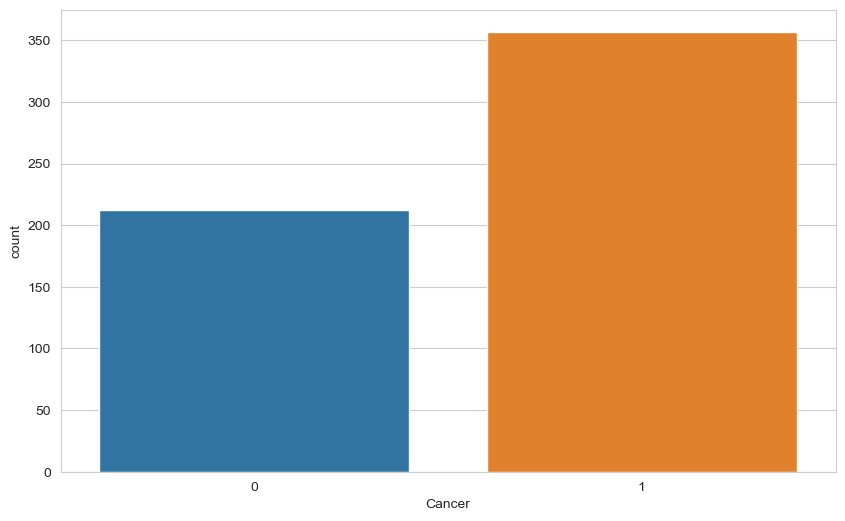

In [16]:
sns.countplot(df["Cancer"])

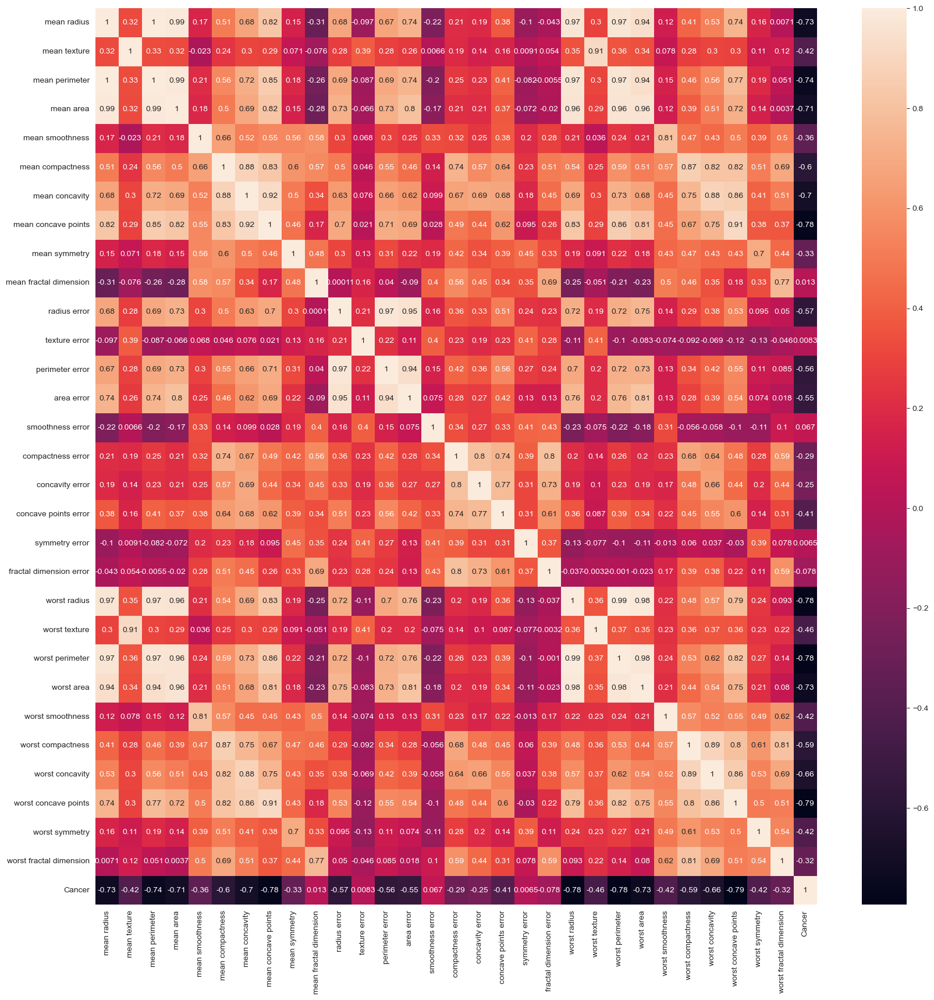

In [17]:
plt.figure(figsize=(20,20))
sns.heatmap(df.corr(), annot=True);

In [18]:
drop_list = ["worst perimeter", "worst area", "perimeter error", "area error", "mean perimeter", "mean area"]

In [19]:
df=df.drop(drop_list, axis=1)

In [20]:
df.shape

(569, 25)

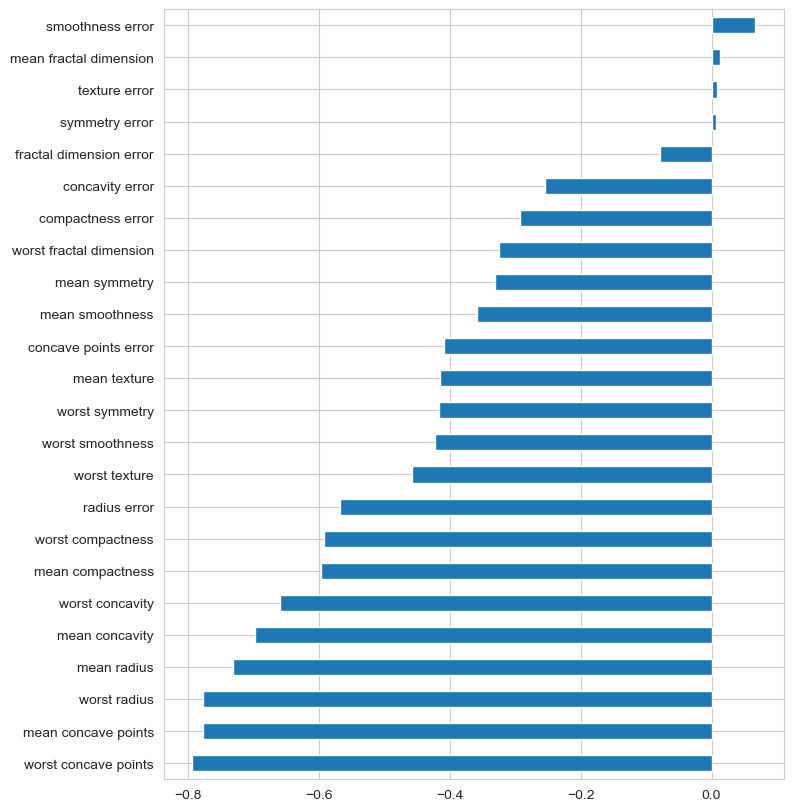

In [21]:
plt.figure(figsize = (8,10))
df.corr()['Cancer'].sort_values().drop("Cancer").plot(kind = "barh");

## Preprocessing of Data
- Train | Test Split, Scalling

In [22]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

In [23]:
X = df.drop('Cancer', axis=1)
y = df['Cancer']

In [24]:
seed = 42

In [25]:
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify = y, test_size = 0.10, random_state = seed)

In [26]:
scaler = MinMaxScaler()

In [27]:
X_train= scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

## Modelling & Model Performance

In [28]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import plot_roc_curve, roc_auc_score, roc_curve
from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.model_selection import GridSearchCV

In [29]:
X_train.shape

(512, 24)

In [30]:
X_test.shape

(57, 24)

In [31]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(36, activation = "relu", input_dim = X_train.shape[1]))
model.add(Dense(18, activation = "relu"))
model.add(Dense(9, activation = "relu"))
model.add(Dense(1, activation = "sigmoid"))

model.compile(optimizer = "adam", loss = "binary_crossentropy", metrics = ["accuracy"])

2022-10-03 18:07:07.399312: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [32]:
model.fit(x = X_train, y = y_train, validation_split = 0.1, batch_size = 32, epochs = 1000, verbose=1)

Epoch 1/1000
15/15 [==============================] - 0s 8ms/step - loss: 0.6778 - accuracy: 0.7674 - val_loss: 0.6622 - val_accuracy: 0.9038
Epoch 2/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.6524 - accuracy: 0.8326 - val_loss: 0.6296 - val_accuracy: 0.9038
Epoch 3/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.6204 - accuracy: 0.8457 - val_loss: 0.5931 - val_accuracy: 0.9231
Epoch 4/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.5807 - accuracy: 0.8717 - val_loss: 0.5448 - val_accuracy: 0.9423
Epoch 5/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.5275 - accuracy: 0.8761 - val_loss: 0.4792 - val_accuracy: 0.9423
Epoch 6/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.4660 - accuracy: 0.8870 - val_loss: 0.4088 - val_accuracy: 0.9423
Epoch 7/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.4028 - accuracy: 0.8957 - val_loss: 0.3341 - val_accuracy: 0.9423
Epoch 

15/15 [==============================] - 0s 2ms/step - loss: 0.0565 - accuracy: 0.9826 - val_loss: 0.0402 - val_accuracy: 0.9808
Epoch 59/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0504 - accuracy: 0.9870 - val_loss: 0.0501 - val_accuracy: 0.9615
Epoch 60/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0489 - accuracy: 0.9848 - val_loss: 0.0486 - val_accuracy: 0.9615
Epoch 61/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0523 - accuracy: 0.9848 - val_loss: 0.0680 - val_accuracy: 0.9615
Epoch 62/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0557 - accuracy: 0.9848 - val_loss: 0.0320 - val_accuracy: 1.0000
Epoch 63/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0468 - accuracy: 0.9870 - val_loss: 0.0664 - val_accuracy: 0.9615
Epoch 64/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0538 - accuracy: 0.9848 - val_loss: 0.0317 - val_accuracy: 1.0000
Epoch 65/1000

15/15 [==============================] - 0s 2ms/step - loss: 0.0375 - accuracy: 0.9870 - val_loss: 0.0379 - val_accuracy: 0.9808
Epoch 116/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0382 - accuracy: 0.9870 - val_loss: 0.0369 - val_accuracy: 0.9808
Epoch 117/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0412 - accuracy: 0.9848 - val_loss: 0.0317 - val_accuracy: 0.9808
Epoch 118/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0373 - accuracy: 0.9870 - val_loss: 0.0423 - val_accuracy: 0.9808
Epoch 119/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0391 - accuracy: 0.9870 - val_loss: 0.0473 - val_accuracy: 0.9615
Epoch 120/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0400 - accuracy: 0.9848 - val_loss: 0.0348 - val_accuracy: 0.9808
Epoch 121/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0367 - accuracy: 0.9870 - val_loss: 0.0508 - val_accuracy: 0.9615
Epoch 1

Epoch 172/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0306 - accuracy: 0.9913 - val_loss: 0.0319 - val_accuracy: 0.9808
Epoch 173/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0338 - accuracy: 0.9848 - val_loss: 0.0231 - val_accuracy: 1.0000
Epoch 174/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0330 - accuracy: 0.9891 - val_loss: 0.0467 - val_accuracy: 0.9808
Epoch 175/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0307 - accuracy: 0.9891 - val_loss: 0.0291 - val_accuracy: 0.9808
Epoch 176/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0324 - accuracy: 0.9891 - val_loss: 0.0767 - val_accuracy: 0.9423
Epoch 177/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0418 - accuracy: 0.9848 - val_loss: 0.0357 - val_accuracy: 0.9808
Epoch 178/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0326 - accuracy: 0.9891 - val_loss: 0.0339 - val_accuracy:

Epoch 229/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0215 - accuracy: 0.9891 - val_loss: 0.0187 - val_accuracy: 1.0000
Epoch 230/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0246 - accuracy: 0.9913 - val_loss: 0.0366 - val_accuracy: 0.9808
Epoch 231/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0225 - accuracy: 0.9913 - val_loss: 0.0145 - val_accuracy: 1.0000
Epoch 232/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0291 - accuracy: 0.9870 - val_loss: 0.0197 - val_accuracy: 1.0000
Epoch 233/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0259 - accuracy: 0.9891 - val_loss: 0.0166 - val_accuracy: 1.0000
Epoch 234/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0313 - accuracy: 0.9891 - val_loss: 0.0479 - val_accuracy: 0.9808
Epoch 235/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0226 - accuracy: 0.9913 - val_loss: 0.0206 - val_accuracy:

Epoch 286/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0155 - accuracy: 0.9935 - val_loss: 0.0274 - val_accuracy: 0.9808
Epoch 287/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0172 - accuracy: 0.9935 - val_loss: 0.0225 - val_accuracy: 1.0000
Epoch 288/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0149 - accuracy: 0.9913 - val_loss: 0.0270 - val_accuracy: 0.9808
Epoch 289/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0151 - accuracy: 0.9935 - val_loss: 0.0201 - val_accuracy: 1.0000
Epoch 290/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0154 - accuracy: 0.9913 - val_loss: 0.0198 - val_accuracy: 1.0000
Epoch 291/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0155 - accuracy: 0.9935 - val_loss: 0.0217 - val_accuracy: 1.0000
Epoch 292/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0148 - accuracy: 0.9935 - val_loss: 0.0284 - val_accuracy:

Epoch 343/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0173 - accuracy: 0.9913 - val_loss: 0.0178 - val_accuracy: 1.0000
Epoch 344/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0118 - accuracy: 0.9978 - val_loss: 0.0310 - val_accuracy: 0.9808
Epoch 345/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0160 - accuracy: 0.9935 - val_loss: 0.0313 - val_accuracy: 0.9808
Epoch 346/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0170 - accuracy: 0.9891 - val_loss: 0.0207 - val_accuracy: 0.9808
Epoch 347/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0109 - accuracy: 0.9957 - val_loss: 0.0556 - val_accuracy: 0.9615
Epoch 348/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0238 - accuracy: 0.9870 - val_loss: 0.0176 - val_accuracy: 1.0000
Epoch 349/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0130 - accuracy: 0.9957 - val_loss: 0.0183 - val_accuracy:

Epoch 400/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0132 - accuracy: 0.9935 - val_loss: 0.0232 - val_accuracy: 0.9808
Epoch 401/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0113 - accuracy: 0.9957 - val_loss: 0.0288 - val_accuracy: 0.9808
Epoch 402/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0150 - accuracy: 0.9957 - val_loss: 0.0209 - val_accuracy: 1.0000
Epoch 403/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0097 - accuracy: 0.9957 - val_loss: 0.0278 - val_accuracy: 0.9808
Epoch 404/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0072 - accuracy: 1.0000 - val_loss: 0.0227 - val_accuracy: 0.9808
Epoch 405/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0165 - accuracy: 0.9913 - val_loss: 0.0493 - val_accuracy: 0.9808
Epoch 406/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0141 - accuracy: 0.9957 - val_loss: 0.0241 - val_accuracy:

Epoch 457/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0053 - accuracy: 1.0000 - val_loss: 0.0224 - val_accuracy: 1.0000
Epoch 458/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0062 - accuracy: 0.9978 - val_loss: 0.0248 - val_accuracy: 0.9808
Epoch 459/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0073 - accuracy: 1.0000 - val_loss: 0.0286 - val_accuracy: 0.9808
Epoch 460/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0073 - accuracy: 0.9978 - val_loss: 0.0255 - val_accuracy: 1.0000
Epoch 461/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0052 - accuracy: 1.0000 - val_loss: 0.0255 - val_accuracy: 0.9808
Epoch 462/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0053 - accuracy: 1.0000 - val_loss: 0.0246 - val_accuracy: 0.9808
Epoch 463/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0069 - accuracy: 0.9978 - val_loss: 0.0237 - val_accuracy:

Epoch 514/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0116 - accuracy: 0.9957 - val_loss: 0.0427 - val_accuracy: 0.9808
Epoch 515/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0104 - accuracy: 0.9978 - val_loss: 0.0302 - val_accuracy: 0.9808
Epoch 516/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0088 - accuracy: 0.9957 - val_loss: 0.0372 - val_accuracy: 0.9808
Epoch 517/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000 - val_loss: 0.0295 - val_accuracy: 0.9808
Epoch 518/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0044 - accuracy: 0.9978 - val_loss: 0.0371 - val_accuracy: 0.9808
Epoch 519/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0081 - accuracy: 0.9957 - val_loss: 0.0295 - val_accuracy: 0.9808
Epoch 520/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0054 - accuracy: 0.9978 - val_loss: 0.0368 - val_accuracy:

Epoch 571/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000 - val_loss: 0.0471 - val_accuracy: 0.9615
Epoch 572/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0024 - accuracy: 1.0000 - val_loss: 0.0429 - val_accuracy: 0.9615
Epoch 573/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000 - val_loss: 0.0431 - val_accuracy: 0.9615
Epoch 574/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000 - val_loss: 0.0441 - val_accuracy: 0.9615
Epoch 575/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000 - val_loss: 0.0412 - val_accuracy: 0.9615
Epoch 576/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000 - val_loss: 0.0402 - val_accuracy: 0.9808
Epoch 577/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0024 - accuracy: 1.0000 - val_loss: 0.0362 - val_accuracy:

Epoch 628/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0315 - accuracy: 0.9870 - val_loss: 0.2411 - val_accuracy: 0.9615
Epoch 629/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1203 - accuracy: 0.9739 - val_loss: 0.1656 - val_accuracy: 0.9615
Epoch 630/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0307 - accuracy: 0.9870 - val_loss: 0.0041 - val_accuracy: 1.0000
Epoch 631/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0051 - accuracy: 0.9978 - val_loss: 0.0057 - val_accuracy: 1.0000
Epoch 632/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0066 - accuracy: 1.0000 - val_loss: 0.0150 - val_accuracy: 1.0000
Epoch 633/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0099 - accuracy: 0.9957 - val_loss: 0.0507 - val_accuracy: 0.9808
Epoch 634/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0311 - accuracy: 0.9935 - val_loss: 0.0649 - val_accuracy:

Epoch 685/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 0.0516 - val_accuracy: 0.9808
Epoch 686/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 0.0513 - val_accuracy: 0.9808
Epoch 687/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 0.0491 - val_accuracy: 0.9808
Epoch 688/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000 - val_loss: 0.0484 - val_accuracy: 0.9808
Epoch 689/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000 - val_loss: 0.0484 - val_accuracy: 0.9808
Epoch 690/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 0.0514 - val_accuracy: 0.9808
Epoch 691/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 0.0458 - val_accuracy:

Epoch 741/1000
15/15 [==============================] - 0s 2ms/step - loss: 7.3787e-04 - accuracy: 1.0000 - val_loss: 0.0547 - val_accuracy: 0.9808
Epoch 742/1000
15/15 [==============================] - 0s 2ms/step - loss: 9.8718e-04 - accuracy: 1.0000 - val_loss: 0.0519 - val_accuracy: 0.9808
Epoch 743/1000
15/15 [==============================] - 0s 2ms/step - loss: 7.2763e-04 - accuracy: 1.0000 - val_loss: 0.0663 - val_accuracy: 0.9808
Epoch 744/1000
15/15 [==============================] - 0s 2ms/step - loss: 9.8557e-04 - accuracy: 1.0000 - val_loss: 0.0469 - val_accuracy: 0.9808
Epoch 745/1000
15/15 [==============================] - 0s 2ms/step - loss: 8.8763e-04 - accuracy: 1.0000 - val_loss: 0.0622 - val_accuracy: 0.9808
Epoch 746/1000
15/15 [==============================] - 0s 2ms/step - loss: 8.0925e-04 - accuracy: 1.0000 - val_loss: 0.0524 - val_accuracy: 0.9808
Epoch 747/1000
15/15 [==============================] - 0s 2ms/step - loss: 8.7077e-04 - accuracy: 1.0000 - val_

15/15 [==============================] - 0s 2ms/step - loss: 8.0005e-04 - accuracy: 1.0000 - val_loss: 0.0583 - val_accuracy: 0.9808
Epoch 797/1000
15/15 [==============================] - 0s 2ms/step - loss: 4.9637e-04 - accuracy: 1.0000 - val_loss: 0.0580 - val_accuracy: 0.9808
Epoch 798/1000
15/15 [==============================] - 0s 2ms/step - loss: 6.6782e-04 - accuracy: 1.0000 - val_loss: 0.0579 - val_accuracy: 0.9808
Epoch 799/1000
15/15 [==============================] - 0s 2ms/step - loss: 7.0372e-04 - accuracy: 1.0000 - val_loss: 0.0671 - val_accuracy: 0.9808
Epoch 800/1000
15/15 [==============================] - 0s 2ms/step - loss: 6.5566e-04 - accuracy: 1.0000 - val_loss: 0.0456 - val_accuracy: 0.9615
Epoch 801/1000
15/15 [==============================] - 0s 2ms/step - loss: 7.3494e-04 - accuracy: 1.0000 - val_loss: 0.0653 - val_accuracy: 0.9808
Epoch 802/1000
15/15 [==============================] - 0s 2ms/step - loss: 5.0051e-04 - accuracy: 1.0000 - val_loss: 0.0551 - 

15/15 [==============================] - 0s 2ms/step - loss: 2.8167e-04 - accuracy: 1.0000 - val_loss: 0.0664 - val_accuracy: 0.9808
Epoch 852/1000
15/15 [==============================] - 0s 2ms/step - loss: 3.9560e-04 - accuracy: 1.0000 - val_loss: 0.0869 - val_accuracy: 0.9808
Epoch 853/1000
15/15 [==============================] - 0s 2ms/step - loss: 5.8298e-04 - accuracy: 1.0000 - val_loss: 0.0647 - val_accuracy: 0.9615
Epoch 854/1000
15/15 [==============================] - 0s 2ms/step - loss: 7.2560e-04 - accuracy: 1.0000 - val_loss: 0.0459 - val_accuracy: 0.9615
Epoch 855/1000
15/15 [==============================] - 0s 2ms/step - loss: 8.6762e-04 - accuracy: 1.0000 - val_loss: 0.1285 - val_accuracy: 0.9615
Epoch 856/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0094 - accuracy: 0.9957 - val_loss: 0.1400 - val_accuracy: 0.9808
Epoch 857/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0213 - accuracy: 0.9957 - val_loss: 0.1233 - val_accu

15/15 [==============================] - 0s 2ms/step - loss: 1.8876e-04 - accuracy: 1.0000 - val_loss: 0.0720 - val_accuracy: 0.9615
Epoch 907/1000
15/15 [==============================] - 0s 2ms/step - loss: 1.9287e-04 - accuracy: 1.0000 - val_loss: 0.0704 - val_accuracy: 0.9615
Epoch 908/1000
15/15 [==============================] - 0s 2ms/step - loss: 1.9371e-04 - accuracy: 1.0000 - val_loss: 0.0764 - val_accuracy: 0.9808
Epoch 909/1000
15/15 [==============================] - 0s 2ms/step - loss: 1.9470e-04 - accuracy: 1.0000 - val_loss: 0.0741 - val_accuracy: 0.9808
Epoch 910/1000
15/15 [==============================] - 0s 2ms/step - loss: 1.7788e-04 - accuracy: 1.0000 - val_loss: 0.0713 - val_accuracy: 0.9615
Epoch 911/1000
15/15 [==============================] - 0s 2ms/step - loss: 1.9000e-04 - accuracy: 1.0000 - val_loss: 0.0737 - val_accuracy: 0.9808
Epoch 912/1000
15/15 [==============================] - 0s 2ms/step - loss: 1.9001e-04 - accuracy: 1.0000 - val_loss: 0.0745 - 

15/15 [==============================] - 0s 2ms/step - loss: 1.3631e-04 - accuracy: 1.0000 - val_loss: 0.0729 - val_accuracy: 0.9615
Epoch 962/1000
15/15 [==============================] - 0s 2ms/step - loss: 1.3432e-04 - accuracy: 1.0000 - val_loss: 0.0778 - val_accuracy: 0.9808
Epoch 963/1000
15/15 [==============================] - 0s 2ms/step - loss: 1.4355e-04 - accuracy: 1.0000 - val_loss: 0.0763 - val_accuracy: 0.9808
Epoch 964/1000
15/15 [==============================] - 0s 2ms/step - loss: 1.3715e-04 - accuracy: 1.0000 - val_loss: 0.0754 - val_accuracy: 0.9808
Epoch 965/1000
15/15 [==============================] - 0s 2ms/step - loss: 1.3166e-04 - accuracy: 1.0000 - val_loss: 0.0711 - val_accuracy: 0.9808
Epoch 966/1000
15/15 [==============================] - 0s 2ms/step - loss: 1.2810e-04 - accuracy: 1.0000 - val_loss: 0.0735 - val_accuracy: 0.9808
Epoch 967/1000
15/15 [==============================] - 0s 2ms/step - loss: 1.2159e-04 - accuracy: 1.0000 - val_loss: 0.0735 - 

In [33]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 36)                900       
                                                                 
 dense_1 (Dense)             (None, 18)                666       
                                                                 
 dense_2 (Dense)             (None, 9)                 171       
                                                                 
 dense_3 (Dense)             (None, 1)                 10        
                                                                 
Total params: 1,747
Trainable params: 1,747
Non-trainable params: 0
_________________________________________________________________


In [34]:
loss_df = pd.DataFrame(model.history.history)
loss_df.head()

,loss,accuracy,val_loss,val_accuracy
0,0.678,0.767,0.662,0.904
1,0.652,0.833,0.630,0.904
2,0.620,0.846,0.593,0.923
3,0.581,0.872,0.545,0.942
4,0.528,0.876,0.479,0.942


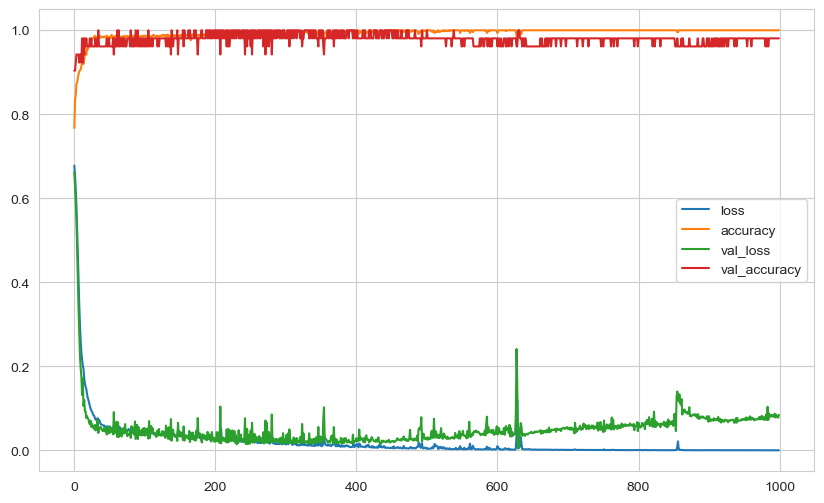

In [35]:
loss_df.plot();

In [36]:
model.evaluate(X_test, y_test, verbose=0)

[0.884244441986084, 0.8947368264198303]

In [37]:
loss, accuracy = model.evaluate(X_test, y_test, verbose=0)
print("loss : ", loss)
print("accuracy : ", accuracy)

loss :  0.884244441986084
accuracy :  0.8947368264198303


In [38]:
y_pred = model.predict(X_test) > 0.5
#y_pred = model.predict_classes(X_test) for tf 2.5.0
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

2/2 [==============================] - 0s 1ms/step
[[19  2]
 [ 4 32]]
              precision    recall  f1-score   support

           0       0.83      0.90      0.86        21
           1       0.94      0.89      0.91        36

    accuracy                           0.89        57
   macro avg       0.88      0.90      0.89        57
weighted avg       0.90      0.89      0.90        57



### EarlyStopping

In [39]:
from tensorflow.keras.callbacks import EarlyStopping

In [40]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(36, activation = "relu", input_dim = X_train.shape[1]))
model.add(Dense(18, activation = "relu"))
model.add(Dense(9, activation = "relu"))
model.add(Dense(1, activation = "sigmoid"))

model.compile(optimizer = "adam", loss = "binary_crossentropy", metrics = ["accuracy"])

In [41]:
#The patience is often set somewhere between 10 and 100 (10 or 25 is more common), 
#but it really depends on your dataset and network.

In [42]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "min", verbose = 1, patience = 15, restore_best_weights = True)

In [43]:
model.fit(x = X_train, y = y_train, validation_split = 0.1, batch_size = 32, epochs = 1000, verbose = 1,
          callbacks = [early_stop])

Epoch 1/1000
15/15 [==============================] - 0s 7ms/step - loss: 0.6778 - accuracy: 0.7674 - val_loss: 0.6622 - val_accuracy: 0.9038
Epoch 2/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.6524 - accuracy: 0.8326 - val_loss: 0.6296 - val_accuracy: 0.9038
Epoch 3/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.6204 - accuracy: 0.8457 - val_loss: 0.5931 - val_accuracy: 0.9231
Epoch 4/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.5807 - accuracy: 0.8717 - val_loss: 0.5448 - val_accuracy: 0.9423
Epoch 5/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.5275 - accuracy: 0.8761 - val_loss: 0.4792 - val_accuracy: 0.9423
Epoch 6/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.4660 - accuracy: 0.8870 - val_loss: 0.4088 - val_accuracy: 0.9423
Epoch 7/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.4028 - accuracy: 0.8957 - val_loss: 0.3341 - val_accuracy: 0.9423
Epoch 

15/15 [==============================] - 0s 2ms/step - loss: 0.0565 - accuracy: 0.9826 - val_loss: 0.0402 - val_accuracy: 0.9808
Epoch 59/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0504 - accuracy: 0.9870 - val_loss: 0.0501 - val_accuracy: 0.9615
Epoch 60/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0489 - accuracy: 0.9848 - val_loss: 0.0486 - val_accuracy: 0.9615
Epoch 61/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0523 - accuracy: 0.9848 - val_loss: 0.0680 - val_accuracy: 0.9615
Epoch 62/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0557 - accuracy: 0.9848 - val_loss: 0.0320 - val_accuracy: 1.0000
Epoch 63/1000
15/15 [==============================] - 0s 3ms/step - loss: 0.0468 - accuracy: 0.9870 - val_loss: 0.0664 - val_accuracy: 0.9615
Epoch 64/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0538 - accuracy: 0.9848 - val_loss: 0.0317 - val_accuracy: 1.0000
Epoch 65/1000

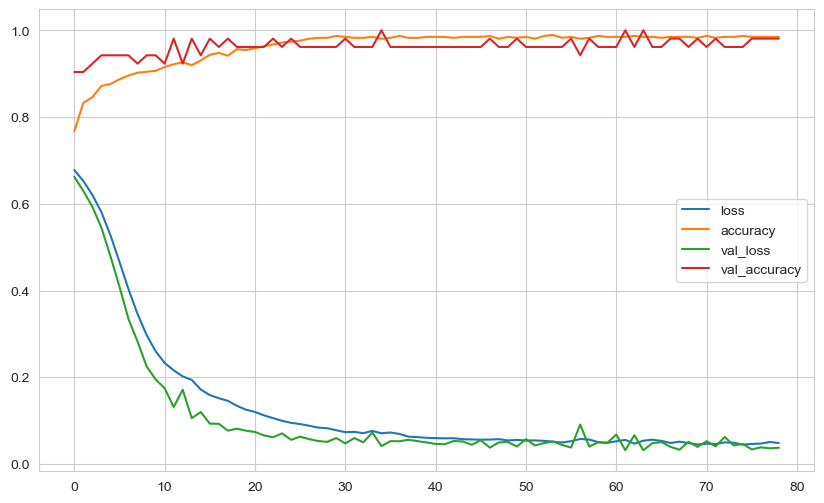

In [44]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot();

In [45]:
loss, accuracy = model.evaluate(X_test, y_test, verbose=0)
print("loss : ", loss)
print("accuracy : ", accuracy)

loss :  0.12801724672317505
accuracy :  0.9473684430122375


In [46]:
y_pred = model.predict(X_test) > 0.5
#y_pred = model.predict_classes(X_test) for tf 2.5.0
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

2/2 [==============================] - 0s 1ms/step
[[20  1]
 [ 2 34]]
              precision    recall  f1-score   support

           0       0.91      0.95      0.93        21
           1       0.97      0.94      0.96        36

    accuracy                           0.95        57
   macro avg       0.94      0.95      0.94        57
weighted avg       0.95      0.95      0.95        57



### learning_rate

In [47]:
from tensorflow.keras.optimizers import Adam

In [48]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(36, activation = "relu", input_dim = X_train.shape[1]))
model.add(Dense(18, activation = "relu"))
model.add(Dense(9, activation = "relu"))
model.add(Dense(1, activation = "sigmoid"))

opt = Adam(lr = 0.005)
model.compile(optimizer = opt, loss = "binary_crossentropy", metrics = ["accuracy"])

In [49]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "min", verbose = 1, patience = 15, restore_best_weights = True)

In [50]:
model.fit(x = X_train, y = y_train, validation_split = 0.1, batch_size = 32, epochs = 1000, verbose = 1,
          callbacks = [early_stop])

Epoch 1/1000
15/15 [==============================] - 0s 7ms/step - loss: 0.6293 - accuracy: 0.8022 - val_loss: 0.5245 - val_accuracy: 0.9231
Epoch 2/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.4337 - accuracy: 0.8978 - val_loss: 0.2717 - val_accuracy: 0.9231
Epoch 3/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.2418 - accuracy: 0.9174 - val_loss: 0.1158 - val_accuracy: 0.9615
Epoch 4/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1680 - accuracy: 0.9196 - val_loss: 0.0763 - val_accuracy: 0.9808
Epoch 5/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1679 - accuracy: 0.9304 - val_loss: 0.0586 - val_accuracy: 1.0000
Epoch 6/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1149 - accuracy: 0.9565 - val_loss: 0.0484 - val_accuracy: 1.0000
Epoch 7/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1077 - accuracy: 0.9630 - val_loss: 0.0625 - val_accuracy: 0.9615
Epoch 

<AxesSubplot:>

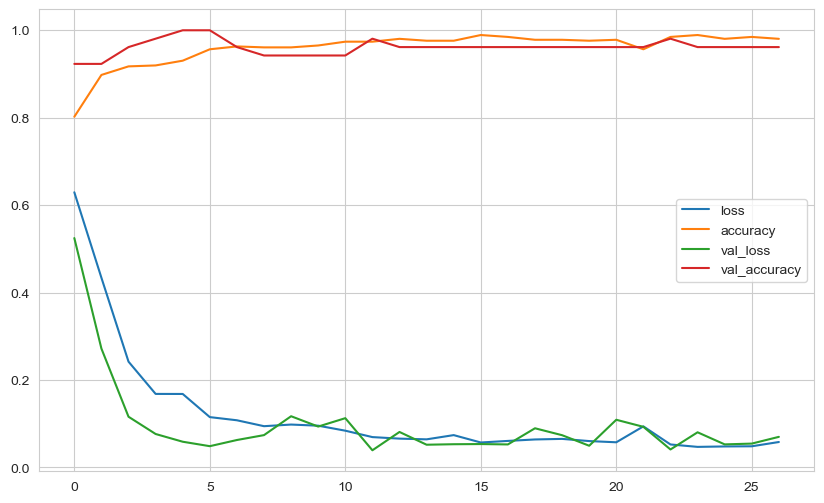

In [51]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [52]:
loss, accuracy = model.evaluate(X_test, y_test, verbose=0)
print("loss : ", loss)
print("accuracy : ", accuracy)

loss :  0.12057708948850632
accuracy :  0.9473684430122375


loss :  0.12057707458734512
accuracy :  0.9473684430122375

In [53]:
y_pred = model.predict(X_test) > 0.5
#y_pred = model.predict_classes(X_test) for tf 2.5.0
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

2/2 [==============================] - 0s 2ms/step
[[20  1]
 [ 2 34]]
              precision    recall  f1-score   support

           0       0.91      0.95      0.93        21
           1       0.97      0.94      0.96        36

    accuracy                           0.95        57
   macro avg       0.94      0.95      0.94        57
weighted avg       0.95      0.95      0.95        57



### Dropout

The Dropout layer randomly sets input units to 0 with a frequency of `rate`
at each step during training time, which helps prevent overfitting.

In [54]:
from tensorflow.keras.layers import Dropout

In [55]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(36, activation="relu", input_dim = X_train.shape[1]))
model.add(Dropout(0.5))

model.add(Dense(18, activation="relu"))
model.add(Dropout(0.5))

model.add(Dense(9, activation="relu"))
model.add(Dropout(0.5))

model.add(Dense(1, activation="sigmoid"))

opt = Adam(lr = 0.001)
model.compile(optimizer = opt, loss = "binary_crossentropy", metrics = ["accuracy"])

In [56]:
model.fit(x = X_train, y = y_train, validation_split = 0.1, batch_size = 32, epochs = 1000, verbose = 1)

Epoch 1/1000
15/15 [==============================] - 0s 7ms/step - loss: 0.7003 - accuracy: 0.4913 - val_loss: 0.6870 - val_accuracy: 0.5962
Epoch 2/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.6879 - accuracy: 0.6043 - val_loss: 0.6850 - val_accuracy: 0.5385
Epoch 3/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.6766 - accuracy: 0.6217 - val_loss: 0.6816 - val_accuracy: 0.5385
Epoch 4/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.6696 - accuracy: 0.6543 - val_loss: 0.6743 - val_accuracy: 0.5385
Epoch 5/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.6729 - accuracy: 0.6500 - val_loss: 0.6635 - val_accuracy: 0.6154
Epoch 6/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.6604 - accuracy: 0.6848 - val_loss: 0.6502 - val_accuracy: 0.6538
Epoch 7/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.6462 - accuracy: 0.7174 - val_loss: 0.6271 - val_accuracy: 0.8654
Epoch 

15/15 [==============================] - 0s 2ms/step - loss: 0.1958 - accuracy: 0.9348 - val_loss: 0.0575 - val_accuracy: 0.9615
Epoch 59/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1902 - accuracy: 0.9413 - val_loss: 0.0297 - val_accuracy: 1.0000
Epoch 60/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1890 - accuracy: 0.9283 - val_loss: 0.0373 - val_accuracy: 1.0000
Epoch 61/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1863 - accuracy: 0.9304 - val_loss: 0.0357 - val_accuracy: 1.0000
Epoch 62/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1717 - accuracy: 0.9522 - val_loss: 0.0465 - val_accuracy: 0.9808
Epoch 63/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1941 - accuracy: 0.9391 - val_loss: 0.0309 - val_accuracy: 1.0000
Epoch 64/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1852 - accuracy: 0.9391 - val_loss: 0.0403 - val_accuracy: 0.9808
Epoch 65/1000

15/15 [==============================] - 0s 2ms/step - loss: 0.1335 - accuracy: 0.9500 - val_loss: 0.0374 - val_accuracy: 0.9808
Epoch 116/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1351 - accuracy: 0.9696 - val_loss: 0.0297 - val_accuracy: 0.9808
Epoch 117/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1540 - accuracy: 0.9609 - val_loss: 0.0202 - val_accuracy: 1.0000
Epoch 118/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1101 - accuracy: 0.9696 - val_loss: 0.0200 - val_accuracy: 1.0000
Epoch 119/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1224 - accuracy: 0.9630 - val_loss: 0.0212 - val_accuracy: 1.0000
Epoch 120/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1101 - accuracy: 0.9739 - val_loss: 0.0332 - val_accuracy: 0.9808
Epoch 121/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1059 - accuracy: 0.9739 - val_loss: 0.0393 - val_accuracy: 0.9615
Epoch 1

Epoch 172/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0734 - accuracy: 0.9783 - val_loss: 0.0147 - val_accuracy: 1.0000
Epoch 173/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1284 - accuracy: 0.9609 - val_loss: 0.0245 - val_accuracy: 1.0000
Epoch 174/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1065 - accuracy: 0.9674 - val_loss: 0.0104 - val_accuracy: 1.0000
Epoch 175/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0911 - accuracy: 0.9717 - val_loss: 0.0313 - val_accuracy: 0.9808
Epoch 176/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1113 - accuracy: 0.9630 - val_loss: 0.0097 - val_accuracy: 1.0000
Epoch 177/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1264 - accuracy: 0.9652 - val_loss: 0.0070 - val_accuracy: 1.0000
Epoch 178/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1088 - accuracy: 0.9609 - val_loss: 0.0143 - val_accuracy:

Epoch 229/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0869 - accuracy: 0.9848 - val_loss: 0.0066 - val_accuracy: 1.0000
Epoch 230/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0737 - accuracy: 0.9761 - val_loss: 0.0077 - val_accuracy: 1.0000
Epoch 231/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0848 - accuracy: 0.9696 - val_loss: 0.0078 - val_accuracy: 1.0000
Epoch 232/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0674 - accuracy: 0.9717 - val_loss: 0.0051 - val_accuracy: 1.0000
Epoch 233/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0978 - accuracy: 0.9717 - val_loss: 0.0057 - val_accuracy: 1.0000
Epoch 234/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1066 - accuracy: 0.9630 - val_loss: 0.0120 - val_accuracy: 1.0000
Epoch 235/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0688 - accuracy: 0.9739 - val_loss: 0.0067 - val_accuracy:

Epoch 286/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0791 - accuracy: 0.9652 - val_loss: 0.0117 - val_accuracy: 1.0000
Epoch 287/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0791 - accuracy: 0.9761 - val_loss: 0.0084 - val_accuracy: 1.0000
Epoch 288/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0682 - accuracy: 0.9761 - val_loss: 0.0159 - val_accuracy: 1.0000
Epoch 289/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0672 - accuracy: 0.9761 - val_loss: 0.0083 - val_accuracy: 1.0000
Epoch 290/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0806 - accuracy: 0.9761 - val_loss: 0.0085 - val_accuracy: 1.0000
Epoch 291/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0851 - accuracy: 0.9717 - val_loss: 0.0083 - val_accuracy: 1.0000
Epoch 292/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1049 - accuracy: 0.9630 - val_loss: 0.0068 - val_accuracy:

Epoch 343/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0843 - accuracy: 0.9696 - val_loss: 0.0040 - val_accuracy: 1.0000
Epoch 344/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0851 - accuracy: 0.9674 - val_loss: 0.0069 - val_accuracy: 1.0000
Epoch 345/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0596 - accuracy: 0.9891 - val_loss: 0.0092 - val_accuracy: 1.0000
Epoch 346/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0732 - accuracy: 0.9761 - val_loss: 0.0056 - val_accuracy: 1.0000
Epoch 347/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0524 - accuracy: 0.9913 - val_loss: 0.0029 - val_accuracy: 1.0000
Epoch 348/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0650 - accuracy: 0.9761 - val_loss: 0.0036 - val_accuracy: 1.0000
Epoch 349/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0712 - accuracy: 0.9717 - val_loss: 0.0087 - val_accuracy:

Epoch 400/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1039 - accuracy: 0.9717 - val_loss: 0.0195 - val_accuracy: 1.0000
Epoch 401/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0810 - accuracy: 0.9717 - val_loss: 0.0095 - val_accuracy: 1.0000
Epoch 402/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0712 - accuracy: 0.9739 - val_loss: 0.0103 - val_accuracy: 1.0000
Epoch 403/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0848 - accuracy: 0.9630 - val_loss: 0.0054 - val_accuracy: 1.0000
Epoch 404/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0839 - accuracy: 0.9696 - val_loss: 0.0049 - val_accuracy: 1.0000
Epoch 405/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0664 - accuracy: 0.9717 - val_loss: 0.0034 - val_accuracy: 1.0000
Epoch 406/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0634 - accuracy: 0.9761 - val_loss: 0.0052 - val_accuracy:

Epoch 457/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0623 - accuracy: 0.9761 - val_loss: 0.0223 - val_accuracy: 0.9808
Epoch 458/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0768 - accuracy: 0.9652 - val_loss: 0.0025 - val_accuracy: 1.0000
Epoch 459/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0670 - accuracy: 0.9826 - val_loss: 0.0016 - val_accuracy: 1.0000
Epoch 460/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0991 - accuracy: 0.9630 - val_loss: 0.0023 - val_accuracy: 1.0000
Epoch 461/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0757 - accuracy: 0.9739 - val_loss: 0.0034 - val_accuracy: 1.0000
Epoch 462/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0632 - accuracy: 0.9783 - val_loss: 0.0074 - val_accuracy: 1.0000
Epoch 463/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0633 - accuracy: 0.9826 - val_loss: 0.0049 - val_accuracy:

Epoch 514/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0665 - accuracy: 0.9739 - val_loss: 0.0025 - val_accuracy: 1.0000
Epoch 515/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0605 - accuracy: 0.9848 - val_loss: 0.0034 - val_accuracy: 1.0000
Epoch 516/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0520 - accuracy: 0.9848 - val_loss: 0.0028 - val_accuracy: 1.0000
Epoch 517/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0582 - accuracy: 0.9826 - val_loss: 0.0010 - val_accuracy: 1.0000
Epoch 518/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1029 - accuracy: 0.9652 - val_loss: 9.6186e-04 - val_accuracy: 1.0000
Epoch 519/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0879 - accuracy: 0.9630 - val_loss: 0.0027 - val_accuracy: 1.0000
Epoch 520/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0669 - accuracy: 0.9739 - val_loss: 0.0025 - val_accur

15/15 [==============================] - 0s 2ms/step - loss: 0.0568 - accuracy: 0.9761 - val_loss: 0.0012 - val_accuracy: 1.0000
Epoch 571/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0566 - accuracy: 0.9761 - val_loss: 0.0021 - val_accuracy: 1.0000
Epoch 572/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0507 - accuracy: 0.9804 - val_loss: 9.8353e-04 - val_accuracy: 1.0000
Epoch 573/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0641 - accuracy: 0.9783 - val_loss: 6.2572e-04 - val_accuracy: 1.0000
Epoch 574/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0692 - accuracy: 0.9696 - val_loss: 0.0018 - val_accuracy: 1.0000
Epoch 575/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0672 - accuracy: 0.9739 - val_loss: 0.0025 - val_accuracy: 1.0000
Epoch 576/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0495 - accuracy: 0.9826 - val_loss: 5.2976e-04 - val_accuracy: 1.

15/15 [==============================] - 0s 2ms/step - loss: 0.0514 - accuracy: 0.9761 - val_loss: 0.0018 - val_accuracy: 1.0000
Epoch 627/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0752 - accuracy: 0.9739 - val_loss: 0.0017 - val_accuracy: 1.0000
Epoch 628/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0680 - accuracy: 0.9739 - val_loss: 0.0016 - val_accuracy: 1.0000
Epoch 629/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0685 - accuracy: 0.9696 - val_loss: 6.2375e-04 - val_accuracy: 1.0000
Epoch 630/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0513 - accuracy: 0.9826 - val_loss: 0.0025 - val_accuracy: 1.0000
Epoch 631/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0859 - accuracy: 0.9717 - val_loss: 0.0037 - val_accuracy: 1.0000
Epoch 632/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0555 - accuracy: 0.9848 - val_loss: 0.0033 - val_accuracy: 1.0000
Epo

15/15 [==============================] - 0s 2ms/step - loss: 0.0543 - accuracy: 0.9826 - val_loss: 0.0019 - val_accuracy: 1.0000
Epoch 683/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0458 - accuracy: 0.9848 - val_loss: 0.0019 - val_accuracy: 1.0000
Epoch 684/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0736 - accuracy: 0.9761 - val_loss: 0.0020 - val_accuracy: 1.0000
Epoch 685/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0629 - accuracy: 0.9761 - val_loss: 0.0013 - val_accuracy: 1.0000
Epoch 686/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0415 - accuracy: 0.9870 - val_loss: 0.0011 - val_accuracy: 1.0000
Epoch 687/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0590 - accuracy: 0.9739 - val_loss: 0.0013 - val_accuracy: 1.0000
Epoch 688/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0652 - accuracy: 0.9717 - val_loss: 8.3929e-04 - val_accuracy: 1.0000
Epo

Epoch 738/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0630 - accuracy: 0.9717 - val_loss: 5.1899e-04 - val_accuracy: 1.0000
Epoch 739/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0689 - accuracy: 0.9761 - val_loss: 6.0523e-04 - val_accuracy: 1.0000
Epoch 740/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0521 - accuracy: 0.9826 - val_loss: 7.0481e-04 - val_accuracy: 1.0000
Epoch 741/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0494 - accuracy: 0.9826 - val_loss: 4.7410e-04 - val_accuracy: 1.0000
Epoch 742/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0505 - accuracy: 0.9826 - val_loss: 1.2025e-04 - val_accuracy: 1.0000
Epoch 743/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0587 - accuracy: 0.9870 - val_loss: 2.9960e-04 - val_accuracy: 1.0000
Epoch 744/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0573 - accuracy: 0.9804 - val_loss

15/15 [==============================] - 0s 2ms/step - loss: 0.0533 - accuracy: 0.9783 - val_loss: 8.9433e-04 - val_accuracy: 1.0000
Epoch 794/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0513 - accuracy: 0.9804 - val_loss: 3.6946e-04 - val_accuracy: 1.0000
Epoch 795/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0424 - accuracy: 0.9870 - val_loss: 3.3102e-04 - val_accuracy: 1.0000
Epoch 796/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0521 - accuracy: 0.9826 - val_loss: 1.5556e-04 - val_accuracy: 1.0000
Epoch 797/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0484 - accuracy: 0.9804 - val_loss: 3.5549e-04 - val_accuracy: 1.0000
Epoch 798/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0514 - accuracy: 0.9804 - val_loss: 2.7633e-04 - val_accuracy: 1.0000
Epoch 799/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0362 - accuracy: 0.9891 - val_loss: 1.9780e-04 - 

15/15 [==============================] - 0s 2ms/step - loss: 0.1014 - accuracy: 0.9652 - val_loss: 0.0012 - val_accuracy: 1.0000
Epoch 850/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1088 - accuracy: 0.9543 - val_loss: 0.0061 - val_accuracy: 1.0000
Epoch 851/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0691 - accuracy: 0.9783 - val_loss: 9.0731e-04 - val_accuracy: 1.0000
Epoch 852/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0786 - accuracy: 0.9674 - val_loss: 0.0041 - val_accuracy: 1.0000
Epoch 853/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0742 - accuracy: 0.9674 - val_loss: 0.0015 - val_accuracy: 1.0000
Epoch 854/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0602 - accuracy: 0.9804 - val_loss: 6.9370e-04 - val_accuracy: 1.0000
Epoch 855/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0463 - accuracy: 0.9826 - val_loss: 4.9826e-04 - val_accuracy: 1.

15/15 [==============================] - 0s 2ms/step - loss: 0.0600 - accuracy: 0.9717 - val_loss: 8.0174e-05 - val_accuracy: 1.0000
Epoch 905/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0428 - accuracy: 0.9848 - val_loss: 4.8388e-05 - val_accuracy: 1.0000
Epoch 906/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0582 - accuracy: 0.9739 - val_loss: 6.7492e-05 - val_accuracy: 1.0000
Epoch 907/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0416 - accuracy: 0.9891 - val_loss: 1.0593e-04 - val_accuracy: 1.0000
Epoch 908/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0529 - accuracy: 0.9783 - val_loss: 9.6321e-05 - val_accuracy: 1.0000
Epoch 909/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0438 - accuracy: 0.9826 - val_loss: 8.8359e-05 - val_accuracy: 1.0000
Epoch 910/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0575 - accuracy: 0.9804 - val_loss: 1.7719e-04 - 

15/15 [==============================] - 0s 2ms/step - loss: 0.0834 - accuracy: 0.9652 - val_loss: 1.1850e-04 - val_accuracy: 1.0000
Epoch 960/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0656 - accuracy: 0.9739 - val_loss: 5.3204e-04 - val_accuracy: 1.0000
Epoch 961/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0531 - accuracy: 0.9804 - val_loss: 4.1105e-04 - val_accuracy: 1.0000
Epoch 962/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0394 - accuracy: 0.9870 - val_loss: 1.7865e-04 - val_accuracy: 1.0000
Epoch 963/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0670 - accuracy: 0.9783 - val_loss: 9.7906e-05 - val_accuracy: 1.0000
Epoch 964/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0691 - accuracy: 0.9717 - val_loss: 1.7016e-04 - val_accuracy: 1.0000
Epoch 965/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0543 - accuracy: 0.9804 - val_loss: 2.0288e-04 - 

<AxesSubplot:>

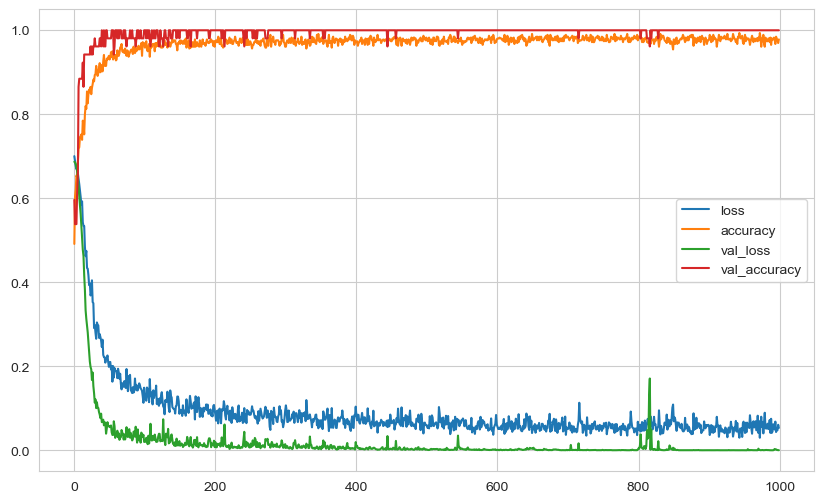

In [57]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [58]:
loss, accuracy = model.evaluate(X_test, y_test, verbose=0)
print("loss : ", loss)
print("accuracy : ", accuracy)

loss :  0.19224043190479279
accuracy :  0.9824561476707458


In [59]:
y_pred = model.predict(X_test) > 0.5
#y_pred = model.predict_classes(X_test) for tf 2.5.0
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

2/2 [==============================] - 0s 1ms/step
[[20  1]
 [ 0 36]]
              precision    recall  f1-score   support

           0       1.00      0.95      0.98        21
           1       0.97      1.00      0.99        36

    accuracy                           0.98        57
   macro avg       0.99      0.98      0.98        57
weighted avg       0.98      0.98      0.98        57



## Cross Validation

**Keras models** can be used in **scikit-learn** by wrapping them with the **KerasClassifier** or **KerasRegressor** class.

To use these wrappers you must define a function that creates and returns your Keras sequential model, then pass this function to the build_fn argument when constructing the KerasClassifier class.

The constructor for the KerasClassifier class can take default arguments that are passed on to the calls to model.fit(), such as the number of epochs and the batch size.

In [60]:
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier

In [61]:
def build_classifier():
    tf.random.set_seed(seed)
    classifier = Sequential()
    classifier.add(Dense(units = 36, activation = 'relu'))
    classifier.add(Dense(units = 18, activation = 'relu'))
    classifier.add(Dense(units = 9, activation = 'relu'))
    classifier.add(Dense(units = 1, activation = 'sigmoid'))
    classifier.compile(optimizer = "adam", loss = 'binary_crossentropy', metrics = ['accuracy'])
    return classifier

In [62]:
classifier_model = KerasClassifier(build_fn = build_classifier, batch_size = 32, epochs = 100, verbose=0)

scores = cross_validate(estimator = classifier_model, X = X_train, y = y_train,
                        scoring = ['accuracy', 'precision', 'recall', 'f1'], cv = 10)

df_scores = pd.DataFrame(scores, index = range(1, 11)).iloc[:, 2:]

df_scores

2/2 [==============================] - 0s 1ms/step


,test_accuracy,test_precision,test_recall,test_f1
1,0.942,0.967,0.935,0.951
2,1.000,1.000,1.000,1.000
3,0.980,0.972,1.000,0.986
4,1.000,1.000,1.000,1.000
5,0.902,0.892,0.971,0.930
6,0.961,0.971,0.971,0.971
7,0.980,0.971,1.000,0.985
8,1.000,1.000,1.000,1.000
9,1.000,1.000,1.000,1.000
10,0.961,0.926,1.000,0.962


In [63]:
df_scores_summary = pd.DataFrame({"score_mean" : df_scores.mean().values, "score_std" : df_scores.std().values},
                                 index = ["acc", "pre", "rec", "f1"])

df_scores_summary

,score_mean,score_std
acc,0.973,0.032
pre,0.970,0.036
rec,0.988,0.022
f1,0.978,0.025


## GridSearchCV

https://machinelearningmastery.com/grid-search-hyperparameters-deep-learning-models-python-keras/

In [64]:
from tensorflow.keras.optimizers import Adam, Adadelta, RMSprop, Nadam

In [65]:
def build_classifier(optimizer, learn_rate):
    tf.random.set_seed(seed)
    classifier = Sequential()
    classifier.add(Dense(units = 36, activation = 'relu'))
    classifier.add(Dense(units = 18, activation = 'relu'))
    classifier.add(Dense(units = 9, activation = 'relu'))
    classifier.add(Dense(units = 1, activation = 'sigmoid'))
    classifier.compile(optimizer = optimizer(learn_rate), loss = 'binary_crossentropy', metrics = ['accuracy'])
    return classifier

In [66]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "min", verbose = 1, patience = 15, restore_best_weights = True)

In [67]:
classifier_model = KerasClassifier(build_fn = build_classifier, validation_split = 0.1, epochs = 200)

parameters = {'batch_size': [32, 64],
              'optimizer': [Adam, RMSprop, Adadelta, Nadam],
              'learn_rate': [0.001, 0.003, 0.005]}

grid_model = GridSearchCV(estimator = classifier_model,
                          param_grid = parameters,
                          scoring = 'accuracy',
                          cv = 10,
                          n_jobs = -1,
                          verbose = 1)

grid_model.fit(X_train, y_train, callbacks = [early_stop])

Fitting 10 folds for each of 24 candidates, totalling 240 fits


/Users/mustafa/opt/anaconda3/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/Users/mustafa/opt/anaconda3/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/Users/mustafa/opt/anaconda3/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/Users/mustafa/opt/anaconda3/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.3
  warn

Epoch 1/200
Epoch 1/200
Epoch 1/200
Epoch 1/200
Epoch 1/200
Epoch 1/200
Epoch 1/200
Epoch 1/200
13/13 [==============================] - 1s 12ms/step - loss: 0.6813 - accuracy: 0.7440 - val_loss: 0.6727 - val_accuracy: 0.7174
Epoch 2/200
13/13 [==============================] - 1s 14ms/step - loss: 0.6800 - accuracy: 0.7778 - val_loss: 0.6684 - val_accuracy: 0.9149
Epoch 2/200
13/13 [==============================] - 1s 13ms/step - loss: 0.6802 - accuracy: 0.7512 - val_loss: 0.6661 - val_accuracy: 0.8936
Epoch 2/200
13/13 [==============================] - 1s 14ms/step - loss: 0.6810 - accuracy: 0.7222 - val_loss: 0.6660 - val_accuracy: 0.8723
Epoch 2/200
13/13 [==============================] - 1s 14ms/step - loss: 0.6810 - accuracy: 0.7295 - val_loss: 0.6731 - val_accuracy: 0.7174
Epoch 2/200
13/13 [==============================] - 1s 14ms/step - loss: 0.6809 - accuracy: 0.7512 - val_loss: 0.6679 - val_accuracy: 0.9149
Epoch 2/200
13/13 [==============================] - 1s 13ms/ste

13/13 [==============================] - 0s 5ms/step - loss: 0.4050 - accuracy: 0.8865 - val_loss: 0.3421 - val_accuracy: 0.9362
Epoch 9/200
13/13 [==============================] - 0s 3ms/step - loss: 0.3434 - accuracy: 0.8961 - val_loss: 0.2789 - val_accuracy: 0.9348
Epoch 10/200
13/13 [==============================] - 0s 4ms/step - loss: 0.3423 - accuracy: 0.9082 - val_loss: 0.2806 - val_accuracy: 0.9362
Epoch 10/200
13/13 [==============================] - 0s 3ms/step - loss: 0.3494 - accuracy: 0.8865 - val_loss: 0.2819 - val_accuracy: 0.9348
Epoch 10/200
13/13 [==============================] - 0s 5ms/step - loss: 0.3969 - accuracy: 0.9010 - val_loss: 0.3367 - val_accuracy: 0.9362
Epoch 9/200
13/13 [==============================] - 0s 3ms/step - loss: 0.3540 - accuracy: 0.8937 - val_loss: 0.2918 - val_accuracy: 0.9362
Epoch 10/200
13/13 [==============================] - 0s 5ms/step - loss: 0.3390 - accuracy: 0.9082 - val_loss: 0.2650 - val_accuracy: 0.9362
Epoch 10/200
13/13 [=

13/13 [==============================] - 0s 4ms/step - loss: 0.2474 - accuracy: 0.9058 - val_loss: 0.1704 - val_accuracy: 0.9348
Epoch 13/200
13/13 [==============================] - 0s 4ms/step - loss: 0.2307 - accuracy: 0.9179 - val_loss: 0.1605 - val_accuracy: 0.9574
Epoch 13/200
13/13 [==============================] - 0s 4ms/step - loss: 0.2345 - accuracy: 0.9203 - val_loss: 0.1742 - val_accuracy: 0.9362
Epoch 13/200
13/13 [==============================] - 0s 4ms/step - loss: 0.2226 - accuracy: 0.9227 - val_loss: 0.1554 - val_accuracy: 0.9348
Epoch 14/200
Epoch 14/200
13/13 [==============================] - 0s 4ms/step - loss: 0.2216 - accuracy: 0.9203 - val_loss: 0.1510 - val_accuracy: 0.9362
Epoch 14/200
13/13 [==============================] - 0s 4ms/step - loss: 0.2268 - accuracy: 0.9130 - val_loss: 0.1577 - val_accuracy: 0.9362
Epoch 14/200
13/13 [==============================] - 0s 4ms/step - loss: 0.2260 - accuracy: 0.9130 - val_loss: 0.1554 - val_accuracy: 0.9348
Epoch 

13/13 [==============================] - 0s 5ms/step - loss: 0.1801 - accuracy: 0.9348 - val_loss: 0.1061 - val_accuracy: 0.9565
Epoch 17/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1649 - accuracy: 0.9372 - val_loss: 0.0961 - val_accuracy: 0.9574
Epoch 18/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1595 - accuracy: 0.9444 - val_loss: 0.1031 - val_accuracy: 0.9362
Epoch 18/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1700 - accuracy: 0.9444 - val_loss: 0.1151 - val_accuracy: 0.9348
Epoch 18/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1610 - accuracy: 0.9396 - val_loss: 0.1027 - val_accuracy: 0.9362
Epoch 17/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1579 - accuracy: 0.9348 - val_loss: 0.1055 - val_accuracy: 0.9362
Epoch 18/200
13/13 [==============================] - 0s 6ms/step - loss: 0.1670 - accuracy: 0.9348 - val_loss: 0.1072 - val_accuracy: 0.9362
Epoch 18/200
13/13 

13/13 [==============================] - 0s 5ms/step - loss: 0.1614 - accuracy: 0.9348 - val_loss: 0.0951 - val_accuracy: 0.9787
Epoch 19/200
13/13 [==============================] - 0s 3ms/step - loss: 0.1231 - accuracy: 0.9589 - val_loss: 0.0819 - val_accuracy: 0.9574
Epoch 21/200
13/13 [==============================] - 0s 3ms/step - loss: 0.1272 - accuracy: 0.9589 - val_loss: 0.0741 - val_accuracy: 0.9787
Epoch 22/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1210 - accuracy: 0.9614 - val_loss: 0.0718 - val_accuracy: 0.9787
Epoch 22/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1378 - accuracy: 0.9589 - val_loss: 0.0819 - val_accuracy: 0.9783
Epoch 21/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1217 - accuracy: 0.9589 - val_loss: 0.0721 - val_accuracy: 0.9787
Epoch 23/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1252 - accuracy: 0.9589 - val_loss: 0.0832 - val_accuracy: 0.9348
Epoch 23/200
13/13 

13/13 [==============================] - 0s 4ms/step - loss: 0.1057 - accuracy: 0.9638 - val_loss: 0.0694 - val_accuracy: 0.9574
Epoch 26/200
13/13 [==============================] - 0s 3ms/step - loss: 0.1128 - accuracy: 0.9638 - val_loss: 0.0686 - val_accuracy: 0.9565
Epoch 25/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0978 - accuracy: 0.9783 - val_loss: 0.0669 - val_accuracy: 0.9565
Epoch 27/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1083 - accuracy: 0.9710 - val_loss: 0.0716 - val_accuracy: 0.9574
Epoch 26/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0950 - accuracy: 0.9686 - val_loss: 0.0592 - val_accuracy: 0.9574
Epoch 26/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1226 - accuracy: 0.9589 - val_loss: 0.0720 - val_accuracy: 0.9787
Epoch 24/200
Epoch 27/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1072 - accuracy: 0.9662 - val_loss: 0.0742 - val_accuracy: 0.9565
Epoch 

13/13 [==============================] - 0s 4ms/step - loss: 0.0904 - accuracy: 0.9807 - val_loss: 0.0603 - val_accuracy: 0.9574
Epoch 30/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1035 - accuracy: 0.9686 - val_loss: 0.0642 - val_accuracy: 0.9574
Epoch 27/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0790 - accuracy: 0.9855 - val_loss: 0.0617 - val_accuracy: 0.9574
Epoch 30/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0934 - accuracy: 0.9807 - val_loss: 0.0666 - val_accuracy: 0.9565
Epoch 29/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0798 - accuracy: 0.9783 - val_loss: 0.0642 - val_accuracy: 0.9574
Epoch 29/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0898 - accuracy: 0.9831 - val_loss: 0.0610 - val_accuracy: 0.9574
Epoch 30/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0880 - accuracy: 0.9758 - val_loss: 0.0702 - val_accuracy: 0.9574
Epoch 31/200
13/13 

13/13 [==============================] - 0s 4ms/step - loss: 0.0791 - accuracy: 0.9807 - val_loss: 0.0651 - val_accuracy: 0.9574
Epoch 34/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0740 - accuracy: 0.9855 - val_loss: 0.0723 - val_accuracy: 0.9348
Epoch 31/200
Epoch 35/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0677 - accuracy: 0.9807 - val_loss: 0.0580 - val_accuracy: 0.9574
Epoch 34/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0783 - accuracy: 0.9855 - val_loss: 0.0571 - val_accuracy: 0.9574
Epoch 34/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0816 - accuracy: 0.9807 - val_loss: 0.0702 - val_accuracy: 0.9574
Epoch 34/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0808 - accuracy: 0.9710 - val_loss: 0.0547 - val_accuracy: 0.9783
Epoch 34/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0681 - accuracy: 0.9807 - val_loss: 0.0602 - val_accuracy: 0.9574
Epoch 

13/13 [==============================] - 0s 5ms/step - loss: 0.0655 - accuracy: 0.9831 - val_loss: 0.0555 - val_accuracy: 0.9565
Epoch 39/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0755 - accuracy: 0.9758 - val_loss: 0.0604 - val_accuracy: 0.9574
Epoch 38/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0605 - accuracy: 0.9831 - val_loss: 0.0458 - val_accuracy: 0.9787
Epoch 37/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0746 - accuracy: 0.9758 - val_loss: 0.0514 - val_accuracy: 0.9574
Epoch 38/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0754 - accuracy: 0.9807 - val_loss: 0.0700 - val_accuracy: 0.9574
Epoch 39/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0788 - accuracy: 0.9758 - val_loss: 0.0615 - val_accuracy: 0.9574
Epoch 38/200
Epoch 35/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0746 - accuracy: 0.9831 - val_loss: 0.0676 - val_accuracy: 0.9574
Epoch 

13/13 [==============================] - 0s 3ms/step - loss: 0.0642 - accuracy: 0.9855 - val_loss: 0.0581 - val_accuracy: 0.9574
Epoch 43/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0662 - accuracy: 0.9831 - val_loss: 0.0535 - val_accuracy: 0.9574
Epoch 42/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0551 - accuracy: 0.9903 - val_loss: 0.0556 - val_accuracy: 0.9574
Epoch 42/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0599 - accuracy: 0.9831 - val_loss: 0.0574 - val_accuracy: 0.9565
Epoch 44/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0679 - accuracy: 0.9855 - val_loss: 0.0641 - val_accuracy: 0.9565
Epoch 42/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0526 - accuracy: 0.9855 - val_loss: 0.0418 - val_accuracy: 0.9787
Epoch 42/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0655 - accuracy: 0.9831 - val_loss: 0.0671 - val_accuracy: 0.9574
Epoch 43/200
13/13 

13/13 [==============================] - 0s 4ms/step - loss: 0.0497 - accuracy: 0.9855 - val_loss: 0.0467 - val_accuracy: 0.9574
Epoch 46/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0608 - accuracy: 0.9783 - val_loss: 0.0581 - val_accuracy: 0.9565
Epoch 48/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0638 - accuracy: 0.9855 - val_loss: 0.0639 - val_accuracy: 0.9565
Epoch 46/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0682 - accuracy: 0.9807 - val_loss: 0.0569 - val_accuracy: 0.9574
Epoch 42/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0631 - accuracy: 0.9855 - val_loss: 0.0627 - val_accuracy: 0.9574
Epoch 47/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0617 - accuracy: 0.9855 - val_loss: 0.0553 - val_accuracy: 0.9574
Epoch 47/200
Epoch 48/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0570 - accuracy: 0.9831 - val_loss: 0.0502 - val_accuracy: 0.9783
Epoch 

13/13 [==============================] - 0s 4ms/step - loss: 0.0603 - accuracy: 0.9807 - val_loss: 0.0583 - val_accuracy: 0.9574
Epoch 51/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0454 - accuracy: 0.9855 - val_loss: 0.0463 - val_accuracy: 0.9574
Epoch 51/200
Epoch 50/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0539 - accuracy: 0.9879 - val_loss: 0.0488 - val_accuracy: 0.9783
Epoch 53/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0624 - accuracy: 0.9807 - val_loss: 0.0493 - val_accuracy: 0.9565
Epoch 51/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0624 - accuracy: 0.9855 - val_loss: 0.0575 - val_accuracy: 0.9574
Epoch 51: early stopping
13/13 [==============================] - 0s 3ms/step - loss: 0.0441 - accuracy: 0.9855 - val_loss: 0.0497 - val_accuracy: 0.9574
Epoch 51/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0575 - accuracy: 0.9855 - val_loss: 0.0623 - val_accuracy: 0

13/13 [==============================] - 0s 3ms/step - loss: 0.0589 - accuracy: 0.9807 - val_loss: 0.0462 - val_accuracy: 0.9787
Epoch 55/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0614 - accuracy: 0.9855 - val_loss: 0.0593 - val_accuracy: 0.9574
Epoch 50/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0446 - accuracy: 0.9928 - val_loss: 0.0554 - val_accuracy: 0.9574
Epoch 54: early stopping
13/13 [==============================] - 0s 5ms/step - loss: 0.0597 - accuracy: 0.9855 - val_loss: 0.0542 - val_accuracy: 0.9565
Epoch 57/200
Epoch 55/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0583 - accuracy: 0.9831 - val_loss: 0.0707 - val_accuracy: 0.9574
Epoch 56/200
Epoch 56/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0417 - accuracy: 0.9879 - val_loss: 0.0449 - val_accuracy: 0.9574
Epoch 55/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0589 - accuracy: 0.9831 - val_loss: 0.0675 - va

13/13 [==============================] - 0s 5ms/step - loss: 0.0484 - accuracy: 0.9855 - val_loss: 0.0482 - val_accuracy: 0.9783
Epoch 68/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6615 - accuracy: 0.8092 - val_loss: 0.6477 - val_accuracy: 0.8298
Epoch 3/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0364 - accuracy: 0.9879 - val_loss: 0.0448 - val_accuracy: 0.9574
Epoch 67/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0515 - accuracy: 0.9855 - val_loss: 0.0692 - val_accuracy: 0.9574
Epoch 68/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0537 - accuracy: 0.9855 - val_loss: 0.0663 - val_accuracy: 0.9574
Epoch 68/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0524 - accuracy: 0.9855 - val_loss: 0.0686 - val_accuracy: 0.9348
Epoch 67/200
Epoch 69/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6373 - accuracy: 0.8454 - val_loss: 0.6181 - val_accuracy: 0.8511
Epoch 4

13/13 [==============================] - 0s 3ms/step - loss: 0.0551 - accuracy: 0.9831 - val_loss: 0.0414 - val_accuracy: 0.9787
Epoch 76/200
13/13 [==============================] - 0s 4ms/step - loss: 0.5672 - accuracy: 0.8744 - val_loss: 0.5439 - val_accuracy: 0.8511
Epoch 6/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0515 - accuracy: 0.9807 - val_loss: 0.0547 - val_accuracy: 0.9565
Epoch 75/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0485 - accuracy: 0.9831 - val_loss: 0.0413 - val_accuracy: 0.9783
Epoch 77/200
13/13 [==============================] - 0s 5ms/step - loss: 0.3033 - accuracy: 0.9010 - val_loss: 0.2335 - val_accuracy: 0.9362
Epoch 11/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0344 - accuracy: 0.9879 - val_loss: 0.0372 - val_accuracy: 0.9787
Epoch 76/200
13/13 [==============================] - 0s 5ms/step - loss: 0.5751 - accuracy: 0.8720 - val_loss: 0.5445 - val_accuracy: 0.9348
Epoch 5/200
13/13 [=

13/13 [==============================] - 0s 3ms/step - loss: 0.0518 - accuracy: 0.9783 - val_loss: 0.0582 - val_accuracy: 0.9565
Epoch 81/200
13/13 [==============================] - 0s 4ms/step - loss: 0.3509 - accuracy: 0.8986 - val_loss: 0.3288 - val_accuracy: 0.8936
Epoch 10/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0512 - accuracy: 0.9855 - val_loss: 0.0467 - val_accuracy: 0.9783
Epoch 79/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0418 - accuracy: 0.9831 - val_loss: 0.0521 - val_accuracy: 0.9574
Epoch 80/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0487 - accuracy: 0.9831 - val_loss: 0.0447 - val_accuracy: 0.9787
Epoch 81/200
13/13 [==============================] - 0s 4ms/step - loss: 0.4439 - accuracy: 0.8816 - val_loss: 0.3857 - val_accuracy: 0.9348
Epoch 8/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0550 - accuracy: 0.9831 - val_loss: 0.0564 - val_accuracy: 0.9565
Epoch 80/200
13/13 [

13/13 [==============================] - 0s 5ms/step - loss: 0.1444 - accuracy: 0.9541 - val_loss: 0.1333 - val_accuracy: 0.9574
Epoch 20/200
 1/13 [=>............................] - ETA: 0s - loss: 0.2074 - accuracy: 0.9062Epoch 25/200
Epoch 90/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1895 - accuracy: 0.9300 - val_loss: 0.1129 - val_accuracy: 0.9565
Epoch 19/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0429 - accuracy: 0.9879 - val_loss: 0.0430 - val_accuracy: 0.9783
Epoch 92/200
Epoch 92/200
13/13 [==============================] - 0s 3ms/step - loss: 0.1378 - accuracy: 0.9565 - val_loss: 0.1216 - val_accuracy: 0.9787
Epoch 21/200
13/13 [==============================] - 1s 14ms/step - loss: 0.6725 - accuracy: 0.7657 - val_loss: 0.6471 - val_accuracy: 0.9130
Epoch 2/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0296 - accuracy: 0.9903 - val_loss: 0.0374 - val_accuracy: 0.9787
Epoch 91/200
13/13 [====================

13/13 [==============================] - 0s 3ms/step - loss: 0.0937 - accuracy: 0.9734 - val_loss: 0.0604 - val_accuracy: 0.9574
Epoch 29/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0314 - accuracy: 0.9903 - val_loss: 0.0341 - val_accuracy: 0.9787
Epoch 94/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0482 - accuracy: 0.9831 - val_loss: 0.0480 - val_accuracy: 0.9574
Epoch 96/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0431 - accuracy: 0.9879 - val_loss: 0.0422 - val_accuracy: 0.9783
Epoch 96/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1531 - accuracy: 0.9541 - val_loss: 0.0924 - val_accuracy: 0.9565
Epoch 23/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1175 - accuracy: 0.9589 - val_loss: 0.1003 - val_accuracy: 0.9787
Epoch 24/200
13/13 [==============================] - 0s 6ms/step - loss: 0.5391 - accuracy: 0.8599 - val_loss: 0.5015 - val_accuracy: 0.9348
Epoch 6/200
13/13 [

13/13 [==============================] - 0s 3ms/step - loss: 0.0310 - accuracy: 0.9879 - val_loss: 0.0427 - val_accuracy: 0.9787
Epoch 108/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0910 - accuracy: 0.9807 - val_loss: 0.0753 - val_accuracy: 0.9348
Epoch 19/200
Epoch 6/200
Epoch 36/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0767 - accuracy: 0.9783 - val_loss: 0.0481 - val_accuracy: 1.0000
Epoch 37/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0646 - accuracy: 0.9831 - val_loss: 0.0544 - val_accuracy: 0.9574
Epoch 43/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0311 - accuracy: 0.9855 - val_loss: 0.0437 - val_accuracy: 0.9787
Epoch 109/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0878 - accuracy: 0.9734 - val_loss: 0.0635 - val_accuracy: 0.9348
Epoch 37/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0724 - accuracy: 0.9855 - val_loss: 0.0469 - val_accuracy:

Epoch 3/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0821 - accuracy: 0.9807 - val_loss: 0.0638 - val_accuracy: 0.9348
Epoch 41/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0306 - accuracy: 0.9879 - val_loss: 0.0302 - val_accuracy: 0.9787
Epoch 113/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6140 - accuracy: 0.8599 - val_loss: 0.5878 - val_accuracy: 0.9362
Epoch 4/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0629 - accuracy: 0.9831 - val_loss: 0.0512 - val_accuracy: 0.9574
Epoch 47/200
13/13 [==============================] - 0s 3ms/step - loss: 0.1476 - accuracy: 0.9444 - val_loss: 0.0888 - val_accuracy: 0.9348
Epoch 24/200
13/13 [==============================] - 0s 5ms/step - loss: 0.3341 - accuracy: 0.8986 - val_loss: 0.2678 - val_accuracy: 0.9362
Epoch 11/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0659 - accuracy: 0.9831 - val_loss: 0.0415 - val_accuracy: 1.0000
Epoch 4

13/13 [==============================] - 0s 4ms/step - loss: 0.0716 - accuracy: 0.9807 - val_loss: 0.0507 - val_accuracy: 0.9783
Epoch 45/200
Epoch 15/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1253 - accuracy: 0.9493 - val_loss: 0.0721 - val_accuracy: 0.9783
Epoch 28/200
13/13 [==============================] - 0s 5ms/step - loss: 0.5335 - accuracy: 0.8792 - val_loss: 0.5075 - val_accuracy: 0.8723
Epoch 6/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0642 - accuracy: 0.9831 - val_loss: 0.0350 - val_accuracy: 1.0000
Epoch 46/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0584 - accuracy: 0.9831 - val_loss: 0.0517 - val_accuracy: 0.9574
Epoch 52/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0278 - accuracy: 0.9879 - val_loss: 0.0421 - val_accuracy: 0.9787
Epoch 118/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0750 - accuracy: 0.9783 - val_loss: 0.0508 - val_accuracy: 0.9783
Epoch 

13/13 [==============================] - 0s 3ms/step - loss: 0.3575 - accuracy: 0.8961 - val_loss: 0.3202 - val_accuracy: 0.9362
Epoch 10/200
13/13 [==============================] - 0s 4ms/step - loss: 0.3426 - accuracy: 0.8961 - val_loss: 0.2712 - val_accuracy: 0.9362
Epoch 11/200
13/13 [==============================] - 0s 3ms/step - loss: 0.1090 - accuracy: 0.9565 - val_loss: 0.0607 - val_accuracy: 0.9783
Epoch 32/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0636 - accuracy: 0.9831 - val_loss: 0.0328 - val_accuracy: 1.0000
Epoch 50/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1796 - accuracy: 0.9396 - val_loss: 0.1115 - val_accuracy: 0.9362
Epoch 50/200
Epoch 20/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0268 - accuracy: 0.9879 - val_loss: 0.0381 - val_accuracy: 0.9787
Epoch 121: early stopping
13/13 [==============================] - 0s 4ms/step - loss: 0.3223 - accuracy: 0.9058 - val_loss: 0.2606 - val_accuracy: 

13/13 [==============================] - 0s 4ms/step - loss: 0.0941 - accuracy: 0.9758 - val_loss: 0.0750 - val_accuracy: 0.9348
Epoch 36/200
13/13 [==============================] - 0s 3ms/step - loss: 0.1456 - accuracy: 0.9541 - val_loss: 0.1029 - val_accuracy: 0.9362
Epoch 24/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0592 - accuracy: 0.9831 - val_loss: 0.0304 - val_accuracy: 1.0000
Epoch 54/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0623 - accuracy: 0.9855 - val_loss: 0.0682 - val_accuracy: 0.9348
Epoch 54/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0925 - accuracy: 0.9710 - val_loss: 0.0652 - val_accuracy: 0.9565
Epoch 15/200
Epoch 37/200
13/13 [==============================] - 0s 5ms/step - loss: 0.2290 - accuracy: 0.9130 - val_loss: 0.1581 - val_accuracy: 0.9362
Epoch 16/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0580 - accuracy: 0.9831 - val_loss: 0.0327 - val_accuracy: 1.0000
Epoch 

13/13 [==============================] - 0s 4ms/step - loss: 0.1233 - accuracy: 0.9517 - val_loss: 0.0694 - val_accuracy: 0.9787
Epoch 49/200
Epoch 26/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0964 - accuracy: 0.9589 - val_loss: 0.0570 - val_accuracy: 0.9787
Epoch 36/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0561 - accuracy: 0.9831 - val_loss: 0.0242 - val_accuracy: 1.0000
Epoch 66/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1302 - accuracy: 0.9517 - val_loss: 0.0798 - val_accuracy: 0.9574
Epoch 28/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1166 - accuracy: 0.9565 - val_loss: 0.0732 - val_accuracy: 0.9362
Epoch 50/200
Epoch 27/200
13/13 [==============================] - 0s 6ms/step - loss: 0.5306 - accuracy: 0.8792 - val_loss: 0.4994 - val_accuracy: 0.9362
Epoch 6/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0924 - accuracy: 0.9758 - val_loss: 0.0583 - val_accuracy: 0

13/13 [==============================] - 0s 4ms/step - loss: 0.0508 - accuracy: 0.9831 - val_loss: 0.0233 - val_accuracy: 1.0000
Epoch 70/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1067 - accuracy: 0.9589 - val_loss: 0.0733 - val_accuracy: 0.9362
Epoch 30/200
13/13 [==============================] - 0s 4ms/step - loss: 0.4923 - accuracy: 0.8913 - val_loss: 0.4661 - val_accuracy: 0.8723
Epoch 7/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0675 - accuracy: 0.9831 - val_loss: 0.0743 - val_accuracy: 0.9565
Epoch 54/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0814 - accuracy: 0.9783 - val_loss: 0.0463 - val_accuracy: 1.0000
Epoch 41/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0587 - accuracy: 0.9855 - val_loss: 0.0620 - val_accuracy: 0.9565
Epoch 71/200
13/13 [==============================] - 0s 6ms/step - loss: 0.3569 - accuracy: 0.9034 - val_loss: 0.3056 - val_accuracy: 0.9362
Epoch 10/200
13/13 [

13/13 [==============================] - 0s 3ms/step - loss: 0.0527 - accuracy: 0.9807 - val_loss: 0.0246 - val_accuracy: 1.0000
Epoch 74/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0735 - accuracy: 0.9855 - val_loss: 0.0451 - val_accuracy: 1.0000
Epoch 45/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0969 - accuracy: 0.9710 - val_loss: 0.0579 - val_accuracy: 0.9574
Epoch 36/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0886 - accuracy: 0.9807 - val_loss: 0.0500 - val_accuracy: 1.0000
Epoch 35/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0688 - accuracy: 0.9783 - val_loss: 0.0735 - val_accuracy: 0.9565
Epoch 58/200
13/13 [==============================] - 0s 4ms/step - loss: 0.2409 - accuracy: 0.9130 - val_loss: 0.1677 - val_accuracy: 0.9787
Epoch 14/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0554 - accuracy: 0.9807 - val_loss: 0.0758 - val_accuracy: 0.9348
Epoch 12/200
Epoch 

13/13 [==============================] - 0s 3ms/step - loss: 0.0478 - accuracy: 0.9783 - val_loss: 0.0302 - val_accuracy: 1.0000
Epoch 80/200
13/13 [==============================] - 0s 3ms/step - loss: 0.2159 - accuracy: 0.9275 - val_loss: 0.1723 - val_accuracy: 0.9362
Epoch 16/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0532 - accuracy: 0.9879 - val_loss: 0.0242 - val_accuracy: 1.0000
Epoch 78/200
13/13 [==============================] - 0s 2ms/step - loss: 0.0667 - accuracy: 0.9831 - val_loss: 0.0638 - val_accuracy: 0.9565
Epoch 63/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0704 - accuracy: 0.9807 - val_loss: 0.0438 - val_accuracy: 1.0000
Epoch 50/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0847 - accuracy: 0.9758 - val_loss: 0.0482 - val_accuracy: 1.0000
Epoch 41/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1689 - accuracy: 0.9300 - val_loss: 0.1176 - val_accuracy: 0.9362
Epoch 19/200
13/13 

13/13 [==============================] - 0s 3ms/step - loss: 0.0760 - accuracy: 0.9807 - val_loss: 0.0480 - val_accuracy: 0.9787
Epoch 45/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1353 - accuracy: 0.9420 - val_loss: 0.0804 - val_accuracy: 0.9787
Epoch 23/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0608 - accuracy: 0.9831 - val_loss: 0.0517 - val_accuracy: 0.9565
Epoch 67/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0690 - accuracy: 0.9758 - val_loss: 0.0646 - val_accuracy: 0.9574
Epoch 44/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0536 - accuracy: 0.9831 - val_loss: 0.0314 - val_accuracy: 1.0000
Epoch 83/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0500 - accuracy: 0.9855 - val_loss: 0.0572 - val_accuracy: 0.9565
Epoch 85/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0797 - accuracy: 0.9758 - val_loss: 0.0656 - val_accuracy: 0.9574
Epoch 46/200
13/13 

13/13 [==============================] - 0s 5ms/step - loss: 0.0601 - accuracy: 0.9831 - val_loss: 0.0907 - val_accuracy: 0.9348
Epoch 71/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0687 - accuracy: 0.9783 - val_loss: 0.0596 - val_accuracy: 0.9574
Epoch 59/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0505 - accuracy: 0.9855 - val_loss: 0.0437 - val_accuracy: 0.9783
Epoch 89/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1462 - accuracy: 0.9541 - val_loss: 0.0932 - val_accuracy: 0.9362
Epoch 24/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0741 - accuracy: 0.9758 - val_loss: 0.0497 - val_accuracy: 0.9574
Epoch 50/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0514 - accuracy: 0.9783 - val_loss: 0.0195 - val_accuracy: 1.0000
Epoch 87/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1109 - accuracy: 0.9565 - val_loss: 0.0777 - val_accuracy: 0.9574
Epoch 49/200
13/13 

13/13 [==============================] - 0s 4ms/step - loss: 0.0523 - accuracy: 0.9855 - val_loss: 0.0186 - val_accuracy: 1.0000
Epoch 90/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0591 - accuracy: 0.9807 - val_loss: 0.0622 - val_accuracy: 0.9574
Epoch 52: early stopping
13/13 [==============================] - 0s 3ms/step - loss: 0.0630 - accuracy: 0.9855 - val_loss: 0.0647 - val_accuracy: 0.9574
Epoch 64/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0545 - accuracy: 0.9831 - val_loss: 0.0497 - val_accuracy: 0.9783
Epoch 32/200
Epoch 93/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0675 - accuracy: 0.9807 - val_loss: 0.0423 - val_accuracy: 0.9787
Epoch 55/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0540 - accuracy: 0.9807 - val_loss: 0.0186 - val_accuracy: 1.0000
Epoch 91/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1157 - accuracy: 0.9614 - val_loss: 0.0697 - val_accuracy: 0

13/13 [==============================] - 0s 6ms/step - loss: 0.0455 - accuracy: 0.9855 - val_loss: 0.0175 - val_accuracy: 1.0000
Epoch 101/200
Epoch 44/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0850 - accuracy: 0.9758 - val_loss: 0.0663 - val_accuracy: 0.9574
Epoch 41/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0551 - accuracy: 0.9831 - val_loss: 0.0365 - val_accuracy: 1.0000
Epoch 104: early stopping
13/13 [==============================] - 1s 19ms/step - loss: 0.6725 - accuracy: 0.7609 - val_loss: 0.6563 - val_accuracy: 0.8085
Epoch 67/200
Epoch 2/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0668 - accuracy: 0.9758 - val_loss: 0.0483 - val_accuracy: 0.9574
Epoch 45/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0819 - accuracy: 0.9734 - val_loss: 0.0511 - val_accuracy: 0.9787
Epoch 42/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6434 - accuracy: 0.8430 - val_loss: 0.6291 - 

13/13 [==============================] - 0s 3ms/step - loss: 0.0431 - accuracy: 0.9879 - val_loss: 0.0170 - val_accuracy: 1.0000
Epoch 114/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0701 - accuracy: 0.9783 - val_loss: 0.0608 - val_accuracy: 0.9574
Epoch 54/200
13/13 [==============================] - 0s 3ms/step - loss: 0.5395 - accuracy: 0.8671 - val_loss: 0.5194 - val_accuracy: 0.8298
Epoch 6/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0513 - accuracy: 0.9855 - val_loss: 0.0497 - val_accuracy: 0.9574
Epoch 57/200
13/13 [==============================] - 0s 5ms/step - loss: 0.2577 - accuracy: 0.9106 - val_loss: 0.1996 - val_accuracy: 0.9362
Epoch 14/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6875 - accuracy: 0.7150 - val_loss: 0.6896 - val_accuracy: 0.5870
Epoch 3/200
13/13 [==============================] - 0s 4ms/step - loss: 0.2435 - accuracy: 0.9106 - val_loss: 0.1824 - val_accuracy: 0.9362
Epoch 15/200
13/13 [

13/13 [==============================] - 0s 5ms/step - loss: 0.2013 - accuracy: 0.9324 - val_loss: 0.1377 - val_accuracy: 0.9362
Epoch 18/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6874 - accuracy: 0.7150 - val_loss: 0.6895 - val_accuracy: 0.5870
Epoch 7/200
13/13 [==============================] - 0s 3ms/step - loss: 0.3376 - accuracy: 0.8937 - val_loss: 0.3202 - val_accuracy: 0.8936
Epoch 11/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0679 - accuracy: 0.9783 - val_loss: 0.0582 - val_accuracy: 0.9574
Epoch 59/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6877 - accuracy: 0.7174 - val_loss: 0.6896 - val_accuracy: 0.5870
Epoch 4/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0429 - accuracy: 0.9831 - val_loss: 0.0141 - val_accuracy: 1.0000
Epoch 119/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1963 - accuracy: 0.9251 - val_loss: 0.1245 - val_accuracy: 0.9362
Epoch 19/200
13/13 [

Epoch 15/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0437 - accuracy: 0.9855 - val_loss: 0.0142 - val_accuracy: 1.0000
Epoch 123/200
13/13 [==============================] - 0s 3ms/step - loss: 0.1574 - accuracy: 0.9420 - val_loss: 0.1128 - val_accuracy: 0.9362
Epoch 23/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0630 - accuracy: 0.9831 - val_loss: 0.0590 - val_accuracy: 0.9574
Epoch 62: early stopping
13/13 [==============================] - 0s 5ms/step - loss: 0.1562 - accuracy: 0.9396 - val_loss: 0.0910 - val_accuracy: 0.9362
Epoch 24/200
13/13 [==============================] - 0s 3ms/step - loss: 0.2225 - accuracy: 0.9179 - val_loss: 0.2149 - val_accuracy: 0.8936
Epoch 16/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6873 - accuracy: 0.7150 - val_loss: 0.6894 - val_accuracy: 0.5870
Epoch 12/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0469 - accuracy: 0.9831 - val_loss: 0.0138 - val_accuracy: 

13/13 [==============================] - 0s 3ms/step - loss: 0.6875 - accuracy: 0.7174 - val_loss: 0.6894 - val_accuracy: 0.6087
Epoch 16/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6872 - accuracy: 0.7150 - val_loss: 0.6893 - val_accuracy: 0.6087
Epoch 20/200
13/13 [==============================] - 0s 3ms/step - loss: 0.1073 - accuracy: 0.9686 - val_loss: 0.0696 - val_accuracy: 0.9574
Epoch 33/200
13/13 [==============================] - 0s 3ms/step - loss: 0.1080 - accuracy: 0.9662 - val_loss: 0.0636 - val_accuracy: 0.9574
Epoch 32/200
13/13 [==============================] - 0s 3ms/step - loss: 0.1509 - accuracy: 0.9420 - val_loss: 0.1320 - val_accuracy: 0.9574
Epoch 24/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0458 - accuracy: 0.9831 - val_loss: 0.0166 - val_accuracy: 1.0000
Epoch 133/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6871 - accuracy: 0.7150 - val_loss: 0.6893 - val_accuracy: 0.6087
Epoch 21/200
13/13

13/13 [==============================] - 0s 3ms/step - loss: 0.6871 - accuracy: 0.7150 - val_loss: 0.6892 - val_accuracy: 0.6087
Epoch 25/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6874 - accuracy: 0.7174 - val_loss: 0.6893 - val_accuracy: 0.6087
Epoch 20/200
13/13 [==============================] - 0s 3ms/step - loss: 0.1265 - accuracy: 0.9493 - val_loss: 0.1255 - val_accuracy: 0.9362
Epoch 28/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0414 - accuracy: 0.9855 - val_loss: 0.0129 - val_accuracy: 1.0000
Epoch 137/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6871 - accuracy: 0.7415 - val_loss: 0.6898 - val_accuracy: 0.5745
Epoch 7/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0945 - accuracy: 0.9710 - val_loss: 0.0735 - val_accuracy: 0.9574
Epoch 37/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6870 - accuracy: 0.7150 - val_loss: 0.6892 - val_accuracy: 0.6087
Epoch 21/200
13/13 

13/13 [==============================] - 0s 4ms/step - loss: 0.0867 - accuracy: 0.9758 - val_loss: 0.0542 - val_accuracy: 0.9574
Epoch 11/200
Epoch 41/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0454 - accuracy: 0.9879 - val_loss: 0.0124 - val_accuracy: 1.0000
Epoch 141/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1082 - accuracy: 0.9638 - val_loss: 0.0867 - val_accuracy: 0.9787
Epoch 32/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0856 - accuracy: 0.9758 - val_loss: 0.0502 - val_accuracy: 0.9787
Epoch 41/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0835 - accuracy: 0.9758 - val_loss: 0.0473 - val_accuracy: 1.0000
Epoch 42/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6873 - accuracy: 0.7174 - val_loss: 0.6892 - val_accuracy: 0.6087
Epoch 25/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6870 - accuracy: 0.7150 - val_loss: 0.6891 - val_accuracy: 0.6087
Epoch

13/13 [==============================] - 0s 3ms/step - loss: 0.0800 - accuracy: 0.9855 - val_loss: 0.0579 - val_accuracy: 0.9574
Epoch 46/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6873 - accuracy: 0.7174 - val_loss: 0.6892 - val_accuracy: 0.6087
Epoch 28/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6869 - accuracy: 0.7391 - val_loss: 0.6896 - val_accuracy: 0.5745
Epoch 15/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6869 - accuracy: 0.7150 - val_loss: 0.6890 - val_accuracy: 0.6087
Epoch 34/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6878 - accuracy: 0.7077 - val_loss: 0.6897 - val_accuracy: 0.5745
Epoch 13/200
Epoch 146/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6872 - accuracy: 0.7174 - val_loss: 0.6891 - val_accuracy: 0.6087
Epoch 29/200
Epoch 46/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0808 - accuracy: 0.9734 - val_loss: 0.0574 - val_accuracy:

13/13 [==============================] - 0s 4ms/step - loss: 0.0723 - accuracy: 0.9783 - val_loss: 0.0473 - val_accuracy: 0.9574
Epoch 50/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0860 - accuracy: 0.9758 - val_loss: 0.0615 - val_accuracy: 1.0000
Epoch 41/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6868 - accuracy: 0.7174 - val_loss: 0.6889 - val_accuracy: 0.6087
Epoch 38/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0748 - accuracy: 0.9758 - val_loss: 0.0546 - val_accuracy: 0.9574
Epoch 51/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0385 - accuracy: 0.9879 - val_loss: 0.0112 - val_accuracy: 1.0000
Epoch 150/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6868 - accuracy: 0.7343 - val_loss: 0.6895 - val_accuracy: 0.5745
Epoch 20/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6872 - accuracy: 0.7174 - val_loss: 0.6891 - val_accuracy: 0.6087
Epoch 34/200
13/13

13/13 [==============================] - 0s 3ms/step - loss: 0.6877 - accuracy: 0.7077 - val_loss: 0.6896 - val_accuracy: 0.5745
Epoch 21/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0461 - accuracy: 0.9831 - val_loss: 0.0176 - val_accuracy: 1.0000
Epoch 154/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6867 - accuracy: 0.7343 - val_loss: 0.6894 - val_accuracy: 0.5745
Epoch 24/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0853 - accuracy: 0.9758 - val_loss: 0.0544 - val_accuracy: 1.0000
Epoch 45/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6867 - accuracy: 0.7174 - val_loss: 0.6889 - val_accuracy: 0.6087
Epoch 42/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0708 - accuracy: 0.9831 - val_loss: 0.0497 - val_accuracy: 0.9574
Epoch 54/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6871 - accuracy: 0.7174 - val_loss: 0.6890 - val_accuracy: 0.6087
Epoch 38/200
13/13

13/13 [==============================] - 0s 4ms/step - loss: 0.0729 - accuracy: 0.9758 - val_loss: 0.0458 - val_accuracy: 1.0000
Epoch 50/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0408 - accuracy: 0.9855 - val_loss: 0.0149 - val_accuracy: 1.0000
Epoch 158/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0670 - accuracy: 0.9831 - val_loss: 0.0437 - val_accuracy: 0.9787
Epoch 59/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6870 - accuracy: 0.7174 - val_loss: 0.6889 - val_accuracy: 0.6087
Epoch 42/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6876 - accuracy: 0.7077 - val_loss: 0.6895 - val_accuracy: 0.5957
Epoch 29/200
Epoch 26/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0665 - accuracy: 0.9831 - val_loss: 0.0491 - val_accuracy: 0.9574
Epoch 60/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0747 - accuracy: 0.9710 - val_loss: 0.0437 - val_accuracy: 1.0000
Epoch

13/13 [==============================] - 0s 5ms/step - loss: 0.6869 - accuracy: 0.7222 - val_loss: 0.6888 - val_accuracy: 0.6087
Epoch 46/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6866 - accuracy: 0.7367 - val_loss: 0.6892 - val_accuracy: 0.5745
Epoch 33/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0644 - accuracy: 0.9783 - val_loss: 0.0476 - val_accuracy: 0.9574
Epoch 62: early stopping
13/13 [==============================] - 0s 3ms/step - loss: 0.0560 - accuracy: 0.9783 - val_loss: 0.0125 - val_accuracy: 1.0000
Epoch 162/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6866 - accuracy: 0.7174 - val_loss: 0.6887 - val_accuracy: 0.6087
Epoch 51/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6869 - accuracy: 0.7222 - val_loss: 0.6888 - val_accuracy: 0.6087
Epoch 47/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6875 - accuracy: 0.7077 - val_loss: 0.6894 - val_accuracy: 0.5957
Epoch 

13/13 [==============================] - 0s 4ms/step - loss: 0.0388 - accuracy: 0.9879 - val_loss: 0.0117 - val_accuracy: 1.0000
Epoch 166/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6868 - accuracy: 0.7246 - val_loss: 0.6888 - val_accuracy: 0.6087
Epoch 51/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6865 - accuracy: 0.7174 - val_loss: 0.6886 - val_accuracy: 0.6087
Epoch 55/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6875 - accuracy: 0.7077 - val_loss: 0.6893 - val_accuracy: 0.5957
Epoch 35/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6865 - accuracy: 0.7367 - val_loss: 0.6891 - val_accuracy: 0.5745
Epoch 38/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0657 - accuracy: 0.9831 - val_loss: 0.0364 - val_accuracy: 1.0000
Epoch 60/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6868 - accuracy: 0.7246 - val_loss: 0.6887 - val_accuracy: 0.6087
Epoch 167/200
Epoc

13/13 [==============================] - 0s 4ms/step - loss: 0.6864 - accuracy: 0.7343 - val_loss: 0.6890 - val_accuracy: 0.5745
Epoch 42/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6867 - accuracy: 0.7246 - val_loss: 0.6887 - val_accuracy: 0.6087
Epoch 56/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0608 - accuracy: 0.9831 - val_loss: 0.0625 - val_accuracy: 1.0000
Epoch 39/200
Epoch 64/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6864 - accuracy: 0.7198 - val_loss: 0.6885 - val_accuracy: 0.6087
Epoch 60/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0367 - accuracy: 0.9879 - val_loss: 0.0112 - val_accuracy: 1.0000
Epoch 171/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6873 - accuracy: 0.7222 - val_loss: 0.6899 - val_accuracy: 0.5745
Epoch 2/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6864 - accuracy: 0.7367 - val_loss: 0.6890 - val_accuracy: 0.5745
Epoch 

Epoch 47/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0606 - accuracy: 0.9831 - val_loss: 0.0294 - val_accuracy: 1.0000
Epoch 5/200
Epoch 68/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0411 - accuracy: 0.9855 - val_loss: 0.0189 - val_accuracy: 1.0000
Epoch 175/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6867 - accuracy: 0.7246 - val_loss: 0.6886 - val_accuracy: 0.6087
Epoch 61/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6863 - accuracy: 0.7174 - val_loss: 0.6884 - val_accuracy: 0.6087
Epoch 64/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6872 - accuracy: 0.7246 - val_loss: 0.6898 - val_accuracy: 0.5745
Epoch 6/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6873 - accuracy: 0.7126 - val_loss: 0.6891 - val_accuracy: 0.5957
Epoch 44/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6872 - accuracy: 0.7222 - val_loss: 0.6898 - val_accuracy: 0

13/13 [==============================] - 0s 4ms/step - loss: 0.6872 - accuracy: 0.7126 - val_loss: 0.6891 - val_accuracy: 0.5957
Epoch 48/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6862 - accuracy: 0.7319 - val_loss: 0.6888 - val_accuracy: 0.5745
Epoch 52/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6862 - accuracy: 0.7174 - val_loss: 0.6883 - val_accuracy: 0.6087
Epoch 69/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0419 - accuracy: 0.9879 - val_loss: 0.0166 - val_accuracy: 1.0000
Epoch 180/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6872 - accuracy: 0.7222 - val_loss: 0.6897 - val_accuracy: 0.5745
Epoch 10/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6871 - accuracy: 0.7246 - val_loss: 0.6897 - val_accuracy: 0.5745
Epoch 11/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0615 - accuracy: 0.9807 - val_loss: 0.0300 - val_accuracy: 1.0000
Epoch 66/200
13/13

13/13 [==============================] - 0s 3ms/step - loss: 0.6871 - accuracy: 0.7222 - val_loss: 0.6897 - val_accuracy: 0.5745
Epoch 14/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6872 - accuracy: 0.7126 - val_loss: 0.6890 - val_accuracy: 0.5957
Epoch 53/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6861 - accuracy: 0.7319 - val_loss: 0.6887 - val_accuracy: 0.5745
Epoch 56/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6861 - accuracy: 0.7174 - val_loss: 0.6883 - val_accuracy: 0.6087
Epoch 73/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0594 - accuracy: 0.9783 - val_loss: 0.0295 - val_accuracy: 1.0000
Epoch 77/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6865 - accuracy: 0.7246 - val_loss: 0.6884 - val_accuracy: 0.6087
Epoch 70/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6870 - accuracy: 0.7246 - val_loss: 0.6896 - val_accuracy: 0.5745
Epoch 15/200
13/13 

13/13 [==============================] - 0s 4ms/step - loss: 0.6860 - accuracy: 0.7367 - val_loss: 0.6886 - val_accuracy: 0.5745
Epoch 60/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6860 - accuracy: 0.7174 - val_loss: 0.6882 - val_accuracy: 0.6087
Epoch 77/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0352 - accuracy: 0.9879 - val_loss: 0.0092 - val_accuracy: 1.0000
Epoch 188/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6869 - accuracy: 0.7246 - val_loss: 0.6896 - val_accuracy: 0.5745
Epoch 19/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0566 - accuracy: 0.9807 - val_loss: 0.0283 - val_accuracy: 1.0000
Epoch 81/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6870 - accuracy: 0.7222 - val_loss: 0.6895 - val_accuracy: 0.5745
Epoch 19/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6864 - accuracy: 0.7246 - val_loss: 0.6883 - val_accuracy: 0.6087
Epoch 75/200
13/13

13/13 [==============================] - 0s 3ms/step - loss: 0.6869 - accuracy: 0.7246 - val_loss: 0.6895 - val_accuracy: 0.5957
Epoch 22/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6860 - accuracy: 0.7222 - val_loss: 0.6881 - val_accuracy: 0.6087
Epoch 80/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6869 - accuracy: 0.7222 - val_loss: 0.6895 - val_accuracy: 0.5745
Epoch 22/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6863 - accuracy: 0.7246 - val_loss: 0.6883 - val_accuracy: 0.6087
Epoch 78/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6859 - accuracy: 0.7367 - val_loss: 0.6885 - val_accuracy: 0.5957
Epoch 64/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0562 - accuracy: 0.9879 - val_loss: 0.0249 - val_accuracy: 1.0000
Epoch 85/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6869 - accuracy: 0.7246 - val_loss: 0.6895 - val_accuracy: 0.5957
Epoch 23/200
13/13 

13/13 [==============================] - 0s 3ms/step - loss: 0.0343 - accuracy: 0.9855 - val_loss: 0.0107 - val_accuracy: 1.0000
Epoch 195/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6859 - accuracy: 0.7246 - val_loss: 0.6880 - val_accuracy: 0.6087
Epoch 82/200
Epoch 85/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6868 - accuracy: 0.7246 - val_loss: 0.6894 - val_accuracy: 0.5957
Epoch 27/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6869 - accuracy: 0.7101 - val_loss: 0.6887 - val_accuracy: 0.5957
Epoch 65/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6858 - accuracy: 0.7367 - val_loss: 0.6884 - val_accuracy: 0.5957
Epoch 68/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6868 - accuracy: 0.7198 - val_loss: 0.6894 - val_accuracy: 0.5745
Epoch 27/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0336 - accuracy: 0.9903 - val_loss: 0.0109 - val_accuracy: 1.0000
Epoch

13/13 [==============================] - 0s 3ms/step - loss: 0.6868 - accuracy: 0.7222 - val_loss: 0.6893 - val_accuracy: 0.5745
Restoring model weights from the end of the best epoch: 183.
13/13 [==============================] - 0s 5ms/step - loss: 0.0345 - accuracy: 0.9855 - val_loss: 0.0123 - val_accuracy: 1.0000
Epoch 198: early stopping
Epoch 29/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6858 - accuracy: 0.7246 - val_loss: 0.6879 - val_accuracy: 0.6087
Epoch 89/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6869 - accuracy: 0.7126 - val_loss: 0.6887 - val_accuracy: 0.5957
Epoch 69/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6858 - accuracy: 0.7367 - val_loss: 0.6883 - val_accuracy: 0.5957
Epoch 72/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6867 - accuracy: 0.7222 - val_loss: 0.6893 - val_accuracy: 0.5957
Epoch 31/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6862 - accu

13/13 [==============================] - 0s 3ms/step - loss: 0.6868 - accuracy: 0.7126 - val_loss: 0.6886 - val_accuracy: 0.5957
Epoch 73/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6857 - accuracy: 0.7391 - val_loss: 0.6882 - val_accuracy: 0.5957
Epoch 76/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6861 - accuracy: 0.7246 - val_loss: 0.6880 - val_accuracy: 0.6087
Epoch 91/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6867 - accuracy: 0.7246 - val_loss: 0.6892 - val_accuracy: 0.5745
Epoch 34/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6866 - accuracy: 0.7271 - val_loss: 0.6892 - val_accuracy: 0.5957
Epoch 35/200
Epoch 97/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6857 - accuracy: 0.7246 - val_loss: 0.6878 - val_accuracy: 0.6087
Epoch 94/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6868 - accuracy: 0.7126 - val_loss: 0.6886 - val_accuracy: 0.5957
Epoch 

13/13 [==============================] - 0s 5ms/step - loss: 0.6860 - accuracy: 0.7271 - val_loss: 0.6880 - val_accuracy: 0.6087
Epoch 95/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6856 - accuracy: 0.7391 - val_loss: 0.6881 - val_accuracy: 0.5957
Epoch 78/200
Epoch 81/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6856 - accuracy: 0.7271 - val_loss: 0.6878 - val_accuracy: 0.6087
Epoch 98/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6866 - accuracy: 0.7246 - val_loss: 0.6891 - val_accuracy: 0.5745
Epoch 39/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6865 - accuracy: 0.7271 - val_loss: 0.6891 - val_accuracy: 0.5957
Epoch 40/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6860 - accuracy: 0.7295 - val_loss: 0.6879 - val_accuracy: 0.6087
Epoch 96/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6856 - accuracy: 0.7271 - val_loss: 0.6877 - val_accuracy: 0.6087
Epoch 

13/13 [==============================] - 0s 3ms/step - loss: 0.6863 - accuracy: 0.7222 - val_loss: 0.6889 - val_accuracy: 0.5957
Epoch 50/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0528 - accuracy: 0.9783 - val_loss: 0.0194 - val_accuracy: 1.0000
Epoch 112/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6858 - accuracy: 0.7319 - val_loss: 0.6877 - val_accuracy: 0.6087
Epoch 106/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6865 - accuracy: 0.7126 - val_loss: 0.6883 - val_accuracy: 0.5957
Epoch 88/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6853 - accuracy: 0.7440 - val_loss: 0.6878 - val_accuracy: 0.5957
Epoch 92/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6854 - accuracy: 0.7295 - val_loss: 0.6875 - val_accuracy: 0.6087
Epoch 110/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6863 - accuracy: 0.7246 - val_loss: 0.6888 - val_accuracy: 0.5957
Epoch 51/200
13/

13/13 [==============================] - 0s 3ms/step - loss: 0.6857 - accuracy: 0.7319 - val_loss: 0.6877 - val_accuracy: 0.6087
Epoch 111/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0529 - accuracy: 0.9855 - val_loss: 0.0311 - val_accuracy: 1.0000
Epoch 117/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6852 - accuracy: 0.7415 - val_loss: 0.6877 - val_accuracy: 0.5957
Epoch 97/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6853 - accuracy: 0.7295 - val_loss: 0.6874 - val_accuracy: 0.6087
Epoch 114/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6864 - accuracy: 0.7150 - val_loss: 0.6882 - val_accuracy: 0.5957
Epoch 93/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6863 - accuracy: 0.7246 - val_loss: 0.6888 - val_accuracy: 0.5957
Epoch 54/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6870 - accuracy: 0.7295 - val_loss: 0.6896 - val_accuracy: 0.5745
Epoch 16/200
13/

13/13 [==============================] - 0s 3ms/step - loss: 0.6852 - accuracy: 0.7295 - val_loss: 0.6874 - val_accuracy: 0.6087
Epoch 118/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6864 - accuracy: 0.7174 - val_loss: 0.6881 - val_accuracy: 0.5957
Epoch 96/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0520 - accuracy: 0.9855 - val_loss: 0.0229 - val_accuracy: 1.0000
Epoch 19/200
Epoch 101/200
Epoch 121/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6861 - accuracy: 0.7246 - val_loss: 0.6887 - val_accuracy: 0.5957
Epoch 59/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6856 - accuracy: 0.7319 - val_loss: 0.6876 - val_accuracy: 0.6087
Epoch 116/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6862 - accuracy: 0.7246 - val_loss: 0.6887 - val_accuracy: 0.5957
Epoch 58/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6863 - accuracy: 0.7174 - val_loss: 0.6881 - val_accura

13/13 [==============================] - 0s 3ms/step - loss: 0.6851 - accuracy: 0.7319 - val_loss: 0.6873 - val_accuracy: 0.6087
Epoch 122/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6855 - accuracy: 0.7343 - val_loss: 0.6875 - val_accuracy: 0.6087
Epoch 120/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6861 - accuracy: 0.7246 - val_loss: 0.6886 - val_accuracy: 0.5957
Epoch 62/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6851 - accuracy: 0.7440 - val_loss: 0.6875 - val_accuracy: 0.5957
Epoch 106/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6869 - accuracy: 0.7295 - val_loss: 0.6895 - val_accuracy: 0.5957
Epoch 24/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6863 - accuracy: 0.7174 - val_loss: 0.6880 - val_accuracy: 0.5957
Epoch 101/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6851 - accuracy: 0.7319 - val_loss: 0.6873 - val_accuracy: 0.6087
Epoch 64/200
Ep

13/13 [==============================] - 0s 3ms/step - loss: 0.6854 - accuracy: 0.7367 - val_loss: 0.6874 - val_accuracy: 0.6087
Epoch 125/200
Epoch 111/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6850 - accuracy: 0.7343 - val_loss: 0.6872 - val_accuracy: 0.6087
Epoch 67/200
Epoch 127/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6862 - accuracy: 0.7174 - val_loss: 0.6879 - val_accuracy: 0.5957
Epoch 106/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0496 - accuracy: 0.9807 - val_loss: 0.0213 - val_accuracy: 1.0000
Epoch 29/200
Epoch 131/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6859 - accuracy: 0.7271 - val_loss: 0.6885 - val_accuracy: 0.5957
Epoch 68/200
13/13 [==============================] - 0s 2ms/step - loss: 0.6850 - accuracy: 0.7367 - val_loss: 0.6872 - val_accuracy: 0.6087
Epoch 128/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6862 - accuracy: 0.7174 - val_loss: 0.68

13/13 [==============================] - 0s 4ms/step - loss: 0.6854 - accuracy: 0.7367 - val_loss: 0.6873 - val_accuracy: 0.6087
Epoch 129/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0479 - accuracy: 0.9879 - val_loss: 0.0231 - val_accuracy: 1.0000
Epoch 135/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6859 - accuracy: 0.7271 - val_loss: 0.6884 - val_accuracy: 0.5957
Epoch 72/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6849 - accuracy: 0.7391 - val_loss: 0.6871 - val_accuracy: 0.6087
Epoch 132/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6849 - accuracy: 0.7440 - val_loss: 0.6873 - val_accuracy: 0.5957
Epoch 116/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6853 - accuracy: 0.7343 - val_loss: 0.6873 - val_accuracy: 0.6304
Epoch 130/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6859 - accuracy: 0.7271 - val_loss: 0.6883 - val_accuracy: 0.5957
Epoch 73/200
1

Epoch 139/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6853 - accuracy: 0.7367 - val_loss: 0.6872 - val_accuracy: 0.6304
Epoch 134/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6848 - accuracy: 0.7391 - val_loss: 0.6870 - val_accuracy: 0.6304
Epoch 136/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6848 - accuracy: 0.7440 - val_loss: 0.6872 - val_accuracy: 0.5957
Epoch 120/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6866 - accuracy: 0.7319 - val_loss: 0.6892 - val_accuracy: 0.5957
Epoch 38/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6857 - accuracy: 0.7271 - val_loss: 0.6883 - val_accuracy: 0.5957
Epoch 77/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6858 - accuracy: 0.7246 - val_loss: 0.6882 - val_accuracy: 0.5957
Epoch 77/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6860 - accuracy: 0.7222 - val_loss: 0.6877 - val_accuracy: 0.5957
Ep

13/13 [==============================] - 0s 3ms/step - loss: 0.6865 - accuracy: 0.7319 - val_loss: 0.6891 - val_accuracy: 0.5957
Epoch 42/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0466 - accuracy: 0.9807 - val_loss: 0.0217 - val_accuracy: 1.0000
Epoch 143/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6859 - accuracy: 0.7222 - val_loss: 0.6877 - val_accuracy: 0.5957
Epoch 119/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6857 - accuracy: 0.7246 - val_loss: 0.6882 - val_accuracy: 0.5957
Epoch 80/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6847 - accuracy: 0.7415 - val_loss: 0.6869 - val_accuracy: 0.6522
Epoch 141/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0495 - accuracy: 0.9831 - val_loss: 0.0205 - val_accuracy: 1.0000
Epoch 144/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6857 - accuracy: 0.7271 - val_loss: 0.6882 - val_accuracy: 0.5957
Epoch 81/200
13

13/13 [==============================] - 0s 4ms/step - loss: 0.6856 - accuracy: 0.7271 - val_loss: 0.6881 - val_accuracy: 0.5957
Epoch 85/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6864 - accuracy: 0.7319 - val_loss: 0.6890 - val_accuracy: 0.5957
Epoch 47/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6846 - accuracy: 0.7440 - val_loss: 0.6868 - val_accuracy: 0.6522
Epoch 146/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6846 - accuracy: 0.7488 - val_loss: 0.6869 - val_accuracy: 0.5957
Epoch 129/200
Epoch 86/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6851 - accuracy: 0.7391 - val_loss: 0.6870 - val_accuracy: 0.6522
Epoch 143/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0454 - accuracy: 0.9807 - val_loss: 0.0180 - val_accuracy: 1.0000
Epoch 149/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6856 - accuracy: 0.7271 - val_loss: 0.6880 - val_accuracy: 0.5957
Ep

13/13 [==============================] - 0s 4ms/step - loss: 0.6850 - accuracy: 0.7415 - val_loss: 0.6869 - val_accuracy: 0.6522
Epoch 147/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0482 - accuracy: 0.9807 - val_loss: 0.0156 - val_accuracy: 1.0000
Epoch 153/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6863 - accuracy: 0.7295 - val_loss: 0.6889 - val_accuracy: 0.5957
Epoch 52/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6858 - accuracy: 0.7271 - val_loss: 0.6875 - val_accuracy: 0.5957
Epoch 129/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6845 - accuracy: 0.7464 - val_loss: 0.6867 - val_accuracy: 0.6522
Epoch 151/200
Epoch 90/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6845 - accuracy: 0.7488 - val_loss: 0.6868 - val_accuracy: 0.5957
Epoch 134/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6854 - accuracy: 0.7295 - val_loss: 0.6879 - val_accuracy: 0.5957
E

13/13 [==============================] - 0s 3ms/step - loss: 0.6844 - accuracy: 0.7488 - val_loss: 0.6866 - val_accuracy: 0.6522
Epoch 155/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6844 - accuracy: 0.7464 - val_loss: 0.6867 - val_accuracy: 0.5957
Epoch 139/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6857 - accuracy: 0.7295 - val_loss: 0.6874 - val_accuracy: 0.5957
Epoch 134/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6862 - accuracy: 0.7319 - val_loss: 0.6888 - val_accuracy: 0.5957
Epoch 57/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6854 - accuracy: 0.7319 - val_loss: 0.6878 - val_accuracy: 0.5957
Epoch 95/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6853 - accuracy: 0.7295 - val_loss: 0.6878 - val_accuracy: 0.5957
Epoch 96/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6844 - accuracy: 0.7488 - val_loss: 0.6866 - val_accuracy: 0.6522
Epoch 156/200
13

13/13 [==============================] - 0s 3ms/step - loss: 0.6843 - accuracy: 0.7464 - val_loss: 0.6866 - val_accuracy: 0.5957
Epoch 143/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6843 - accuracy: 0.7512 - val_loss: 0.6865 - val_accuracy: 0.6522
Epoch 160/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6852 - accuracy: 0.7319 - val_loss: 0.6877 - val_accuracy: 0.5957
Epoch 157/200
Epoch 100/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6856 - accuracy: 0.7295 - val_loss: 0.6873 - val_accuracy: 0.5957
Epoch 139/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0462 - accuracy: 0.9831 - val_loss: 0.0160 - val_accuracy: 1.0000
Epoch 163/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6853 - accuracy: 0.7319 - val_loss: 0.6877 - val_accuracy: 0.5957
Epoch 100/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6843 - accuracy: 0.7512 - val_loss: 0.6865 - val_accuracy: 0.6522

13/13 [==============================] - 0s 3ms/step - loss: 0.0516 - accuracy: 0.9831 - val_loss: 0.0144 - val_accuracy: 1.0000
Epoch 167/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6842 - accuracy: 0.7512 - val_loss: 0.6864 - val_accuracy: 0.6522
Epoch 165/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6860 - accuracy: 0.7295 - val_loss: 0.6886 - val_accuracy: 0.5957
Epoch 66/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6842 - accuracy: 0.7440 - val_loss: 0.6865 - val_accuracy: 0.5957
Epoch 148/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6851 - accuracy: 0.7295 - val_loss: 0.6876 - val_accuracy: 0.5957
Epoch 105/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6852 - accuracy: 0.7295 - val_loss: 0.6876 - val_accuracy: 0.5957
Epoch 104/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6855 - accuracy: 0.7295 - val_loss: 0.6872 - val_accuracy: 0.5957
Epoch 144/200


Epoch 166/200
Epoch 172/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6851 - accuracy: 0.7295 - val_loss: 0.6875 - val_accuracy: 0.5957
Epoch 109/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6859 - accuracy: 0.7319 - val_loss: 0.6885 - val_accuracy: 0.5957
Epoch 71/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6850 - accuracy: 0.7295 - val_loss: 0.6875 - val_accuracy: 0.5957
Epoch 110/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6854 - accuracy: 0.7295 - val_loss: 0.6871 - val_accuracy: 0.6170
Epoch 149/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6846 - accuracy: 0.7512 - val_loss: 0.6865 - val_accuracy: 0.6739
Epoch 153/200
Epoch 167/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0459 - accuracy: 0.9879 - val_loss: 0.0261 - val_accuracy: 1.0000
Epoch 173/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6851 - accuracy: 0.7295 - val_loss: 0.

13/13 [==============================] - 0s 4ms/step - loss: 0.6849 - accuracy: 0.7295 - val_loss: 0.6874 - val_accuracy: 0.5957
Epoch 114/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6845 - accuracy: 0.7512 - val_loss: 0.6864 - val_accuracy: 0.6739
Epoch 76/200
Epoch 171/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6841 - accuracy: 0.7512 - val_loss: 0.6862 - val_accuracy: 0.6739
Epoch 172/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6850 - accuracy: 0.7295 - val_loss: 0.6874 - val_accuracy: 0.5957
Epoch 114/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0408 - accuracy: 0.9831 - val_loss: 0.0131 - val_accuracy: 1.0000
Epoch 154/200
Epoch 178/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6845 - accuracy: 0.7512 - val_loss: 0.6864 - val_accuracy: 0.6739
Epoch 172/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6858 - accuracy: 0.7343 - val_loss: 0.6884 - val_acc

13/13 [==============================] - 0s 3ms/step - loss: 0.0410 - accuracy: 0.9831 - val_loss: 0.0209 - val_accuracy: 1.0000
Epoch 182/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6839 - accuracy: 0.7512 - val_loss: 0.6861 - val_accuracy: 0.5957
Epoch 162/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6857 - accuracy: 0.7343 - val_loss: 0.6883 - val_accuracy: 0.5957
Epoch 80/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6852 - accuracy: 0.7319 - val_loss: 0.6869 - val_accuracy: 0.6170
Epoch 158/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6844 - accuracy: 0.7512 - val_loss: 0.6863 - val_accuracy: 0.6739
Epoch 176/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6848 - accuracy: 0.7271 - val_loss: 0.6872 - val_accuracy: 0.5957
Epoch 120/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6849 - accuracy: 0.7271 - val_loss: 0.6873 - val_accuracy: 0.5957
Epoch 119/200


13/13 [==============================] - 0s 2ms/step - loss: 0.6851 - accuracy: 0.7343 - val_loss: 0.6867 - val_accuracy: 0.6170
Epoch 187/200
Epoch 163/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6839 - accuracy: 0.7512 - val_loss: 0.6860 - val_accuracy: 0.6739
Epoch 181/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6856 - accuracy: 0.7343 - val_loss: 0.6882 - val_accuracy: 0.5957
Epoch 85/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6847 - accuracy: 0.7319 - val_loss: 0.6871 - val_accuracy: 0.5957
Epoch 125/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6848 - accuracy: 0.7295 - val_loss: 0.6871 - val_accuracy: 0.5957
Epoch 124/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6843 - accuracy: 0.7512 - val_loss: 0.6862 - val_accuracy: 0.6739
Epoch 181/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0489 - accuracy: 0.9879 - val_loss: 0.0186 - val_accuracy: 1.0000


13/13 [==============================] - 0s 3ms/step - loss: 0.0466 - accuracy: 0.9807 - val_loss: 0.0204 - val_accuracy: 1.0000
Epoch 192/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6850 - accuracy: 0.7343 - val_loss: 0.6866 - val_accuracy: 0.6383
Epoch 168/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6838 - accuracy: 0.7512 - val_loss: 0.6859 - val_accuracy: 0.6739
Epoch 186/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6846 - accuracy: 0.7319 - val_loss: 0.6870 - val_accuracy: 0.5957
Epoch 130/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6842 - accuracy: 0.7512 - val_loss: 0.6861 - val_accuracy: 0.6739
Epoch 185/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6855 - accuracy: 0.7343 - val_loss: 0.6881 - val_accuracy: 0.5957
Epoch 91/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6837 - accuracy: 0.7488 - val_loss: 0.6858 - val_accuracy: 0.5957
Epoch 173/200


13/13 [==============================] - 0s 4ms/step - loss: 0.6849 - accuracy: 0.7367 - val_loss: 0.6865 - val_accuracy: 0.6383
Epoch 173/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6837 - accuracy: 0.7512 - val_loss: 0.6858 - val_accuracy: 0.6739
Epoch 190/200
Epoch 191/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6854 - accuracy: 0.7367 - val_loss: 0.6879 - val_accuracy: 0.5957
Epoch 96/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0444 - accuracy: 0.9807 - val_loss: 0.0143 - val_accuracy: 1.0000
Epoch 178/200
Epoch 198/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6846 - accuracy: 0.7343 - val_loss: 0.6869 - val_accuracy: 0.5957
Epoch 134/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6849 - accuracy: 0.7367 - val_loss: 0.6865 - val_accuracy: 0.6383
Epoch 174/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6845 - accuracy: 0.7319 - val_loss: 0.6869 - val_acc

13/13 [==============================] - 0s 4ms/step - loss: 0.6853 - accuracy: 0.7367 - val_loss: 0.6879 - val_accuracy: 0.5957
Epoch 100/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6844 - accuracy: 0.7343 - val_loss: 0.6868 - val_accuracy: 0.5957
Epoch 138/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6840 - accuracy: 0.7512 - val_loss: 0.6859 - val_accuracy: 0.6739
Epoch 194/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6845 - accuracy: 0.7367 - val_loss: 0.6868 - val_accuracy: 0.5957
Epoch 138/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6835 - accuracy: 0.7488 - val_loss: 0.6856 - val_accuracy: 0.5957
Epoch 182/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6848 - accuracy: 0.7367 - val_loss: 0.6864 - val_accuracy: 0.6383
Epoch 178/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6853 - accuracy: 0.7367 - val_loss: 0.6878 - val_accuracy: 0.5957
Epoch 101/200

Epoch 198/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6844 - accuracy: 0.7367 - val_loss: 0.6867 - val_accuracy: 0.5957
Epoch 142/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6843 - accuracy: 0.7343 - val_loss: 0.6867 - val_accuracy: 0.5957
Epoch 143/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6847 - accuracy: 0.7391 - val_loss: 0.6863 - val_accuracy: 0.6596
Epoch 182/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6834 - accuracy: 0.7536 - val_loss: 0.6855 - val_accuracy: 0.5957
Epoch 187/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6839 - accuracy: 0.7512 - val_loss: 0.6858 - val_accuracy: 0.6739
Epoch 199/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6852 - accuracy: 0.7367 - val_loss: 0.6877 - val_accuracy: 0.5957
Epoch 105/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6844 - accuracy: 0.7367 - val_loss: 0.6867 - val_accuracy: 0.5957

13/13 [==============================] - 0s 3ms/step - loss: 0.6873 - accuracy: 0.7222 - val_loss: 0.6899 - val_accuracy: 0.5745
Epoch 5/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6841 - accuracy: 0.7391 - val_loss: 0.6863 - val_accuracy: 0.5957
Epoch 156/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6845 - accuracy: 0.7464 - val_loss: 0.6860 - val_accuracy: 0.6596
Epoch 195/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6850 - accuracy: 0.7415 - val_loss: 0.6874 - val_accuracy: 0.5957
Epoch 118/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6873 - accuracy: 0.7198 - val_loss: 0.6898 - val_accuracy: 0.5745
Epoch 11/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6831 - accuracy: 0.7560 - val_loss: 0.6851 - val_accuracy: 0.6170
Epoch 3/200
Epoch 200/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6840 - accuracy: 0.7367 - val_loss: 0.6863 - val_accuracy: 0.5957
Epoc

13/13 [==============================] - 0s 4ms/step - loss: 0.6844 - accuracy: 0.7464 - val_loss: 0.6859 - val_accuracy: 0.6596
Epoch 200/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6874 - accuracy: 0.7198 - val_loss: 0.6878 - val_accuracy: 0.7021
Epoch 7/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6839 - accuracy: 0.7367 - val_loss: 0.6862 - val_accuracy: 0.5957
Epoch 161/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6872 - accuracy: 0.7246 - val_loss: 0.6898 - val_accuracy: 0.5957
Epoch 10/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6840 - accuracy: 0.7391 - val_loss: 0.6862 - val_accuracy: 0.5957
Epoch 161/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6849 - accuracy: 0.7391 - val_loss: 0.6873 - val_accuracy: 0.5957
Epoch 123/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6872 - accuracy: 0.7198 - val_loss: 0.6897 - val_accuracy: 0.5957
Epoch 16/200
13/

13/13 [==============================] - 0s 3ms/step - loss: 0.6873 - accuracy: 0.7222 - val_loss: 0.6877 - val_accuracy: 0.7021
Epoch 12/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6838 - accuracy: 0.7391 - val_loss: 0.6861 - val_accuracy: 0.5957
Epoch 165/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6871 - accuracy: 0.7198 - val_loss: 0.6896 - val_accuracy: 0.5957
Epoch 20/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6838 - accuracy: 0.7415 - val_loss: 0.6861 - val_accuracy: 0.5957
Epoch 166/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6871 - accuracy: 0.7246 - val_loss: 0.6897 - val_accuracy: 0.5957
Epoch 15/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6848 - accuracy: 0.7391 - val_loss: 0.6872 - val_accuracy: 0.5957
Epoch 128/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6838 - accuracy: 0.7391 - val_loss: 0.6861 - val_accuracy: 0.5957
Epoch 166/200
13

13/13 [==============================] - 0s 3ms/step - loss: 0.6837 - accuracy: 0.7415 - val_loss: 0.6860 - val_accuracy: 0.5957
Epoch 170/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6837 - accuracy: 0.7391 - val_loss: 0.6860 - val_accuracy: 0.6170
Epoch 170/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6872 - accuracy: 0.7222 - val_loss: 0.6876 - val_accuracy: 0.7021
Epoch 17/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6870 - accuracy: 0.7198 - val_loss: 0.6895 - val_accuracy: 0.5957
Epoch 25/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6871 - accuracy: 0.7246 - val_loss: 0.6896 - val_accuracy: 0.5957
Epoch 20/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6837 - accuracy: 0.7415 - val_loss: 0.6859 - val_accuracy: 0.5957
Epoch 171/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6837 - accuracy: 0.7391 - val_loss: 0.6860 - val_accuracy: 0.6170
Epoch 171/200
13

13/13 [==============================] - 0s 3ms/step - loss: 0.6869 - accuracy: 0.7198 - val_loss: 0.6894 - val_accuracy: 0.5957
Epoch 29/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6836 - accuracy: 0.7415 - val_loss: 0.6858 - val_accuracy: 0.5957
Epoch 175/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6872 - accuracy: 0.7222 - val_loss: 0.6875 - val_accuracy: 0.7021
Epoch 21/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6611 - accuracy: 0.8019 - val_loss: 0.6415 - val_accuracy: 0.8913
Epoch 3/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6846 - accuracy: 0.7391 - val_loss: 0.6871 - val_accuracy: 0.5957
Epoch 134/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6869 - accuracy: 0.7198 - val_loss: 0.6894 - val_accuracy: 0.5957
Epoch 30/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6871 - accuracy: 0.7222 - val_loss: 0.6875 - val_accuracy: 0.7021
Epoch 22/200
13/13

13/13 [==============================] - 0s 3ms/step - loss: 0.6871 - accuracy: 0.7222 - val_loss: 0.6874 - val_accuracy: 0.7021
Epoch 26/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6845 - accuracy: 0.7391 - val_loss: 0.6870 - val_accuracy: 0.5957
Epoch 139/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6869 - accuracy: 0.7246 - val_loss: 0.6895 - val_accuracy: 0.5957
Epoch 29/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6868 - accuracy: 0.7198 - val_loss: 0.6893 - val_accuracy: 0.5957
Epoch 34/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6835 - accuracy: 0.7367 - val_loss: 0.6857 - val_accuracy: 0.6170
Epoch 179/200
13/13 [==============================] - 0s 3ms/step - loss: 0.4818 - accuracy: 0.8768 - val_loss: 0.4230 - val_accuracy: 0.9348
Epoch 7/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6835 - accuracy: 0.7415 - val_loss: 0.6857 - val_accuracy: 0.6170
Epoch 180/200
13/1

13/13 [==============================] - 0s 2ms/step - loss: 0.6870 - accuracy: 0.7222 - val_loss: 0.6873 - val_accuracy: 0.7021
Epoch 31/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6868 - accuracy: 0.7246 - val_loss: 0.6894 - val_accuracy: 0.5957
Epoch 34/200
13/13 [==============================] - 0s 3ms/step - loss: 0.2559 - accuracy: 0.9034 - val_loss: 0.1799 - val_accuracy: 0.9565
Epoch 12/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6834 - accuracy: 0.7343 - val_loss: 0.6856 - val_accuracy: 0.6170
Epoch 184/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6867 - accuracy: 0.7222 - val_loss: 0.6892 - val_accuracy: 0.5957
Epoch 39/200
13/13 [==============================] - 0s 5ms/step - loss: 0.4285 - accuracy: 0.8768 - val_loss: 0.3477 - val_accuracy: 0.9348
Epoch 8/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6834 - accuracy: 0.7464 - val_loss: 0.6856 - val_accuracy: 0.6170
Epoch 185/200
13/13

Epoch 189/200
13/13 [==============================] - 0s 3ms/step - loss: 0.2608 - accuracy: 0.9034 - val_loss: 0.1821 - val_accuracy: 0.9348
Epoch 12/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6867 - accuracy: 0.7246 - val_loss: 0.6893 - val_accuracy: 0.5957
Epoch 39/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6866 - accuracy: 0.7246 - val_loss: 0.6891 - val_accuracy: 0.5957
Epoch 44/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1728 - accuracy: 0.9300 - val_loss: 0.0998 - val_accuracy: 0.9783
Epoch 17/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6833 - accuracy: 0.7391 - val_loss: 0.6854 - val_accuracy: 0.6170
Epoch 189/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6843 - accuracy: 0.7464 - val_loss: 0.6867 - val_accuracy: 0.5957
Epoch 149/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6869 - accuracy: 0.7222 - val_loss: 0.6872 - val_accuracy: 0.7021
Epo

Epoch 17/200
13/13 [==============================] - 0s 3ms/step - loss: 0.1308 - accuracy: 0.9662 - val_loss: 0.0741 - val_accuracy: 1.0000
Epoch 21/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6842 - accuracy: 0.7464 - val_loss: 0.6866 - val_accuracy: 0.5957
Epoch 154/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6866 - accuracy: 0.7246 - val_loss: 0.6892 - val_accuracy: 0.5957
Epoch 43/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6831 - accuracy: 0.7391 - val_loss: 0.6853 - val_accuracy: 0.6170
Epoch 40/200
Epoch 49/200
Epoch 194/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6832 - accuracy: 0.7488 - val_loss: 0.6853 - val_accuracy: 0.6170
Epoch 194/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1269 - accuracy: 0.9638 - val_loss: 0.0776 - val_accuracy: 0.9565
Epoch 18/200
Epoch 22/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6842 - accuracy: 0.7464 - val_

13/13 [==============================] - 0s 4ms/step - loss: 0.6865 - accuracy: 0.7246 - val_loss: 0.6889 - val_accuracy: 0.5957
Epoch 53/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6831 - accuracy: 0.7488 - val_loss: 0.6852 - val_accuracy: 0.6170
Epoch 198/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6841 - accuracy: 0.7464 - val_loss: 0.6865 - val_accuracy: 0.5957
Epoch 159/200
13/13 [==============================] - 0s 3ms/step - loss: 0.1296 - accuracy: 0.9589 - val_loss: 0.0735 - val_accuracy: 0.9783
Epoch 22/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6831 - accuracy: 0.7391 - val_loss: 0.6852 - val_accuracy: 0.6170
Epoch 198/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6865 - accuracy: 0.7319 - val_loss: 0.6891 - val_accuracy: 0.5957
Epoch 48/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6867 - accuracy: 0.7246 - val_loss: 0.6871 - val_accuracy: 0.7021
Epoch 45/200
13/

13/13 [==============================] - 0s 3ms/step - loss: 0.6866 - accuracy: 0.7271 - val_loss: 0.6870 - val_accuracy: 0.7021
Epoch 49/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1038 - accuracy: 0.9662 - val_loss: 0.0663 - val_accuracy: 0.9565
Epoch 26/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0840 - accuracy: 0.9758 - val_loss: 0.0578 - val_accuracy: 0.9783
Epoch 30/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6864 - accuracy: 0.7222 - val_loss: 0.6888 - val_accuracy: 0.5957
Epoch 58/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6840 - accuracy: 0.7464 - val_loss: 0.6864 - val_accuracy: 0.6170
Epoch 164/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6864 - accuracy: 0.7319 - val_loss: 0.6890 - val_accuracy: 0.5957
Epoch 53/200
13/13 [==============================] - 0s 3ms/step - loss: 0.1029 - accuracy: 0.9710 - val_loss: 0.0592 - val_accuracy: 0.9783
Epoch 27/200
13/13

13/13 [==============================] - 0s 3ms/step - loss: 0.6863 - accuracy: 0.7198 - val_loss: 0.6888 - val_accuracy: 0.5957
Epoch 62/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6865 - accuracy: 0.7295 - val_loss: 0.6869 - val_accuracy: 0.7021
Epoch 54/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6863 - accuracy: 0.7319 - val_loss: 0.6889 - val_accuracy: 0.5957
Epoch 57/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6839 - accuracy: 0.7464 - val_loss: 0.6863 - val_accuracy: 0.6170
Epoch 168/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0714 - accuracy: 0.9831 - val_loss: 0.0687 - val_accuracy: 0.9348
Epoch 35/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6863 - accuracy: 0.7198 - val_loss: 0.6887 - val_accuracy: 0.5957
Epoch 63/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6863 - accuracy: 0.7319 - val_loss: 0.6889 - val_accuracy: 0.5957
Epoch 55/200
Epoch

13/13 [==============================] - 0s 4ms/step - loss: 0.6861 - accuracy: 0.7295 - val_loss: 0.6886 - val_accuracy: 0.5957
Epoch 70/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0636 - accuracy: 0.9831 - val_loss: 0.0519 - val_accuracy: 0.9565
Epoch 45/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6836 - accuracy: 0.7512 - val_loss: 0.6859 - val_accuracy: 0.6170
Epoch 182/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0601 - accuracy: 0.9831 - val_loss: 0.0677 - val_accuracy: 0.9348
Epoch 48/200
13/13 [==============================] - 0s 5ms/step - loss: 0.5423 - accuracy: 0.8671 - val_loss: 0.5012 - val_accuracy: 0.8723
Epoch 6/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0660 - accuracy: 0.9783 - val_loss: 0.0568 - val_accuracy: 0.9565
Epoch 46/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6860 - accuracy: 0.7295 - val_loss: 0.6886 - val_accuracy: 0.5957
Epoch 71/200
Epoch 

13/13 [==============================] - 0s 3ms/step - loss: 0.0632 - accuracy: 0.9831 - val_loss: 0.0577 - val_accuracy: 0.9565
Epoch 49/200
13/13 [==============================] - 0s 5ms/step - loss: 0.3713 - accuracy: 0.8913 - val_loss: 0.2899 - val_accuracy: 0.9574
Epoch 9/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6861 - accuracy: 0.7271 - val_loss: 0.6865 - val_accuracy: 0.7021
Epoch 72/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6859 - accuracy: 0.7246 - val_loss: 0.6884 - val_accuracy: 0.5957
Epoch 81/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6860 - accuracy: 0.7295 - val_loss: 0.6885 - val_accuracy: 0.5957
Epoch 75/200
13/13 [==============================] - 0s 5ms/step - loss: 0.3162 - accuracy: 0.9058 - val_loss: 0.2646 - val_accuracy: 0.9362
Epoch 10/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0594 - accuracy: 0.9831 - val_loss: 0.0801 - val_accuracy: 0.9565
Epoch 50/200
13/13 [

13/13 [==============================] - 0s 5ms/step - loss: 0.2315 - accuracy: 0.9179 - val_loss: 0.1484 - val_accuracy: 0.9787
Epoch 13/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6861 - accuracy: 0.7295 - val_loss: 0.6865 - val_accuracy: 0.7021
Epoch 76/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6859 - accuracy: 0.7295 - val_loss: 0.6885 - val_accuracy: 0.5957
Epoch 79/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0571 - accuracy: 0.9807 - val_loss: 0.0728 - val_accuracy: 0.9565
Epoch 54/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6834 - accuracy: 0.7512 - val_loss: 0.6857 - val_accuracy: 0.6170
Epoch 191/200
Epoch 14/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0548 - accuracy: 0.9855 - val_loss: 0.0676 - val_accuracy: 0.9348
Epoch 57/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6860 - accuracy: 0.7295 - val_loss: 0.6864 - val_accuracy: 0.7021
Epoch

Epoch 80/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6833 - accuracy: 0.7536 - val_loss: 0.6856 - val_accuracy: 0.6170
Epoch 195/200
13/13 [==============================] - 0s 3ms/step - loss: 0.1611 - accuracy: 0.9444 - val_loss: 0.1132 - val_accuracy: 0.9362
Epoch 18/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0580 - accuracy: 0.9807 - val_loss: 0.0614 - val_accuracy: 0.9565
Epoch 58/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6858 - accuracy: 0.7367 - val_loss: 0.6883 - val_accuracy: 0.5957
Epoch 84/200
13/13 [==============================] - 0s 3ms/step - loss: 0.1583 - accuracy: 0.9493 - val_loss: 0.1049 - val_accuracy: 0.9362
Epoch 18/200
13/13 [==============================] - 0s 3ms/step - loss: 0.1540 - accuracy: 0.9565 - val_loss: 0.1055 - val_accuracy: 0.9362
Epoch 19/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0569 - accuracy: 0.9831 - val_loss: 0.0757 - val_accuracy: 0.9565
Epoch

13/13 [==============================] - 0s 5ms/step - loss: 0.6832 - accuracy: 0.7536 - val_loss: 0.6855 - val_accuracy: 0.6170
Epoch 199/200
13/13 [==============================] - 0s 3ms/step - loss: 0.1303 - accuracy: 0.9541 - val_loss: 0.0701 - val_accuracy: 1.0000
Epoch 22/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6856 - accuracy: 0.7271 - val_loss: 0.6881 - val_accuracy: 0.5957
Epoch 66/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6857 - accuracy: 0.7367 - val_loss: 0.6883 - val_accuracy: 0.5957
Epoch 95/200
13/13 [==============================] - 0s 3ms/step - loss: 0.1228 - accuracy: 0.9589 - val_loss: 0.0798 - val_accuracy: 0.9362
Epoch 23/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6832 - accuracy: 0.7536 - val_loss: 0.6854 - val_accuracy: 0.6170
Epoch 200/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0556 - accuracy: 0.9855 - val_loss: 0.0622 - val_accuracy: 0.9565
Epoch 63/200
13/1

13/13 [==============================] - 0s 4ms/step - loss: 0.0481 - accuracy: 0.9879 - val_loss: 0.0379 - val_accuracy: 1.0000
Epoch 70/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0535 - accuracy: 0.9855 - val_loss: 0.0565 - val_accuracy: 0.9565
Epoch 67/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6856 - accuracy: 0.7367 - val_loss: 0.6882 - val_accuracy: 0.5957
Epoch 92/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6855 - accuracy: 0.7271 - val_loss: 0.6880 - val_accuracy: 0.5957
Epoch 100/200
13/13 [==============================] - 0s 6ms/step - loss: 0.1028 - accuracy: 0.9614 - val_loss: 0.0671 - val_accuracy: 0.9574
Epoch 27/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0518 - accuracy: 0.9831 - val_loss: 0.0405 - val_accuracy: 0.9783
Epoch 27/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6856 - accuracy: 0.7367 - val_loss: 0.6882 - val_accuracy: 0.5957
Epoch 93/200
13/13

13/13 [==============================] - 0s 5ms/step - loss: 0.0913 - accuracy: 0.9783 - val_loss: 0.0768 - val_accuracy: 0.9574
Epoch 30/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0525 - accuracy: 0.9831 - val_loss: 0.0766 - val_accuracy: 0.9565
Epoch 71/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6857 - accuracy: 0.7343 - val_loss: 0.6861 - val_accuracy: 0.7021
Epoch 93/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6855 - accuracy: 0.7391 - val_loss: 0.6881 - val_accuracy: 0.5957
Epoch 97/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6855 - accuracy: 0.7271 - val_loss: 0.6879 - val_accuracy: 0.5957
Epoch 104/200
Restoring model weights from the end of the best epoch: 59.
13/13 [==============================] - 0s 3ms/step - loss: 0.0908 - accuracy: 0.9807 - val_loss: 0.0639 - val_accuracy: 0.9574
Epoch 31/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0920 - accuracy: 0.9758 

13/13 [==============================] - 0s 6ms/step - loss: 0.6854 - accuracy: 0.7271 - val_loss: 0.6878 - val_accuracy: 0.5957
Epoch 107/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6854 - accuracy: 0.7391 - val_loss: 0.6880 - val_accuracy: 0.5957
Epoch 101/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0769 - accuracy: 0.9807 - val_loss: 0.0535 - val_accuracy: 0.9574
Epoch 35/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0774 - accuracy: 0.9783 - val_loss: 0.0544 - val_accuracy: 0.9574
Epoch 35/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0528 - accuracy: 0.9855 - val_loss: 0.0505 - val_accuracy: 0.9565
Epoch 74: early stopping
13/13 [==============================] - 0s 6ms/step - loss: 0.6857 - accuracy: 0.7343 - val_loss: 0.6860 - val_accuracy: 0.7021
Epoch 97/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6854 - accuracy: 0.7271 - val_loss: 0.6878 - val_accuracy: 0.5957
Epoch

13/13 [==============================] - 0s 5ms/step - loss: 0.0650 - accuracy: 0.9831 - val_loss: 0.0697 - val_accuracy: 0.9574
Epoch 46/200
13/13 [==============================] - 0s 5ms/step - loss: 0.3128 - accuracy: 0.8986 - val_loss: 0.2663 - val_accuracy: 0.9362
Epoch 109/200
Epoch 10/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6852 - accuracy: 0.7319 - val_loss: 0.6875 - val_accuracy: 0.5957
Epoch 119/200
13/13 [==============================] - 1s 13ms/step - loss: 0.6803 - accuracy: 0.7609 - val_loss: 0.6711 - val_accuracy: 0.7872
Epoch 2/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0644 - accuracy: 0.9807 - val_loss: 0.0642 - val_accuracy: 0.9574
Epoch 113/200
Epoch 47/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0621 - accuracy: 0.9855 - val_loss: 0.0593 - val_accuracy: 0.9574
Epoch 47/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6854 - accuracy: 0.7391 - val_loss: 0.6858 - val_accurac

13/13 [==============================] - 0s 3ms/step - loss: 0.6851 - accuracy: 0.7319 - val_loss: 0.6875 - val_accuracy: 0.5957
Epoch 123/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6851 - accuracy: 0.7440 - val_loss: 0.6877 - val_accuracy: 0.5957
Epoch 117/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0607 - accuracy: 0.9807 - val_loss: 0.0704 - val_accuracy: 0.9574
Epoch 14/200
Epoch 51/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6853 - accuracy: 0.7415 - val_loss: 0.6857 - val_accuracy: 0.7021
Epoch 113/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0584 - accuracy: 0.9831 - val_loss: 0.0717 - val_accuracy: 0.9574
Epoch 51/200
13/13 [==============================] - 0s 6ms/step - loss: 0.5401 - accuracy: 0.8768 - val_loss: 0.4999 - val_accuracy: 0.9362
Epoch 6/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6851 - accuracy: 0.7319 - val_loss: 0.6874 - val_accuracy: 0.5957
Epoc

13/13 [==============================] - 0s 5ms/step - loss: 0.3627 - accuracy: 0.9010 - val_loss: 0.2918 - val_accuracy: 0.9574
Epoch 9/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1487 - accuracy: 0.9493 - val_loss: 0.1073 - val_accuracy: 0.9362
Epoch 18/200
2/2 [==============================] - 0s 4ms/step loss: 0.1727 - accuracy: 0.9375
Epoch 1/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6853 - accuracy: 0.7440 - val_loss: 0.6857 - val_accuracy: 0.7021
Epoch 117/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1411 - accuracy: 0.9614 - val_loss: 0.0984 - val_accuracy: 0.9362
Epoch 19/200
13/13 [==============================] - 0s 4ms/step - loss: 0.3144 - accuracy: 0.9034 - val_loss: 0.2510 - val_accuracy: 0.9362
Epoch 10/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6850 - accuracy: 0.7319 - val_loss: 0.6874 - val_accuracy: 0.5957
Epoch 127/200
13/13 [==============================] - 0s 6ms/step

13/13 [==============================] - 0s 3ms/step - loss: 0.6848 - accuracy: 0.7512 - val_loss: 0.6873 - val_accuracy: 0.5957
Epoch 134/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6848 - accuracy: 0.7319 - val_loss: 0.6871 - val_accuracy: 0.5957
Epoch 140/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0790 - accuracy: 0.9831 - val_loss: 0.0707 - val_accuracy: 0.9574
Epoch 31/200
13/13 [==============================] - 0s 3ms/step - loss: 0.1562 - accuracy: 0.9420 - val_loss: 0.1177 - val_accuracy: 0.9362
Epoch 18/200
13/13 [==============================] - 0s 3ms/step - loss: 0.1109 - accuracy: 0.9638 - val_loss: 0.0628 - val_accuracy: 1.0000
Epoch 22/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6850 - accuracy: 0.7488 - val_loss: 0.6854 - val_accuracy: 0.7021
Epoch 128/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6848 - accuracy: 0.7512 - val_loss: 0.6873 - val_accuracy: 0.5957
Epoch 135/200
13

Epoch 132/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6374 - accuracy: 0.8502 - val_loss: 0.6165 - val_accuracy: 0.8511
Epoch 4/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0911 - accuracy: 0.9710 - val_loss: 0.0523 - val_accuracy: 1.0000
Epoch 26/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6847 - accuracy: 0.7512 - val_loss: 0.6872 - val_accuracy: 0.5957
Epoch 139/200
13/13 [==============================] - 0s 3ms/step - loss: 0.1184 - accuracy: 0.9686 - val_loss: 0.0764 - val_accuracy: 0.9574
Epoch 23/200
13/13 [==============================] - 0s 3ms/step - loss: 0.5538 - accuracy: 0.8527 - val_loss: 0.5107 - val_accuracy: 0.9362
Epoch 6/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0641 - accuracy: 0.9855 - val_loss: 0.0530 - val_accuracy: 0.9574
Epoch 36/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6015 - accuracy: 0.8551 - val_loss: 0.5706 - val_accuracy: 0.9149
Epoch 

13/13 [==============================] - 0s 3ms/step - loss: 0.0744 - accuracy: 0.9855 - val_loss: 0.0540 - val_accuracy: 0.9574
Epoch 30/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0572 - accuracy: 0.9855 - val_loss: 0.0544 - val_accuracy: 0.9574
Epoch 40/200
13/13 [==============================] - 0s 4ms/step - loss: 0.3758 - accuracy: 0.8841 - val_loss: 0.3043 - val_accuracy: 0.9362
Epoch 9/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6849 - accuracy: 0.7464 - val_loss: 0.6853 - val_accuracy: 0.7021
Epoch 137/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0961 - accuracy: 0.9710 - val_loss: 0.0817 - val_accuracy: 0.9574
Epoch 28/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6846 - accuracy: 0.7319 - val_loss: 0.6868 - val_accuracy: 0.5957
Epoch 150/200
13/13 [==============================] - 0s 4ms/step - loss: 0.2907 - accuracy: 0.8913 - val_loss: 0.2209 - val_accuracy: 0.9362
Epoch 11/200
13/13

13/13 [==============================] - 0s 3ms/step - loss: 0.0628 - accuracy: 0.9831 - val_loss: 0.0471 - val_accuracy: 0.9787
Epoch 35/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0536 - accuracy: 0.9903 - val_loss: 0.0583 - val_accuracy: 0.9574
Epoch 44/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6845 - accuracy: 0.7319 - val_loss: 0.6867 - val_accuracy: 0.5957
Epoch 154/200
13/13 [==============================] - 0s 5ms/step - loss: 0.2323 - accuracy: 0.9155 - val_loss: 0.1519 - val_accuracy: 0.9574
Epoch 13/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6848 - accuracy: 0.7464 - val_loss: 0.6852 - val_accuracy: 0.7021
Epoch 141/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1992 - accuracy: 0.9275 - val_loss: 0.1345 - val_accuracy: 0.9362
Epoch 15/200
Epoch 33/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6845 - accuracy: 0.7512 - val_loss: 0.6869 - val_accuracy: 0.6170
Epoc

13/13 [==============================] - 0s 4ms/step - loss: 0.6844 - accuracy: 0.7512 - val_loss: 0.6869 - val_accuracy: 0.6170
Epoch 153/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0485 - accuracy: 0.9903 - val_loss: 0.0557 - val_accuracy: 0.9574
Epoch 49/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0766 - accuracy: 0.9734 - val_loss: 0.0817 - val_accuracy: 0.9574
Epoch 37/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0528 - accuracy: 0.9903 - val_loss: 0.0427 - val_accuracy: 0.9787
Epoch 40/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1657 - accuracy: 0.9372 - val_loss: 0.1055 - val_accuracy: 0.9362
Epoch 18/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6847 - accuracy: 0.7464 - val_loss: 0.6851 - val_accuracy: 0.7021
Epoch 146/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6844 - accuracy: 0.7343 - val_loss: 0.6866 - val_accuracy: 0.5957
Epoch 159/200
13/

13/13 [==============================] - 0s 4ms/step - loss: 0.1307 - accuracy: 0.9565 - val_loss: 0.0807 - val_accuracy: 0.9574
Epoch 22/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6843 - accuracy: 0.7536 - val_loss: 0.6868 - val_accuracy: 0.6170
Epoch 23/200
Epoch 157/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0482 - accuracy: 0.9879 - val_loss: 0.0663 - val_accuracy: 0.9574
Epoch 52: early stopping
Epoch 45/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6846 - accuracy: 0.7440 - val_loss: 0.6850 - val_accuracy: 0.7021
Epoch 151/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0661 - accuracy: 0.9831 - val_loss: 0.0533 - val_accuracy: 0.9574
Epoch 42/200
Epoch 23/200
13/13 [==============================] - 0s 3ms/step - loss: 0.1184 - accuracy: 0.9589 - val_loss: 0.0718 - val_accuracy: 0.9574
Epoch 24/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6843 - accuracy: 0.7536 - val_lo

13/13 [==============================] - 0s 5ms/step - loss: 0.6842 - accuracy: 0.7512 - val_loss: 0.6867 - val_accuracy: 0.6383
Epoch 161/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0444 - accuracy: 0.9855 - val_loss: 0.0436 - val_accuracy: 0.9574
Epoch 49/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6842 - accuracy: 0.7319 - val_loss: 0.6864 - val_accuracy: 0.6170
Epoch 168/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6842 - accuracy: 0.7536 - val_loss: 0.6866 - val_accuracy: 0.6383
Epoch 162/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1007 - accuracy: 0.9710 - val_loss: 0.0618 - val_accuracy: 0.9574
Epoch 27/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6845 - accuracy: 0.7415 - val_loss: 0.6849 - val_accuracy: 0.7021
Epoch 156/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1001 - accuracy: 0.9686 - val_loss: 0.0780 - val_accuracy: 0.9362
Epoch 28/200
13

13/13 [==============================] - 0s 3ms/step - loss: 0.0888 - accuracy: 0.9807 - val_loss: 0.0645 - val_accuracy: 0.9574
Epoch 31/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6841 - accuracy: 0.7536 - val_loss: 0.6866 - val_accuracy: 0.6383
Epoch 166/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6844 - accuracy: 0.7415 - val_loss: 0.6848 - val_accuracy: 0.7021
Epoch 160/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6841 - accuracy: 0.7319 - val_loss: 0.6863 - val_accuracy: 0.6170
Epoch 173/200
Epoch 32/200
Epoch 51/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6841 - accuracy: 0.7536 - val_loss: 0.6865 - val_accuracy: 0.6383
Epoch 167/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6844 - accuracy: 0.7440 - val_loss: 0.6848 - val_accuracy: 0.7234
Epoch 161/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0859 - accuracy: 0.9758 - val_loss: 0.0604 - val_accur

13/13 [==============================] - 0s 4ms/step - loss: 0.0800 - accuracy: 0.9783 - val_loss: 0.0543 - val_accuracy: 0.9574
Epoch 35/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0400 - accuracy: 0.9879 - val_loss: 0.0505 - val_accuracy: 0.9574
Epoch 58/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6840 - accuracy: 0.7536 - val_loss: 0.6864 - val_accuracy: 0.6383
Epoch 171/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6840 - accuracy: 0.7319 - val_loss: 0.6862 - val_accuracy: 0.6170
Epoch 177/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0777 - accuracy: 0.9831 - val_loss: 0.0529 - val_accuracy: 0.9574
Epoch 36/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6843 - accuracy: 0.7440 - val_loss: 0.6847 - val_accuracy: 0.7234
Epoch 165/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0773 - accuracy: 0.9783 - val_loss: 0.0524 - val_accuracy: 0.9574
Epoch 36/200
13/

Epoch 169/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0704 - accuracy: 0.9807 - val_loss: 0.0596 - val_accuracy: 0.9574
Epoch 40/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0363 - accuracy: 0.9903 - val_loss: 0.0385 - val_accuracy: 0.9787
Epoch 63/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0698 - accuracy: 0.9807 - val_loss: 0.0568 - val_accuracy: 0.9574
Epoch 181/200
Epoch 40/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6839 - accuracy: 0.7560 - val_loss: 0.6863 - val_accuracy: 0.6383
Epoch 176/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0567 - accuracy: 0.9831 - val_loss: 0.0533 - val_accuracy: 0.9574
Epoch 59/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0691 - accuracy: 0.9855 - val_loss: 0.0550 - val_accuracy: 0.9574
Epoch 41/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6374 - accuracy: 0.8478 - val_loss: 0.6213 - val_accurac

13/13 [==============================] - 0s 3ms/step - loss: 0.0541 - accuracy: 0.9831 - val_loss: 0.0589 - val_accuracy: 0.9574
Epoch 62: early stopping
13/13 [==============================] - 0s 3ms/step - loss: 0.6841 - accuracy: 0.7512 - val_loss: 0.6846 - val_accuracy: 0.7234
Epoch 174/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0332 - accuracy: 0.9879 - val_loss: 0.0385 - val_accuracy: 0.9787
Epoch 45/200
Epoch 68/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6838 - accuracy: 0.7343 - val_loss: 0.6860 - val_accuracy: 0.6170
Epoch 186/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0727 - accuracy: 0.9758 - val_loss: 0.0683 - val_accuracy: 0.9574
Epoch 45/200
13/13 [==============================] - 0s 5ms/step - loss: 0.4375 - accuracy: 0.8792 - val_loss: 0.4140 - val_accuracy: 0.8511
Epoch 8/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6838 - accuracy: 0.7560 - val_loss: 0.6862 - val_accuracy: 

13/13 [==============================] - 0s 3ms/step - loss: 0.6840 - accuracy: 0.7488 - val_loss: 0.6845 - val_accuracy: 0.7234
Epoch 177/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6838 - accuracy: 0.7585 - val_loss: 0.6861 - val_accuracy: 0.6596
Epoch 48/200
Epoch 48/200
Epoch 183/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0312 - accuracy: 0.9903 - val_loss: 0.0470 - val_accuracy: 0.9574
Epoch 71/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0664 - accuracy: 0.9831 - val_loss: 0.0539 - val_accuracy: 0.9574
Epoch 49/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6837 - accuracy: 0.7343 - val_loss: 0.6859 - val_accuracy: 0.6170
Epoch 190/200
13/13 [==============================] - 0s 5ms/step - loss: 0.2599 - accuracy: 0.9155 - val_loss: 0.2523 - val_accuracy: 0.8936
Epoch 12/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6837 - accuracy: 0.7609 - val_loss: 0.6861 - val_accurac

13/13 [==============================] - 0s 4ms/step - loss: 0.0326 - accuracy: 0.9903 - val_loss: 0.0378 - val_accuracy: 0.9787
Epoch 75/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6836 - accuracy: 0.7585 - val_loss: 0.6860 - val_accuracy: 0.6596
Epoch 188/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0608 - accuracy: 0.9831 - val_loss: 0.0555 - val_accuracy: 0.9574
Epoch 53/200
Epoch 53/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1845 - accuracy: 0.9324 - val_loss: 0.1713 - val_accuracy: 0.9362
Epoch 16/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6839 - accuracy: 0.7464 - val_loss: 0.6844 - val_accuracy: 0.7234
Epoch 182/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0282 - accuracy: 0.9928 - val_loss: 0.0530 - val_accuracy: 0.9574
Epoch 76/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6836 - accuracy: 0.7391 - val_loss: 0.6858 - val_accuracy: 0.6170
Epoc

13/13 [==============================] - 0s 3ms/step - loss: 0.0612 - accuracy: 0.9831 - val_loss: 0.0697 - val_accuracy: 0.9574
Epoch 57/200
13/13 [==============================] - 0s 4ms/step - loss: 0.5965 - accuracy: 0.8551 - val_loss: 0.5424 - val_accuracy: 0.8696
Epoch 3/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0601 - accuracy: 0.9879 - val_loss: 0.0644 - val_accuracy: 0.9574
Epoch 57/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6838 - accuracy: 0.7464 - val_loss: 0.6843 - val_accuracy: 0.7234
Epoch 186/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6836 - accuracy: 0.7560 - val_loss: 0.6859 - val_accuracy: 0.6596
Epoch 192/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1458 - accuracy: 0.9589 - val_loss: 0.1244 - val_accuracy: 0.9574
Epoch 20/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0275 - accuracy: 0.9952 - val_loss: 0.0260 - val_accuracy: 1.0000
Epoch 80/200
Epoch

13/13 [==============================] - 0s 3ms/step - loss: 0.6837 - accuracy: 0.7464 - val_loss: 0.6842 - val_accuracy: 0.7234
Epoch 190/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1917 - accuracy: 0.9300 - val_loss: 0.1196 - val_accuracy: 0.9348
Epoch 7/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6834 - accuracy: 0.7560 - val_loss: 0.6858 - val_accuracy: 0.6596
Epoch 197/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0579 - accuracy: 0.9831 - val_loss: 0.0527 - val_accuracy: 0.9574
Epoch 62/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0590 - accuracy: 0.9855 - val_loss: 0.0512 - val_accuracy: 0.9574
Epoch 62/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6837 - accuracy: 0.7464 - val_loss: 0.6842 - val_accuracy: 0.7234
Epoch 191/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1544 - accuracy: 0.9493 - val_loss: 0.0705 - val_accuracy: 1.0000
Epoch 8/200
13/13

13/13 [==============================] - 0s 3ms/step - loss: 0.0251 - accuracy: 0.9903 - val_loss: 0.0429 - val_accuracy: 0.9787
Epoch 87/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1147 - accuracy: 0.9662 - val_loss: 0.0912 - val_accuracy: 0.9348
Epoch 11/200
13/13 [==============================] - 0s 6ms/step - loss: 0.1005 - accuracy: 0.9710 - val_loss: 0.0855 - val_accuracy: 0.9787
Epoch 28/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6836 - accuracy: 0.7464 - val_loss: 0.6841 - val_accuracy: 0.7234
Epoch 195/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0248 - accuracy: 0.9952 - val_loss: 0.0238 - val_accuracy: 1.0000
Epoch 88/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0954 - accuracy: 0.9734 - val_loss: 0.0762 - val_accuracy: 0.9787
Epoch 29/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1083 - accuracy: 0.9638 - val_loss: 0.0864 - val_accuracy: 0.9348
Epoch 12/200
13/13

13/13 [==============================] - 0s 4ms/step - loss: 0.0692 - accuracy: 0.9831 - val_loss: 0.0458 - val_accuracy: 1.0000
Epoch 41/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0574 - accuracy: 0.9855 - val_loss: 0.0785 - val_accuracy: 0.9348
Epoch 24/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0226 - accuracy: 0.9903 - val_loss: 0.0204 - val_accuracy: 1.0000
Epoch 100/200
13/13 [==============================] - 0s 5ms/step - loss: 0.2455 - accuracy: 0.9082 - val_loss: 0.1524 - val_accuracy: 0.9362
Epoch 6/200
13/13 [==============================] - 0s 4ms/step - loss: 0.2448 - accuracy: 0.9130 - val_loss: 0.1388 - val_accuracy: 0.9362
Epoch 6/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1372 - accuracy: 0.9396 - val_loss: 0.0671 - val_accuracy: 0.9565
Epoch 10/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0566 - accuracy: 0.9807 - val_loss: 0.0685 - val_accuracy: 0.9348
Epoch 25/200
13/13 [

13/13 [==============================] - 0s 4ms/step - loss: 0.0824 - accuracy: 0.9783 - val_loss: 0.0630 - val_accuracy: 0.9565
Epoch 14/200
13/13 [==============================] - 0s 3ms/step - loss: 0.1236 - accuracy: 0.9565 - val_loss: 0.0912 - val_accuracy: 0.9362
Epoch 10/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0503 - accuracy: 0.9855 - val_loss: 0.0592 - val_accuracy: 0.9565
Epoch 6/200
Epoch 29/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1160 - accuracy: 0.9541 - val_loss: 0.0570 - val_accuracy: 0.9787
Epoch 11/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0222 - accuracy: 0.9903 - val_loss: 0.0271 - val_accuracy: 0.9787
Epoch 105/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0658 - accuracy: 0.9807 - val_loss: 0.0375 - val_accuracy: 1.0000
Epoch 46/200
13/13 [==============================] - 0s 16ms/step - loss: 0.6605 - accuracy: 0.7778 - val_loss: 0.6142 - val_accuracy: 0.8936
Epoch

Epoch 33/200
Epoch 10/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1001 - accuracy: 0.9638 - val_loss: 0.0472 - val_accuracy: 1.0000
Epoch 14/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0636 - accuracy: 0.9807 - val_loss: 0.0342 - val_accuracy: 1.0000
Epoch 50/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0685 - accuracy: 0.9807 - val_loss: 0.0788 - val_accuracy: 0.9565
Epoch 18/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0217 - accuracy: 0.9928 - val_loss: 0.0309 - val_accuracy: 0.9787
Epoch 109/200
13/13 [==============================] - 0s 4ms/step - loss: 0.3229 - accuracy: 0.9058 - val_loss: 0.2093 - val_accuracy: 0.9574
Epoch 5/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1089 - accuracy: 0.9565 - val_loss: 0.0569 - val_accuracy: 0.9574
Epoch 15/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0570 - accuracy: 0.9807 - val_loss: 0.0429 - val_accuracy: 

13/13 [==============================] - 0s 3ms/step - loss: 0.0223 - accuracy: 0.9928 - val_loss: 0.0290 - val_accuracy: 0.9787
Epoch 113/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0699 - accuracy: 0.9831 - val_loss: 0.0779 - val_accuracy: 0.9574
Epoch 18/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1028 - accuracy: 0.9469 - val_loss: 0.0451 - val_accuracy: 1.0000
Epoch 14/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0655 - accuracy: 0.9831 - val_loss: 0.0444 - val_accuracy: 0.9783
Epoch 22/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0887 - accuracy: 0.9734 - val_loss: 0.0827 - val_accuracy: 0.9574
Epoch 19/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0612 - accuracy: 0.9807 - val_loss: 0.0314 - val_accuracy: 1.0000
Epoch 54/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0488 - accuracy: 0.9831 - val_loss: 0.0528 - val_accuracy: 0.9565
Epoch 38/200
13/13

13/13 [==============================] - 0s 3ms/step - loss: 0.0876 - accuracy: 0.9734 - val_loss: 0.0469 - val_accuracy: 1.0000
Epoch 12/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0557 - accuracy: 0.9831 - val_loss: 0.0401 - val_accuracy: 0.9783
Epoch 26/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0595 - accuracy: 0.9807 - val_loss: 0.0296 - val_accuracy: 1.0000
Epoch 58/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0571 - accuracy: 0.9855 - val_loss: 0.1206 - val_accuracy: 0.9362
Epoch 18/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0445 - accuracy: 0.9903 - val_loss: 0.0366 - val_accuracy: 0.9783
Epoch 42/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0641 - accuracy: 0.9783 - val_loss: 0.0884 - val_accuracy: 0.9574
Epoch 23/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0569 - accuracy: 0.9879 - val_loss: 0.0813 - val_accuracy: 0.9574
Epoch 23/200
13/13 

13/13 [==============================] - 0s 5ms/step - loss: 0.0502 - accuracy: 0.9807 - val_loss: 0.0346 - val_accuracy: 1.0000
Epoch 30/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0585 - accuracy: 0.9807 - val_loss: 0.0402 - val_accuracy: 0.9787
Epoch 17/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0531 - accuracy: 0.9928 - val_loss: 0.0594 - val_accuracy: 0.9574
Epoch 22/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0492 - accuracy: 0.9783 - val_loss: 0.0736 - val_accuracy: 0.9348
Epoch 46/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0533 - accuracy: 0.9831 - val_loss: 0.0488 - val_accuracy: 0.9574
Epoch 27/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0581 - accuracy: 0.9831 - val_loss: 0.0277 - val_accuracy: 1.0000
Epoch 62/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0562 - accuracy: 0.9855 - val_loss: 0.0424 - val_accuracy: 0.9787
Epoch 27/200
13/13 

13/13 [==============================] - 0s 3ms/step - loss: 0.0571 - accuracy: 0.9831 - val_loss: 0.0420 - val_accuracy: 0.9783
Epoch 34/200
 1/13 [=>............................] - ETA: 0s - loss: 0.0152 - accuracy: 1.0000Epoch 31/200
Epoch 66/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0506 - accuracy: 0.9879 - val_loss: 0.0558 - val_accuracy: 0.9574
Epoch 27/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0438 - accuracy: 0.9855 - val_loss: 0.0352 - val_accuracy: 0.9783
Epoch 51/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0593 - accuracy: 0.9807 - val_loss: 0.0376 - val_accuracy: 1.0000
Epoch 32/200
Epoch 22/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0502 - accuracy: 0.9831 - val_loss: 0.0425 - val_accuracy: 0.9783
Epoch 35/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0606 - accuracy: 0.9807 - val_loss: 0.0360 - val_accuracy: 1.0000
Epoch 32/200
13/13 [====================

13/13 [==============================] - 0s 3ms/step - loss: 0.0538 - accuracy: 0.9879 - val_loss: 0.0241 - val_accuracy: 1.0000
Epoch 70/200
13/13 [==============================] - 0s 6ms/step - loss: 0.3262 - accuracy: 0.9106 - val_loss: 0.2021 - val_accuracy: 0.9574
Epoch 5/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0655 - accuracy: 0.9758 - val_loss: 0.0365 - val_accuracy: 0.9787
Epoch 26/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0637 - accuracy: 0.9734 - val_loss: 0.0589 - val_accuracy: 0.9574
Epoch 36/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0407 - accuracy: 0.9879 - val_loss: 0.0574 - val_accuracy: 0.9574
Epoch 32/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0529 - accuracy: 0.9855 - val_loss: 0.0243 - val_accuracy: 1.0000
Epoch 71/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0494 - accuracy: 0.9831 - val_loss: 0.0621 - val_accuracy: 0.9565
Epoch 40/200
13/13 [

13/13 [==============================] - 0s 3ms/step - loss: 0.1550 - accuracy: 0.9324 - val_loss: 0.0757 - val_accuracy: 0.9574
Epoch 9/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0384 - accuracy: 0.9903 - val_loss: 0.0299 - val_accuracy: 1.0000
Epoch 35/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0550 - accuracy: 0.9831 - val_loss: 0.0839 - val_accuracy: 0.9574
Epoch 43/200
Epoch 40/200
13/13 [==============================] - 0s 2ms/step - loss: 0.0385 - accuracy: 0.9855 - val_loss: 0.0320 - val_accuracy: 1.0000
Epoch 30/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0545 - accuracy: 0.9758 - val_loss: 0.0522 - val_accuracy: 0.9574
Epoch 36/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0385 - accuracy: 0.9855 - val_loss: 0.0410 - val_accuracy: 0.9787
Epoch 31/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0495 - accuracy: 0.9879 - val_loss: 0.0388 - val_accuracy: 0.9787
Epoch 4

13/13 [==============================] - 0s 4ms/step - loss: 0.0515 - accuracy: 0.9831 - val_loss: 0.0373 - val_accuracy: 0.9787
Epoch 39/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0416 - accuracy: 0.9879 - val_loss: 0.0299 - val_accuracy: 1.0000
Epoch 44/200
Epoch 47/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0545 - accuracy: 0.9807 - val_loss: 0.0249 - val_accuracy: 1.0000
Epoch 34/200
Epoch 79/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0527 - accuracy: 0.9807 - val_loss: 0.0776 - val_accuracy: 0.9574
Epoch 44/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0476 - accuracy: 0.9879 - val_loss: 0.0402 - val_accuracy: 0.9574
Epoch 40/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0911 - accuracy: 0.9710 - val_loss: 0.0485 - val_accuracy: 1.0000
Epoch 13/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0445 - accuracy: 0.9831 - val_loss: 0.0422 - val_accuracy: 

13/13 [==============================] - 0s 3ms/step - loss: 0.0359 - accuracy: 0.9952 - val_loss: 0.0430 - val_accuracy: 0.9574
Epoch 44/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0710 - accuracy: 0.9758 - val_loss: 0.0488 - val_accuracy: 0.9787
Epoch 17/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0600 - accuracy: 0.9807 - val_loss: 0.0519 - val_accuracy: 0.9574
Epoch 48/200
13/13 [==============================] - 0s 3ms/step - loss: 0.1982 - accuracy: 0.9203 - val_loss: 0.1199 - val_accuracy: 0.9362
Epoch 7/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0376 - accuracy: 0.9855 - val_loss: 0.0302 - val_accuracy: 0.9787
Epoch 39/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0503 - accuracy: 0.9855 - val_loss: 0.0212 - val_accuracy: 1.0000
Epoch 83/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0623 - accuracy: 0.9807 - val_loss: 0.0337 - val_accuracy: 0.9787
Epoch 48/200
13/13 [

13/13 [==============================] - 0s 6ms/step - loss: 0.0372 - accuracy: 0.9879 - val_loss: 0.0436 - val_accuracy: 0.9574
Epoch 48/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0515 - accuracy: 0.9855 - val_loss: 0.0223 - val_accuracy: 1.0000
Epoch 86/200
13/13 [==============================] - 0s 3ms/step - loss: 0.1102 - accuracy: 0.9638 - val_loss: 0.0651 - val_accuracy: 0.9574
Epoch 11/200
 1/13 [=>............................] - ETA: 0s - loss: 0.0592 - accuracy: 1.0000Epoch 56/200
Epoch 44/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0616 - accuracy: 0.9807 - val_loss: 0.0537 - val_accuracy: 0.9574
Epoch 22/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0511 - accuracy: 0.9807 - val_loss: 0.0397 - val_accuracy: 0.9787
Epoch 52/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0375 - accuracy: 0.9903 - val_loss: 0.0278 - val_accuracy: 1.0000
Epoch 49/200
13/13 [==============================] -

13/13 [==============================] - 0s 4ms/step - loss: 0.0770 - accuracy: 0.9807 - val_loss: 0.0928 - val_accuracy: 0.9362
Epoch 15/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0476 - accuracy: 0.9831 - val_loss: 0.0199 - val_accuracy: 1.0000
Epoch 91/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0433 - accuracy: 0.9831 - val_loss: 0.0318 - val_accuracy: 1.0000
Epoch 53/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0407 - accuracy: 0.9903 - val_loss: 0.0324 - val_accuracy: 1.0000
Epoch 60/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0445 - accuracy: 0.9855 - val_loss: 0.0364 - val_accuracy: 0.9787
Epoch 56/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0820 - accuracy: 0.9710 - val_loss: 0.0516 - val_accuracy: 0.9574
Epoch 16/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0705 - accuracy: 0.9758 - val_loss: 0.0459 - val_accuracy: 0.9787
Epoch 26/200
13/13 

13/13 [==============================] - 0s 4ms/step - loss: 0.0474 - accuracy: 0.9879 - val_loss: 0.0415 - val_accuracy: 0.9787
Epoch 60/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0469 - accuracy: 0.9855 - val_loss: 0.0213 - val_accuracy: 1.0000
Epoch 95/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1001 - accuracy: 0.9614 - val_loss: 0.1329 - val_accuracy: 0.9362
Epoch 19/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0471 - accuracy: 0.9831 - val_loss: 0.0403 - val_accuracy: 0.9783
Epoch 64/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0312 - accuracy: 0.9928 - val_loss: 0.0649 - val_accuracy: 0.9574
Epoch 57/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0493 - accuracy: 0.9879 - val_loss: 0.1324 - val_accuracy: 0.9362
Epoch 61/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0310 - accuracy: 0.9879 - val_loss: 0.0212 - val_accuracy: 1.0000
Epoch 52/200
13/13 

13/13 [==============================] - 0s 5ms/step - loss: 0.0262 - accuracy: 0.9903 - val_loss: 0.0169 - val_accuracy: 1.0000
Epoch 55/200
13/13 [==============================] - 0s 2ms/step - loss: 0.0621 - accuracy: 0.9831 - val_loss: 0.0629 - val_accuracy: 0.9574
Epoch 24/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0456 - accuracy: 0.9855 - val_loss: 0.0286 - val_accuracy: 1.0000
Epoch 100/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0341 - accuracy: 0.9903 - val_loss: 0.0229 - val_accuracy: 1.0000
Epoch 68/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0382 - accuracy: 0.9903 - val_loss: 0.1213 - val_accuracy: 0.9362
Epoch 61/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0476 - accuracy: 0.9783 - val_loss: 0.0785 - val_accuracy: 0.9574
Epoch 65/200
13/13 [==============================] - 1s 12ms/step - loss: 0.6665 - accuracy: 0.7464 - val_loss: 0.6266 - val_accuracy: 0.8511
Epoch 2/200
13/13

13/13 [==============================] - 0s 4ms/step - loss: 0.0457 - accuracy: 0.9831 - val_loss: 0.0176 - val_accuracy: 1.0000
Epoch 104/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0415 - accuracy: 0.9807 - val_loss: 0.1667 - val_accuracy: 0.9362
Epoch 65/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0329 - accuracy: 0.9879 - val_loss: 0.0301 - val_accuracy: 0.9783
Epoch 72/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0634 - accuracy: 0.9783 - val_loss: 0.0807 - val_accuracy: 0.9362
Epoch 29/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0623 - accuracy: 0.9783 - val_loss: 0.0458 - val_accuracy: 0.9787
Epoch 38/200
13/13 [==============================] - 0s 5ms/step - loss: 0.2531 - accuracy: 0.9034 - val_loss: 0.1449 - val_accuracy: 0.9574
Epoch 6/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0445 - accuracy: 0.9855 - val_loss: 0.0231 - val_accuracy: 1.0000
Epoch 105/200
13/13

13/13 [==============================] - 0s 4ms/step - loss: 0.0510 - accuracy: 0.9855 - val_loss: 0.0567 - val_accuracy: 0.9574
Epoch 33/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0492 - accuracy: 0.9831 - val_loss: 0.0747 - val_accuracy: 0.9574
Epoch 42/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1214 - accuracy: 0.9565 - val_loss: 0.0589 - val_accuracy: 1.0000
Epoch 73/200
Epoch 10/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0303 - accuracy: 0.9855 - val_loss: 0.0728 - val_accuracy: 0.9565
Epoch 76/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0460 - accuracy: 0.9855 - val_loss: 0.0287 - val_accuracy: 1.0000
Epoch 108/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0309 - accuracy: 0.9928 - val_loss: 0.0235 - val_accuracy: 1.0000
Epoch 70/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0515 - accuracy: 0.9855 - val_loss: 0.0584 - val_accuracy: 0.9574
Epoch

Epoch 112/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0947 - accuracy: 0.9589 - val_loss: 0.0535 - val_accuracy: 0.9574
Epoch 14/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0647 - accuracy: 0.9734 - val_loss: 0.0295 - val_accuracy: 1.0000
Epoch 77/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0383 - accuracy: 0.9928 - val_loss: 0.0556 - val_accuracy: 0.9574
Epoch 74/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0359 - accuracy: 0.9879 - val_loss: 0.0421 - val_accuracy: 0.9783
Epoch 81/200
Epoch 38/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0195 - accuracy: 0.9928 - val_loss: 0.0407 - val_accuracy: 0.9787
Epoch 68/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0459 - accuracy: 0.9855 - val_loss: 0.0153 - val_accuracy: 1.0000
Epoch 113/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0782 - accuracy: 0.9783 - val_loss: 0.0903 - val_accuracy

Epoch 42/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0377 - accuracy: 0.9879 - val_loss: 0.0313 - val_accuracy: 0.9787
Epoch 81/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0434 - accuracy: 0.9855 - val_loss: 0.0193 - val_accuracy: 1.0000
Epoch 116/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0891 - accuracy: 0.9662 - val_loss: 0.1183 - val_accuracy: 0.9362
Epoch 19/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0243 - accuracy: 0.9903 - val_loss: 0.0575 - val_accuracy: 0.9574
Epoch 78/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0543 - accuracy: 0.9855 - val_loss: 0.1007 - val_accuracy: 0.9362
Epoch 43/200
Epoch 1/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0405 - accuracy: 0.9855 - val_loss: 0.1083 - val_accuracy: 0.9362
Epoch 82/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0453 - accuracy: 0.9855 - val_loss: 0.0254 - val_accuracy: 

13/13 [==============================] - 0s 4ms/step - loss: 0.2542 - accuracy: 0.9034 - val_loss: 0.2079 - val_accuracy: 0.9362
Epoch 6/200
13/13 [==============================] - 0s 3ms/step - loss: 0.3766 - accuracy: 0.8792 - val_loss: 0.2657 - val_accuracy: 0.9348
Epoch 4/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0547 - accuracy: 0.9758 - val_loss: 0.1151 - val_accuracy: 0.9362
Epoch 93/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0552 - accuracy: 0.9879 - val_loss: 0.0411 - val_accuracy: 0.9787
Epoch 31/200
13/13 [==============================] - 0s 4ms/step - loss: 0.3140 - accuracy: 0.8792 - val_loss: 0.2080 - val_accuracy: 0.9348
Epoch 5/200
13/13 [==============================] - 0s 4ms/step - loss: 0.2982 - accuracy: 0.8889 - val_loss: 0.2066 - val_accuracy: 0.9348
Epoch 5/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0449 - accuracy: 0.9855 - val_loss: 0.0276 - val_accuracy: 1.0000
Epoch 55/200
13/13 [===

Epoch 35/200
Epoch 97/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0267 - accuracy: 0.9855 - val_loss: 0.0212 - val_accuracy: 1.0000
Epoch 94/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0415 - accuracy: 0.9855 - val_loss: 0.0141 - val_accuracy: 1.0000
Epoch 131/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1728 - accuracy: 0.9420 - val_loss: 0.0873 - val_accuracy: 1.0000
Epoch 9/200
13/13 [==============================] - 0s 3ms/step - loss: 0.1146 - accuracy: 0.9565 - val_loss: 0.0803 - val_accuracy: 1.0000
Epoch 11/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0430 - accuracy: 0.9879 - val_loss: 0.0297 - val_accuracy: 1.0000
Epoch 59/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1680 - accuracy: 0.9372 - val_loss: 0.0902 - val_accuracy: 0.9783
Epoch 9/200
Epoch 98/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0490 - accuracy: 0.9831 - val_loss: 0.0506 - va

13/13 [==============================] - 0s 3ms/step - loss: 0.1206 - accuracy: 0.9589 - val_loss: 0.0634 - val_accuracy: 1.0000
Epoch 13/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0419 - accuracy: 0.9831 - val_loss: 0.0408 - val_accuracy: 0.9787
Epoch 63/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0343 - accuracy: 0.9879 - val_loss: 0.0349 - val_accuracy: 0.9787
Epoch 98/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0516 - accuracy: 0.9855 - val_loss: 0.0321 - val_accuracy: 1.0000
Epoch 40/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0787 - accuracy: 0.9758 - val_loss: 0.0759 - val_accuracy: 0.9787
Epoch 15/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0425 - accuracy: 0.9831 - val_loss: 0.0303 - val_accuracy: 1.0000
Epoch 64/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1245 - accuracy: 0.9541 - val_loss: 0.0589 - val_accuracy: 1.0000
Epoch 14/200
Epoch 

13/13 [==============================] - 0s 3ms/step - loss: 0.0154 - accuracy: 0.9952 - val_loss: 0.0243 - val_accuracy: 1.0000
Epoch 103/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0399 - accuracy: 0.9855 - val_loss: 0.0119 - val_accuracy: 1.0000
Epoch 139/200
Restoring model weights from the end of the best epoch: 90.
13/13 [==============================] - 0s 4ms/step - loss: 0.0366 - accuracy: 0.9879 - val_loss: 0.0479 - val_accuracy: 0.9787
Epoch 105: early stopping
13/13 [==============================] - 0s 4ms/step - loss: 0.0890 - accuracy: 0.9662 - val_loss: 0.0711 - val_accuracy: 0.9787
Epoch 19/200
13/13 [==============================] - 0s 3ms/step - loss: 0.1009 - accuracy: 0.9614 - val_loss: 0.0582 - val_accuracy: 0.9565
Epoch 45/200
Epoch 18/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0909 - accuracy: 0.9734 - val_loss: 0.0519 - val_accuracy: 0.9783
Epoch 18/200
13/13 [==============================] - 0s 5ms/step - loss:

13/13 [==============================] - 0s 3ms/step - loss: 0.0369 - accuracy: 0.9879 - val_loss: 0.0112 - val_accuracy: 1.0000
Epoch 150/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0664 - accuracy: 0.9807 - val_loss: 0.0825 - val_accuracy: 0.9348
Epoch 29/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0145 - accuracy: 0.9928 - val_loss: 0.0207 - val_accuracy: 1.0000
Epoch 114/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0920 - accuracy: 0.9614 - val_loss: 0.0564 - val_accuracy: 0.9565
Epoch 30/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0686 - accuracy: 0.9710 - val_loss: 0.0405 - val_accuracy: 1.0000
Epoch 30/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0480 - accuracy: 0.9855 - val_loss: 0.0453 - val_accuracy: 0.9574
Epoch 56/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0398 - accuracy: 0.9879 - val_loss: 0.0130 - val_accuracy: 1.0000
Epoch 151/200
13/

13/13 [==============================] - 0s 3ms/step - loss: 0.0112 - accuracy: 0.9976 - val_loss: 0.1419 - val_accuracy: 0.9362
Epoch 118/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0660 - accuracy: 0.9807 - val_loss: 0.0328 - val_accuracy: 1.0000
Epoch 33/200
13/13 [==============================] - 0s 5ms/step - loss: 0.5085 - accuracy: 0.8599 - val_loss: 0.4011 - val_accuracy: 0.9149
Epoch 3/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0374 - accuracy: 0.9879 - val_loss: 0.0176 - val_accuracy: 1.0000
Epoch 155/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0550 - accuracy: 0.9879 - val_loss: 0.0331 - val_accuracy: 1.0000
Epoch 34/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0522 - accuracy: 0.9879 - val_loss: 0.0194 - val_accuracy: 1.0000
Epoch 119/200
Epoch 35/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0692 - accuracy: 0.9758 - val_loss: 0.0417 - val_accuracy: 1.0000
Epoc

13/13 [==============================] - 0s 4ms/step - loss: 0.0595 - accuracy: 0.9807 - val_loss: 0.0176 - val_accuracy: 1.0000
Epoch 38/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0419 - accuracy: 0.9855 - val_loss: 0.0479 - val_accuracy: 0.9574
Epoch 39/200
Epoch 63/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0375 - accuracy: 0.9855 - val_loss: 0.0254 - val_accuracy: 1.0000
Epoch 159/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0691 - accuracy: 0.9734 - val_loss: 0.0315 - val_accuracy: 1.0000
Epoch 38/200
13/13 [==============================] - 0s 4ms/step - loss: 0.2133 - accuracy: 0.9179 - val_loss: 0.1257 - val_accuracy: 0.9574
Epoch 7/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0393 - accuracy: 0.9855 - val_loss: 0.0296 - val_accuracy: 1.0000
Epoch 64/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0489 - accuracy: 0.9831 - val_loss: 0.0233 - val_accuracy: 1.0000
Epoch 

13/13 [==============================] - 0s 4ms/step - loss: 0.1549 - accuracy: 0.9348 - val_loss: 0.0661 - val_accuracy: 1.0000
Epoch 11/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0644 - accuracy: 0.9783 - val_loss: 0.1373 - val_accuracy: 0.9348
Epoch 43/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0081 - accuracy: 0.9976 - val_loss: 0.0178 - val_accuracy: 1.0000
Epoch 127/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0574 - accuracy: 0.9855 - val_loss: 0.0308 - val_accuracy: 1.0000
Epoch 43/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0358 - accuracy: 0.9879 - val_loss: 0.0114 - val_accuracy: 1.0000
Epoch 68/200
Epoch 163/200
13/13 [==============================] - 0s 3ms/step - loss: 0.1232 - accuracy: 0.9589 - val_loss: 0.0741 - val_accuracy: 0.9362
Epoch 12/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0525 - accuracy: 0.9831 - val_loss: 0.0289 - val_accuracy: 1.0000
Epoc

13/13 [==============================] - 0s 4ms/step - loss: 0.0394 - accuracy: 0.9831 - val_loss: 0.0099 - val_accuracy: 1.0000
Epoch 167/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1331 - accuracy: 0.9444 - val_loss: 0.0570 - val_accuracy: 1.0000
Epoch 13/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0464 - accuracy: 0.9879 - val_loss: 0.0226 - val_accuracy: 1.0000
Epoch 47/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0643 - accuracy: 0.9831 - val_loss: 0.0934 - val_accuracy: 0.9348
Epoch 48/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1156 - accuracy: 0.9589 - val_loss: 0.0569 - val_accuracy: 0.9574
Epoch 16/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0075 - accuracy: 0.9952 - val_loss: 0.0162 - val_accuracy: 1.0000
Epoch 132/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1191 - accuracy: 0.9565 - val_loss: 0.0535 - val_accuracy: 1.0000
Epoch 14/200
13/1

13/13 [==============================] - 0s 4ms/step - loss: 0.2156 - accuracy: 0.9106 - val_loss: 0.1256 - val_accuracy: 0.9574
Epoch 7/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0758 - accuracy: 0.9734 - val_loss: 0.0406 - val_accuracy: 1.0000
Epoch 29/200
13/13 [==============================] - 0s 4ms/step - loss: 0.2797 - accuracy: 0.9082 - val_loss: 0.2147 - val_accuracy: 0.9362
Epoch 5/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0736 - accuracy: 0.9758 - val_loss: 0.0903 - val_accuracy: 0.9574
Epoch 27/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0637 - accuracy: 0.9734 - val_loss: 0.0403 - val_accuracy: 0.9787
Epoch 61/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0191 - accuracy: 0.9903 - val_loss: 0.1075 - val_accuracy: 0.9574
Epoch 144/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1828 - accuracy: 0.9324 - val_loss: 0.1616 - val_accuracy: 0.9362
Epoch 8/200
13/13 [=

13/13 [==============================] - 0s 4ms/step - loss: 0.1558 - accuracy: 0.9300 - val_loss: 0.0761 - val_accuracy: 1.0000
Epoch 9/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0182 - accuracy: 0.9952 - val_loss: 0.0305 - val_accuracy: 0.9787
Epoch 147/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0765 - accuracy: 0.9783 - val_loss: 0.1105 - val_accuracy: 0.9362
Epoch 34/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0364 - accuracy: 0.9855 - val_loss: 0.0115 - val_accuracy: 1.0000
Epoch 31/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0453 - accuracy: 0.9855 - val_loss: 0.0132 - val_accuracy: 1.0000
Epoch 183/200
13/13 [==============================] - 0s 3ms/step - loss: 0.1171 - accuracy: 0.9614 - val_loss: 0.0692 - val_accuracy: 0.9574
Epoch 12/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0103 - accuracy: 0.9952 - val_loss: 0.0301 - val_accuracy: 1.0000
Epoch 148/200
13/1

13/13 [==============================] - 0s 3ms/step - loss: 0.0567 - accuracy: 0.9855 - val_loss: 0.0391 - val_accuracy: 1.0000
Epoch 38/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0398 - accuracy: 0.9855 - val_loss: 0.0114 - val_accuracy: 1.0000
Epoch 69/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0122 - accuracy: 0.9976 - val_loss: 0.0247 - val_accuracy: 1.0000
Epoch 152/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0629 - accuracy: 0.9831 - val_loss: 0.0356 - val_accuracy: 0.9787
Epoch 36/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1061 - accuracy: 0.9614 - val_loss: 0.0840 - val_accuracy: 0.9362
Epoch 16/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0736 - accuracy: 0.9662 - val_loss: 0.0806 - val_accuracy: 0.9574
Epoch 39/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0080 - accuracy: 0.9976 - val_loss: 0.0509 - val_accuracy: 0.9574
Epoch 70/200
Epoch

13/13 [==============================] - 0s 3ms/step - loss: 0.5085 - accuracy: 0.8623 - val_loss: 0.4034 - val_accuracy: 0.9362
Epoch 3/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0326 - accuracy: 0.9855 - val_loss: 0.0194 - val_accuracy: 1.0000
Epoch 192/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0455 - accuracy: 0.9831 - val_loss: 0.0281 - val_accuracy: 1.0000
Epoch 74/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0780 - accuracy: 0.9734 - val_loss: 0.0451 - val_accuracy: 0.9787
Epoch 21/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0598 - accuracy: 0.9758 - val_loss: 0.0653 - val_accuracy: 0.9574
Epoch 18/200
Epoch 44/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0686 - accuracy: 0.9807 - val_loss: 0.0344 - val_accuracy: 0.9787
Epoch 41/200
13/13 [==============================] - 0s 4ms/step - loss: 0.3837 - accuracy: 0.8961 - val_loss: 0.2789 - val_accuracy: 0.9574
Epoch 

2/2 [==============================] - 0s 2ms/step
Epoch 25/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0558 - accuracy: 0.9855 - val_loss: 0.0733 - val_accuracy: 0.9574
Epoch 45/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1749 - accuracy: 0.9444 - val_loss: 0.1818 - val_accuracy: 0.9362
Epoch 8/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0641 - accuracy: 0.9758 - val_loss: 0.0493 - val_accuracy: 0.9574
Epoch 22/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0644 - accuracy: 0.9783 - val_loss: 0.0371 - val_accuracy: 0.9787
Epoch 26/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0362 - accuracy: 0.9879 - val_loss: 0.0372 - val_accuracy: 0.9787
Epoch 79/200
Epoch 1/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0507 - accuracy: 0.9831 - val_loss: 0.0873 - val_accuracy: 0.9574
Epoch 48/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0620 - acc

13/13 [==============================] - 0s 4ms/step - loss: 0.5180 - accuracy: 0.8551 - val_loss: 0.4251 - val_accuracy: 0.9149
Epoch 3/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0551 - accuracy: 0.9783 - val_loss: 0.0524 - val_accuracy: 0.9787
Epoch 57/200
Epoch 54/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0375 - accuracy: 0.9879 - val_loss: 0.0083 - val_accuracy: 1.0000
Epoch 87/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0635 - accuracy: 0.9734 - val_loss: 0.0803 - val_accuracy: 0.9574
Epoch 31/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0988 - accuracy: 0.9614 - val_loss: 0.1113 - val_accuracy: 0.9362
Epoch 16/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0584 - accuracy: 0.9758 - val_loss: 0.0407 - val_accuracy: 0.9787
Epoch 34/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0316 - accuracy: 0.9903 - val_loss: 0.0168 - val_accuracy: 1.0000
Epoch 8

13/13 [==============================] - 0s 4ms/step - loss: 0.0416 - accuracy: 0.9831 - val_loss: 0.0093 - val_accuracy: 1.0000
Epoch 92/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0618 - accuracy: 0.9734 - val_loss: 0.1254 - val_accuracy: 0.9362
Epoch 8/200
Epoch 62/200
13/13 [==============================] - 0s 3ms/step - loss: 0.4073 - accuracy: 0.8865 - val_loss: 0.2959 - val_accuracy: 0.9574
Epoch 34/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0445 - accuracy: 0.9831 - val_loss: 0.0430 - val_accuracy: 0.9574
Epoch 39/200
Epoch 59/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0802 - accuracy: 0.9710 - val_loss: 0.0571 - val_accuracy: 0.9574
Epoch 21/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0356 - accuracy: 0.9879 - val_loss: 0.0247 - val_accuracy: 1.0000
Epoch 93/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0440 - accuracy: 0.9855 - val_loss: 0.0265 - val_accuracy: 1

13/13 [==============================] - 0s 3ms/step - loss: 0.0446 - accuracy: 0.9879 - val_loss: 0.0580 - val_accuracy: 0.9574
Epoch 43/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0713 - accuracy: 0.9734 - val_loss: 0.0463 - val_accuracy: 0.9787
Epoch 64/200
13/13 [==============================] - 0s 3ms/step - loss: 0.1213 - accuracy: 0.9589 - val_loss: 0.0638 - val_accuracy: 0.9574
Epoch 13/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0794 - accuracy: 0.9734 - val_loss: 0.0462 - val_accuracy: 0.9787
Epoch 26/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0308 - accuracy: 0.9855 - val_loss: 0.0193 - val_accuracy: 1.0000
Epoch 97/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0493 - accuracy: 0.9831 - val_loss: 0.0853 - val_accuracy: 0.9574
Epoch 66: early stopping
13/13 [==============================] - 0s 3ms/step - loss: 0.0425 - accuracy: 0.9879 - val_loss: 0.0699 - val_accuracy: 0.9574
Epoch 4

13/13 [==============================] - 0s 4ms/step - loss: 0.0567 - accuracy: 0.9783 - val_loss: 0.0375 - val_accuracy: 0.9787
Epoch 69/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0999 - accuracy: 0.9589 - val_loss: 0.1073 - val_accuracy: 0.9362
Epoch 18/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0303 - accuracy: 0.9903 - val_loss: 0.0074 - val_accuracy: 1.0000
Epoch 101/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0468 - accuracy: 0.9855 - val_loss: 0.1528 - val_accuracy: 0.9362
Epoch 48/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0698 - accuracy: 0.9807 - val_loss: 0.1069 - val_accuracy: 0.9574
Epoch 31/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1249 - accuracy: 0.9589 - val_loss: 0.0607 - val_accuracy: 1.0000
Epoch 13/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0433 - accuracy: 0.9831 - val_loss: 0.1076 - val_accuracy: 0.9362
Epoch 44/200
13/13

13/13 [==============================] - 0s 5ms/step - loss: 0.0431 - accuracy: 0.9831 - val_loss: 0.0062 - val_accuracy: 1.0000
Epoch 105/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0694 - accuracy: 0.9734 - val_loss: 0.1114 - val_accuracy: 0.9574
Epoch 74/200
Epoch 106/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0831 - accuracy: 0.9686 - val_loss: 0.0896 - val_accuracy: 0.9362
Epoch 23/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0644 - accuracy: 0.9831 - val_loss: 0.0425 - val_accuracy: 1.0000
Epoch 36/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0960 - accuracy: 0.9662 - val_loss: 0.1038 - val_accuracy: 0.9362
Epoch 18/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0966 - accuracy: 0.9589 - val_loss: 0.0579 - val_accuracy: 0.9574
Epoch 24/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0530 - accuracy: 0.9855 - val_loss: 0.0301 - val_accuracy: 0.9787
Epoc

13/13 [==============================] - 0s 3ms/step - loss: 0.0874 - accuracy: 0.9710 - val_loss: 0.0606 - val_accuracy: 0.9574
Epoch 22/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0405 - accuracy: 0.9855 - val_loss: 0.0865 - val_accuracy: 0.9574
Epoch 52/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0819 - accuracy: 0.9686 - val_loss: 0.0963 - val_accuracy: 0.9362
Epoch 28/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0582 - accuracy: 0.9855 - val_loss: 0.0928 - val_accuracy: 0.9574
Epoch 40/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0495 - accuracy: 0.9758 - val_loss: 0.0421 - val_accuracy: 0.9787
Epoch 78/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0316 - accuracy: 0.9879 - val_loss: 0.0383 - val_accuracy: 0.9574
Epoch 111/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0719 - accuracy: 0.9758 - val_loss: 0.0846 - val_accuracy: 0.9574
Epoch 29/200
Epoch

13/13 [==============================] - 0s 4ms/step - loss: 0.0640 - accuracy: 0.9734 - val_loss: 0.0180 - val_accuracy: 1.0000
Epoch 115/200
13/13 [==============================] - 0s 2ms/step - loss: 0.0551 - accuracy: 0.9855 - val_loss: 0.1493 - val_accuracy: 0.9362
Epoch 44/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0760 - accuracy: 0.9758 - val_loss: 0.0856 - val_accuracy: 0.9574
Epoch 27/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6875 - accuracy: 0.7150 - val_loss: 0.6896 - val_accuracy: 0.5870
Epoch 33/200
Epoch 2/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0393 - accuracy: 0.9928 - val_loss: 0.0596 - val_accuracy: 0.9574
Epoch 57/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0493 - accuracy: 0.9807 - val_loss: 0.0343 - val_accuracy: 0.9787
Epoch 116/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0738 - accuracy: 0.9662 - val_loss: 0.1118 - val_accuracy: 0.9574
Epoc

Epoch 5/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0702 - accuracy: 0.9710 - val_loss: 0.1162 - val_accuracy: 0.9362
Epoch 37/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0601 - accuracy: 0.9831 - val_loss: 0.0436 - val_accuracy: 0.9787
Epoch 88/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1499 - accuracy: 0.9372 - val_loss: 0.1308 - val_accuracy: 0.9362
Epoch 61/200
Epoch 11/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0260 - accuracy: 0.9903 - val_loss: 0.0225 - val_accuracy: 1.0000
Epoch 120/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0630 - accuracy: 0.9758 - val_loss: 0.0742 - val_accuracy: 0.9574
Epoch 31/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0566 - accuracy: 0.9758 - val_loss: 0.0280 - val_accuracy: 0.9787
Epoch 89/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0727 - accuracy: 0.9734 - val_loss: 0.0446 - val_accuracy: 

13/13 [==============================] - 0s 5ms/step - loss: 0.0508 - accuracy: 0.9807 - val_loss: 0.0246 - val_accuracy: 0.9787
Epoch 65/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0694 - accuracy: 0.9758 - val_loss: 0.0433 - val_accuracy: 0.9787
Epoch 35/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0663 - accuracy: 0.9783 - val_loss: 0.0354 - val_accuracy: 1.0000
Epoch 42/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0540 - accuracy: 0.9879 - val_loss: 0.0468 - val_accuracy: 0.9787
Epoch 53/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0335 - accuracy: 0.9831 - val_loss: 0.0050 - val_accuracy: 1.0000
Epoch 124/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0562 - accuracy: 0.9855 - val_loss: 0.0538 - val_accuracy: 0.9787
Epoch 94/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1090 - accuracy: 0.9662 - val_loss: 0.0775 - val_accuracy: 0.9787
Epoch 15/200
13/13

13/13 [==============================] - 0s 5ms/step - loss: 0.0225 - accuracy: 0.9903 - val_loss: 0.0603 - val_accuracy: 0.9574
Epoch 128/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0657 - accuracy: 0.9758 - val_loss: 0.0540 - val_accuracy: 0.9787
Epoch 58/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0596 - accuracy: 0.9807 - val_loss: 0.0899 - val_accuracy: 0.9574
Epoch 40/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0747 - accuracy: 0.9710 - val_loss: 0.0927 - val_accuracy: 0.9574
Epoch 47/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6868 - accuracy: 0.7174 - val_loss: 0.6889 - val_accuracy: 0.6087
Epoch 14/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0286 - accuracy: 0.9879 - val_loss: 0.0308 - val_accuracy: 0.9787
Epoch 70/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0544 - accuracy: 0.9758 - val_loss: 0.0197 - val_accuracy: 1.0000
Epoch 99/200
13/13

13/13 [==============================] - 0s 4ms/step - loss: 0.6866 - accuracy: 0.7174 - val_loss: 0.6887 - val_accuracy: 0.6087
Epoch 18/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0967 - accuracy: 0.9614 - val_loss: 0.0424 - val_accuracy: 1.0000
Epoch 24/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0425 - accuracy: 0.9855 - val_loss: 0.0345 - val_accuracy: 0.9787
Epoch 103/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0532 - accuracy: 0.9807 - val_loss: 0.0524 - val_accuracy: 0.9787
Epoch 63/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0400 - accuracy: 0.9831 - val_loss: 0.1200 - val_accuracy: 0.9574
Epoch 133/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6865 - accuracy: 0.7174 - val_loss: 0.6886 - val_accuracy: 0.6087
Epoch 19/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0666 - accuracy: 0.9783 - val_loss: 0.0393 - val_accuracy: 1.0000
Epoch 25/200
13/1

13/13 [==============================] - 0s 3ms/step - loss: 0.0286 - accuracy: 0.9831 - val_loss: 0.0074 - val_accuracy: 1.0000
Epoch 137/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0636 - accuracy: 0.9807 - val_loss: 0.0374 - val_accuracy: 0.9787
Epoch 67/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0733 - accuracy: 0.9783 - val_loss: 0.0328 - val_accuracy: 1.0000
Epoch 29/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0616 - accuracy: 0.9758 - val_loss: 0.0344 - val_accuracy: 0.9787
Epoch 108/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6863 - accuracy: 0.7150 - val_loss: 0.6884 - val_accuracy: 0.6087
Epoch 23/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0649 - accuracy: 0.9734 - val_loss: 0.0382 - val_accuracy: 0.9787
Epoch 56/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0854 - accuracy: 0.9638 - val_loss: 0.0410 - val_accuracy: 1.0000
Epoch 30/200
Epoc

Epoch 27/200
Epoch 60/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0772 - accuracy: 0.9734 - val_loss: 0.0310 - val_accuracy: 1.0000
Epoch 33/200
13/13 [==============================] - 0s 2ms/step - loss: 0.0203 - accuracy: 0.9928 - val_loss: 0.0159 - val_accuracy: 1.0000
Epoch 141/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0526 - accuracy: 0.9807 - val_loss: 0.0240 - val_accuracy: 0.9787
Epoch 112/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0640 - accuracy: 0.9783 - val_loss: 0.0666 - val_accuracy: 0.9574
Epoch 72/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6876 - accuracy: 0.7174 - val_loss: 0.6895 - val_accuracy: 0.5870
Epoch 34/200
Epoch 4/200
Epoch 142/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0507 - accuracy: 0.9831 - val_loss: 0.0667 - val_accuracy: 0.9574
Epoch 61/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0402 - accuracy: 0.9879 - val_l

13/13 [==============================] - 0s 5ms/step - loss: 0.6858 - accuracy: 0.7198 - val_loss: 0.6879 - val_accuracy: 0.6087
Epoch 31/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0517 - accuracy: 0.9831 - val_loss: 0.1148 - val_accuracy: 0.9574
Epoch 76/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0747 - accuracy: 0.9734 - val_loss: 0.0801 - val_accuracy: 0.9574
Epoch 64: early stopping
13/13 [==============================] - 0s 3ms/step - loss: 0.0419 - accuracy: 0.9903 - val_loss: 0.0290 - val_accuracy: 1.0000
Epoch 117/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6871 - accuracy: 0.7415 - val_loss: 0.6898 - val_accuracy: 0.5745
Epoch 3/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6874 - accuracy: 0.7174 - val_loss: 0.6893 - val_accuracy: 0.6087
Epoch 8/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6858 - accuracy: 0.7198 - val_loss: 0.6878 - val_accuracy: 0.6087
Epoch 32

13/13 [==============================] - 0s 3ms/step - loss: 0.6855 - accuracy: 0.7246 - val_loss: 0.6876 - val_accuracy: 0.6087
Epoch 121/200
Epoch 36/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0863 - accuracy: 0.9734 - val_loss: 0.0199 - val_accuracy: 1.0000
Epoch 43/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0423 - accuracy: 0.9855 - val_loss: 0.0450 - val_accuracy: 0.9787
Epoch 81/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6872 - accuracy: 0.7174 - val_loss: 0.6891 - val_accuracy: 0.6087
Epoch 12/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6869 - accuracy: 0.7343 - val_loss: 0.6895 - val_accuracy: 0.5745
Epoch 7/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0282 - accuracy: 0.9879 - val_loss: 0.0329 - val_accuracy: 0.9787
Epoch 151/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6871 - accuracy: 0.7174 - val_loss: 0.6890 - val_accuracy: 0.6087
Epoch

13/13 [==============================] - 0s 4ms/step - loss: 0.0500 - accuracy: 0.9807 - val_loss: 0.0229 - val_accuracy: 0.9787
Epoch 129/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6879 - accuracy: 0.7077 - val_loss: 0.6898 - val_accuracy: 0.5745
Epoch 4/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6868 - accuracy: 0.7246 - val_loss: 0.6886 - val_accuracy: 0.6087
Epoch 20/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6851 - accuracy: 0.7391 - val_loss: 0.6871 - val_accuracy: 0.6087
Epoch 44/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0706 - accuracy: 0.9710 - val_loss: 0.0467 - val_accuracy: 1.0000
Epoch 51/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0528 - accuracy: 0.9831 - val_loss: 0.0261 - val_accuracy: 1.0000
Epoch 89/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0171 - accuracy: 0.9928 - val_loss: 0.0105 - val_accuracy: 1.0000
Epoch 157: early st

13/13 [==============================] - 0s 3ms/step - loss: 0.6848 - accuracy: 0.7391 - val_loss: 0.6869 - val_accuracy: 0.6087
Epoch 48/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0469 - accuracy: 0.9855 - val_loss: 0.0140 - val_accuracy: 1.0000
Epoch 55/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0412 - accuracy: 0.9831 - val_loss: 0.0782 - val_accuracy: 0.9574
Epoch 93/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6865 - accuracy: 0.7222 - val_loss: 0.6884 - val_accuracy: 0.6087
Epoch 24/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6862 - accuracy: 0.7367 - val_loss: 0.6888 - val_accuracy: 0.5745
Epoch 18/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0665 - accuracy: 0.9807 - val_loss: 0.0143 - val_accuracy: 1.0000
Epoch 56/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0555 - accuracy: 0.9783 - val_loss: 0.0338 - val_accuracy: 0.9787
Epoch 9/200
Epoch 9

13/13 [==============================] - 0s 3ms/step - loss: 0.0422 - accuracy: 0.9831 - val_loss: 0.2116 - val_accuracy: 0.9362
Epoch 138/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0416 - accuracy: 0.9879 - val_loss: 0.1333 - val_accuracy: 0.9574
Epoch 53/200
Epoch 98/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0507 - accuracy: 0.9783 - val_loss: 0.0132 - val_accuracy: 1.0000
Epoch 61/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6875 - accuracy: 0.7126 - val_loss: 0.6892 - val_accuracy: 0.5957
Epoch 13/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6860 - accuracy: 0.7391 - val_loss: 0.6884 - val_accuracy: 0.5745
Epoch 23/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6863 - accuracy: 0.7222 - val_loss: 0.6881 - val_accuracy: 0.6087
Epoch 29/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0444 - accuracy: 0.9855 - val_loss: 0.0342 - val_accuracy: 0.9787
Epoch

13/13 [==============================] - 0s 3ms/step - loss: 0.6857 - accuracy: 0.7391 - val_loss: 0.6881 - val_accuracy: 0.5745
Epoch 27/200
13/13 [==============================] - 0s 2ms/step - loss: 0.6842 - accuracy: 0.7440 - val_loss: 0.6863 - val_accuracy: 0.6522
Epoch 57/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0608 - accuracy: 0.9758 - val_loss: 0.0173 - val_accuracy: 1.0000
Epoch 66/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6861 - accuracy: 0.7295 - val_loss: 0.6879 - val_accuracy: 0.6087
Epoch 33/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0373 - accuracy: 0.9855 - val_loss: 0.0500 - val_accuracy: 0.9787
Epoch 102/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6857 - accuracy: 0.7415 - val_loss: 0.6881 - val_accuracy: 0.5745
Epoch 28/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6872 - accuracy: 0.7222 - val_loss: 0.6897 - val_accuracy: 0.5745
Epoch 4/200
13/13 

13/13 [==============================] - 0s 5ms/step - loss: 0.6855 - accuracy: 0.7415 - val_loss: 0.6879 - val_accuracy: 0.5745
Epoch 31/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6870 - accuracy: 0.7222 - val_loss: 0.6895 - val_accuracy: 0.5745
Epoch 7/200
13/13 [==============================] - 0s 2ms/step - loss: 0.0312 - accuracy: 0.9928 - val_loss: 0.1371 - val_accuracy: 0.9362
Epoch 147/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0466 - accuracy: 0.9831 - val_loss: 0.0133 - val_accuracy: 1.0000
Epoch 70/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6858 - accuracy: 0.7295 - val_loss: 0.6877 - val_accuracy: 0.6087
Epoch 37/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6871 - accuracy: 0.7077 - val_loss: 0.6888 - val_accuracy: 0.5957
Epoch 21/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6839 - accuracy: 0.7488 - val_loss: 0.6859 - val_accuracy: 0.6522
Epoch 62/200
13/13 

13/13 [==============================] - 0s 3ms/step - loss: 0.0526 - accuracy: 0.9831 - val_loss: 0.0140 - val_accuracy: 1.0000
Epoch 66/200
Epoch 74/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6852 - accuracy: 0.7415 - val_loss: 0.6875 - val_accuracy: 0.5957
Epoch 41/200
Epoch 36/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6869 - accuracy: 0.7077 - val_loss: 0.6886 - val_accuracy: 0.5957
Epoch 25/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6867 - accuracy: 0.7246 - val_loss: 0.6892 - val_accuracy: 0.5745
Epoch 12/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6836 - accuracy: 0.7488 - val_loss: 0.6856 - val_accuracy: 0.6739
Epoch 67/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0623 - accuracy: 0.9710 - val_loss: 0.0111 - val_accuracy: 1.0000
Epoch 75/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6851 - accuracy: 0.7415 - val_loss: 0.6875 - val_accuracy: 

13/13 [==============================] - 0s 3ms/step - loss: 0.6854 - accuracy: 0.7319 - val_loss: 0.6872 - val_accuracy: 0.6087
Epoch 45/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6834 - accuracy: 0.7464 - val_loss: 0.6853 - val_accuracy: 0.6739
Epoch 70/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6867 - accuracy: 0.7101 - val_loss: 0.6883 - val_accuracy: 0.5957
Epoch 29/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0517 - accuracy: 0.9831 - val_loss: 0.0401 - val_accuracy: 0.9787
Epoch 115/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6850 - accuracy: 0.7440 - val_loss: 0.6873 - val_accuracy: 0.5957
Epoch 40/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6865 - accuracy: 0.7246 - val_loss: 0.6890 - val_accuracy: 0.5745
Epoch 16/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0596 - accuracy: 0.9758 - val_loss: 0.0250 - val_accuracy: 1.0000
Epoch 79/200
13/13

13/13 [==============================] - 0s 4ms/step - loss: 0.6863 - accuracy: 0.7222 - val_loss: 0.6887 - val_accuracy: 0.5745
Epoch 75/200
Epoch 20/200
13/13 [==============================] - 0s 13ms/step - loss: 0.6873 - accuracy: 0.7246 - val_loss: 0.6899 - val_accuracy: 0.5745
Epoch 34/200
Epoch 2/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0414 - accuracy: 0.9831 - val_loss: 0.0097 - val_accuracy: 1.0000
Epoch 83/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0323 - accuracy: 0.9879 - val_loss: 0.0352 - val_accuracy: 1.0000
Epoch 120/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6847 - accuracy: 0.7415 - val_loss: 0.6869 - val_accuracy: 0.5957
Epoch 45/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6862 - accuracy: 0.7222 - val_loss: 0.6886 - val_accuracy: 0.5745
Epoch 21/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6830 - accuracy: 0.7512 - val_loss: 0.6849 - val_accuracy:

13/13 [==============================] - 0s 3ms/step - loss: 0.6848 - accuracy: 0.7488 - val_loss: 0.6867 - val_accuracy: 0.6522
Epoch 54/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6862 - accuracy: 0.7150 - val_loss: 0.6878 - val_accuracy: 0.5957
Epoch 38/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6870 - accuracy: 0.7246 - val_loss: 0.6896 - val_accuracy: 0.5745
Epoch 6/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0511 - accuracy: 0.9783 - val_loss: 0.0138 - val_accuracy: 1.0000
Epoch 88/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6860 - accuracy: 0.7222 - val_loss: 0.6883 - val_accuracy: 0.5957
Epoch 25/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6843 - accuracy: 0.7464 - val_loss: 0.6865 - val_accuracy: 0.5957
Epoch 50/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6848 - accuracy: 0.7488 - val_loss: 0.6866 - val_accuracy: 0.6522
Epoch 55/200
13/13 [

13/13 [==============================] - 0s 3ms/step - loss: 0.6868 - accuracy: 0.7246 - val_loss: 0.6894 - val_accuracy: 0.5957
Epoch 10/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6841 - accuracy: 0.7440 - val_loss: 0.6862 - val_accuracy: 0.5957
Epoch 54/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6859 - accuracy: 0.7198 - val_loss: 0.6875 - val_accuracy: 0.5957
Epoch 43/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6845 - accuracy: 0.7512 - val_loss: 0.6864 - val_accuracy: 0.6522
Epoch 59/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6840 - accuracy: 0.7440 - val_loss: 0.6861 - val_accuracy: 0.5957
Epoch 55/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6826 - accuracy: 0.7585 - val_loss: 0.6844 - val_accuracy: 0.6739
Epoch 93/200
Epoch 82/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6859 - accuracy: 0.7198 - val_loss: 0.6875 - val_accuracy: 0.5957
Epoch 

13/13 [==============================] - 0s 3ms/step - loss: 0.6823 - accuracy: 0.7560 - val_loss: 0.6841 - val_accuracy: 0.6739
Epoch 86/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6838 - accuracy: 0.7440 - val_loss: 0.6858 - val_accuracy: 0.5957
Epoch 59/200
13/13 [==============================] - 0s 2ms/step - loss: 0.0431 - accuracy: 0.9807 - val_loss: 0.0095 - val_accuracy: 1.0000
Epoch 97/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6842 - accuracy: 0.7512 - val_loss: 0.6860 - val_accuracy: 0.6739
Epoch 64/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6856 - accuracy: 0.7246 - val_loss: 0.6872 - val_accuracy: 0.5957
Epoch 48/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6854 - accuracy: 0.7295 - val_loss: 0.6877 - val_accuracy: 0.5957
Epoch 34/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6865 - accuracy: 0.7246 - val_loss: 0.6890 - val_accuracy: 0.5957
Epoch 15/200
13/13 

13/13 [==============================] - 0s 4ms/step - loss: 0.6840 - accuracy: 0.7512 - val_loss: 0.6858 - val_accuracy: 0.6739
Epoch 68/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6862 - accuracy: 0.7246 - val_loss: 0.6888 - val_accuracy: 0.5957
Epoch 19/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6854 - accuracy: 0.7246 - val_loss: 0.6869 - val_accuracy: 0.5957
Epoch 52/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6870 - accuracy: 0.7295 - val_loss: 0.6896 - val_accuracy: 0.5745
Epoch 6/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6852 - accuracy: 0.7295 - val_loss: 0.6874 - val_accuracy: 0.5957
Epoch 38/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6820 - accuracy: 0.7560 - val_loss: 0.6838 - val_accuracy: 0.6957
Epoch 91/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0368 - accuracy: 0.9855 - val_loss: 0.0075 - val_accuracy: 1.0000
Epoch 102/200
Epoch 

13/13 [==============================] - 0s 5ms/step - loss: 0.6837 - accuracy: 0.7536 - val_loss: 0.6854 - val_accuracy: 0.6739
Epoch 73/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6832 - accuracy: 0.7512 - val_loss: 0.6851 - val_accuracy: 0.6170
Epoch 68/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6851 - accuracy: 0.7295 - val_loss: 0.6866 - val_accuracy: 0.6170
Epoch 57/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6816 - accuracy: 0.7609 - val_loss: 0.6834 - val_accuracy: 0.6957
Epoch 96/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6849 - accuracy: 0.7319 - val_loss: 0.6871 - val_accuracy: 0.5957
Epoch 43/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0482 - accuracy: 0.9783 - val_loss: 0.0492 - val_accuracy: 0.9787
Epoch 107/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6868 - accuracy: 0.7295 - val_loss: 0.6893 - val_accuracy: 0.5957
Epoch 11/200
13/13

13/13 [==============================] - 0s 6ms/step - loss: 0.6850 - accuracy: 0.7295 - val_loss: 0.6864 - val_accuracy: 0.6170
Epoch 60/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6866 - accuracy: 0.7319 - val_loss: 0.6892 - val_accuracy: 0.5957
Epoch 14/200
Epoch 110/200
Epoch 76/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6814 - accuracy: 0.7609 - val_loss: 0.6831 - val_accuracy: 0.6957
Epoch 99/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6857 - accuracy: 0.7271 - val_loss: 0.6882 - val_accuracy: 0.5957
Epoch 28/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6829 - accuracy: 0.7536 - val_loss: 0.6848 - val_accuracy: 0.6170
Epoch 72/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6849 - accuracy: 0.7343 - val_loss: 0.6864 - val_accuracy: 0.6170
Epoch 61/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6865 - accuracy: 0.7319 - val_loss: 0.6891 - val_accuracy:

13/13 [==============================] - 0s 4ms/step - loss: 0.6844 - accuracy: 0.7319 - val_loss: 0.6865 - val_accuracy: 0.5957
Epoch 50/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6847 - accuracy: 0.7319 - val_loss: 0.6862 - val_accuracy: 0.6170
Epoch 64/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6863 - accuracy: 0.7319 - val_loss: 0.6889 - val_accuracy: 0.5957
Epoch 18/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6811 - accuracy: 0.7609 - val_loss: 0.6828 - val_accuracy: 0.6957
Epoch 103/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6832 - accuracy: 0.7609 - val_loss: 0.6849 - val_accuracy: 0.6739
Epoch 76/200
Epoch 80/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6854 - accuracy: 0.7295 - val_loss: 0.6879 - val_accuracy: 0.5957
Epoch 32/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0358 - accuracy: 0.9831 - val_loss: 0.0139 - val_accuracy: 1.0000
Epoch

13/13 [==============================] - 0s 4ms/step - loss: 0.6841 - accuracy: 0.7367 - val_loss: 0.6862 - val_accuracy: 0.5957
Epoch 54/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6845 - accuracy: 0.7319 - val_loss: 0.6859 - val_accuracy: 0.6383
Restoring model weights from the end of the best epoch: 102.
Epoch 68/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0380 - accuracy: 0.9831 - val_loss: 0.0099 - val_accuracy: 1.0000
Epoch 117: early stopping
Epoch 84/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6808 - accuracy: 0.7657 - val_loss: 0.6824 - val_accuracy: 0.6957
Epoch 107/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6824 - accuracy: 0.7585 - val_loss: 0.6841 - val_accuracy: 0.6596
Epoch 80/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6852 - accuracy: 0.7295 - val_loss: 0.6876 - val_accuracy: 0.5957
Epoch 36/200
13/13 [==============================] - 0s 4ms/step - loss:

13/13 [==============================] - 0s 3ms/step - loss: 0.6858 - accuracy: 0.7343 - val_loss: 0.6884 - val_accuracy: 0.5957
Epoch 27/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6843 - accuracy: 0.7367 - val_loss: 0.6856 - val_accuracy: 0.6596
Epoch 72/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6806 - accuracy: 0.7681 - val_loss: 0.6821 - val_accuracy: 0.6957
Epoch 40/200
Epoch 111/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6838 - accuracy: 0.7367 - val_loss: 0.6858 - val_accuracy: 0.5957
Epoch 88/200
Epoch 59/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6821 - accuracy: 0.7560 - val_loss: 0.6838 - val_accuracy: 0.6596
Epoch 84/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6842 - accuracy: 0.7367 - val_loss: 0.6855 - val_accuracy: 0.6596
Epoch 73/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6805 - accuracy: 0.7681 - val_loss: 0.6820 - val_accuracy:

13/13 [==============================] - 0s 4ms/step - loss: 0.6847 - accuracy: 0.7271 - val_loss: 0.6870 - val_accuracy: 0.5957
Epoch 44/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6824 - accuracy: 0.7585 - val_loss: 0.6840 - val_accuracy: 0.6739
Epoch 93/200
Epoch 63/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6802 - accuracy: 0.7681 - val_loss: 0.6817 - val_accuracy: 0.6957
Epoch 116/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6817 - accuracy: 0.7633 - val_loss: 0.6833 - val_accuracy: 0.6809
Epoch 89/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6823 - accuracy: 0.7585 - val_loss: 0.6839 - val_accuracy: 0.6739
Epoch 94/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6846 - accuracy: 0.7271 - val_loss: 0.6870 - val_accuracy: 0.5957
Epoch 45/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6855 - accuracy: 0.7343 - val_loss: 0.6880 - val_accuracy: 0.5957
Epoch

13/13 [==============================] - 0s 3ms/step - loss: 0.6820 - accuracy: 0.7633 - val_loss: 0.6835 - val_accuracy: 0.6739
Epoch 99/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6838 - accuracy: 0.7415 - val_loss: 0.6851 - val_accuracy: 0.6596
Epoch 4/200
Epoch 79/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6844 - accuracy: 0.7295 - val_loss: 0.6867 - val_accuracy: 0.5957
Epoch 48/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6833 - accuracy: 0.7440 - val_loss: 0.6852 - val_accuracy: 0.6170
Epoch 67/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6814 - accuracy: 0.7609 - val_loss: 0.6829 - val_accuracy: 0.7021
Epoch 93/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6798 - accuracy: 0.7681 - val_loss: 0.6813 - val_accuracy: 0.6957
Epoch 121/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6819 - accuracy: 0.7633 - val_loss: 0.6834 - val_accuracy: 0.6739
Epoch 

13/13 [==============================] - 0s 3ms/step - loss: 0.6841 - accuracy: 0.7319 - val_loss: 0.6864 - val_accuracy: 0.5957
Epoch 53/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6871 - accuracy: 0.7198 - val_loss: 0.6896 - val_accuracy: 0.5957
Epoch 8/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6836 - accuracy: 0.7440 - val_loss: 0.6848 - val_accuracy: 0.6596
Epoch 83/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6811 - accuracy: 0.7657 - val_loss: 0.6826 - val_accuracy: 0.7447
Epoch 97/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6816 - accuracy: 0.7657 - val_loss: 0.6830 - val_accuracy: 0.6957
Epoch 105/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6795 - accuracy: 0.7681 - val_loss: 0.6809 - val_accuracy: 0.6957
Epoch 125/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6829 - accuracy: 0.7512 - val_loss: 0.6848 - val_accuracy: 0.6383
Epoch 72/200
13/13

Epoch 108/200
13/13 [==============================] - 0s 2ms/step - loss: 0.6809 - accuracy: 0.7705 - val_loss: 0.6822 - val_accuracy: 0.7447
Epoch 101/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6838 - accuracy: 0.7367 - val_loss: 0.6861 - val_accuracy: 0.5957
Epoch 57/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6793 - accuracy: 0.7657 - val_loss: 0.6807 - val_accuracy: 0.6957
Epoch 128/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6849 - accuracy: 0.7391 - val_loss: 0.6873 - val_accuracy: 0.5957
Epoch 43/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6869 - accuracy: 0.7198 - val_loss: 0.6894 - val_accuracy: 0.5957
Epoch 12/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6833 - accuracy: 0.7440 - val_loss: 0.6845 - val_accuracy: 0.6809
Epoch 87/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6813 - accuracy: 0.7657 - val_loss: 0.6827 - val_accuracy: 0.6957
Epo

13/13 [==============================] - 0s 4ms/step - loss: 0.6846 - accuracy: 0.7391 - val_loss: 0.6870 - val_accuracy: 0.5957
Epoch 47/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6866 - accuracy: 0.7246 - val_loss: 0.6891 - val_accuracy: 0.5957
Epoch 91/200
Epoch 16/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6805 - accuracy: 0.7681 - val_loss: 0.6818 - val_accuracy: 0.7447
Epoch 62/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6789 - accuracy: 0.7681 - val_loss: 0.6802 - val_accuracy: 0.6957
Epoch 133/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6846 - accuracy: 0.7391 - val_loss: 0.6870 - val_accuracy: 0.5957
Epoch 48/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6811 - accuracy: 0.7657 - val_loss: 0.6824 - val_accuracy: 0.6957
Epoch 113/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6866 - accuracy: 0.7246 - val_loss: 0.6891 - val_accuracy: 0.5957
Epoc

13/13 [==============================] - 0s 3ms/step - loss: 0.6843 - accuracy: 0.7464 - val_loss: 0.6867 - val_accuracy: 0.5957
Epoch 52/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6786 - accuracy: 0.7681 - val_loss: 0.6799 - val_accuracy: 0.6957
Epoch 137/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6820 - accuracy: 0.7585 - val_loss: 0.6837 - val_accuracy: 0.6383
Epoch 85/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6832 - accuracy: 0.7391 - val_loss: 0.6853 - val_accuracy: 0.6170
Epoch 66/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6802 - accuracy: 0.7729 - val_loss: 0.6814 - val_accuracy: 0.7447
Epoch 110/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6864 - accuracy: 0.7222 - val_loss: 0.6889 - val_accuracy: 0.5957
Epoch 21/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6827 - accuracy: 0.7440 - val_loss: 0.6838 - val_accuracy: 0.6809
Epoch 96/200
13/1

13/13 [==============================] - 0s 5ms/step - loss: 0.6782 - accuracy: 0.7705 - val_loss: 0.6795 - val_accuracy: 0.6957
Epoch 141/200
13/13 [==============================] - 0s 2ms/step - loss: 0.6824 - accuracy: 0.7440 - val_loss: 0.6833 - val_accuracy: 0.6809
Epoch 101/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6862 - accuracy: 0.7222 - val_loss: 0.6886 - val_accuracy: 0.5957
Epoch 25/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6840 - accuracy: 0.7464 - val_loss: 0.6864 - val_accuracy: 0.5957
Epoch 56/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6816 - accuracy: 0.7560 - val_loss: 0.6832 - val_accuracy: 0.6809
Epoch 90/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6798 - accuracy: 0.7729 - val_loss: 0.6810 - val_accuracy: 0.7447
Epoch 115/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6782 - accuracy: 0.7705 - val_loss: 0.6794 - val_accuracy: 0.6957
Epoch 142/200
13

13/13 [==============================] - 0s 4ms/step - loss: 0.6803 - accuracy: 0.7729 - val_loss: 0.6815 - val_accuracy: 0.6957
Epoch 125/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6826 - accuracy: 0.7464 - val_loss: 0.6846 - val_accuracy: 0.6383
Epoch 75/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6778 - accuracy: 0.7705 - val_loss: 0.6790 - val_accuracy: 0.6957
Epoch 146/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6795 - accuracy: 0.7754 - val_loss: 0.6806 - val_accuracy: 0.7660
Epoch 119/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6859 - accuracy: 0.7222 - val_loss: 0.6884 - val_accuracy: 0.5957
Epoch 29/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6837 - accuracy: 0.7464 - val_loss: 0.6860 - val_accuracy: 0.6170
Epoch 61/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6813 - accuracy: 0.7560 - val_loss: 0.6829 - val_accuracy: 0.6809
Epoch 94/200
13/

13/13 [==============================] - 0s 5ms/step - loss: 0.6800 - accuracy: 0.7705 - val_loss: 0.6811 - val_accuracy: 0.6957
Epoch 129/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6810 - accuracy: 0.7585 - val_loss: 0.6825 - val_accuracy: 0.7447
Epoch 35/200
Epoch 98/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6835 - accuracy: 0.7512 - val_loss: 0.6857 - val_accuracy: 0.6170
Epoch 65/200
Epoch 80/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6817 - accuracy: 0.7512 - val_loss: 0.6825 - val_accuracy: 0.6809
Epoch 111/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6799 - accuracy: 0.7681 - val_loss: 0.6811 - val_accuracy: 0.6957
Epoch 130/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6791 - accuracy: 0.7754 - val_loss: 0.6801 - val_accuracy: 0.7660
Epoch 124/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6810 - accuracy: 0.7585 - val_loss: 0.6824 - val_accura

13/13 [==============================] - 0s 3ms/step - loss: 0.6853 - accuracy: 0.7271 - val_loss: 0.6877 - val_accuracy: 0.5957
Epoch 40/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6788 - accuracy: 0.7754 - val_loss: 0.6798 - val_accuracy: 0.7660
Epoch 128/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6831 - accuracy: 0.7536 - val_loss: 0.6853 - val_accuracy: 0.6170
Epoch 70/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6770 - accuracy: 0.7778 - val_loss: 0.6782 - val_accuracy: 0.7174
Epoch 155/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6807 - accuracy: 0.7585 - val_loss: 0.6821 - val_accuracy: 0.7447
Epoch 103/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6795 - accuracy: 0.7657 - val_loss: 0.6807 - val_accuracy: 0.6957
Epoch 135/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6813 - accuracy: 0.7536 - val_loss: 0.6821 - val_accuracy: 0.6809
Epoch 116/200
1

13/13 [==============================] - 0s 5ms/step - loss: 0.6811 - accuracy: 0.7536 - val_loss: 0.6819 - val_accuracy: 0.6809
Epoch 119/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6792 - accuracy: 0.7657 - val_loss: 0.6803 - val_accuracy: 0.6957
Epoch 139/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6785 - accuracy: 0.7754 - val_loss: 0.6794 - val_accuracy: 0.8085
Epoch 132/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6765 - accuracy: 0.7778 - val_loss: 0.6778 - val_accuracy: 0.7174
Epoch 160/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6850 - accuracy: 0.7367 - val_loss: 0.6874 - val_accuracy: 0.5957
Epoch 45/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6804 - accuracy: 0.7609 - val_loss: 0.6817 - val_accuracy: 0.7447
Epoch 107/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6815 - accuracy: 0.7512 - val_loss: 0.6832 - val_accuracy: 0.6596
Epoch 90/200
1

13/13 [==============================] - 0s 3ms/step - loss: 0.6848 - accuracy: 0.7391 - val_loss: 0.6871 - val_accuracy: 0.5957
Epoch 49/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6808 - accuracy: 0.7560 - val_loss: 0.6814 - val_accuracy: 0.6809
Epoch 124/200
Epoch 78/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6789 - accuracy: 0.7657 - val_loss: 0.6799 - val_accuracy: 0.6957
Epoch 143/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6800 - accuracy: 0.7609 - val_loss: 0.6813 - val_accuracy: 0.7660
Epoch 112/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6760 - accuracy: 0.7754 - val_loss: 0.6773 - val_accuracy: 0.7174
Epoch 165/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6781 - accuracy: 0.7754 - val_loss: 0.6788 - val_accuracy: 0.8298
Epoch 138/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6807 - accuracy: 0.7560 - val_loss: 0.6814 - val_accuracy: 0.6809
E

13/13 [==============================] - 0s 5ms/step - loss: 0.6797 - accuracy: 0.7633 - val_loss: 0.6809 - val_accuracy: 0.7660
Epoch 116/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6786 - accuracy: 0.7657 - val_loss: 0.6796 - val_accuracy: 0.6957
Epoch 147/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6756 - accuracy: 0.7754 - val_loss: 0.6769 - val_accuracy: 0.7391
Epoch 169/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6810 - accuracy: 0.7512 - val_loss: 0.6827 - val_accuracy: 0.6596
Epoch 96/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6823 - accuracy: 0.7536 - val_loss: 0.6843 - val_accuracy: 0.6809
Epoch 83/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6796 - accuracy: 0.7633 - val_loss: 0.6809 - val_accuracy: 0.7660
Epoch 117/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6785 - accuracy: 0.7657 - val_loss: 0.6795 - val_accuracy: 0.6957
Epoch 148/200
1

13/13 [==============================] - 0s 3ms/step - loss: 0.6774 - accuracy: 0.7729 - val_loss: 0.6780 - val_accuracy: 0.8298
Epoch 134/200
Epoch 147/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6841 - accuracy: 0.7367 - val_loss: 0.6864 - val_accuracy: 0.6170
Epoch 59/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6782 - accuracy: 0.7633 - val_loss: 0.6792 - val_accuracy: 0.6957
Epoch 152/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6819 - accuracy: 0.7560 - val_loss: 0.6839 - val_accuracy: 0.6809
Epoch 88/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6806 - accuracy: 0.7488 - val_loss: 0.6822 - val_accuracy: 0.7234
Epoch 101/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6773 - accuracy: 0.7729 - val_loss: 0.6779 - val_accuracy: 0.8298
Epoch 148/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6751 - accuracy: 0.7778 - val_loss: 0.6764 - val_accuracy: 0.7391
E

13/13 [==============================] - 0s 3ms/step - loss: 0.6778 - accuracy: 0.7681 - val_loss: 0.6787 - val_accuracy: 0.7174
Epoch 157/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6816 - accuracy: 0.7609 - val_loss: 0.6835 - val_accuracy: 0.6809
Epoch 139/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6770 - accuracy: 0.7778 - val_loss: 0.6776 - val_accuracy: 0.8298
Epoch 93/200
Epoch 152/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6838 - accuracy: 0.7367 - val_loss: 0.6861 - val_accuracy: 0.6170
Epoch 64/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6790 - accuracy: 0.7681 - val_loss: 0.6800 - val_accuracy: 0.7872
Epoch 126/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6803 - accuracy: 0.7488 - val_loss: 0.6819 - val_accuracy: 0.7660
Epoch 105/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6769 - accuracy: 0.7778 - val_loss: 0.6775 - val_accuracy: 0.8298
E

13/13 [==============================] - 0s 4ms/step - loss: 0.6836 - accuracy: 0.7391 - val_loss: 0.6858 - val_accuracy: 0.6170
Epoch 143/200
Epoch 68/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6800 - accuracy: 0.7536 - val_loss: 0.6815 - val_accuracy: 0.7660
Epoch 109/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6812 - accuracy: 0.7609 - val_loss: 0.6831 - val_accuracy: 0.6809
Epoch 98/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6773 - accuracy: 0.7681 - val_loss: 0.6783 - val_accuracy: 0.7174
Epoch 162/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6745 - accuracy: 0.7778 - val_loss: 0.6758 - val_accuracy: 0.7391
Epoch 180/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6765 - accuracy: 0.7826 - val_loss: 0.6771 - val_accuracy: 0.8298
Epoch 157/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6786 - accuracy: 0.7681 - val_loss: 0.6796 - val_accuracy: 0.7872
E

13/13 [==============================] - 0s 3ms/step - loss: 0.6797 - accuracy: 0.7536 - val_loss: 0.6812 - val_accuracy: 0.7660
Epoch 113/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6741 - accuracy: 0.7778 - val_loss: 0.6754 - val_accuracy: 0.7391
Epoch 184/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6809 - accuracy: 0.7609 - val_loss: 0.6827 - val_accuracy: 0.6809
Epoch 102/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6762 - accuracy: 0.7826 - val_loss: 0.6768 - val_accuracy: 0.8298
Epoch 161/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6771 - accuracy: 0.7681 - val_loss: 0.6780 - val_accuracy: 0.7174
Epoch 165/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6833 - accuracy: 0.7440 - val_loss: 0.6854 - val_accuracy: 0.6596
Epoch 73/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6782 - accuracy: 0.7754 - val_loss: 0.6792 - val_accuracy: 0.7872
Epoch 135/200


13/13 [==============================] - 0s 4ms/step - loss: 0.6794 - accuracy: 0.7536 - val_loss: 0.6808 - val_accuracy: 0.7660
Epoch 117/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6767 - accuracy: 0.7681 - val_loss: 0.6777 - val_accuracy: 0.7174
Epoch 169/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6788 - accuracy: 0.7585 - val_loss: 0.6790 - val_accuracy: 0.7234
Epoch 151/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6779 - accuracy: 0.7754 - val_loss: 0.6789 - val_accuracy: 0.8085
Epoch 139/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6736 - accuracy: 0.7778 - val_loss: 0.6750 - val_accuracy: 0.7391
Epoch 188/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6806 - accuracy: 0.7633 - val_loss: 0.6824 - val_accuracy: 0.6809
Epoch 106/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6830 - accuracy: 0.7464 - val_loss: 0.6851 - val_accuracy: 0.6596
Epoch 77/200


13/13 [==============================] - 0s 5ms/step - loss: 0.6732 - accuracy: 0.7778 - val_loss: 0.6745 - val_accuracy: 0.7391
Epoch 192/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6791 - accuracy: 0.7585 - val_loss: 0.6804 - val_accuracy: 0.7660
Epoch 121/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6776 - accuracy: 0.7729 - val_loss: 0.6785 - val_accuracy: 0.8085
Epoch 143/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6755 - accuracy: 0.7899 - val_loss: 0.6761 - val_accuracy: 0.8298
Epoch 168/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6785 - accuracy: 0.7657 - val_loss: 0.6787 - val_accuracy: 0.7234
Epoch 155/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6803 - accuracy: 0.7633 - val_loss: 0.6821 - val_accuracy: 0.6809
Epoch 110/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6763 - accuracy: 0.7681 - val_loss: 0.6772 - val_accuracy: 0.7174
Epoch 174/200

13/13 [==============================] - 0s 4ms/step - loss: 0.6753 - accuracy: 0.7899 - val_loss: 0.6758 - val_accuracy: 0.8298
Epoch 171/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6801 - accuracy: 0.7633 - val_loss: 0.6818 - val_accuracy: 0.6809
Epoch 113/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6826 - accuracy: 0.7440 - val_loss: 0.6845 - val_accuracy: 0.6809
Epoch 84/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6783 - accuracy: 0.7633 - val_loss: 0.6784 - val_accuracy: 0.7234
Epoch 196/200
Epoch 158/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6760 - accuracy: 0.7681 - val_loss: 0.6769 - val_accuracy: 0.7391
Epoch 177/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6773 - accuracy: 0.7729 - val_loss: 0.6781 - val_accuracy: 0.8085
Epoch 147/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6801 - accuracy: 0.7633 - val_loss: 0.6817 - val_accuracy: 0.6809


13/13 [==============================] - 0s 3ms/step - loss: 0.6784 - accuracy: 0.7681 - val_loss: 0.6796 - val_accuracy: 0.7660
Epoch 129/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6798 - accuracy: 0.7609 - val_loss: 0.6814 - val_accuracy: 0.7021
Epoch 118/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6748 - accuracy: 0.7923 - val_loss: 0.6754 - val_accuracy: 0.8298
Epoch 176/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6770 - accuracy: 0.7729 - val_loss: 0.6777 - val_accuracy: 0.8085
Epoch 151/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6756 - accuracy: 0.7705 - val_loss: 0.6766 - val_accuracy: 0.7391
Epoch 181/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6823 - accuracy: 0.7415 - val_loss: 0.6842 - val_accuracy: 0.6809
Epoch 88/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6780 - accuracy: 0.7681 - val_loss: 0.6781 - val_accuracy: 0.7234
Epoch 130/200


13/13 [==============================] - 0s 6ms/step - loss: 0.6781 - accuracy: 0.7705 - val_loss: 0.6793 - val_accuracy: 0.7872
Epoch 133/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6766 - accuracy: 0.7754 - val_loss: 0.6773 - val_accuracy: 0.8085
Epoch 155/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6820 - accuracy: 0.7415 - val_loss: 0.6839 - val_accuracy: 0.6809
Epoch 92/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6744 - accuracy: 0.7923 - val_loss: 0.6750 - val_accuracy: 0.8511
Epoch 164/200
Epoch 180/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6765 - accuracy: 0.7754 - val_loss: 0.6773 - val_accuracy: 0.8298
Epoch 156/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6752 - accuracy: 0.7705 - val_loss: 0.6762 - val_accuracy: 0.7391
Epoch 185/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6780 - accuracy: 0.7705 - val_loss: 0.6792 - val_accuracy: 0.7872


13/13 [==============================] - 0s 3ms/step - loss: 0.6773 - accuracy: 0.7705 - val_loss: 0.6784 - val_accuracy: 0.7872
Epoch 142/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6744 - accuracy: 0.7729 - val_loss: 0.6754 - val_accuracy: 0.7391
Epoch 101/200
Epoch 193/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6788 - accuracy: 0.7705 - val_loss: 0.6802 - val_accuracy: 0.7447
Epoch 131/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6758 - accuracy: 0.7778 - val_loss: 0.6765 - val_accuracy: 0.8298
Epoch 164/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6738 - accuracy: 0.7995 - val_loss: 0.6744 - val_accuracy: 0.8723
Epoch 186/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6770 - accuracy: 0.7754 - val_loss: 0.6770 - val_accuracy: 0.7234
Epoch 173/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6773 - accuracy: 0.7705 - val_loss: 0.6783 - val_accuracy: 0.8085

13/13 [==============================] - 0s 4ms/step - loss: 0.6739 - accuracy: 0.7729 - val_loss: 0.6749 - val_accuracy: 0.7391
Epoch 198/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6769 - accuracy: 0.7705 - val_loss: 0.6779 - val_accuracy: 0.8085
Epoch 147/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6872 - accuracy: 0.7222 - val_loss: 0.6897 - val_accuracy: 0.5957
Epoch 169/200
Epoch 6/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6811 - accuracy: 0.7440 - val_loss: 0.6827 - val_accuracy: 0.6809
Epoch 106/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6784 - accuracy: 0.7778 - val_loss: 0.6797 - val_accuracy: 0.7447
Epoch 191/200
Epoch 136/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6871 - accuracy: 0.7271 - val_loss: 0.6897 - val_accuracy: 0.5957
Epoch 7/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6766 - accuracy: 0.7754 - val_loss: 0.6766 - val_accura

13/13 [==============================] - 0s 3ms/step - loss: 0.6750 - accuracy: 0.7802 - val_loss: 0.6756 - val_accuracy: 0.8298
Epoch 173/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6728 - accuracy: 0.8019 - val_loss: 0.6734 - val_accuracy: 0.8723
Epoch 195/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6762 - accuracy: 0.7754 - val_loss: 0.6762 - val_accuracy: 0.7447
Epoch 182/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6869 - accuracy: 0.7271 - val_loss: 0.6895 - val_accuracy: 0.5957
Epoch 11/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6807 - accuracy: 0.7440 - val_loss: 0.6823 - val_accuracy: 0.6809
Epoch 111/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6781 - accuracy: 0.7802 - val_loss: 0.6794 - val_accuracy: 0.7447
Epoch 140/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6764 - accuracy: 0.7754 - val_loss: 0.6774 - val_accuracy: 0.8085
Epoch 152/200


13/13 [==============================] - 0s 3ms/step - loss: 0.6757 - accuracy: 0.7778 - val_loss: 0.6757 - val_accuracy: 0.7447
Epoch 187/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6722 - accuracy: 0.8019 - val_loss: 0.6729 - val_accuracy: 0.8723
Epoch 200/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6760 - accuracy: 0.7778 - val_loss: 0.6770 - val_accuracy: 0.8085
Epoch 157/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6777 - accuracy: 0.7826 - val_loss: 0.6789 - val_accuracy: 0.7447
Epoch 145/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6866 - accuracy: 0.7295 - val_loss: 0.6892 - val_accuracy: 0.5957
Epoch 16/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6756 - accuracy: 0.7778 - val_loss: 0.6756 - val_accuracy: 0.7447
Epoch 188/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6804 - accuracy: 0.7464 - val_loss: 0.6819 - val_accuracy: 0.6809
Epoch 116/200


13/13 [==============================] - 0s 4ms/step - loss: 0.6864 - accuracy: 0.7343 - val_loss: 0.6890 - val_accuracy: 0.5957
Epoch 20/200
13/13 [==============================] - 0s 2ms/step - loss: 0.6772 - accuracy: 0.7850 - val_loss: 0.6784 - val_accuracy: 0.7447
Epoch 150/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6755 - accuracy: 0.7778 - val_loss: 0.6765 - val_accuracy: 0.8085
Epoch 162/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6800 - accuracy: 0.7464 - val_loss: 0.6814 - val_accuracy: 0.6809
Epoch 121/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6772 - accuracy: 0.7850 - val_loss: 0.6783 - val_accuracy: 0.7447
Epoch 151/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6752 - accuracy: 0.7778 - val_loss: 0.6751 - val_accuracy: 0.7447
Epoch 193/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6863 - accuracy: 0.7343 - val_loss: 0.6889 - val_accuracy: 0.5957
Epoch 21/200
1

13/13 [==============================] - 0s 4ms/step - loss: 0.6768 - accuracy: 0.7874 - val_loss: 0.6780 - val_accuracy: 0.7447
Epoch 155/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6861 - accuracy: 0.7319 - val_loss: 0.6887 - val_accuracy: 0.5957
Epoch 125/200
Epoch 25/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6734 - accuracy: 0.7850 - val_loss: 0.6741 - val_accuracy: 0.8511
Epoch 167/200
Epoch 188/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6747 - accuracy: 0.7778 - val_loss: 0.6746 - val_accuracy: 0.7447
Epoch 198/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6860 - accuracy: 0.7343 - val_loss: 0.6886 - val_accuracy: 0.5957
Epoch 26/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6797 - accuracy: 0.7512 - val_loss: 0.6810 - val_accuracy: 0.7021
Epoch 126/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6767 - accuracy: 0.7899 - val_loss: 0.6779 - val_accu

13/13 [==============================] - 0s 4ms/step - loss: 0.6765 - accuracy: 0.7899 - val_loss: 0.6776 - val_accuracy: 0.7447
Epoch 159/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6794 - accuracy: 0.7488 - val_loss: 0.6807 - val_accuracy: 0.7234
Epoch 129/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6746 - accuracy: 0.7778 - val_loss: 0.6756 - val_accuracy: 0.8298
Epoch 171/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6730 - accuracy: 0.7899 - val_loss: 0.6737 - val_accuracy: 0.8723
Epoch 192/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6858 - accuracy: 0.7319 - val_loss: 0.6884 - val_accuracy: 0.5957
Epoch 30/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6764 - accuracy: 0.7899 - val_loss: 0.6775 - val_accuracy: 0.7447
Epoch 160/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6745 - accuracy: 0.7778 - val_loss: 0.6755 - val_accuracy: 0.8298
Epoch 172/200


Epoch 175/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6725 - accuracy: 0.7947 - val_loss: 0.6733 - val_accuracy: 0.8723
Epoch 196/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6791 - accuracy: 0.7536 - val_loss: 0.6804 - val_accuracy: 0.7234
Epoch 133/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6855 - accuracy: 0.7415 - val_loss: 0.6882 - val_accuracy: 0.5957
Epoch 34/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6760 - accuracy: 0.7899 - val_loss: 0.6771 - val_accuracy: 0.7447
Epoch 164/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6872 - accuracy: 0.7222 - val_loss: 0.6875 - val_accuracy: 0.7021
Epoch 8/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6790 - accuracy: 0.7536 - val_loss: 0.6803 - val_accuracy: 0.7234
Epoch 134/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6741 - accuracy: 0.7778 - val_loss: 0.6751 - val_accuracy: 0.8298
Ep

13/13 [==============================] - 0s 3ms/step - loss: 0.6749 - accuracy: 0.7923 - val_loss: 0.6761 - val_accuracy: 0.7447
Epoch 175/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6866 - accuracy: 0.7295 - val_loss: 0.6869 - val_accuracy: 0.7021
Epoch 19/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6782 - accuracy: 0.7609 - val_loss: 0.6792 - val_accuracy: 0.7447
Epoch 145/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6729 - accuracy: 0.7899 - val_loss: 0.6739 - val_accuracy: 0.8723
Epoch 187/200
Epoch 46/200
13/13 [==============================] - 0s 5ms/step - loss: 0.4379 - accuracy: 0.8792 - val_loss: 0.3023 - val_accuracy: 0.9565
Epoch 4/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6748 - accuracy: 0.7899 - val_loss: 0.6760 - val_accuracy: 0.7447
Epoch 176/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6727 - accuracy: 0.7899 - val_loss: 0.6738 - val_accuracy: 0.8723
Epo

13/13 [==============================] - 0s 4ms/step - loss: 0.6863 - accuracy: 0.7295 - val_loss: 0.6867 - val_accuracy: 0.7021
Epoch 23/200
13/13 [==============================] - 0s 4ms/step - loss: 0.4500 - accuracy: 0.8768 - val_loss: 0.3037 - val_accuracy: 0.9348
Epoch 4/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6724 - accuracy: 0.7899 - val_loss: 0.6735 - val_accuracy: 0.8723
Epoch 50/200
Epoch 191/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6744 - accuracy: 0.7923 - val_loss: 0.6756 - val_accuracy: 0.7447
Epoch 180/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1621 - accuracy: 0.9420 - val_loss: 0.0819 - val_accuracy: 1.0000
Epoch 149/200
Epoch 8/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6778 - accuracy: 0.7609 - val_loss: 0.6788 - val_accuracy: 0.7447
Epoch 150/200
13/13 [==============================] - 0s 3ms/step - loss: 0.1414 - accuracy: 0.9565 - val_loss: 0.0675 - val_accuracy

13/13 [==============================] - 0s 5ms/step - loss: 0.6861 - accuracy: 0.7295 - val_loss: 0.6865 - val_accuracy: 0.7021
Epoch 27/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6720 - accuracy: 0.7923 - val_loss: 0.6730 - val_accuracy: 0.8723
Epoch 195/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1016 - accuracy: 0.9614 - val_loss: 0.0700 - val_accuracy: 0.9348
Epoch 12/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6775 - accuracy: 0.7609 - val_loss: 0.6784 - val_accuracy: 0.7447
Epoch 154/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1506 - accuracy: 0.9565 - val_loss: 0.0698 - val_accuracy: 1.0000
Epoch 9/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6843 - accuracy: 0.7560 - val_loss: 0.6869 - val_accuracy: 0.6383
Epoch 54/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6739 - accuracy: 0.7923 - val_loss: 0.6751 - val_accuracy: 0.7447
Epoch 185/200
13/1

13/13 [==============================] - 0s 3ms/step - loss: 0.0762 - accuracy: 0.9686 - val_loss: 0.1197 - val_accuracy: 0.9348
Epoch 16/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6715 - accuracy: 0.7971 - val_loss: 0.6726 - val_accuracy: 0.8723
Epoch 199/200
13/13 [==============================] - 0s 10ms/step - loss: 0.4471 - accuracy: 0.8961 - val_loss: 0.3230 - val_accuracy: 0.9362
Epoch 58/200
Epoch 4/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6858 - accuracy: 0.7319 - val_loss: 0.6862 - val_accuracy: 0.7021
Epoch 32/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6771 - accuracy: 0.7681 - val_loss: 0.6780 - val_accuracy: 0.7447
Epoch 159/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0998 - accuracy: 0.9710 - val_loss: 0.0506 - val_accuracy: 1.0000
Epoch 13/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6714 - accuracy: 0.7947 - val_loss: 0.6725 - val_accuracy: 0.8723
Epoc

Epoch 65/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6854 - accuracy: 0.7415 - val_loss: 0.6858 - val_accuracy: 0.7021
Epoch 39/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1295 - accuracy: 0.9517 - val_loss: 0.0540 - val_accuracy: 1.0000
Epoch 11/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0740 - accuracy: 0.9783 - val_loss: 0.0414 - val_accuracy: 1.0000
Epoch 21/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0643 - accuracy: 0.9758 - val_loss: 0.0596 - val_accuracy: 0.9565
Epoch 24/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6727 - accuracy: 0.7947 - val_loss: 0.6740 - val_accuracy: 0.7660
Epoch 196/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6835 - accuracy: 0.7609 - val_loss: 0.6860 - val_accuracy: 0.6596
Epoch 66/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6763 - accuracy: 0.7705 - val_loss: 0.6772 - val_accuracy: 0.7447
Epoch

Epoch 170/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6834 - accuracy: 0.7633 - val_loss: 0.6858 - val_accuracy: 0.6596
Epoch 69/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0858 - accuracy: 0.9734 - val_loss: 0.0522 - val_accuracy: 0.9574
Epoch 15/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6723 - accuracy: 0.7971 - val_loss: 0.6735 - val_accuracy: 0.7660
Epoch 200/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0676 - accuracy: 0.9879 - val_loss: 0.0415 - val_accuracy: 0.9783
Epoch 28/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6851 - accuracy: 0.7415 - val_loss: 0.6855 - val_accuracy: 0.7021
Epoch 44/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6833 - accuracy: 0.7657 - val_loss: 0.6857 - val_accuracy: 0.6596
Epoch 70/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0697 - accuracy: 0.9758 - val_loss: 0.0614 - val_accuracy: 0.9565
Epoc

13/13 [==============================] - 0s 5ms/step - loss: 0.0789 - accuracy: 0.9710 - val_loss: 0.0620 - val_accuracy: 0.9565
Epoch 28/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0498 - accuracy: 0.9831 - val_loss: 0.0350 - val_accuracy: 0.9783
Epoch 32/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0676 - accuracy: 0.9831 - val_loss: 0.0718 - val_accuracy: 0.9574
Epoch 19/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6756 - accuracy: 0.7705 - val_loss: 0.6765 - val_accuracy: 0.7447
Epoch 175/200
 1/13 [=>............................] - ETA: 0s - loss: 0.6758 - accuracy: 0.8125Epoch 48/200
Epoch 75/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0631 - accuracy: 0.9831 - val_loss: 0.0725 - val_accuracy: 0.9565
Epoch 29/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0703 - accuracy: 0.9758 - val_loss: 0.0449 - val_accuracy: 0.9787
Epoch 20/200
13/13 [==============================] 

13/13 [==============================] - 0s 5ms/step - loss: 0.5946 - accuracy: 0.8382 - val_loss: 0.5088 - val_accuracy: 0.9362
Epoch 3/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0591 - accuracy: 0.9783 - val_loss: 0.0445 - val_accuracy: 0.9783
Epoch 32/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0501 - accuracy: 0.9855 - val_loss: 0.0763 - val_accuracy: 0.9348
Epoch 36/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6752 - accuracy: 0.7705 - val_loss: 0.6761 - val_accuracy: 0.7447
Epoch 179/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6846 - accuracy: 0.7512 - val_loss: 0.6850 - val_accuracy: 0.7234
Epoch 52/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6827 - accuracy: 0.7657 - val_loss: 0.6850 - val_accuracy: 0.6596
Epoch 79/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0601 - accuracy: 0.9807 - val_loss: 0.0463 - val_accuracy: 0.9783
Epoch 4/200
13/13 [

13/13 [==============================] - 0s 4ms/step - loss: 0.2069 - accuracy: 0.9082 - val_loss: 0.1045 - val_accuracy: 0.9787
Epoch 7/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0528 - accuracy: 0.9879 - val_loss: 0.0311 - val_accuracy: 1.0000
Epoch 40/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6749 - accuracy: 0.7729 - val_loss: 0.6757 - val_accuracy: 0.7447
Epoch 183/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0652 - accuracy: 0.9831 - val_loss: 0.0575 - val_accuracy: 0.9574
Epoch 28/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6843 - accuracy: 0.7536 - val_loss: 0.6848 - val_accuracy: 0.7447
Epoch 56/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0467 - accuracy: 0.9903 - val_loss: 0.0498 - val_accuracy: 0.9565
Epoch 41/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6824 - accuracy: 0.7657 - val_loss: 0.6846 - val_accuracy: 0.6596
Epoch 84/200
13/13 

13/13 [==============================] - 0s 3ms/step - loss: 0.0735 - accuracy: 0.9758 - val_loss: 0.0416 - val_accuracy: 1.0000
Epoch 20/200
13/13 [==============================] - 0s 4ms/step - loss: 0.2420 - accuracy: 0.9130 - val_loss: 0.1925 - val_accuracy: 0.9362
Epoch 6/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0486 - accuracy: 0.9855 - val_loss: 0.0395 - val_accuracy: 0.9787
Epoch 41/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6835 - accuracy: 0.7560 - val_loss: 0.6840 - val_accuracy: 0.7447
Epoch 69/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6737 - accuracy: 0.7778 - val_loss: 0.6745 - val_accuracy: 0.7447
Epoch 54/200
Epoch 195/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6815 - accuracy: 0.7681 - val_loss: 0.6837 - val_accuracy: 0.6809
Epoch 96/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0748 - accuracy: 0.9710 - val_loss: 0.0531 - val_accuracy: 0.9574
Epoch 

Epoch 4/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6832 - accuracy: 0.7560 - val_loss: 0.6837 - val_accuracy: 0.7447
Epoch 73/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1219 - accuracy: 0.9589 - val_loss: 0.0835 - val_accuracy: 0.9362
Epoch 10/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0387 - accuracy: 0.9855 - val_loss: 0.0395 - val_accuracy: 0.9783
Epoch 58/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6813 - accuracy: 0.7729 - val_loss: 0.6833 - val_accuracy: 0.6809
Epoch 100/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6731 - accuracy: 0.7778 - val_loss: 0.6740 - val_accuracy: 0.7660
Epoch 200/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0627 - accuracy: 0.9807 - val_loss: 0.0668 - val_accuracy: 0.9574
Epoch 25/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6832 - accuracy: 0.7560 - val_loss: 0.6837 - val_accuracy: 0.7447
Epoch

13/13 [==============================] - 0s 5ms/step - loss: 0.6830 - accuracy: 0.7609 - val_loss: 0.6835 - val_accuracy: 0.7447
Epoch 77/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6810 - accuracy: 0.7681 - val_loss: 0.6830 - val_accuracy: 0.6809
Epoch 104/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0374 - accuracy: 0.9879 - val_loss: 0.0317 - val_accuracy: 0.9783
Epoch 62/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0643 - accuracy: 0.9783 - val_loss: 0.0379 - val_accuracy: 1.0000
Epoch 29/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0695 - accuracy: 0.9855 - val_loss: 0.0785 - val_accuracy: 0.9574
Epoch 15/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0639 - accuracy: 0.9831 - val_loss: 0.0533 - val_accuracy: 0.9574
Epoch 30/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0482 - accuracy: 0.9831 - val_loss: 0.0372 - val_accuracy: 0.9783
Epoch 63/200
13/13

13/13 [==============================] - 0s 5ms/step - loss: 0.0635 - accuracy: 0.9807 - val_loss: 0.0747 - val_accuracy: 0.9574
Epoch 19/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0902 - accuracy: 0.9734 - val_loss: 0.0679 - val_accuracy: 0.9574
Epoch 12/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6826 - accuracy: 0.7609 - val_loss: 0.6832 - val_accuracy: 0.7447
Epoch 82/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0399 - accuracy: 0.9879 - val_loss: 0.0223 - val_accuracy: 1.0000
Epoch 34/200
Epoch 67/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6806 - accuracy: 0.7681 - val_loss: 0.6826 - val_accuracy: 0.6809
Epoch 109/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0573 - accuracy: 0.9831 - val_loss: 0.0402 - val_accuracy: 0.9787
Epoch 20/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0817 - accuracy: 0.9734 - val_loss: 0.0487 - val_accuracy: 0.9787
Epoch

13/13 [==============================] - 0s 3ms/step - loss: 0.6797 - accuracy: 0.7705 - val_loss: 0.6815 - val_accuracy: 0.6809
Epoch 25/200
Epoch 122/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0277 - accuracy: 0.9855 - val_loss: 0.0341 - val_accuracy: 1.0000
Epoch 80/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0409 - accuracy: 0.9903 - val_loss: 0.0706 - val_accuracy: 0.9574
Epoch 32/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0511 - accuracy: 0.9831 - val_loss: 0.0511 - val_accuracy: 0.9787
Epoch 47/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0445 - accuracy: 0.9807 - val_loss: 0.0376 - val_accuracy: 0.9787
Epoch 26/200
13/13 [==============================] - 0s 5ms/step - loss: 0.2023 - accuracy: 0.9251 - val_loss: 0.1446 - val_accuracy: 0.9362
Epoch 8/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6817 - accuracy: 0.7609 - val_loss: 0.6823 - val_accuracy: 0.7447
Epoch 

Epoch 10/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1133 - accuracy: 0.9686 - val_loss: 0.0700 - val_accuracy: 0.9574
Epoch 11/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0378 - accuracy: 0.9952 - val_loss: 0.0330 - val_accuracy: 1.0000
Epoch 36/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0493 - accuracy: 0.9831 - val_loss: 0.0586 - val_accuracy: 0.9574
Epoch 51/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6793 - accuracy: 0.7705 - val_loss: 0.6810 - val_accuracy: 0.6809
Epoch 127/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0323 - accuracy: 0.9879 - val_loss: 0.0216 - val_accuracy: 1.0000
Epoch 84/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6814 - accuracy: 0.7609 - val_loss: 0.6821 - val_accuracy: 0.7660
Epoch 99/200
13/13 [==============================] - 0s 3ms/step - loss: 0.1157 - accuracy: 0.9565 - val_loss: 0.0778 - val_accuracy: 0.9362
Epoch

13/13 [==============================] - 0s 3ms/step - loss: 0.6811 - accuracy: 0.7633 - val_loss: 0.6818 - val_accuracy: 0.7660
Epoch 104/200
 1/13 [=>............................] - ETA: 0s - loss: 0.6830 - accuracy: 0.7188Epoch 40/200
Epoch 131/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0287 - accuracy: 0.9879 - val_loss: 0.0454 - val_accuracy: 0.9574
Epoch 34/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0805 - accuracy: 0.9783 - val_loss: 0.0935 - val_accuracy: 0.9574
Epoch 15/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0310 - accuracy: 0.9903 - val_loss: 0.0379 - val_accuracy: 0.9783
Epoch 89/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0524 - accuracy: 0.9783 - val_loss: 0.0294 - val_accuracy: 1.0000
Epoch 56/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6790 - accuracy: 0.7754 - val_loss: 0.6806 - val_accuracy: 0.6809
Epoch 132/200
13/13 [==============================

13/13 [==============================] - 0s 3ms/step - loss: 0.6787 - accuracy: 0.7778 - val_loss: 0.6803 - val_accuracy: 0.6809
Epoch 136/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0668 - accuracy: 0.9758 - val_loss: 0.0574 - val_accuracy: 0.9787
Epoch 20/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0442 - accuracy: 0.9855 - val_loss: 0.0192 - val_accuracy: 1.0000
Epoch 93/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0380 - accuracy: 0.9879 - val_loss: 0.0609 - val_accuracy: 0.9574
Epoch 45/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0437 - accuracy: 0.9855 - val_loss: 0.0363 - val_accuracy: 0.9787
Epoch 60/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6807 - accuracy: 0.7633 - val_loss: 0.6815 - val_accuracy: 0.7660
Epoch 109/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0699 - accuracy: 0.9783 - val_loss: 0.0429 - val_accuracy: 1.0000
Epoch 20/200
13/1

13/13 [==============================] - 0s 4ms/step - loss: 0.0490 - accuracy: 0.9831 - val_loss: 0.0324 - val_accuracy: 0.9787
Epoch 64/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0837 - accuracy: 0.9614 - val_loss: 0.0544 - val_accuracy: 0.9574
Epoch 24/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6783 - accuracy: 0.7754 - val_loss: 0.6798 - val_accuracy: 0.7021
Epoch 141/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0587 - accuracy: 0.9807 - val_loss: 0.0765 - val_accuracy: 0.9574
Epoch 25/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6804 - accuracy: 0.7633 - val_loss: 0.6812 - val_accuracy: 0.7660
Epoch 114/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0254 - accuracy: 0.9903 - val_loss: 0.0434 - val_accuracy: 0.9787
Epoch 44/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0374 - accuracy: 0.9928 - val_loss: 0.0350 - val_accuracy: 0.9787
Epoch 50/200
13/1

13/13 [==============================] - 0s 5ms/step - loss: 0.0656 - accuracy: 0.9807 - val_loss: 0.0882 - val_accuracy: 0.9574
Epoch 28/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6800 - accuracy: 0.7633 - val_loss: 0.6809 - val_accuracy: 0.7660
Epoch 119/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0230 - accuracy: 0.9952 - val_loss: 0.0599 - val_accuracy: 0.9574
Epoch 49/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6779 - accuracy: 0.7754 - val_loss: 0.6794 - val_accuracy: 0.7234
Epoch 146/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0408 - accuracy: 0.9879 - val_loss: 0.0326 - val_accuracy: 0.9787
Epoch 69/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0578 - accuracy: 0.9831 - val_loss: 0.0675 - val_accuracy: 0.9574
Epoch 29/200
Epoch 1/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6799 - accuracy: 0.7633 - val_loss: 0.6808 - val_accuracy: 0.7660
Epoch

Epoch 4/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0210 - accuracy: 0.9928 - val_loss: 0.0146 - val_accuracy: 1.0000
Epoch 61/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0487 - accuracy: 0.9831 - val_loss: 0.0441 - val_accuracy: 0.9787
Epoch 41/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6769 - accuracy: 0.7754 - val_loss: 0.6782 - val_accuracy: 0.7234
Epoch 159/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6790 - accuracy: 0.7657 - val_loss: 0.6799 - val_accuracy: 0.7660
Epoch 132/200
13/13 [==============================] - 0s 15ms/step - loss: 0.6534 - accuracy: 0.7222 - val_loss: 0.5805 - val_accuracy: 0.9130
Epoch 2/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0207 - accuracy: 0.9903 - val_loss: 0.0161 - val_accuracy: 1.0000
Epoch 62/200
13/13 [==============================] - 1s 17ms/step - loss: 0.6667 - accuracy: 0.7729 - val_loss: 0.6321 - val_accuracy: 0.7872
Epoc

13/13 [==============================] - 0s 4ms/step - loss: 0.4596 - accuracy: 0.8744 - val_loss: 0.3311 - val_accuracy: 0.9362
Epoch 4/200
13/13 [==============================] - 0s 5ms/step - loss: 0.3290 - accuracy: 0.8961 - val_loss: 0.2737 - val_accuracy: 0.8936
Epoch 5/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0622 - accuracy: 0.9758 - val_loss: 0.0813 - val_accuracy: 0.9574
Epoch 45/200
13/13 [==============================] - 0s 13ms/step - loss: 0.1817 - accuracy: 0.9251 - val_loss: 0.0790 - val_accuracy: 0.9783
Epoch 6/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6765 - accuracy: 0.7778 - val_loss: 0.6779 - val_accuracy: 0.7234
Epoch 163/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1872 - accuracy: 0.9106 - val_loss: 0.0906 - val_accuracy: 0.9783
Epoch 6/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0199 - accuracy: 0.9903 - val_loss: 0.0194 - val_accuracy: 1.0000
Epoch 66/200
13/13 [=

Epoch 166/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1980 - accuracy: 0.9300 - val_loss: 0.1416 - val_accuracy: 0.9362
Epoch 7/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0218 - accuracy: 0.9879 - val_loss: 0.0200 - val_accuracy: 1.0000
Epoch 69/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1008 - accuracy: 0.9710 - val_loss: 0.0444 - val_accuracy: 1.0000
Epoch 9/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1061 - accuracy: 0.9662 - val_loss: 0.0518 - val_accuracy: 1.0000
Epoch 9/200
Epoch 49/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6762 - accuracy: 0.7778 - val_loss: 0.6775 - val_accuracy: 0.7234
Epoch 167/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1568 - accuracy: 0.9324 - val_loss: 0.1210 - val_accuracy: 0.9574
Epoch 9/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1740 - accuracy: 0.9372 - val_loss: 0.1200 - val_accuracy: 0.

13/13 [==============================] - 0s 6ms/step - loss: 0.0466 - accuracy: 0.9831 - val_loss: 0.0803 - val_accuracy: 0.9574
Epoch 52/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0802 - accuracy: 0.9710 - val_loss: 0.0479 - val_accuracy: 0.9783
Epoch 12/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6782 - accuracy: 0.7681 - val_loss: 0.6791 - val_accuracy: 0.7660
Epoch 143/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1218 - accuracy: 0.9565 - val_loss: 0.0772 - val_accuracy: 0.9362
Epoch 11/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0473 - accuracy: 0.9855 - val_loss: 0.0446 - val_accuracy: 0.9787
Epoch 53/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0988 - accuracy: 0.9662 - val_loss: 0.0740 - val_accuracy: 1.0000
Epoch 13/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0743 - accuracy: 0.9807 - val_loss: 0.0574 - val_accuracy: 0.9565
Epoch 13/200
13/13

13/13 [==============================] - 0s 4ms/step - loss: 0.0191 - accuracy: 0.9903 - val_loss: 0.0144 - val_accuracy: 1.0000
Epoch 77/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0793 - accuracy: 0.9734 - val_loss: 0.0600 - val_accuracy: 0.9565
Epoch 17/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0471 - accuracy: 0.9831 - val_loss: 0.0492 - val_accuracy: 0.9574
Epoch 56: early stopping
13/13 [==============================] - 0s 4ms/step - loss: 0.0664 - accuracy: 0.9807 - val_loss: 0.0878 - val_accuracy: 0.9348
Epoch 16/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6778 - accuracy: 0.7705 - val_loss: 0.6788 - val_accuracy: 0.7660
Epoch 148/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0764 - accuracy: 0.9710 - val_loss: 0.0460 - val_accuracy: 1.0000
Epoch 17/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6755 - accuracy: 0.7850 - val_loss: 0.6768 - val_accuracy: 0.7234
Epoch 

13/13 [==============================] - 0s 3ms/step - loss: 0.6775 - accuracy: 0.7705 - val_loss: 0.6784 - val_accuracy: 0.7447
Epoch 152/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0811 - accuracy: 0.9758 - val_loss: 0.0550 - val_accuracy: 0.9574
Epoch 19/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0150 - accuracy: 0.9928 - val_loss: 0.0111 - val_accuracy: 1.0000
Epoch 81/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0852 - accuracy: 0.9638 - val_loss: 0.0349 - val_accuracy: 1.0000
Epoch 21/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6751 - accuracy: 0.7850 - val_loss: 0.6764 - val_accuracy: 0.7447
Epoch 179/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0585 - accuracy: 0.9831 - val_loss: 0.0439 - val_accuracy: 0.9783
Epoch 21/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0548 - accuracy: 0.9879 - val_loss: 0.0457 - val_accuracy: 0.9783
Epoch 21/200
13/1

13/13 [==============================] - 0s 4ms/step - loss: 0.6772 - accuracy: 0.7754 - val_loss: 0.6781 - val_accuracy: 0.7447
Epoch 156/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0506 - accuracy: 0.9807 - val_loss: 0.0806 - val_accuracy: 0.9348
Epoch 25/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0791 - accuracy: 0.9662 - val_loss: 0.0516 - val_accuracy: 0.9574
Epoch 24/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0191 - accuracy: 0.9903 - val_loss: 0.0147 - val_accuracy: 1.0000
Epoch 86/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6747 - accuracy: 0.7874 - val_loss: 0.6760 - val_accuracy: 0.7447
Epoch 184/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6771 - accuracy: 0.7778 - val_loss: 0.6780 - val_accuracy: 0.7447
Epoch 157/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0529 - accuracy: 0.9783 - val_loss: 0.0496 - val_accuracy: 0.9783
Epoch 26/200
Epo

13/13 [==============================] - 0s 4ms/step - loss: 0.0654 - accuracy: 0.9831 - val_loss: 0.0914 - val_accuracy: 0.9574
Epoch 28/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0493 - accuracy: 0.9807 - val_loss: 0.0471 - val_accuracy: 0.9783
Epoch 30/200
13/13 [==============================] - 0s 4ms/step - loss: 0.3180 - accuracy: 0.9034 - val_loss: 0.1997 - val_accuracy: 0.9362
Epoch 4/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0472 - accuracy: 0.9807 - val_loss: 0.0335 - val_accuracy: 1.0000
Epoch 30/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0706 - accuracy: 0.9758 - val_loss: 0.0354 - val_accuracy: 1.0000
Epoch 30/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6742 - accuracy: 0.7874 - val_loss: 0.6755 - val_accuracy: 0.7447
Epoch 189/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0180 - accuracy: 0.9928 - val_loss: 0.0165 - val_accuracy: 1.0000
Epoch 91/200
13/13 

13/13 [==============================] - 0s 4ms/step - loss: 0.1342 - accuracy: 0.9541 - val_loss: 0.0646 - val_accuracy: 0.9574
Epoch 7/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6738 - accuracy: 0.7874 - val_loss: 0.6751 - val_accuracy: 0.7447
Epoch 193/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6764 - accuracy: 0.7802 - val_loss: 0.6774 - val_accuracy: 0.7447
Epoch 165/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0118 - accuracy: 0.9928 - val_loss: 0.0241 - val_accuracy: 0.9787
Epoch 95/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0571 - accuracy: 0.9831 - val_loss: 0.0307 - val_accuracy: 1.0000
Epoch 34/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0567 - accuracy: 0.9831 - val_loss: 0.0406 - val_accuracy: 0.9783
Epoch 34/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0589 - accuracy: 0.9807 - val_loss: 0.0235 - val_accuracy: 1.0000
Epoch 35/200
Epoch

13/13 [==============================] - 0s 3ms/step - loss: 0.0573 - accuracy: 0.9855 - val_loss: 0.0211 - val_accuracy: 1.0000
Epoch 39/200
 1/13 [=>............................] - ETA: 0s - loss: 0.0101 - accuracy: 1.0000Epoch 169/200
Epoch 38/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6734 - accuracy: 0.7874 - val_loss: 0.6747 - val_accuracy: 0.7447
Epoch 197/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0939 - accuracy: 0.9565 - val_loss: 0.0628 - val_accuracy: 0.9574
Epoch 11/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0588 - accuracy: 0.9783 - val_loss: 0.1001 - val_accuracy: 0.9574
Epoch 37/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0604 - accuracy: 0.9758 - val_loss: 0.0434 - val_accuracy: 0.9783
Epoch 39/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0500 - accuracy: 0.9831 - val_loss: 0.0201 - val_accuracy: 1.0000
Epoch 40/200
13/13 [==============================]

13/13 [==============================] - 0s 3ms/step - loss: 0.0399 - accuracy: 0.9903 - val_loss: 0.0329 - val_accuracy: 0.9783
Epoch 42/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0505 - accuracy: 0.9831 - val_loss: 0.0447 - val_accuracy: 0.9787
Epoch 41/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0518 - accuracy: 0.9855 - val_loss: 0.0314 - val_accuracy: 0.9787
Epoch 44/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6756 - accuracy: 0.7850 - val_loss: 0.6766 - val_accuracy: 0.7660
Epoch 174/200
2/2 [==============================] - 0s 2ms/step loss: 0.0193 - accuracy: 1.0000
Restoring model weights from the end of the best epoch: 27.
13/13 [==============================] - 0s 5ms/step - loss: 0.0446 - accuracy: 0.9879 - val_loss: 0.0373 - val_accuracy: 0.9783
Epoch 42: early stopping
13/13 [==============================] - 0s 3ms/step - loss: 0.0506 - accuracy: 0.9758 - val_loss: 0.0335 - val_accuracy: 1.0000
Epoch

13/13 [==============================] - 0s 3ms/step - loss: 0.2200 - accuracy: 0.9155 - val_loss: 0.0999 - val_accuracy: 1.0000
Epoch 5/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6743 - accuracy: 0.7874 - val_loss: 0.6752 - val_accuracy: 0.7660
Epoch 188/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0459 - accuracy: 0.9903 - val_loss: 0.0145 - val_accuracy: 1.0000
Epoch 28/200
Epoch 57/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0870 - accuracy: 0.9541 - val_loss: 0.0658 - val_accuracy: 0.9574
Epoch 11/200
13/13 [==============================] - 0s 4ms/step - loss: 0.2913 - accuracy: 0.9034 - val_loss: 0.1436 - val_accuracy: 0.9574
Epoch 4/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6742 - accuracy: 0.7874 - val_loss: 0.6751 - val_accuracy: 0.7660
Epoch 189/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1676 - accuracy: 0.9251 - val_loss: 0.0700 - val_accuracy: 1.0000
Epoch 

13/13 [==============================] - 0s 6ms/step - loss: 0.1387 - accuracy: 0.9348 - val_loss: 0.0574 - val_accuracy: 1.0000
Epoch 7/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0365 - accuracy: 0.9879 - val_loss: 0.0260 - val_accuracy: 1.0000
Epoch 58/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0635 - accuracy: 0.9758 - val_loss: 0.0375 - val_accuracy: 1.0000
Epoch 32/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0517 - accuracy: 0.9758 - val_loss: 0.0458 - val_accuracy: 0.9574
Epoch 58/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6738 - accuracy: 0.7874 - val_loss: 0.6747 - val_accuracy: 0.7660
Epoch 193/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0720 - accuracy: 0.9783 - val_loss: 0.0454 - val_accuracy: 0.9787
Epoch 15/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0487 - accuracy: 0.9855 - val_loss: 0.0165 - val_accuracy: 1.0000
Epoch 62/200
13/13 

13/13 [==============================] - 0s 3ms/step - loss: 0.0706 - accuracy: 0.9783 - val_loss: 0.1608 - val_accuracy: 0.9362
Epoch 19/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0438 - accuracy: 0.9807 - val_loss: 0.0607 - val_accuracy: 0.9565
Epoch 62/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0536 - accuracy: 0.9831 - val_loss: 0.0120 - val_accuracy: 1.0000
Epoch 66/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0625 - accuracy: 0.9855 - val_loss: 0.0409 - val_accuracy: 0.9787
Epoch 12/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6734 - accuracy: 0.7874 - val_loss: 0.6743 - val_accuracy: 0.7660
Epoch 197/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0633 - accuracy: 0.9734 - val_loss: 0.0406 - val_accuracy: 1.0000
Epoch 14/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0482 - accuracy: 0.9831 - val_loss: 0.0417 - val_accuracy: 0.9787
Epoch 63/200
13/13

13/13 [==============================] - 0s 4ms/step - loss: 0.0649 - accuracy: 0.9686 - val_loss: 0.0705 - val_accuracy: 0.9574
Epoch 18/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0548 - accuracy: 0.9831 - val_loss: 0.0755 - val_accuracy: 0.9574
Epoch 23/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0451 - accuracy: 0.9855 - val_loss: 0.0798 - val_accuracy: 0.9574
Epoch 41/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0332 - accuracy: 0.9879 - val_loss: 0.0446 - val_accuracy: 0.9783
Epoch 67/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0418 - accuracy: 0.9879 - val_loss: 0.0473 - val_accuracy: 0.9787
Epoch 71/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0569 - accuracy: 0.9831 - val_loss: 0.0440 - val_accuracy: 0.9787
Epoch 24/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0517 - accuracy: 0.9783 - val_loss: 0.0332 - val_accuracy: 1.0000
Epoch 17/200
13/13 

13/13 [==============================] - 0s 5ms/step - loss: 0.0286 - accuracy: 0.9928 - val_loss: 0.0381 - val_accuracy: 0.9783
Epoch 79/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0426 - accuracy: 0.9879 - val_loss: 0.0646 - val_accuracy: 0.9574
Epoch 31/200
13/13 [==============================] - 0s 4ms/step - loss: 0.2219 - accuracy: 0.9010 - val_loss: 0.0929 - val_accuracy: 1.0000
Epoch 5/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0549 - accuracy: 0.9831 - val_loss: 0.0387 - val_accuracy: 0.9787
Epoch 80/200
Epoch 36/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0512 - accuracy: 0.9783 - val_loss: 0.0324 - val_accuracy: 1.0000
Epoch 84/200
Epoch 27/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1565 - accuracy: 0.9396 - val_loss: 0.0598 - val_accuracy: 1.0000
Epoch 7/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0381 - accuracy: 0.9903 - val_loss: 0.0581 - val_accuracy: 0.

13/13 [==============================] - 0s 3ms/step - loss: 0.0353 - accuracy: 0.9903 - val_loss: 0.0266 - val_accuracy: 1.0000
Epoch 35/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0379 - accuracy: 0.9855 - val_loss: 0.0443 - val_accuracy: 0.9574
Epoch 88/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0350 - accuracy: 0.9879 - val_loss: 0.0364 - val_accuracy: 0.9787
Epoch 31/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1047 - accuracy: 0.9662 - val_loss: 0.1019 - val_accuracy: 0.9362
Epoch 9/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1860 - accuracy: 0.9300 - val_loss: 0.0780 - val_accuracy: 1.0000
Epoch 6/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0297 - accuracy: 0.9903 - val_loss: 0.0265 - val_accuracy: 1.0000
Epoch 84/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0821 - accuracy: 0.9734 - val_loss: 0.0686 - val_accuracy: 0.9574
Epoch 11/200
13/13 [=

13/13 [==============================] - 0s 5ms/step - loss: 0.0777 - accuracy: 0.9758 - val_loss: 0.0884 - val_accuracy: 0.9362
Epoch 12/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0396 - accuracy: 0.9855 - val_loss: 0.0083 - val_accuracy: 1.0000
Epoch 92/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0290 - accuracy: 0.9928 - val_loss: 0.0446 - val_accuracy: 0.9787
Epoch 35/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0306 - accuracy: 0.9879 - val_loss: 0.0168 - val_accuracy: 1.0000
Epoch 88/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0884 - accuracy: 0.9758 - val_loss: 0.0530 - val_accuracy: 0.9574
Epoch 10/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0511 - accuracy: 0.9879 - val_loss: 0.0283 - val_accuracy: 1.0000
Epoch 40/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0689 - accuracy: 0.9807 - val_loss: 0.1018 - val_accuracy: 0.9574
Epoch 15/200
13/13 

13/13 [==============================] - 0s 5ms/step - loss: 0.0351 - accuracy: 0.9903 - val_loss: 0.0470 - val_accuracy: 0.9574
Epoch 43/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0325 - accuracy: 0.9928 - val_loss: 0.0095 - val_accuracy: 1.0000
Epoch 96/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0384 - accuracy: 0.9831 - val_loss: 0.0167 - val_accuracy: 1.0000
Epoch 92/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0424 - accuracy: 0.9807 - val_loss: 0.0240 - val_accuracy: 1.0000
Epoch 39/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0916 - accuracy: 0.9662 - val_loss: 0.1039 - val_accuracy: 0.9574
Epoch 19/200
13/13 [==============================] - 0s 7ms/step - loss: 0.5059 - accuracy: 0.8744 - val_loss: 0.4036 - val_accuracy: 0.8723
Epoch 3/200
Epoch 14/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0310 - accuracy: 0.9928 - val_loss: 0.0461 - val_accuracy: 0.9574
Epoch 4

13/13 [==============================] - 0s 4ms/step - loss: 0.1516 - accuracy: 0.9420 - val_loss: 0.1215 - val_accuracy: 0.9362
Epoch 48/200
Epoch 7/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0372 - accuracy: 0.9879 - val_loss: 0.0150 - val_accuracy: 1.0000
Epoch 96/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0584 - accuracy: 0.9831 - val_loss: 0.1114 - val_accuracy: 0.9362
Epoch 18/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0574 - accuracy: 0.9855 - val_loss: 0.1072 - val_accuracy: 0.9574
Epoch 23/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0416 - accuracy: 0.9855 - val_loss: 0.1161 - val_accuracy: 0.9574
Epoch 43/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0357 - accuracy: 0.9879 - val_loss: 0.0081 - val_accuracy: 1.0000
Epoch 101/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0298 - accuracy: 0.9903 - val_loss: 0.0264 - val_accuracy: 1.0000
Epoch 

13/13 [==============================] - 0s 4ms/step - loss: 0.0530 - accuracy: 0.9831 - val_loss: 0.0589 - val_accuracy: 0.9574
Epoch 27/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0795 - accuracy: 0.9758 - val_loss: 0.0721 - val_accuracy: 0.9574
Epoch 22/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0339 - accuracy: 0.9855 - val_loss: 0.0189 - val_accuracy: 1.0000
Epoch 100/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0346 - accuracy: 0.9855 - val_loss: 0.0237 - val_accuracy: 1.0000
Epoch 47/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0325 - accuracy: 0.9831 - val_loss: 0.0251 - val_accuracy: 1.0000
Epoch 105/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0401 - accuracy: 0.9855 - val_loss: 0.0325 - val_accuracy: 1.0000
Epoch 53/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0675 - accuracy: 0.9758 - val_loss: 0.0609 - val_accuracy: 0.9574
Epoch 25/200
13/1

13/13 [==============================] - 0s 4ms/step - loss: 0.0285 - accuracy: 0.9928 - val_loss: 0.0833 - val_accuracy: 0.9574
Epoch 57/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0296 - accuracy: 0.9831 - val_loss: 0.0648 - val_accuracy: 0.9565
Epoch 104/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0475 - accuracy: 0.9879 - val_loss: 0.0654 - val_accuracy: 0.9574
Epoch 32/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0903 - accuracy: 0.9614 - val_loss: 0.0336 - val_accuracy: 1.0000
Epoch 16/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0343 - accuracy: 0.9879 - val_loss: 0.0403 - val_accuracy: 0.9787
Epoch 52/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0511 - accuracy: 0.9831 - val_loss: 0.0463 - val_accuracy: 0.9787
Epoch 27/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0586 - accuracy: 0.9783 - val_loss: 0.0373 - val_accuracy: 0.9787
Epoch 30/200
13/13

13/13 [==============================] - 0s 3ms/step - loss: 0.0361 - accuracy: 0.9903 - val_loss: 0.0950 - val_accuracy: 0.9362
Epoch 61/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0531 - accuracy: 0.9807 - val_loss: 0.0354 - val_accuracy: 0.9787
Epoch 31/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0866 - accuracy: 0.9710 - val_loss: 0.0297 - val_accuracy: 1.0000
Epoch 20/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0344 - accuracy: 0.9807 - val_loss: 0.0422 - val_accuracy: 0.9783
Epoch 108/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0475 - accuracy: 0.9855 - val_loss: 0.0434 - val_accuracy: 0.9787
Epoch 34/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0490 - accuracy: 0.9855 - val_loss: 0.1209 - val_accuracy: 0.9574
Epoch 37/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0417 - accuracy: 0.9879 - val_loss: 0.0882 - val_accuracy: 0.9574
Epoch 62/200
13/13

13/13 [==============================] - 0s 3ms/step - loss: 0.0500 - accuracy: 0.9831 - val_loss: 0.0240 - val_accuracy: 1.0000
Epoch 32/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1891 - accuracy: 0.9251 - val_loss: 0.0796 - val_accuracy: 1.0000
Epoch 7/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0671 - accuracy: 0.9734 - val_loss: 0.0395 - val_accuracy: 1.0000
Epoch 49/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0448 - accuracy: 0.9928 - val_loss: 0.0235 - val_accuracy: 1.0000
Epoch 47/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0564 - accuracy: 0.9831 - val_loss: 0.1815 - val_accuracy: 0.9362
Epoch 43/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0301 - accuracy: 0.9903 - val_loss: 0.1144 - val_accuracy: 0.9362
Epoch 75/200
13/13 [==============================] - 0s 4ms/step - loss: 0.2476 - accuracy: 0.8913 - val_loss: 0.1309 - val_accuracy: 0.9348
Epoch 5/200
13/13 [=

13/13 [==============================] - 0s 3ms/step - loss: 0.0469 - accuracy: 0.9855 - val_loss: 0.0170 - val_accuracy: 1.0000
Epoch 36/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0661 - accuracy: 0.9807 - val_loss: 0.0786 - val_accuracy: 0.9362
Epoch 51/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0425 - accuracy: 0.9879 - val_loss: 0.0520 - val_accuracy: 0.9574
Epoch 53/200
13/13 [==============================] - 0s 7ms/step - loss: 0.3940 - accuracy: 0.8671 - val_loss: 0.2427 - val_accuracy: 0.9574
Epoch 3/200
13/13 [==============================] - 0s 3ms/step - loss: 0.1591 - accuracy: 0.9396 - val_loss: 0.0651 - val_accuracy: 1.0000
Epoch 9/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0430 - accuracy: 0.9855 - val_loss: 0.0252 - val_accuracy: 1.0000
Epoch 47/200
Epoch 79/200
13/13 [==============================] - 0s 3ms/step - loss: 0.1176 - accuracy: 0.9541 - val_loss: 0.0698 - val_accuracy: 0.9348
Epoch 12

13/13 [==============================] - 0s 4ms/step - loss: 0.1185 - accuracy: 0.9589 - val_loss: 0.0550 - val_accuracy: 1.0000
Epoch 13/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0339 - accuracy: 0.9928 - val_loss: 0.0206 - val_accuracy: 1.0000
Epoch 55/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0424 - accuracy: 0.9855 - val_loss: 0.0431 - val_accuracy: 0.9787
Epoch 8/200
Epoch 58/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0271 - accuracy: 0.9928 - val_loss: 0.1595 - val_accuracy: 0.9362
Epoch 83/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0676 - accuracy: 0.9758 - val_loss: 0.0473 - val_accuracy: 0.9787
Epoch 16/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1148 - accuracy: 0.9493 - val_loss: 0.0480 - val_accuracy: 1.0000
Epoch 14/200
13/13 [==============================] - 0s 3ms/step - loss: 0.1449 - accuracy: 0.9444 - val_loss: 0.0602 - val_accuracy: 1.0000
Epoch 9

Epoch 55/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1032 - accuracy: 0.9517 - val_loss: 0.0631 - val_accuracy: 0.9574
Epoch 62/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0838 - accuracy: 0.9686 - val_loss: 0.0366 - val_accuracy: 1.0000
Epoch 20/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0160 - accuracy: 0.9952 - val_loss: 0.0141 - val_accuracy: 1.0000
Epoch 87/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0572 - accuracy: 0.9783 - val_loss: 0.0389 - val_accuracy: 1.0000
Epoch 45/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0994 - accuracy: 0.9638 - val_loss: 0.0500 - val_accuracy: 0.9783
Epoch 18/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0372 - accuracy: 0.9879 - val_loss: 0.0284 - val_accuracy: 0.9787
Epoch 63/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0206 - accuracy: 0.9903 - val_loss: 0.0126 - val_accuracy: 1.0000
Epoch 

13/13 [==============================] - 0s 4ms/step - loss: 0.1105 - accuracy: 0.9662 - val_loss: 0.0404 - val_accuracy: 1.0000
Epoch 16/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0867 - accuracy: 0.9710 - val_loss: 0.0604 - val_accuracy: 0.9565
Epoch 22/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0979 - accuracy: 0.9638 - val_loss: 0.0496 - val_accuracy: 0.9783
Epoch 25/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0421 - accuracy: 0.9855 - val_loss: 0.0219 - val_accuracy: 1.0000
Epoch 64/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0692 - accuracy: 0.9734 - val_loss: 0.0289 - val_accuracy: 1.0000
Epoch 49/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0563 - accuracy: 0.9783 - val_loss: 0.0367 - val_accuracy: 1.0000
Epoch 59: early stopping
Epoch 67/200
 1/13 [=>............................] - ETA: 0s - loss: 0.0995 - accuracy: 0.9375Epoch 92/200
Epoch 17/200
13/13 [========

13/13 [==============================] - 0s 3ms/step - loss: 0.0111 - accuracy: 0.9952 - val_loss: 0.0171 - val_accuracy: 1.0000
Epoch 95/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0845 - accuracy: 0.9710 - val_loss: 0.0611 - val_accuracy: 0.9565
Epoch 26/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0439 - accuracy: 0.9903 - val_loss: 0.0140 - val_accuracy: 1.0000
Epoch 53/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0439 - accuracy: 0.9855 - val_loss: 0.0541 - val_accuracy: 0.9787
Epoch 68/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1140 - accuracy: 0.9614 - val_loss: 0.0483 - val_accuracy: 0.9787
Epoch 21/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0377 - accuracy: 0.9855 - val_loss: 0.0306 - val_accuracy: 0.9787
Epoch 96/200
Epoch 71/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0753 - accuracy: 0.9734 - val_loss: 0.0363 - val_accuracy: 1.0000
Epoch 

13/13 [==============================] - 0s 4ms/step - loss: 0.0641 - accuracy: 0.9879 - val_loss: 0.0359 - val_accuracy: 1.0000
Epoch 33/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0891 - accuracy: 0.9710 - val_loss: 0.0706 - val_accuracy: 0.9574
Epoch 25/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0407 - accuracy: 0.9879 - val_loss: 0.0322 - val_accuracy: 1.0000
Epoch 57/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0511 - accuracy: 0.9928 - val_loss: 0.1507 - val_accuracy: 0.9348
Epoch 31/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0072 - accuracy: 1.0000 - val_loss: 0.0049 - val_accuracy: 1.0000
Epoch 100/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0549 - accuracy: 0.9903 - val_loss: 0.0371 - val_accuracy: 1.0000
Epoch 34/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0349 - accuracy: 0.9879 - val_loss: 0.0650 - val_accuracy: 0.9574
Epoch 58/200
Epoch

13/13 [==============================] - 0s 5ms/step - loss: 0.0988 - accuracy: 0.9565 - val_loss: 0.0188 - val_accuracy: 1.0000
Epoch 61/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0351 - accuracy: 0.9855 - val_loss: 0.0570 - val_accuracy: 0.9574
Epoch 78/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0086 - accuracy: 0.9976 - val_loss: 0.0174 - val_accuracy: 1.0000
Epoch 104/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0623 - accuracy: 0.9783 - val_loss: 0.0315 - val_accuracy: 1.0000
Epoch 38/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0734 - accuracy: 0.9783 - val_loss: 0.0475 - val_accuracy: 0.9787
Epoch 62/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0663 - accuracy: 0.9734 - val_loss: 0.0398 - val_accuracy: 1.0000
Epoch 35/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0111 - accuracy: 0.9928 - val_loss: 0.0247 - val_accuracy: 1.0000
Epoch 105/200
13/1

13/13 [==============================] - 0s 4ms/step - loss: 0.0809 - accuracy: 0.9710 - val_loss: 0.1220 - val_accuracy: 0.9565
Epoch 43/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0554 - accuracy: 0.9831 - val_loss: 0.0206 - val_accuracy: 1.0000
Epoch 45/200
13/13 [==============================] - 0s 4ms/step - loss: 0.4253 - accuracy: 0.8599 - val_loss: 0.2781 - val_accuracy: 0.9362
Epoch 3/200
 1/13 [=>............................] - ETA: 0s - loss: 0.3709 - accuracy: 0.9375Epoch 1/200
Restoring model weights from the end of the best epoch: 22.
13/13 [==============================] - 0s 4ms/step - loss: 0.0519 - accuracy: 0.9807 - val_loss: 0.0376 - val_accuracy: 0.9787
Epoch 37: early stopping
13/13 [==============================] - 0s 4ms/step - loss: 0.1479 - accuracy: 0.9444 - val_loss: 0.0666 - val_accuracy: 0.9787
Epoch 9/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0047 - accuracy: 1.0000 - val_loss: 0.0028 - val_accuracy: 1.00

13/13 [==============================] - 0s 5ms/step - loss: 0.1422 - accuracy: 0.9541 - val_loss: 0.1217 - val_accuracy: 0.9362
Epoch 8/200
13/13 [==============================] - 0s 2ms/step - loss: 0.0625 - accuracy: 0.9758 - val_loss: 0.0324 - val_accuracy: 0.9783
Epoch 58/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0609 - accuracy: 0.9783 - val_loss: 0.0386 - val_accuracy: 0.9783
Epoch 55/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0044 - accuracy: 0.9976 - val_loss: 0.0013 - val_accuracy: 1.0000
Epoch 123/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0409 - accuracy: 0.9879 - val_loss: 0.0157 - val_accuracy: 1.0000
Epoch 59/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0944 - accuracy: 0.9662 - val_loss: 0.0407 - val_accuracy: 1.0000
Epoch 14/200
13/13 [==============================] - 0s 6ms/step - loss: 0.1015 - accuracy: 0.9710 - val_loss: 0.0688 - val_accuracy: 0.9574
Epoch 20/200
13/13 

13/13 [==============================] - 0s 4ms/step - loss: 0.0501 - accuracy: 0.9831 - val_loss: 0.0221 - val_accuracy: 1.0000
Epoch 59/200
Epoch 127/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0848 - accuracy: 0.9734 - val_loss: 0.1111 - val_accuracy: 0.9362
Epoch 18/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0683 - accuracy: 0.9758 - val_loss: 0.0922 - val_accuracy: 0.9574
Epoch 24/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1456 - accuracy: 0.9493 - val_loss: 0.1729 - val_accuracy: 0.9362
Epoch 8/200
13/13 [==============================] - 0s 5ms/step - loss: 0.3130 - accuracy: 0.8865 - val_loss: 0.1750 - val_accuracy: 0.9574
Epoch 4/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0980 - accuracy: 0.9614 - val_loss: 0.0672 - val_accuracy: 0.9574
Epoch 13/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0021 - accuracy: 1.0000 - val_loss: 0.0020 - val_accuracy: 1.0000
Epoch 1

Epoch 132/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0721 - accuracy: 0.9734 - val_loss: 0.0640 - val_accuracy: 0.9574
Epoch 22/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0671 - accuracy: 0.9710 - val_loss: 0.0358 - val_accuracy: 1.0000
Epoch 69/200
13/13 [==============================] - 0s 3ms/step - loss: 0.1434 - accuracy: 0.9420 - val_loss: 0.0608 - val_accuracy: 1.0000
Epoch 9/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0887 - accuracy: 0.9662 - val_loss: 0.0578 - val_accuracy: 0.9574
Epoch 13/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0461 - accuracy: 0.9928 - val_loss: 0.0395 - val_accuracy: 0.9574
Epoch 23/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0403 - accuracy: 0.9855 - val_loss: 0.0398 - val_accuracy: 0.9783
Epoch 70/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 1.0000 - val_loss: 7.6900e-04 - val_accuracy: 1.0000
Ep

13/13 [==============================] - 0s 4ms/step - loss: 0.0663 - accuracy: 0.9734 - val_loss: 0.0660 - val_accuracy: 0.9574
Epoch 21/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 0.0014 - val_accuracy: 1.0000
Epoch 136/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0739 - accuracy: 0.9758 - val_loss: 0.0406 - val_accuracy: 0.9787
Epoch 32/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0584 - accuracy: 0.9807 - val_loss: 0.0868 - val_accuracy: 0.9574
Epoch 27/200
Epoch 13/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0529 - accuracy: 0.9855 - val_loss: 0.0407 - val_accuracy: 0.9783
Epoch 68/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0559 - accuracy: 0.9831 - val_loss: 0.0636 - val_accuracy: 0.9574
Epoch 22/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0483 - accuracy: 0.9879 - val_loss: 0.0130 - val_accuracy: 1.0000
Epoch

13/13 [==============================] - 0s 3ms/step - loss: 0.0628 - accuracy: 0.9807 - val_loss: 0.0253 - val_accuracy: 1.0000
Epoch 25/200
Epoch 36/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0873 - accuracy: 0.9758 - val_loss: 0.0379 - val_accuracy: 1.0000
Epoch 17/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0826 - accuracy: 0.9686 - val_loss: 0.0726 - val_accuracy: 0.9574
Epoch 21/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0634 - accuracy: 0.9783 - val_loss: 0.1252 - val_accuracy: 0.9362
Epoch 31/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0725 - accuracy: 0.9783 - val_loss: 0.0465 - val_accuracy: 0.9574
Epoch 37/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0498 - accuracy: 0.9831 - val_loss: 0.0337 - val_accuracy: 0.9783
Epoch 78/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1075 - accuracy: 0.9541 - val_loss: 0.1209 - val_accuracy: 0.9362
Epoch 

13/13 [==============================] - 0s 5ms/step - loss: 0.0737 - accuracy: 0.9710 - val_loss: 0.0229 - val_accuracy: 1.0000
Epoch 41/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0489 - accuracy: 0.9879 - val_loss: 0.0171 - val_accuracy: 1.0000
Epoch 35/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0489 - accuracy: 0.9758 - val_loss: 0.3061 - val_accuracy: 0.8913
Epoch 76/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0404 - accuracy: 0.9879 - val_loss: 0.0169 - val_accuracy: 1.0000
Epoch 82/200
Epoch 26/200
13/13 [==============================] - 0s 4ms/step - loss: 8.8317e-04 - accuracy: 1.0000 - val_loss: 6.6892e-04 - val_accuracy: 1.0000
Epoch 145/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0955 - accuracy: 0.9662 - val_loss: 0.0815 - val_accuracy: 0.9574
Epoch 22/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0585 - accuracy: 0.9783 - val_loss: 0.0492 - val_accuracy: 0.95

13/13 [==============================] - 0s 4ms/step - loss: 0.0597 - accuracy: 0.9758 - val_loss: 0.0271 - val_accuracy: 0.9787
Epoch 39/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0715 - accuracy: 0.9710 - val_loss: 0.0428 - val_accuracy: 0.9787
Epoch 30/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0773 - accuracy: 0.9710 - val_loss: 0.0853 - val_accuracy: 0.9574
Epoch 46/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0524 - accuracy: 0.9831 - val_loss: 0.0824 - val_accuracy: 0.9565
Epoch 81/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0689 - accuracy: 0.9831 - val_loss: 0.1033 - val_accuracy: 0.9362
Epoch 27/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0354 - accuracy: 0.9855 - val_loss: 0.0876 - val_accuracy: 0.9574
Epoch 34/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0686 - accuracy: 0.9734 - val_loss: 0.1237 - val_accuracy: 0.9574
Epoch 31/200
13/13 

13/13 [==============================] - 0s 4ms/step - loss: 0.0738 - accuracy: 0.9686 - val_loss: 0.0792 - val_accuracy: 0.9574
Epoch 31/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0567 - accuracy: 0.9783 - val_loss: 0.0200 - val_accuracy: 1.0000
Epoch 38/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0694 - accuracy: 0.9734 - val_loss: 0.0370 - val_accuracy: 0.9787
Epoch 35/200
13/13 [==============================] - 0s 3ms/step - loss: 9.1466e-04 - accuracy: 1.0000 - val_loss: 4.4925e-04 - val_accuracy: 1.0000
Epoch 154/200
Epoch 51/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0693 - accuracy: 0.9734 - val_loss: 0.1514 - val_accuracy: 0.9362
Epoch 32/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0409 - accuracy: 0.9903 - val_loss: 0.0592 - val_accuracy: 0.9574
Epoch 44/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0467 - accuracy: 0.9783 - val_loss: 0.0358 - val_accuracy: 0.97

13/13 [==============================] - 0s 3ms/step - loss: 0.0624 - accuracy: 0.9831 - val_loss: 0.0327 - val_accuracy: 1.0000
Epoch 39/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0318 - accuracy: 0.9903 - val_loss: 0.4283 - val_accuracy: 0.8723
Epoch 42/200
Epoch 48/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0671 - accuracy: 0.9783 - val_loss: 0.0227 - val_accuracy: 1.0000
Epoch 55/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0620 - accuracy: 0.9710 - val_loss: 0.0531 - val_accuracy: 0.9783
Epoch 90/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0655 - accuracy: 0.9807 - val_loss: 0.1379 - val_accuracy: 0.9149
Epoch 36/200
13/13 [==============================] - 0s 5ms/step - loss: 6.9249e-04 - accuracy: 1.0000 - val_loss: 4.5576e-04 - val_accuracy: 1.0000
Epoch 158/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0568 - accuracy: 0.9807 - val_loss: 0.1206 - val_accuracy: 0.95

13/13 [==============================] - 0s 9ms/step - loss: 0.0417 - accuracy: 0.9855 - val_loss: 0.0986 - val_accuracy: 0.9574
Epoch 44/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0603 - accuracy: 0.9783 - val_loss: 0.0231 - val_accuracy: 1.0000
Epoch 94/200
13/13 [==============================] - 0s 3ms/step - loss: 4.9082e-04 - accuracy: 1.0000 - val_loss: 4.9443e-04 - val_accuracy: 1.0000
Epoch 162/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0437 - accuracy: 0.9855 - val_loss: 0.0423 - val_accuracy: 0.9787
Epoch 60/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0549 - accuracy: 0.9758 - val_loss: 0.0216 - val_accuracy: 1.0000
Epoch 95/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0612 - accuracy: 0.9807 - val_loss: 0.0792 - val_accuracy: 0.9574
Epoch 40/200
13/13 [==============================] - 0s 3ms/step - loss: 6.1878e-04 - accuracy: 1.0000 - val_loss: 5.0831e-04 - val_accuracy: 1.0000
Ep

13/13 [==============================] - 0s 3ms/step - loss: 0.0592 - accuracy: 0.9783 - val_loss: 0.0193 - val_accuracy: 1.0000
Epoch 99/200
13/13 [==============================] - 0s 5ms/step - loss: 9.9698e-04 - accuracy: 1.0000 - val_loss: 3.9470e-04 - val_accuracy: 1.0000
Epoch 166/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0732 - accuracy: 0.9758 - val_loss: 0.0286 - val_accuracy: 0.9787
Epoch 64/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0615 - accuracy: 0.9831 - val_loss: 0.1395 - val_accuracy: 0.9362
Epoch 44/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0508 - accuracy: 0.9831 - val_loss: 0.1364 - val_accuracy: 0.9362
Epoch 49/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0451 - accuracy: 0.9807 - val_loss: 0.0298 - val_accuracy: 1.0000
Epoch 48/200
13/13 [==============================] - 0s 4ms/step - loss: 0.2420 - accuracy: 0.9155 - val_loss: 0.1865 - val_accuracy: 0.9362
Epoch 5/20

13/13 [==============================] - 0s 3ms/step - loss: 0.0462 - accuracy: 0.9855 - val_loss: 0.0238 - val_accuracy: 1.0000
Epoch 57/200
13/13 [==============================] - 0s 3ms/step - loss: 3.1900e-04 - accuracy: 1.0000 - val_loss: 3.8016e-04 - val_accuracy: 1.0000
Epoch 177/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0391 - accuracy: 0.9879 - val_loss: 0.0459 - val_accuracy: 0.9787
Epoch 60/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1718 - accuracy: 0.9300 - val_loss: 0.1466 - val_accuracy: 0.9362
Epoch 8/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0913 - accuracy: 0.9589 - val_loss: 0.0391 - val_accuracy: 1.0000
Epoch 17/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0771 - accuracy: 0.9734 - val_loss: 0.0289 - val_accuracy: 0.9787
Epoch 58/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0651 - accuracy: 0.9734 - val_loss: 0.0981 - val_accuracy: 0.9574
Epoch 61/20

13/13 [==============================] - 0s 5ms/step - loss: 0.6871 - accuracy: 0.7150 - val_loss: 0.6891 - val_accuracy: 0.6087
Epoch 6/200
13/13 [==============================] - 0s 3ms/step - loss: 0.1056 - accuracy: 0.9686 - val_loss: 0.0665 - val_accuracy: 0.9787
Epoch 13/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6869 - accuracy: 0.7367 - val_loss: 0.6896 - val_accuracy: 0.5745
Epoch 4/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0510 - accuracy: 0.9855 - val_loss: 0.1406 - val_accuracy: 0.9574
Epoch 65/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0611 - accuracy: 0.9758 - val_loss: 0.0186 - val_accuracy: 1.0000
Epoch 62/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6874 - accuracy: 0.7174 - val_loss: 0.6893 - val_accuracy: 0.6087
Epoch 5/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0904 - accuracy: 0.9662 - val_loss: 0.0698 - val_accuracy: 0.9574
Epoch 183/200
Epoch 22

13/13 [==============================] - 0s 3ms/step - loss: 0.6871 - accuracy: 0.7174 - val_loss: 0.6889 - val_accuracy: 0.6087
Epoch 9/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0917 - accuracy: 0.9565 - val_loss: 0.0660 - val_accuracy: 1.0000
Epoch 17/200
13/13 [==============================] - 0s 4ms/step - loss: 2.8987e-04 - accuracy: 1.0000 - val_loss: 2.7509e-04 - val_accuracy: 1.0000
Epoch 187/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6866 - accuracy: 0.7343 - val_loss: 0.6891 - val_accuracy: 0.5745
Epoch 8/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0404 - accuracy: 0.9855 - val_loss: 0.0308 - val_accuracy: 0.9787
Epoch 70/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0890 - accuracy: 0.9686 - val_loss: 0.1013 - val_accuracy: 0.9574
Epoch 27/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6866 - accuracy: 0.7174 - val_loss: 0.6887 - val_accuracy: 0.6087
Epoch 11/200

13/13 [==============================] - 0s 3ms/step - loss: 0.6866 - accuracy: 0.7246 - val_loss: 0.6885 - val_accuracy: 0.6087
Epoch 22/200
Epoch 14/200
13/13 [==============================] - 0s 3ms/step - loss: 2.4733e-04 - accuracy: 1.0000 - val_loss: 2.7608e-04 - val_accuracy: 1.0000
Epoch 191/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6863 - accuracy: 0.7150 - val_loss: 0.6883 - val_accuracy: 0.6087
Epoch 15/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0410 - accuracy: 0.9855 - val_loss: 0.0247 - val_accuracy: 0.9787
Epoch 74/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0639 - accuracy: 0.9807 - val_loss: 0.2384 - val_accuracy: 0.8936
Epoch 71/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0632 - accuracy: 0.9783 - val_loss: 0.0721 - val_accuracy: 0.9574
Epoch 31/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6861 - accuracy: 0.7391 - val_loss: 0.6886 - val_accuracy: 0.57

13/13 [==============================] - 0s 3ms/step - loss: 0.0933 - accuracy: 0.9662 - val_loss: 0.0268 - val_accuracy: 1.0000
Epoch 27/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0496 - accuracy: 0.9831 - val_loss: 0.0268 - val_accuracy: 0.9787
Epoch 78/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6857 - accuracy: 0.7391 - val_loss: 0.6881 - val_accuracy: 0.5745
Epoch 17/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0684 - accuracy: 0.9783 - val_loss: 0.0846 - val_accuracy: 0.9574
Epoch 36/200
13/13 [==============================] - 0s 3ms/step - loss: 2.1108e-04 - accuracy: 1.0000 - val_loss: 1.9543e-04 - val_accuracy: 1.0000
Epoch 196/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6862 - accuracy: 0.7246 - val_loss: 0.6880 - val_accuracy: 0.6087
Epoch 76/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0603 - accuracy: 0.9807 - val_loss: 0.0197 - val_accuracy: 1.0000
Epoch 79/2

13/13 [==============================] - 0s 5ms/step - loss: 0.6854 - accuracy: 0.7415 - val_loss: 0.6876 - val_accuracy: 0.5745
Epoch 21/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0587 - accuracy: 0.9783 - val_loss: 0.0874 - val_accuracy: 0.9574
Epoch 40/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0288 - accuracy: 0.9928 - val_loss: 0.0128 - val_accuracy: 1.0000
Epoch 80/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6854 - accuracy: 0.7271 - val_loss: 0.6874 - val_accuracy: 0.6087
Epoch 24/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0477 - accuracy: 0.9831 - val_loss: 0.0683 - val_accuracy: 0.9574
Epoch 84/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0672 - accuracy: 0.9758 - val_loss: 0.0263 - val_accuracy: 0.9787
Epoch 32/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0667 - accuracy: 0.9807 - val_loss: 0.0626 - val_accuracy: 0.9574
Epoch 41/200
13/13 

13/13 [==============================] - 0s 3ms/step - loss: 0.6849 - accuracy: 0.7343 - val_loss: 0.6869 - val_accuracy: 0.6087
Epoch 29/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6849 - accuracy: 0.7415 - val_loss: 0.6870 - val_accuracy: 0.5745
Epoch 26/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0494 - accuracy: 0.9807 - val_loss: 0.0192 - val_accuracy: 1.0000
Epoch 85/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6854 - accuracy: 0.7319 - val_loss: 0.6872 - val_accuracy: 0.6087
Epoch 28/200
13/13 [==============================] - 0s 2ms/step - loss: 0.6848 - accuracy: 0.7367 - val_loss: 0.6867 - val_accuracy: 0.6087
Epoch 30/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0554 - accuracy: 0.9831 - val_loss: 0.0586 - val_accuracy: 0.9574
Epoch 46/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6853 - accuracy: 0.7343 - val_loss: 0.6871 - val_accuracy: 0.6087
Epoch 29/200
13/13 

13/13 [==============================] - 0s 3ms/step - loss: 0.6849 - accuracy: 0.7391 - val_loss: 0.6866 - val_accuracy: 0.6304
Epoch 33/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6844 - accuracy: 0.7415 - val_loss: 0.6864 - val_accuracy: 0.5957
Epoch 31/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0412 - accuracy: 0.9807 - val_loss: 0.1553 - val_accuracy: 0.9362
Epoch 90/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0754 - accuracy: 0.9783 - val_loss: 0.0284 - val_accuracy: 1.0000
Epoch 51/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6843 - accuracy: 0.7391 - val_loss: 0.6862 - val_accuracy: 0.6304
Epoch 35/200
Epoch 43/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6848 - accuracy: 0.7415 - val_loss: 0.6865 - val_accuracy: 0.6522
Epoch 34/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6843 - accuracy: 0.7415 - val_loss: 0.6863 - val_accuracy: 0.5957
Epoch 

13/13 [==============================] - 0s 3ms/step - loss: 0.6839 - accuracy: 0.7440 - val_loss: 0.6858 - val_accuracy: 0.5957
Epoch 36/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0803 - accuracy: 0.9686 - val_loss: 0.1101 - val_accuracy: 0.9362
Epoch 47/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6839 - accuracy: 0.7391 - val_loss: 0.6857 - val_accuracy: 0.6522
Epoch 39/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0294 - accuracy: 0.9903 - val_loss: 0.0159 - val_accuracy: 1.0000
Epoch 95/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6844 - accuracy: 0.7488 - val_loss: 0.6861 - val_accuracy: 0.6522
Epoch 38/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0697 - accuracy: 0.9783 - val_loss: 0.0376 - val_accuracy: 0.9787
Epoch 56/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6838 - accuracy: 0.7464 - val_loss: 0.6856 - val_accuracy: 0.5957
Epoch 37/200
13/13 

13/13 [==============================] - 0s 3ms/step - loss: 0.6833 - accuracy: 0.7440 - val_loss: 0.6851 - val_accuracy: 0.6739
Epoch 44/200
Epoch 60/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6879 - accuracy: 0.7077 - val_loss: 0.6897 - val_accuracy: 0.5745
Epoch 3/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0719 - accuracy: 0.9734 - val_loss: 0.0997 - val_accuracy: 0.9362
Epoch 52/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6840 - accuracy: 0.7536 - val_loss: 0.6857 - val_accuracy: 0.6739
Epoch 42/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6833 - accuracy: 0.7512 - val_loss: 0.6851 - val_accuracy: 0.6383
Epoch 41/200
Epoch 1/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6832 - accuracy: 0.7464 - val_loss: 0.6850 - val_accuracy: 0.6739
Epoch 45/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0431 - accuracy: 0.9831 - val_loss: 0.1006 - val_accuracy: 0.

13/13 [==============================] - 0s 4ms/step - loss: 0.6876 - accuracy: 0.7077 - val_loss: 0.6894 - val_accuracy: 0.5745
Epoch 7/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6829 - accuracy: 0.7512 - val_loss: 0.6846 - val_accuracy: 0.6383
Epoch 45/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6871 - accuracy: 0.7222 - val_loss: 0.6896 - val_accuracy: 0.5745
Epoch 4/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0683 - accuracy: 0.9783 - val_loss: 0.0193 - val_accuracy: 1.0000
Epoch 56/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6835 - accuracy: 0.7560 - val_loss: 0.6851 - val_accuracy: 0.6739
Epoch 47/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0443 - accuracy: 0.9831 - val_loss: 0.1219 - val_accuracy: 0.9574
Epoch 65/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6828 - accuracy: 0.7512 - val_loss: 0.6845 - val_accuracy: 0.6739
Epoch 49/200
13/13 [=

13/13 [==============================] - 0s 4ms/step - loss: 0.6867 - accuracy: 0.7246 - val_loss: 0.6892 - val_accuracy: 0.5745
Epoch 8/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6823 - accuracy: 0.7488 - val_loss: 0.6839 - val_accuracy: 0.6957
Epoch 53/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6830 - accuracy: 0.7609 - val_loss: 0.6846 - val_accuracy: 0.6739
Epoch 51/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6823 - accuracy: 0.7585 - val_loss: 0.6839 - val_accuracy: 0.6809
Epoch 50/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0393 - accuracy: 0.9903 - val_loss: 0.0302 - val_accuracy: 0.9787
Epoch 12/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0433 - accuracy: 0.9807 - val_loss: 0.0286 - val_accuracy: 1.0000
Epoch 61/200
Epoch 70/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6866 - accuracy: 0.7246 - val_loss: 0.6891 - val_accuracy: 0.5745
Epoch 9

13/13 [==============================] - 0s 3ms/step - loss: 0.0430 - accuracy: 0.9855 - val_loss: 0.0545 - val_accuracy: 0.9574
Epoch 65/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6817 - accuracy: 0.7488 - val_loss: 0.6833 - val_accuracy: 0.6957
Epoch 58/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6869 - accuracy: 0.7101 - val_loss: 0.6885 - val_accuracy: 0.5957
Epoch 16/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6825 - accuracy: 0.7560 - val_loss: 0.6840 - val_accuracy: 0.6739
Epoch 56/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6862 - accuracy: 0.7222 - val_loss: 0.6886 - val_accuracy: 0.5745
Epoch 13/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0552 - accuracy: 0.9734 - val_loss: 0.0310 - val_accuracy: 0.9787
Epoch 75/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6870 - accuracy: 0.7246 - val_loss: 0.6895 - val_accuracy: 0.5957
Epoch 5/200
13/13 [

13/13 [==============================] - 0s 3ms/step - loss: 0.0368 - accuracy: 0.9903 - val_loss: 0.0114 - val_accuracy: 1.0000
Epoch 70/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6866 - accuracy: 0.7271 - val_loss: 0.6891 - val_accuracy: 0.5957
Epoch 9/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6858 - accuracy: 0.7271 - val_loss: 0.6882 - val_accuracy: 0.5745
Epoch 17/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6811 - accuracy: 0.7585 - val_loss: 0.6825 - val_accuracy: 0.6957
Epoch 63/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6812 - accuracy: 0.7585 - val_loss: 0.6825 - val_accuracy: 0.7234
Epoch 59/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6821 - accuracy: 0.7560 - val_loss: 0.6834 - val_accuracy: 0.6957
Epoch 60/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6864 - accuracy: 0.7077 - val_loss: 0.6880 - val_accuracy: 0.5957
Epoch 21/200
13/13 [

13/13 [==============================] - 0s 3ms/step - loss: 0.6853 - accuracy: 0.7295 - val_loss: 0.6876 - val_accuracy: 0.5957
Epoch 22/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6806 - accuracy: 0.7585 - val_loss: 0.6819 - val_accuracy: 0.6957
Epoch 67/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6806 - accuracy: 0.7681 - val_loss: 0.6818 - val_accuracy: 0.7447
Epoch 64/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6861 - accuracy: 0.7150 - val_loss: 0.6876 - val_accuracy: 0.5957
Epoch 25/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0652 - accuracy: 0.9734 - val_loss: 0.0152 - val_accuracy: 1.0000
Epoch 75/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6860 - accuracy: 0.7246 - val_loss: 0.6886 - val_accuracy: 0.5957
Epoch 65/200
Epoch 14/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6853 - accuracy: 0.7295 - val_loss: 0.6875 - val_accuracy: 0.5957
Epoch 

13/13 [==============================] - 0s 3ms/step - loss: 0.6800 - accuracy: 0.7754 - val_loss: 0.6810 - val_accuracy: 0.7660
Epoch 69/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6810 - accuracy: 0.7633 - val_loss: 0.6822 - val_accuracy: 0.6957
Epoch 69/200
Epoch 72/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6856 - accuracy: 0.7271 - val_loss: 0.6881 - val_accuracy: 0.5957
Epoch 18/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0412 - accuracy: 0.9831 - val_loss: 0.1182 - val_accuracy: 0.9787
Epoch 80/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6873 - accuracy: 0.7295 - val_loss: 0.6898 - val_accuracy: 0.5745
Epoch 2/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6799 - accuracy: 0.7729 - val_loss: 0.6808 - val_accuracy: 0.7660
Epoch 70/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6809 - accuracy: 0.7657 - val_loss: 0.6821 - val_accuracy: 0.6957
Epoch 

13/13 [==============================] - 0s 5ms/step - loss: 0.0559 - accuracy: 0.9807 - val_loss: 0.0297 - val_accuracy: 0.9787
Epoch 84/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6851 - accuracy: 0.7271 - val_loss: 0.6875 - val_accuracy: 0.5957
Epoch 23/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6869 - accuracy: 0.7295 - val_loss: 0.6895 - val_accuracy: 0.5957
Epoch 6/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6845 - accuracy: 0.7319 - val_loss: 0.6866 - val_accuracy: 0.5957
Epoch 74/200
Epoch 30/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0506 - accuracy: 0.9807 - val_loss: 0.0361 - val_accuracy: 0.9787
Epoch 84: early stopping
13/13 [==============================] - 0s 3ms/step - loss: 0.6868 - accuracy: 0.7295 - val_loss: 0.6894 - val_accuracy: 0.5957
Epoch 7/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6852 - accuracy: 0.7246 - val_loss: 0.6866 - val_accuracy: 0.5

13/13 [==============================] - 0s 4ms/step - loss: 0.6847 - accuracy: 0.7271 - val_loss: 0.6870 - val_accuracy: 0.5957
Epoch 27/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6841 - accuracy: 0.7319 - val_loss: 0.6861 - val_accuracy: 0.5957
Epoch 79/200
Epoch 34/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6864 - accuracy: 0.7319 - val_loss: 0.6890 - val_accuracy: 0.5957
Epoch 11/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6787 - accuracy: 0.7729 - val_loss: 0.6794 - val_accuracy: 0.8085
Epoch 79/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6848 - accuracy: 0.7246 - val_loss: 0.6862 - val_accuracy: 0.6170
Epoch 39/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6846 - accuracy: 0.7271 - val_loss: 0.6869 - val_accuracy: 0.5957
Epoch 28/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6797 - accuracy: 0.7657 - val_loss: 0.6807 - val_accuracy: 0.6957
Epoch 

13/13 [==============================] - 0s 3ms/step - loss: 0.6860 - accuracy: 0.7295 - val_loss: 0.6885 - val_accuracy: 0.5957
Epoch 15/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6841 - accuracy: 0.7343 - val_loss: 0.6863 - val_accuracy: 0.5957
Epoch 33/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6792 - accuracy: 0.7657 - val_loss: 0.6801 - val_accuracy: 0.6957
Epoch 84/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6782 - accuracy: 0.7729 - val_loss: 0.6788 - val_accuracy: 0.8298
Epoch 83/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6844 - accuracy: 0.7343 - val_loss: 0.6857 - val_accuracy: 0.6170
Epoch 43/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6836 - accuracy: 0.7367 - val_loss: 0.6854 - val_accuracy: 0.6170
Epoch 39/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6859 - accuracy: 0.7343 - val_loss: 0.6884 - val_accuracy: 0.5957
Epoch 16/200
13/13 

13/13 [==============================] - 0s 3ms/step - loss: 0.6831 - accuracy: 0.7440 - val_loss: 0.6849 - val_accuracy: 0.6170
Epoch 43/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6840 - accuracy: 0.7343 - val_loss: 0.6852 - val_accuracy: 0.6596
Epoch 47/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6775 - accuracy: 0.7729 - val_loss: 0.6780 - val_accuracy: 0.8298
Epoch 88/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6772 - accuracy: 0.7705 - val_loss: 0.6783 - val_accuracy: 0.7174
Epoch 91/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6855 - accuracy: 0.7343 - val_loss: 0.6880 - val_accuracy: 0.5957
Epoch 20/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6835 - accuracy: 0.7343 - val_loss: 0.6856 - val_accuracy: 0.6170
Epoch 38/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6785 - accuracy: 0.7657 - val_loss: 0.6794 - val_accuracy: 0.6957
Epoch 89/200
13/13 

13/13 [==============================] - 0s 4ms/step - loss: 0.6868 - accuracy: 0.7198 - val_loss: 0.6892 - val_accuracy: 0.5957
Epoch 9/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6850 - accuracy: 0.7391 - val_loss: 0.6875 - val_accuracy: 0.5957
Epoch 25/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6829 - accuracy: 0.7464 - val_loss: 0.6849 - val_accuracy: 0.6383
Epoch 43/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6767 - accuracy: 0.7802 - val_loss: 0.6772 - val_accuracy: 0.8298
Epoch 93/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6763 - accuracy: 0.7754 - val_loss: 0.6775 - val_accuracy: 0.7174
Epoch 96/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6867 - accuracy: 0.7222 - val_loss: 0.6892 - val_accuracy: 0.5957
Epoch 53/200
Epoch 10/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6828 - accuracy: 0.7464 - val_loss: 0.6848 - val_accuracy: 0.6383
Epoch 4

13/13 [==============================] - 0s 4ms/step - loss: 0.6821 - accuracy: 0.7512 - val_loss: 0.6835 - val_accuracy: 0.6596
Epoch 52/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6756 - accuracy: 0.7778 - val_loss: 0.6768 - val_accuracy: 0.7174
Epoch 100/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6864 - accuracy: 0.7246 - val_loss: 0.6889 - val_accuracy: 0.5957
Epoch 13/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6846 - accuracy: 0.7391 - val_loss: 0.6870 - val_accuracy: 0.5957
Epoch 29/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6771 - accuracy: 0.7681 - val_loss: 0.6781 - val_accuracy: 0.7174
Epoch 98/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6819 - accuracy: 0.7512 - val_loss: 0.6834 - val_accuracy: 0.6809
Epoch 53/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6759 - accuracy: 0.7850 - val_loss: 0.6764 - val_accuracy: 0.8298
Epoch 14/200
Epoch

13/13 [==============================] - 0s 4ms/step - loss: 0.6765 - accuracy: 0.7681 - val_loss: 0.6774 - val_accuracy: 0.7391
Epoch 102/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6814 - accuracy: 0.7585 - val_loss: 0.6828 - val_accuracy: 0.7234
Epoch 57/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6841 - accuracy: 0.7464 - val_loss: 0.6865 - val_accuracy: 0.5957
Epoch 34/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6859 - accuracy: 0.7222 - val_loss: 0.6884 - val_accuracy: 0.5957
Epoch 18/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6747 - accuracy: 0.7754 - val_loss: 0.6759 - val_accuracy: 0.7391
Epoch 105/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6825 - accuracy: 0.7440 - val_loss: 0.6833 - val_accuracy: 0.6809
Epoch 61/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6818 - accuracy: 0.7512 - val_loss: 0.6836 - val_accuracy: 0.6596
Epoch 52/200
13/1

13/13 [==============================] - 0s 4ms/step - loss: 0.6820 - accuracy: 0.7415 - val_loss: 0.6828 - val_accuracy: 0.6809
Epoch 65/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6836 - accuracy: 0.7512 - val_loss: 0.6858 - val_accuracy: 0.6170
Epoch 39/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6813 - accuracy: 0.7512 - val_loss: 0.6830 - val_accuracy: 0.6596
Epoch 56/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6808 - accuracy: 0.7657 - val_loss: 0.6821 - val_accuracy: 0.7447
Epoch 62/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6737 - accuracy: 0.7754 - val_loss: 0.6750 - val_accuracy: 0.7391
Epoch 110/200
Epoch 23/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6756 - accuracy: 0.7705 - val_loss: 0.6766 - val_accuracy: 0.7391
Epoch 107/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6819 - accuracy: 0.7440 - val_loss: 0.6826 - val_accuracy: 0.6809
Epoc

13/13 [==============================] - 0s 5ms/step - loss: 0.6803 - accuracy: 0.7657 - val_loss: 0.6815 - val_accuracy: 0.7447
Epoch 66/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6851 - accuracy: 0.7319 - val_loss: 0.6875 - val_accuracy: 0.5957
Epoch 27/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6750 - accuracy: 0.7729 - val_loss: 0.6759 - val_accuracy: 0.7391
Epoch 111/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6815 - accuracy: 0.7440 - val_loss: 0.6821 - val_accuracy: 0.6809
Epoch 70/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6735 - accuracy: 0.8019 - val_loss: 0.6739 - val_accuracy: 0.8723
Epoch 112/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6728 - accuracy: 0.7754 - val_loss: 0.6740 - val_accuracy: 0.7391
Epoch 115/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6830 - accuracy: 0.7512 - val_loss: 0.6852 - val_accuracy: 0.6170
Epoch 44/200
13/

13/13 [==============================] - 0s 3ms/step - loss: 0.6798 - accuracy: 0.7681 - val_loss: 0.6809 - val_accuracy: 0.7660
Epoch 70/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6727 - accuracy: 0.7995 - val_loss: 0.6731 - val_accuracy: 0.8723
Epoch 116/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6827 - accuracy: 0.7512 - val_loss: 0.6848 - val_accuracy: 0.6596
Epoch 47/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6722 - accuracy: 0.7778 - val_loss: 0.6735 - val_accuracy: 0.7391
Epoch 118/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6743 - accuracy: 0.7729 - val_loss: 0.6752 - val_accuracy: 0.7391
Epoch 115/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6802 - accuracy: 0.7536 - val_loss: 0.6816 - val_accuracy: 0.7660
Epoch 65/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6810 - accuracy: 0.7440 - val_loss: 0.6815 - val_accuracy: 0.6809
Epoch 74/200
13/

13/13 [==============================] - 0s 4ms/step - loss: 0.6843 - accuracy: 0.7367 - val_loss: 0.6866 - val_accuracy: 0.6170
Epoch 35/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6793 - accuracy: 0.7705 - val_loss: 0.6803 - val_accuracy: 0.7872
Epoch 74/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6805 - accuracy: 0.7536 - val_loss: 0.6810 - val_accuracy: 0.6809
Epoch 78/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6822 - accuracy: 0.7560 - val_loss: 0.6842 - val_accuracy: 0.6596
Epoch 69/200
Epoch 51/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6735 - accuracy: 0.7729 - val_loss: 0.6744 - val_accuracy: 0.7391
Epoch 119/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6712 - accuracy: 0.7826 - val_loss: 0.6725 - val_accuracy: 0.7391
Epoch 123/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6792 - accuracy: 0.7729 - val_loss: 0.6801 - val_accuracy: 0.7872
Epoc

13/13 [==============================] - 0s 3ms/step - loss: 0.6818 - accuracy: 0.7609 - val_loss: 0.6836 - val_accuracy: 0.6809
Epoch 55/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6800 - accuracy: 0.7560 - val_loss: 0.6804 - val_accuracy: 0.7234
Epoch 82/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6728 - accuracy: 0.7778 - val_loss: 0.6737 - val_accuracy: 0.7391
Epoch 123/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6838 - accuracy: 0.7464 - val_loss: 0.6861 - val_accuracy: 0.6170
Epoch 40/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6816 - accuracy: 0.7609 - val_loss: 0.6835 - val_accuracy: 0.6809
Epoch 56/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6787 - accuracy: 0.7705 - val_loss: 0.6795 - val_accuracy: 0.8085
Epoch 79/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6709 - accuracy: 0.7995 - val_loss: 0.6714 - val_accuracy: 0.8936
Epoch 125/200
13/1

13/13 [==============================] - 0s 3ms/step - loss: 0.6696 - accuracy: 0.7874 - val_loss: 0.6711 - val_accuracy: 0.7391
Epoch 131/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6786 - accuracy: 0.7609 - val_loss: 0.6797 - val_accuracy: 0.7872
Epoch 77/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6794 - accuracy: 0.7585 - val_loss: 0.6796 - val_accuracy: 0.7234
Epoch 87/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6719 - accuracy: 0.7778 - val_loss: 0.6727 - val_accuracy: 0.7391
Epoch 128/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6780 - accuracy: 0.7705 - val_loss: 0.6787 - val_accuracy: 0.8298
Epoch 84/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6700 - accuracy: 0.8019 - val_loss: 0.6704 - val_accuracy: 0.8936
Epoch 130/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6810 - accuracy: 0.7609 - val_loss: 0.6828 - val_accuracy: 0.6809
Epoch 61/200
13/

13/13 [==============================] - 0s 3ms/step - loss: 0.6775 - accuracy: 0.7729 - val_loss: 0.6781 - val_accuracy: 0.8298
Epoch 64/200
Epoch 88/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6692 - accuracy: 0.8019 - val_loss: 0.6696 - val_accuracy: 0.8511
Epoch 134/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6686 - accuracy: 0.7923 - val_loss: 0.6702 - val_accuracy: 0.7391
Epoch 136/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6787 - accuracy: 0.7705 - val_loss: 0.6788 - val_accuracy: 0.7234
Epoch 92/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6711 - accuracy: 0.7850 - val_loss: 0.6720 - val_accuracy: 0.7391
Epoch 132/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6773 - accuracy: 0.7754 - val_loss: 0.6779 - val_accuracy: 0.8298
Epoch 89/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6690 - accuracy: 0.8019 - val_loss: 0.6694 - val_accuracy: 0.8511
Epo

13/13 [==============================] - 0s 3ms/step - loss: 0.6801 - accuracy: 0.7609 - val_loss: 0.6817 - val_accuracy: 0.7021
Epoch 69/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6782 - accuracy: 0.7705 - val_loss: 0.6781 - val_accuracy: 0.7234
Epoch 96/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6771 - accuracy: 0.7705 - val_loss: 0.6781 - val_accuracy: 0.8085
Epoch 87/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6702 - accuracy: 0.7850 - val_loss: 0.6711 - val_accuracy: 0.7391
Epoch 137/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6823 - accuracy: 0.7488 - val_loss: 0.6842 - val_accuracy: 0.6809
Epoch 54/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6682 - accuracy: 0.8092 - val_loss: 0.6687 - val_accuracy: 0.8511
Epoch 139/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6799 - accuracy: 0.7609 - val_loss: 0.6815 - val_accuracy: 0.7021
Epoch 70/200
13/1

13/13 [==============================] - 0s 2ms/step - loss: 0.6675 - accuracy: 0.8092 - val_loss: 0.6680 - val_accuracy: 0.8085
Epoch 143/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6668 - accuracy: 0.8019 - val_loss: 0.6686 - val_accuracy: 0.7609
Epoch 146/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6762 - accuracy: 0.7778 - val_loss: 0.6766 - val_accuracy: 0.8298
Epoch 97/200
Epoch 75/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6673 - accuracy: 0.8116 - val_loss: 0.6678 - val_accuracy: 0.8085
Epoch 144/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6817 - accuracy: 0.7415 - val_loss: 0.6835 - val_accuracy: 0.6809
Epoch 59/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6774 - accuracy: 0.7729 - val_loss: 0.6774 - val_accuracy: 0.7447
Epoch 101/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6764 - accuracy: 0.7754 - val_loss: 0.6773 - val_accuracy: 0.8085
Ep

13/13 [==============================] - 0s 3ms/step - loss: 0.6768 - accuracy: 0.7754 - val_loss: 0.6767 - val_accuracy: 0.7447
Epoch 145/200
Epoch 105/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6757 - accuracy: 0.7778 - val_loss: 0.6767 - val_accuracy: 0.8085
Epoch 96/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6812 - accuracy: 0.7415 - val_loss: 0.6830 - val_accuracy: 0.6809
Epoch 63/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6788 - accuracy: 0.7681 - val_loss: 0.6802 - val_accuracy: 0.7447
Epoch 79/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6665 - accuracy: 0.8116 - val_loss: 0.6671 - val_accuracy: 0.8085
Epoch 148/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6658 - accuracy: 0.8019 - val_loss: 0.6679 - val_accuracy: 0.7609
Epoch 151/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6754 - accuracy: 0.7826 - val_loss: 0.6758 - val_accuracy: 0.8298
Ep

13/13 [==============================] - 0s 3ms/step - loss: 0.6656 - accuracy: 0.8188 - val_loss: 0.6662 - val_accuracy: 0.8085
Epoch 153/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6781 - accuracy: 0.7802 - val_loss: 0.6794 - val_accuracy: 0.7447
Epoch 84/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6650 - accuracy: 0.8068 - val_loss: 0.6673 - val_accuracy: 0.7609
Epoch 155/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6679 - accuracy: 0.7995 - val_loss: 0.6691 - val_accuracy: 0.7391
Epoch 150/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6747 - accuracy: 0.7874 - val_loss: 0.6752 - val_accuracy: 0.8511
Epoch 106/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6760 - accuracy: 0.7754 - val_loss: 0.6759 - val_accuracy: 0.7447
Epoch 110/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6746 - accuracy: 0.7778 - val_loss: 0.6756 - val_accuracy: 0.8298
Epoch 102/200


13/13 [==============================] - 0s 2ms/step - loss: 0.6670 - accuracy: 0.7923 - val_loss: 0.6683 - val_accuracy: 0.7391
Epoch 155/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6739 - accuracy: 0.7778 - val_loss: 0.6749 - val_accuracy: 0.8298
Epoch 106/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6774 - accuracy: 0.7850 - val_loss: 0.6786 - val_accuracy: 0.7447
Epoch 89/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6646 - accuracy: 0.8188 - val_loss: 0.6654 - val_accuracy: 0.8085
Epoch 158/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6641 - accuracy: 0.8043 - val_loss: 0.6665 - val_accuracy: 0.7609
Epoch 160/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6669 - accuracy: 0.7923 - val_loss: 0.6681 - val_accuracy: 0.7391
Epoch 156/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6752 - accuracy: 0.7754 - val_loss: 0.6751 - val_accuracy: 0.7447
Epoch 115/200


13/13 [==============================] - 0s 4ms/step - loss: 0.6768 - accuracy: 0.7874 - val_loss: 0.6780 - val_accuracy: 0.7447
Epoch 93/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6797 - accuracy: 0.7512 - val_loss: 0.6811 - val_accuracy: 0.6809
Epoch 76/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6632 - accuracy: 0.8043 - val_loss: 0.6657 - val_accuracy: 0.7609
Epoch 165/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6730 - accuracy: 0.7850 - val_loss: 0.6740 - val_accuracy: 0.8511
Epoch 111/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6660 - accuracy: 0.7923 - val_loss: 0.6673 - val_accuracy: 0.7391
Epoch 161/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6637 - accuracy: 0.8188 - val_loss: 0.6646 - val_accuracy: 0.8085
Epoch 163/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6767 - accuracy: 0.7899 - val_loss: 0.6778 - val_accuracy: 0.7447
Epoch 116/200
E

Epoch 165/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6792 - accuracy: 0.7512 - val_loss: 0.6805 - val_accuracy: 0.7234
Epoch 80/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6721 - accuracy: 0.7971 - val_loss: 0.6727 - val_accuracy: 0.8723
Epoch 120/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6722 - accuracy: 0.7947 - val_loss: 0.6732 - val_accuracy: 0.8723
Epoch 115/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6736 - accuracy: 0.7778 - val_loss: 0.6734 - val_accuracy: 0.7660
Epoch 124/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6760 - accuracy: 0.7874 - val_loss: 0.6772 - val_accuracy: 0.7447
Epoch 98/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6791 - accuracy: 0.7536 - val_loss: 0.6803 - val_accuracy: 0.7234
Epoch 81/200
Epoch 166/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6623 - accuracy: 0.8068 - val_loss: 0.6648 - val_accur

13/13 [==============================] - 0s 4ms/step - loss: 0.6644 - accuracy: 0.8043 - val_loss: 0.6659 - val_accuracy: 0.7609
Epoch 170/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6711 - accuracy: 0.7995 - val_loss: 0.6717 - val_accuracy: 0.8936
Epoch 125/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6786 - accuracy: 0.7560 - val_loss: 0.6797 - val_accuracy: 0.7234
Epoch 85/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6727 - accuracy: 0.7826 - val_loss: 0.6725 - val_accuracy: 0.7660
Epoch 129/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6752 - accuracy: 0.7899 - val_loss: 0.6764 - val_accuracy: 0.7447
Epoch 103/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6621 - accuracy: 0.8164 - val_loss: 0.6631 - val_accuracy: 0.8085
Epoch 175/200
Epoch 172/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6642 - accuracy: 0.8068 - val_loss: 0.6658 - val_accuracy: 0.7609


13/13 [==============================] - 0s 3ms/step - loss: 0.6613 - accuracy: 0.8188 - val_loss: 0.6624 - val_accuracy: 0.8085
Epoch 176/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6744 - accuracy: 0.7899 - val_loss: 0.6755 - val_accuracy: 0.7447
Epoch 108/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6779 - accuracy: 0.7609 - val_loss: 0.6789 - val_accuracy: 0.7447
Epoch 90/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6718 - accuracy: 0.7850 - val_loss: 0.6716 - val_accuracy: 0.7660
Epoch 134/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6701 - accuracy: 0.7971 - val_loss: 0.6707 - val_accuracy: 0.8936
Epoch 130/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6635 - accuracy: 0.8068 - val_loss: 0.6651 - val_accuracy: 0.7609
Epoch 175/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6612 - accuracy: 0.8188 - val_loss: 0.6622 - val_accuracy: 0.8085
Epoch 177/200


13/13 [==============================] - 0s 4ms/step - loss: 0.6598 - accuracy: 0.8068 - val_loss: 0.6624 - val_accuracy: 0.7609
Epoch 139/200
Epoch 184/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6604 - accuracy: 0.8213 - val_loss: 0.6615 - val_accuracy: 0.8085
Epoch 181/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6691 - accuracy: 0.8019 - val_loss: 0.6698 - val_accuracy: 0.8511
Epoch 135/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6772 - accuracy: 0.7657 - val_loss: 0.6782 - val_accuracy: 0.7447
Epoch 95/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6693 - accuracy: 0.7995 - val_loss: 0.6703 - val_accuracy: 0.8511
Epoch 130/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6626 - accuracy: 0.8043 - val_loss: 0.6643 - val_accuracy: 0.7609
Epoch 180/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6689 - accuracy: 0.8043 - val_loss: 0.6696 - val_accuracy: 0.8511


13/13 [==============================] - 0s 3ms/step - loss: 0.6727 - accuracy: 0.7947 - val_loss: 0.6739 - val_accuracy: 0.7660
Epoch 117/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6595 - accuracy: 0.8261 - val_loss: 0.6606 - val_accuracy: 0.8085
Epoch 141/200
Epoch 186/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6683 - accuracy: 0.8043 - val_loss: 0.6694 - val_accuracy: 0.8511
Epoch 135/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6763 - accuracy: 0.7729 - val_loss: 0.6773 - val_accuracy: 0.7447
Epoch 101/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6725 - accuracy: 0.7923 - val_loss: 0.6737 - val_accuracy: 0.7660
Epoch 118/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6588 - accuracy: 0.8092 - val_loss: 0.6613 - val_accuracy: 0.7609
Epoch 190/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6697 - accuracy: 0.7923 - val_loss: 0.6696 - val_accuracy: 0.8085

13/13 [==============================] - 0s 3ms/step - loss: 0.6717 - accuracy: 0.7995 - val_loss: 0.6730 - val_accuracy: 0.7660
Epoch 122/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6672 - accuracy: 0.8019 - val_loss: 0.6679 - val_accuracy: 0.8298
Epoch 145/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6581 - accuracy: 0.8092 - val_loss: 0.6606 - val_accuracy: 0.7609
Epoch 194/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6757 - accuracy: 0.7729 - val_loss: 0.6766 - val_accuracy: 0.7447
Epoch 105/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6614 - accuracy: 0.8068 - val_loss: 0.6631 - val_accuracy: 0.7609
Epoch 187/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6690 - accuracy: 0.7971 - val_loss: 0.6689 - val_accuracy: 0.8298
Epoch 149/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6586 - accuracy: 0.8261 - val_loss: 0.6597 - val_accuracy: 0.8085
Epoch 191/200

13/13 [==============================] - 0s 5ms/step - loss: 0.6607 - accuracy: 0.8068 - val_loss: 0.6624 - val_accuracy: 0.7609
Epoch 191/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6662 - accuracy: 0.8043 - val_loss: 0.6669 - val_accuracy: 0.8085
Epoch 150/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6749 - accuracy: 0.7729 - val_loss: 0.6758 - val_accuracy: 0.7447
Epoch 110/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6681 - accuracy: 0.7947 - val_loss: 0.6680 - val_accuracy: 0.8298
Epoch 154/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6572 - accuracy: 0.8116 - val_loss: 0.6597 - val_accuracy: 0.7826
Epoch 199/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6708 - accuracy: 0.8068 - val_loss: 0.6720 - val_accuracy: 0.8085
Epoch 127/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6606 - accuracy: 0.8068 - val_loss: 0.6623 - val_accuracy: 0.7609
Epoch 192/200

13/13 [==============================] - 0s 4ms/step - loss: 0.6656 - accuracy: 0.8116 - val_loss: 0.6668 - val_accuracy: 0.8085
Epoch 149/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6652 - accuracy: 0.8019 - val_loss: 0.6661 - val_accuracy: 0.8085
Epoch 155/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6570 - accuracy: 0.8261 - val_loss: 0.6580 - val_accuracy: 0.8085
Epoch 200/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6672 - accuracy: 0.7971 - val_loss: 0.6672 - val_accuracy: 0.8085
Epoch 159/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6698 - accuracy: 0.8092 - val_loss: 0.6711 - val_accuracy: 0.7872
Epoch 115/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6654 - accuracy: 0.8116 - val_loss: 0.6666 - val_accuracy: 0.8085
Epoch 150/200
Epoch 156/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6597 - accuracy: 0.8068 - val_loss: 0.6614 - val_accuracy: 0.7609

13/13 [==============================] - 0s 5ms/step - loss: 0.6648 - accuracy: 0.8116 - val_loss: 0.6661 - val_accuracy: 0.8085
Epoch 153/200
Epoch 119/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6643 - accuracy: 0.8043 - val_loss: 0.6652 - val_accuracy: 0.8085
Epoch 160/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6663 - accuracy: 0.8043 - val_loss: 0.6664 - val_accuracy: 0.7872
Epoch 164/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6690 - accuracy: 0.8116 - val_loss: 0.6703 - val_accuracy: 0.7872
Epoch 136/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6646 - accuracy: 0.8116 - val_loss: 0.6659 - val_accuracy: 0.8085
Epoch 154/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6641 - accuracy: 0.8043 - val_loss: 0.6650 - val_accuracy: 0.8085
Epoch 161/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6732 - accuracy: 0.7778 - val_loss: 0.6740 - val_accuracy: 0.7660

13/13 [==============================] - 0s 4ms/step - loss: 0.6866 - accuracy: 0.7295 - val_loss: 0.6892 - val_accuracy: 0.5957
Epoch 10/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6711 - accuracy: 0.7850 - val_loss: 0.6720 - val_accuracy: 0.7872
Epoch 131/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6667 - accuracy: 0.8140 - val_loss: 0.6681 - val_accuracy: 0.8085
Epoch 148/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6617 - accuracy: 0.8140 - val_loss: 0.6630 - val_accuracy: 0.8085
Epoch 173/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6641 - accuracy: 0.8164 - val_loss: 0.6645 - val_accuracy: 0.8085
Epoch 176/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6871 - accuracy: 0.7222 - val_loss: 0.6875 - val_accuracy: 0.7021
Epoch 6/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6865 - accuracy: 0.7295 - val_loss: 0.6891 - val_accuracy: 0.5957
Epoch 11/200
13/

13/13 [==============================] - 0s 3ms/step - loss: 0.6634 - accuracy: 0.8188 - val_loss: 0.6638 - val_accuracy: 0.8085
Epoch 180/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6863 - accuracy: 0.7343 - val_loss: 0.6889 - val_accuracy: 0.5957
Epoch 14/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6614 - accuracy: 0.8213 - val_loss: 0.6630 - val_accuracy: 0.8085
Epoch 171/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6609 - accuracy: 0.8164 - val_loss: 0.6623 - val_accuracy: 0.8085
Epoch 177/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6658 - accuracy: 0.8164 - val_loss: 0.6673 - val_accuracy: 0.8085
Epoch 153/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6702 - accuracy: 0.7850 - val_loss: 0.6711 - val_accuracy: 0.7872
Epoch 136/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6632 - accuracy: 0.8188 - val_loss: 0.6637 - val_accuracy: 0.8085
Epoch 181/200


13/13 [==============================] - 0s 3ms/step - loss: 0.6627 - accuracy: 0.8213 - val_loss: 0.6632 - val_accuracy: 0.8085
Epoch 184/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6866 - accuracy: 0.7295 - val_loss: 0.6869 - val_accuracy: 0.7021
Epoch 12/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6859 - accuracy: 0.7391 - val_loss: 0.6885 - val_accuracy: 0.5957
Epoch 18/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6695 - accuracy: 0.7874 - val_loss: 0.6704 - val_accuracy: 0.7872
Epoch 140/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6601 - accuracy: 0.8188 - val_loss: 0.6616 - val_accuracy: 0.8085
Epoch 157/200
Epoch 181/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6606 - accuracy: 0.8237 - val_loss: 0.6623 - val_accuracy: 0.8085
Epoch 175/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6625 - accuracy: 0.8213 - val_loss: 0.6630 - val_accuracy: 0.8085
E

13/13 [==============================] - 0s 3ms/step - loss: 0.2197 - accuracy: 0.9106 - val_loss: 0.1086 - val_accuracy: 0.9565
Epoch 5/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6618 - accuracy: 0.8213 - val_loss: 0.6623 - val_accuracy: 0.8085
Epoch 189/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6643 - accuracy: 0.8188 - val_loss: 0.6659 - val_accuracy: 0.7872
Epoch 161/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6598 - accuracy: 0.8261 - val_loss: 0.6616 - val_accuracy: 0.8085
Epoch 179/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6861 - accuracy: 0.7319 - val_loss: 0.6864 - val_accuracy: 0.7021
Epoch 17/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6688 - accuracy: 0.7947 - val_loss: 0.6697 - val_accuracy: 0.7872
Epoch 144/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6854 - accuracy: 0.7415 - val_loss: 0.6880 - val_accuracy: 0.5957
Epoch 23/200
13/

13/13 [==============================] - 0s 3ms/step - loss: 0.6849 - accuracy: 0.7415 - val_loss: 0.6875 - val_accuracy: 0.6383
Epoch 10/200
Epoch 28/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6682 - accuracy: 0.7947 - val_loss: 0.6691 - val_accuracy: 0.8085
Epoch 147/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6589 - accuracy: 0.8285 - val_loss: 0.6606 - val_accuracy: 0.8085
Epoch 184/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6856 - accuracy: 0.7391 - val_loss: 0.6860 - val_accuracy: 0.7021
Epoch 22/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6582 - accuracy: 0.8188 - val_loss: 0.6597 - val_accuracy: 0.8298
Epoch 191/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6633 - accuracy: 0.8188 - val_loss: 0.6651 - val_accuracy: 0.7872
Epoch 166/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0994 - accuracy: 0.9589 - val_loss: 0.1149 - val_accuracy: 0.9348
Ep

13/13 [==============================] - 0s 3ms/step - loss: 0.6625 - accuracy: 0.8213 - val_loss: 0.6644 - val_accuracy: 0.7872
Epoch 170/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6844 - accuracy: 0.7560 - val_loss: 0.6870 - val_accuracy: 0.6383
Epoch 33/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0894 - accuracy: 0.9638 - val_loss: 0.1749 - val_accuracy: 0.9348
Epoch 15/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6600 - accuracy: 0.8237 - val_loss: 0.6605 - val_accuracy: 0.8085
Epoch 199/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6851 - accuracy: 0.7415 - val_loss: 0.6855 - val_accuracy: 0.7234
Epoch 27/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6579 - accuracy: 0.8285 - val_loss: 0.6597 - val_accuracy: 0.8085
Epoch 189/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6573 - accuracy: 0.8237 - val_loss: 0.6588 - val_accuracy: 0.8298
Epoch 196/200
13

13/13 [==============================] - 0s 3ms/step - loss: 0.6668 - accuracy: 0.7971 - val_loss: 0.6677 - val_accuracy: 0.7872
Epoch 155/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6847 - accuracy: 0.7512 - val_loss: 0.6851 - val_accuracy: 0.7234
Epoch 31/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6566 - accuracy: 0.8261 - val_loss: 0.6581 - val_accuracy: 0.8298
Epoch 200/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0674 - accuracy: 0.9734 - val_loss: 0.0458 - val_accuracy: 0.9783
Epoch 20/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6839 - accuracy: 0.7609 - val_loss: 0.6864 - val_accuracy: 0.6596
Epoch 38/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6666 - accuracy: 0.7971 - val_loss: 0.6676 - val_accuracy: 0.7872
Epoch 156/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6846 - accuracy: 0.7536 - val_loss: 0.6850 - val_accuracy: 0.7447
Epoch 32/200
13/

13/13 [==============================] - 0s 3ms/step - loss: 0.6659 - accuracy: 0.7995 - val_loss: 0.6669 - val_accuracy: 0.7872
Epoch 160/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6607 - accuracy: 0.8261 - val_loss: 0.6629 - val_accuracy: 0.8085
Epoch 179/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6834 - accuracy: 0.7560 - val_loss: 0.6859 - val_accuracy: 0.6596
Epoch 42/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6562 - accuracy: 0.8309 - val_loss: 0.6580 - val_accuracy: 0.8085
Epoch 198/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0677 - accuracy: 0.9758 - val_loss: 0.0563 - val_accuracy: 0.9565
Epoch 24/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6842 - accuracy: 0.7560 - val_loss: 0.6846 - val_accuracy: 0.7447
Epoch 36/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6605 - accuracy: 0.8261 - val_loss: 0.6627 - val_accuracy: 0.8085
Epoch 161/200
13

13/13 [==============================] - 1s 11ms/step - loss: 0.6504 - accuracy: 0.7778 - val_loss: 0.5718 - val_accuracy: 0.8936
Epoch 2/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6582 - accuracy: 0.8285 - val_loss: 0.6605 - val_accuracy: 0.8085
Epoch 192/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6818 - accuracy: 0.7657 - val_loss: 0.6841 - val_accuracy: 0.6809
Epoch 56/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6634 - accuracy: 0.8068 - val_loss: 0.6646 - val_accuracy: 0.7872
Epoch 174/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0451 - accuracy: 0.9903 - val_loss: 0.0246 - val_accuracy: 1.0000
Epoch 38/200
13/13 [==============================] - 0s 4ms/step - loss: 0.2389 - accuracy: 0.8986 - val_loss: 0.1134 - val_accuracy: 0.9565
Epoch 5/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6828 - accuracy: 0.7633 - val_loss: 0.6833 - val_accuracy: 0.7447
Epoch 49/200
13/13

13/13 [==============================] - 0s 3ms/step - loss: 0.6574 - accuracy: 0.8333 - val_loss: 0.6598 - val_accuracy: 0.8085
Epoch 196/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6823 - accuracy: 0.7657 - val_loss: 0.6828 - val_accuracy: 0.7447
Epoch 53/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1753 - accuracy: 0.9372 - val_loss: 0.1640 - val_accuracy: 0.9362
Epoch 6/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6627 - accuracy: 0.8043 - val_loss: 0.6639 - val_accuracy: 0.7872
Epoch 178/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1293 - accuracy: 0.9541 - val_loss: 0.0541 - val_accuracy: 1.0000
Epoch 9/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0488 - accuracy: 0.9879 - val_loss: 0.0254 - val_accuracy: 1.0000
Epoch 42/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6572 - accuracy: 0.8333 - val_loss: 0.6596 - val_accuracy: 0.8085
Epoch 197/200
13/13

13/13 [==============================] - 0s 4ms/step - loss: 0.6620 - accuracy: 0.8068 - val_loss: 0.6632 - val_accuracy: 0.7872
Epoch 182/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1152 - accuracy: 0.9541 - val_loss: 0.0443 - val_accuracy: 1.0000
Epoch 11/200
13/13 [==============================] - 0s 4ms/step - loss: 0.2394 - accuracy: 0.9010 - val_loss: 0.1309 - val_accuracy: 0.9362
Epoch 5/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0401 - accuracy: 0.9928 - val_loss: 0.0216 - val_accuracy: 1.0000
Epoch 46/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6817 - accuracy: 0.7633 - val_loss: 0.6823 - val_accuracy: 0.7447
Epoch 58/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6807 - accuracy: 0.7681 - val_loss: 0.6828 - val_accuracy: 0.6809
Epoch 65/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0881 - accuracy: 0.9710 - val_loss: 0.0444 - val_accuracy: 1.0000
Epoch 13/200
13/13 

13/13 [==============================] - 0s 4ms/step - loss: 0.1187 - accuracy: 0.9589 - val_loss: 0.0600 - val_accuracy: 0.9787
Epoch 9/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0378 - accuracy: 0.9855 - val_loss: 0.1175 - val_accuracy: 0.9348
Epoch 50/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6812 - accuracy: 0.7633 - val_loss: 0.6818 - val_accuracy: 0.7660
Epoch 62/200
13/13 [==============================] - 0s 2ms/step - loss: 0.6611 - accuracy: 0.8092 - val_loss: 0.6624 - val_accuracy: 0.8085
Epoch 187/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6802 - accuracy: 0.7681 - val_loss: 0.6822 - val_accuracy: 0.6809
Epoch 69/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0756 - accuracy: 0.9686 - val_loss: 0.0526 - val_accuracy: 0.9574
Epoch 15/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0751 - accuracy: 0.9710 - val_loss: 0.0432 - val_accuracy: 1.0000
Epoch 17/200
13/13 

13/13 [==============================] - 0s 3ms/step - loss: 0.0644 - accuracy: 0.9807 - val_loss: 0.0425 - val_accuracy: 1.0000
Epoch 21/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0969 - accuracy: 0.9662 - val_loss: 0.0509 - val_accuracy: 0.9787
Epoch 13/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0388 - accuracy: 0.9807 - val_loss: 0.0227 - val_accuracy: 1.0000
Epoch 55/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0665 - accuracy: 0.9807 - val_loss: 0.0460 - val_accuracy: 0.9787
Epoch 20/200
Epoch 67/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6796 - accuracy: 0.7729 - val_loss: 0.6815 - val_accuracy: 0.6809
Epoch 74/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0279 - accuracy: 0.9903 - val_loss: 0.0354 - val_accuracy: 0.9783
Epoch 56/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0857 - accuracy: 0.9734 - val_loss: 0.0458 - val_accuracy: 0.9787
Epoch 

13/13 [==============================] - 0s 4ms/step - loss: 0.0638 - accuracy: 0.9807 - val_loss: 0.0479 - val_accuracy: 0.9565
Epoch 25/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0707 - accuracy: 0.9855 - val_loss: 0.0488 - val_accuracy: 0.9787
Epoch 17/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0502 - accuracy: 0.9855 - val_loss: 0.0845 - val_accuracy: 0.9574
Epoch 24/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6791 - accuracy: 0.7729 - val_loss: 0.6809 - val_accuracy: 0.6809
Epoch 78/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6801 - accuracy: 0.7681 - val_loss: 0.6809 - val_accuracy: 0.7660
Epoch 71/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0248 - accuracy: 0.9976 - val_loss: 0.0160 - val_accuracy: 1.0000
Epoch 60/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0582 - accuracy: 0.9807 - val_loss: 0.0693 - val_accuracy: 0.9565
Epoch 18/200
Epoch 

13/13 [==============================] - 0s 3ms/step - loss: 0.3178 - accuracy: 0.8986 - val_loss: 0.1711 - val_accuracy: 0.9574
Epoch 4/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0286 - accuracy: 0.9928 - val_loss: 0.0752 - val_accuracy: 0.9565
Epoch 64/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0902 - accuracy: 0.9662 - val_loss: 0.0456 - val_accuracy: 0.9787
Epoch 22/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0639 - accuracy: 0.9758 - val_loss: 0.0537 - val_accuracy: 0.9574
Epoch 28/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6796 - accuracy: 0.7681 - val_loss: 0.6804 - val_accuracy: 0.7660
Epoch 75/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6786 - accuracy: 0.7729 - val_loss: 0.6803 - val_accuracy: 0.6809
Epoch 82/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6588 - accuracy: 0.8140 - val_loss: 0.6601 - val_accuracy: 0.8298
Epoch 200/200
13/13 

13/13 [==============================] - 0s 5ms/step - loss: 0.0477 - accuracy: 0.9855 - val_loss: 0.0697 - val_accuracy: 0.9574
Epoch 32/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6781 - accuracy: 0.7754 - val_loss: 0.6797 - val_accuracy: 0.6809
Epoch 86/200
Epoch 34/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0677 - accuracy: 0.9758 - val_loss: 0.0614 - val_accuracy: 0.9574
Epoch 26/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0257 - accuracy: 0.9928 - val_loss: 0.0776 - val_accuracy: 0.9565
Epoch 69/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6780 - accuracy: 0.7754 - val_loss: 0.6795 - val_accuracy: 0.7021
Epoch 87/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0502 - accuracy: 0.9855 - val_loss: 0.1012 - val_accuracy: 0.9574
Epoch 33/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0470 - accuracy: 0.9831 - val_loss: 0.0359 - val_accuracy: 0.9783
Epoch 

13/13 [==============================] - 0s 3ms/step - loss: 0.0417 - accuracy: 0.9903 - val_loss: 0.0533 - val_accuracy: 0.9574
Epoch 36/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6784 - accuracy: 0.7705 - val_loss: 0.6793 - val_accuracy: 0.7447
Epoch 84/200
Epoch 31/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0820 - accuracy: 0.9758 - val_loss: 0.0668 - val_accuracy: 0.9574
Epoch 12/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6774 - accuracy: 0.7778 - val_loss: 0.6789 - val_accuracy: 0.7234
Epoch 91/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0505 - accuracy: 0.9831 - val_loss: 0.0648 - val_accuracy: 0.9565
Epoch 39/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0471 - accuracy: 0.9807 - val_loss: 0.0131 - val_accuracy: 1.0000
Epoch 37/200
Epoch 73/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6783 - accuracy: 0.7729 - val_loss: 0.6792 - val_accuracy: 

13/13 [==============================] - 0s 3ms/step - loss: 0.6756 - accuracy: 0.7826 - val_loss: 0.6771 - val_accuracy: 0.7447
Epoch 103/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0482 - accuracy: 0.9855 - val_loss: 0.0792 - val_accuracy: 0.9565
Epoch 49/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0415 - accuracy: 0.9879 - val_loss: 0.0830 - val_accuracy: 0.9574
Epoch 24/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0413 - accuracy: 0.9855 - val_loss: 0.1110 - val_accuracy: 0.9574
Epoch 49/200
13/13 [==============================] - 0s 5ms/step - loss: 0.4859 - accuracy: 0.8816 - val_loss: 0.3074 - val_accuracy: 0.9362
Epoch 3/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6755 - accuracy: 0.7826 - val_loss: 0.6770 - val_accuracy: 0.7447
Epoch 104/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0465 - accuracy: 0.9855 - val_loss: 0.0230 - val_accuracy: 0.9783
Epoch 50/200
Epoch

13/13 [==============================] - 0s 4ms/step - loss: 0.6749 - accuracy: 0.7850 - val_loss: 0.6763 - val_accuracy: 0.7447
Epoch 108/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0519 - accuracy: 0.9831 - val_loss: 0.0523 - val_accuracy: 0.9787
Epoch 47/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6760 - accuracy: 0.7802 - val_loss: 0.6769 - val_accuracy: 0.7447
Epoch 101/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0314 - accuracy: 0.9928 - val_loss: 0.0166 - val_accuracy: 1.0000
Epoch 89/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0389 - accuracy: 0.9879 - val_loss: 0.0313 - val_accuracy: 0.9787
Epoch 54/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1465 - accuracy: 0.9420 - val_loss: 0.0768 - val_accuracy: 0.9574
Epoch 7/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0417 - accuracy: 0.9831 - val_loss: 0.0298 - val_accuracy: 1.0000
Epoch 48/200
Epoch

13/13 [==============================] - 0s 4ms/step - loss: 0.0364 - accuracy: 0.9903 - val_loss: 0.0348 - val_accuracy: 1.0000
Epoch 33/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0320 - accuracy: 0.9903 - val_loss: 0.0661 - val_accuracy: 0.9574
Epoch 58/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6740 - accuracy: 0.7899 - val_loss: 0.6755 - val_accuracy: 0.7447
Epoch 113/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0407 - accuracy: 0.9855 - val_loss: 0.0623 - val_accuracy: 0.9565
Epoch 59/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0874 - accuracy: 0.9686 - val_loss: 0.0671 - val_accuracy: 0.9574
Epoch 11/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6752 - accuracy: 0.7850 - val_loss: 0.6761 - val_accuracy: 0.7660
Epoch 106/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0701 - accuracy: 0.9662 - val_loss: 0.0364 - val_accuracy: 0.9787
Epoch 59/200
13/1

13/13 [==============================] - 0s 3ms/step - loss: 0.6733 - accuracy: 0.7899 - val_loss: 0.6748 - val_accuracy: 0.7447
Epoch 117/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0557 - accuracy: 0.9783 - val_loss: 0.0794 - val_accuracy: 0.9574
Epoch 15/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0601 - accuracy: 0.9758 - val_loss: 0.0522 - val_accuracy: 0.9783
Epoch 109/200
Epoch 63/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0175 - accuracy: 0.9952 - val_loss: 0.0450 - val_accuracy: 0.9783
Epoch 98/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0559 - accuracy: 0.9783 - val_loss: 0.0280 - val_accuracy: 1.0000
Epoch 56/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0294 - accuracy: 0.9952 - val_loss: 0.0198 - val_accuracy: 1.0000
Epoch 38/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0335 - accuracy: 0.9879 - val_loss: 0.0715 - val_accuracy: 0.9565
Epoc

13/13 [==============================] - 0s 4ms/step - loss: 0.6726 - accuracy: 0.7874 - val_loss: 0.6741 - val_accuracy: 0.7447
Epoch 121/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0270 - accuracy: 0.9903 - val_loss: 0.0143 - val_accuracy: 1.0000
Epoch 102/200
Restoring model weights from the end of the best epoch: 51.
13/13 [==============================] - 0s 4ms/step - loss: 0.0314 - accuracy: 0.9928 - val_loss: 0.0956 - val_accuracy: 0.9574
Epoch 66: early stopping
13/13 [==============================] - 0s 4ms/step - loss: 0.0493 - accuracy: 0.9807 - val_loss: 0.0357 - val_accuracy: 0.9787
Epoch 60/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0347 - accuracy: 0.9831 - val_loss: 0.0256 - val_accuracy: 0.9783
Epoch 68/200
 1/13 [=>............................] - ETA: 0s - loss: 0.0135 - accuracy: 1.0000Epoch 42/200
Epoch 114/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0365 - accuracy: 0.9831 - val_loss: 0.0383 -

13/13 [==============================] - 0s 5ms/step - loss: 0.0464 - accuracy: 0.9831 - val_loss: 0.0318 - val_accuracy: 0.9787
Epoch 125/200
Epoch 63/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0369 - accuracy: 0.9807 - val_loss: 0.0320 - val_accuracy: 0.9783
Epoch 24/200
Epoch 106: early stopping
13/13 [==============================] - 0s 3ms/step - loss: 0.0509 - accuracy: 0.9831 - val_loss: 0.0321 - val_accuracy: 0.9787
Epoch 64/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0490 - accuracy: 0.9807 - val_loss: 0.0355 - val_accuracy: 0.9783
Epoch 72/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6717 - accuracy: 0.7899 - val_loss: 0.6732 - val_accuracy: 0.7447
Epoch 126/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0995 - accuracy: 0.9734 - val_loss: 0.0576 - val_accuracy: 0.9574
Epoch 25/200
Restoring model weights from the end of the best epoch: 49.
13/13 [==============================] - 0s 3ms

13/13 [==============================] - 0s 3ms/step - loss: 0.6712 - accuracy: 0.7899 - val_loss: 0.6719 - val_accuracy: 0.7660
Epoch 129/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0273 - accuracy: 0.9903 - val_loss: 0.0382 - val_accuracy: 0.9787
Epoch 36/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6694 - accuracy: 0.7995 - val_loss: 0.6711 - val_accuracy: 0.7447
Epoch 138/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6710 - accuracy: 0.7899 - val_loss: 0.6718 - val_accuracy: 0.7660
Epoch 130/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0492 - accuracy: 0.9783 - val_loss: 0.0290 - val_accuracy: 1.0000
Epoch 37/200
13/13 [==============================] - 0s 5ms/step - loss: 0.3064 - accuracy: 0.9034 - val_loss: 0.1643 - val_accuracy: 0.9787
Epoch 4/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6692 - accuracy: 0.7995 - val_loss: 0.6709 - val_accuracy: 0.7447
Epoch 139/200
13/

13/13 [==============================] - 0s 3ms/step - loss: 0.6687 - accuracy: 0.7995 - val_loss: 0.6699 - val_accuracy: 0.7660
Epoch 142/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0919 - accuracy: 0.9614 - val_loss: 0.0781 - val_accuracy: 0.9362
Epoch 11/200
13/13 [==============================] - 0s 3ms/step - loss: 0.1030 - accuracy: 0.9614 - val_loss: 0.0470 - val_accuracy: 1.0000
Epoch 10/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6669 - accuracy: 0.8116 - val_loss: 0.6689 - val_accuracy: 0.7447
Epoch 151/200
7/7 [==============================] - 0s 6ms/step - loss: 0.5912 - accuracy: 0.8599 - val_loss: 0.5735 - val_accuracy: 0.8696
Epoch 8/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6685 - accuracy: 0.7995 - val_loss: 0.6698 - val_accuracy: 0.7660
Epoch 143/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0666 - accuracy: 0.9783 - val_loss: 0.1235 - val_accuracy: 0.9574
Epoch 16/200
7/7 [=

13/13 [==============================] - 0s 5ms/step - loss: 0.0801 - accuracy: 0.9710 - val_loss: 0.0740 - val_accuracy: 0.9574
Epoch 15/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6677 - accuracy: 0.8019 - val_loss: 0.6692 - val_accuracy: 0.7660
Epoch 147/200
7/7 [==============================] - 0s 4ms/step - loss: 0.4376 - accuracy: 0.8816 - val_loss: 0.3876 - val_accuracy: 0.9348
Epoch 13/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0458 - accuracy: 0.9807 - val_loss: 0.0157 - val_accuracy: 1.0000
Epoch 54/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0610 - accuracy: 0.9783 - val_loss: 0.1025 - val_accuracy: 0.9574
Epoch 20/200
13/13 [==============================] - 0s 4ms/step - loss: 0.2115 - accuracy: 0.9058 - val_loss: 0.1395 - val_accuracy: 0.9574
Epoch 6/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6660 - accuracy: 0.8188 - val_loss: 0.6681 - val_accuracy: 0.7872
Epoch 156/200
13/13 [

13/13 [==============================] - 0s 3ms/step - loss: 0.0277 - accuracy: 0.9928 - val_loss: 0.0104 - val_accuracy: 1.0000
Epoch 58/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0650 - accuracy: 0.9734 - val_loss: 0.0602 - val_accuracy: 0.9787
Epoch 160/200
Epoch 20/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0714 - accuracy: 0.9807 - val_loss: 0.0542 - val_accuracy: 0.9574
Epoch 19/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0999 - accuracy: 0.9662 - val_loss: 0.0607 - val_accuracy: 0.9787
Epoch 11/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6670 - accuracy: 0.8092 - val_loss: 0.6686 - val_accuracy: 0.7660
Epoch 151/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0556 - accuracy: 0.9807 - val_loss: 0.0785 - val_accuracy: 0.9574
Epoch 25/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0242 - accuracy: 0.9928 - val_loss: 0.0131 - val_accuracy: 1.0000
Epoc

Epoch 23/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0176 - accuracy: 0.9928 - val_loss: 0.0117 - val_accuracy: 1.0000
Epoch 62/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0808 - accuracy: 0.9734 - val_loss: 0.0398 - val_accuracy: 1.0000
Epoch 15/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0849 - accuracy: 0.9614 - val_loss: 0.0520 - val_accuracy: 0.9787
Epoch 24/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6661 - accuracy: 0.8140 - val_loss: 0.6679 - val_accuracy: 0.7660
Epoch 156/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6643 - accuracy: 0.8188 - val_loss: 0.6668 - val_accuracy: 0.7872
Epoch 165/200
Epoch 29/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1942 - accuracy: 0.9275 - val_loss: 0.1271 - val_accuracy: 0.9565
Epoch 25/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0800 - accuracy: 0.9662 - val_loss: 0.0467 - val_accuracy: 

13/13 [==============================] - 0s 4ms/step - loss: 0.6653 - accuracy: 0.8213 - val_loss: 0.6672 - val_accuracy: 0.7660
Epoch 160/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1575 - accuracy: 0.9444 - val_loss: 0.1021 - val_accuracy: 0.9348
Epoch 30/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0455 - accuracy: 0.9831 - val_loss: 0.0649 - val_accuracy: 0.9574
Epoch 34/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0631 - accuracy: 0.9831 - val_loss: 0.0819 - val_accuracy: 0.9574
Epoch 28/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0249 - accuracy: 0.9952 - val_loss: 0.0079 - val_accuracy: 1.0000
Epoch 67/200
Epoch 29/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6634 - accuracy: 0.8164 - val_loss: 0.6661 - val_accuracy: 0.7872
Epoch 170/200
Epoch 20/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1487 - accuracy: 0.9469 - val_loss: 0.0861 - val_accuracy: 0.

13/13 [==============================] - 0s 3ms/step - loss: 0.6626 - accuracy: 0.8188 - val_loss: 0.6654 - val_accuracy: 0.7872
Epoch 174/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0553 - accuracy: 0.9783 - val_loss: 0.0583 - val_accuracy: 0.9574
Epoch 33/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0613 - accuracy: 0.9783 - val_loss: 0.0281 - val_accuracy: 1.0000
Epoch 38/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0517 - accuracy: 0.9807 - val_loss: 0.0655 - val_accuracy: 0.9574
Epoch 165/200
Epoch 32/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0820 - accuracy: 0.9734 - val_loss: 0.0469 - val_accuracy: 0.9787
Epoch 72/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6625 - accuracy: 0.8213 - val_loss: 0.6653 - val_accuracy: 0.7872
Epoch 175/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0463 - accuracy: 0.9855 - val_loss: 0.0443 - val_accuracy: 0.9787
Epo

13/13 [==============================] - 0s 3ms/step - loss: 0.0128 - accuracy: 0.9928 - val_loss: 0.0248 - val_accuracy: 1.0000
Epoch 76/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0951 - accuracy: 0.9758 - val_loss: 0.0684 - val_accuracy: 0.9565
Epoch 42/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6636 - accuracy: 0.8261 - val_loss: 0.6659 - val_accuracy: 0.7660
Epoch 36/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0629 - accuracy: 0.9831 - val_loss: 0.0270 - val_accuracy: 1.0000
Epoch 28/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0914 - accuracy: 0.9831 - val_loss: 0.0679 - val_accuracy: 0.9565
Epoch 43/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0606 - accuracy: 0.9831 - val_loss: 0.0490 - val_accuracy: 0.9574
Epoch 43/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0665 - accuracy: 0.9734 - val_loss: 0.0274 - val_accuracy: 1.0000
Epoch 38/200
13/13 [===

13/13 [==============================] - 0s 4ms/step - loss: 0.0430 - accuracy: 0.9855 - val_loss: 0.0344 - val_accuracy: 0.9787
Epoch 41/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0727 - accuracy: 0.9710 - val_loss: 0.0517 - val_accuracy: 0.9574
Epoch 43/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0539 - accuracy: 0.9807 - val_loss: 0.0188 - val_accuracy: 1.0000
Epoch 33/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0606 - accuracy: 0.9758 - val_loss: 0.1224 - val_accuracy: 0.9574
Epoch 47/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0130 - accuracy: 0.9952 - val_loss: 0.0043 - val_accuracy: 1.0000
Epoch 81/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0531 - accuracy: 0.9879 - val_loss: 0.0910 - val_accuracy: 0.9574
Epoch 44/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6625 - accuracy: 0.8261 - val_loss: 0.6649 - val_accuracy: 0.7660
Epoch 175/200
Epoch

13/13 [==============================] - 0s 3ms/step - loss: 0.0605 - accuracy: 0.9783 - val_loss: 0.0999 - val_accuracy: 0.9362
Epoch 47/200
Epoch 51/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0127 - accuracy: 0.9928 - val_loss: 0.0151 - val_accuracy: 1.0000
Epoch 54/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6603 - accuracy: 0.8188 - val_loss: 0.6633 - val_accuracy: 0.7872
Epoch 187/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0804 - accuracy: 0.9686 - val_loss: 0.0277 - val_accuracy: 1.0000
Epoch 38/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0379 - accuracy: 0.9879 - val_loss: 0.0281 - val_accuracy: 1.0000
Epoch 52/200
Epoch 48/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0502 - accuracy: 0.9831 - val_loss: 0.0655 - val_accuracy: 0.9574
Epoch 46/200
13/13 [==============================] - 0s 2ms/step - loss: 0.6601 - accuracy: 0.8188 - val_loss: 0.6631 - val_accuracy:

13/13 [==============================] - 0s 3ms/step - loss: 0.6596 - accuracy: 0.8237 - val_loss: 0.6626 - val_accuracy: 0.7872
Epoch 56/200
Epoch 191/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0636 - accuracy: 0.9831 - val_loss: 0.0552 - val_accuracy: 0.9565
Epoch 60/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0475 - accuracy: 0.9831 - val_loss: 0.0232 - val_accuracy: 1.0000
Epoch 50/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6611 - accuracy: 0.8309 - val_loss: 0.6636 - val_accuracy: 0.7660
Epoch 183/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0189 - accuracy: 0.9903 - val_loss: 0.0050 - val_accuracy: 1.0000
Epoch 90/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0428 - accuracy: 0.9855 - val_loss: 0.0997 - val_accuracy: 0.9362
Epoch 52/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0486 - accuracy: 0.9831 - val_loss: 0.0490 - val_accuracy: 1.0000
Epoch 

13/13 [==============================] - 0s 3ms/step - loss: 0.0529 - accuracy: 0.9831 - val_loss: 0.0296 - val_accuracy: 0.9787
Epoch 54/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6604 - accuracy: 0.8333 - val_loss: 0.6629 - val_accuracy: 0.7660
Epoch 187/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0430 - accuracy: 0.9855 - val_loss: 0.0350 - val_accuracy: 0.9787
Epoch 56/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0523 - accuracy: 0.9831 - val_loss: 0.0182 - val_accuracy: 1.0000
Epoch 46/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6587 - accuracy: 0.8285 - val_loss: 0.6617 - val_accuracy: 0.7872
Epoch 196/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0374 - accuracy: 0.9903 - val_loss: 0.0444 - val_accuracy: 0.9787
Epoch 94/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6602 - accuracy: 0.8357 - val_loss: 0.6627 - val_accuracy: 0.7660
Epoch 55/200
Epoc

13/13 [==============================] - 0s 3ms/step - loss: 0.0159 - accuracy: 0.9903 - val_loss: 0.0049 - val_accuracy: 1.0000
Epoch 98/200
Epoch 60/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6595 - accuracy: 0.8357 - val_loss: 0.6620 - val_accuracy: 0.7660
Epoch 192/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0387 - accuracy: 0.9855 - val_loss: 0.0204 - val_accuracy: 1.0000
Epoch 59/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6580 - accuracy: 0.8309 - val_loss: 0.6610 - val_accuracy: 0.7872
Epoch 200/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0690 - accuracy: 0.9758 - val_loss: 0.0177 - val_accuracy: 1.0000
Epoch 51/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0067 - accuracy: 0.9976 - val_loss: 0.0040 - val_accuracy: 1.0000
Epoch 99/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0365 - accuracy: 0.9831 - val_loss: 0.0391 - val_accuracy: 0.9574
Epoc

7/7 [==============================] - 0s 6ms/step - loss: 0.0553 - accuracy: 0.9831 - val_loss: 0.0630 - val_accuracy: 0.9565
Epoch 77/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6588 - accuracy: 0.8333 - val_loss: 0.6613 - val_accuracy: 0.7660
Epoch 196/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0094 - accuracy: 0.9976 - val_loss: 0.0056 - val_accuracy: 1.0000
Epoch 103/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0375 - accuracy: 0.9855 - val_loss: 0.0259 - val_accuracy: 1.0000
Epoch 55/200
Epoch 64/200
Restoring model weights from the end of the best epoch: 49.
13/13 [==============================] - 0s 4ms/step - loss: 0.0819 - accuracy: 0.9662 - val_loss: 0.0449 - val_accuracy: 0.9574
Epoch 64: early stopping
13/13 [==============================] - 0s 3ms/step - loss: 0.6586 - accuracy: 0.8357 - val_loss: 0.6612 - val_accuracy: 0.7660
Epoch 197/200
13/13 [==============================] - 0s 3ms/step - loss: 0

Epoch 82/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6581 - accuracy: 0.8382 - val_loss: 0.6607 - val_accuracy: 0.7660
Epoch 200/200
7/7 [==============================] - 0s 8ms/step - loss: 0.5921 - accuracy: 0.8575 - val_loss: 0.5687 - val_accuracy: 0.8696
Epoch 8/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0554 - accuracy: 0.9879 - val_loss: 0.0446 - val_accuracy: 0.9783
Epoch 83/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0448 - accuracy: 0.9807 - val_loss: 0.0299 - val_accuracy: 1.0000
Epoch 59/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0392 - accuracy: 0.9831 - val_loss: 0.0238 - val_accuracy: 1.0000
Epoch 68/200
7/7 [==============================] - 0s 5ms/step - loss: 0.5665 - accuracy: 0.8696 - val_loss: 0.5311 - val_accuracy: 0.9130
Epoch 9/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0427 - accuracy: 0.9903 - val_loss: 0.0259 - val_accuracy: 1.0000
Epoch 60/200


7/7 [==============================] - 0s 4ms/step - loss: 0.6603 - accuracy: 0.8188 - val_loss: 0.6471 - val_accuracy: 0.8936
Restoring model weights from the end of the best epoch: 96.
Epoch 4/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0050 - accuracy: 1.0000 - val_loss: 0.0042 - val_accuracy: 1.0000
Epoch 111: early stopping
7/7 [==============================] - 0s 4ms/step - loss: 0.4105 - accuracy: 0.8865 - val_loss: 0.3476 - val_accuracy: 0.9348
Epoch 14/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0542 - accuracy: 0.9831 - val_loss: 0.0632 - val_accuracy: 0.9565
Epoch 88/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0324 - accuracy: 0.9903 - val_loss: 0.0251 - val_accuracy: 1.0000
Epoch 73/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0476 - accuracy: 0.9807 - val_loss: 0.0817 - val_accuracy: 0.9574
Epoch 64/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6457 - accuracy: 0.82

7/7 [==============================] - 0s 6ms/step - loss: 0.2627 - accuracy: 0.8986 - val_loss: 0.1892 - val_accuracy: 0.9348
Epoch 20/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6467 - accuracy: 0.8285 - val_loss: 0.6310 - val_accuracy: 0.8723
Epoch 5/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0483 - accuracy: 0.9879 - val_loss: 0.0567 - val_accuracy: 0.9565
Epoch 94/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0455 - accuracy: 0.9855 - val_loss: 0.0099 - val_accuracy: 1.0000
Epoch 69/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6302 - accuracy: 0.8527 - val_loss: 0.6066 - val_accuracy: 0.9149
Epoch 21/200
Epoch 6/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0488 - accuracy: 0.9855 - val_loss: 0.0541 - val_accuracy: 0.9565
Epoch 95/200
7/7 [==============================] - 0s 9ms/step - loss: 0.4981 - accuracy: 0.8889 - val_loss: 0.4645 - val_accuracy: 0.9362
Epoch 11/200
13/13 [

7/7 [==============================] - 0s 9ms/step - loss: 0.5858 - accuracy: 0.8816 - val_loss: 0.5609 - val_accuracy: 0.9149
Epoch 8/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1292 - accuracy: 0.9614 - val_loss: 0.0809 - val_accuracy: 0.9565
Epoch 35/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1828 - accuracy: 0.9372 - val_loss: 0.1116 - val_accuracy: 0.9574
Epoch 26/200
7/7 [==============================] - 0s 8ms/step - loss: 0.2277 - accuracy: 0.9155 - val_loss: 0.1536 - val_accuracy: 0.9574
Epoch 22/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1243 - accuracy: 0.9638 - val_loss: 0.0782 - val_accuracy: 0.9565
Epoch 36/200
7/7 [==============================] - 0s 10ms/step - loss: 0.4964 - accuracy: 0.8913 - val_loss: 0.4691 - val_accuracy: 0.8936
Epoch 11/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0340 - accuracy: 0.9855 - val_loss: 0.0147 - val_accuracy: 1.0000
Epoch 82/200
7/7 [=============

7/7 [==============================] - 0s 9ms/step - loss: 0.1535 - accuracy: 0.9469 - val_loss: 0.0916 - val_accuracy: 0.9574
Epoch 30/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1859 - accuracy: 0.9324 - val_loss: 0.1125 - val_accuracy: 0.9574
Epoch 26/200
7/7 [==============================] - 0s 11ms/step - loss: 0.6599 - accuracy: 0.8261 - val_loss: 0.6494 - val_accuracy: 0.8298
Epoch 4/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6307 - accuracy: 0.8454 - val_loss: 0.6102 - val_accuracy: 0.8936
Epoch 6/200
Epoch 86/200
7/7 [==============================] - 0s 4ms/step - loss: 0.1484 - accuracy: 0.9493 - val_loss: 0.0964 - val_accuracy: 0.9362
Epoch 14/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1033 - accuracy: 0.9710 - val_loss: 0.0739 - val_accuracy: 0.9565
Epoch 41/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1777 - accuracy: 0.9300 - val_loss: 0.1110 - val_accuracy: 0.9362
Epoch 27/200
7/7 [===

7/7 [==============================] - 0s 9ms/step - loss: 0.0913 - accuracy: 0.9807 - val_loss: 0.0662 - val_accuracy: 0.9565
Epoch 45/200
7/7 [==============================] - 0s 4ms/step - loss: 0.2564 - accuracy: 0.9203 - val_loss: 0.1991 - val_accuracy: 0.9362
Epoch 19/200
7/7 [==============================] - 0s 5ms/step - loss: 0.2479 - accuracy: 0.9130 - val_loss: 0.1847 - val_accuracy: 0.9362
Epoch 20/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1378 - accuracy: 0.9541 - val_loss: 0.0839 - val_accuracy: 0.9574
Epoch 33/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0894 - accuracy: 0.9807 - val_loss: 0.0691 - val_accuracy: 0.9565
Epoch 46/200
7/7 [==============================] - 0s 8ms/step - loss: 0.5031 - accuracy: 0.8744 - val_loss: 0.4619 - val_accuracy: 0.9362
Epoch 11/200
7/7 [==============================] - 0s 9ms/step - loss: 0.5317 - accuracy: 0.8937 - val_loss: 0.5009 - val_accuracy: 0.9362
Epoch 10/200
13/13 [=============

7/7 [==============================] - 0s 9ms/step - loss: 0.1038 - accuracy: 0.9686 - val_loss: 0.0659 - val_accuracy: 0.9574
Epoch 41/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0467 - accuracy: 0.9831 - val_loss: 0.0039 - val_accuracy: 1.0000
Epoch 93/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1187 - accuracy: 0.9614 - val_loss: 0.0776 - val_accuracy: 0.9574
Epoch 37/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1882 - accuracy: 0.9300 - val_loss: 0.1270 - val_accuracy: 0.9362
Epoch 25/200
7/7 [==============================] - 0s 7ms/step - loss: 0.3402 - accuracy: 0.8913 - val_loss: 0.2838 - val_accuracy: 0.9362
Epoch 16/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1852 - accuracy: 0.9275 - val_loss: 0.1266 - val_accuracy: 0.9362
Epoch 24/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0992 - accuracy: 0.9686 - val_loss: 0.0601 - val_accuracy: 0.9787
Epoch 42/200
7/7 [=============

Epoch 97/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0893 - accuracy: 0.9831 - val_loss: 0.0599 - val_accuracy: 0.9574
Epoch 46/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0727 - accuracy: 0.9831 - val_loss: 0.0572 - val_accuracy: 0.9565
Epoch 56/200
Epoch 43/200
7/7 [==============================] - 0s 6ms/step - loss: 0.2382 - accuracy: 0.9179 - val_loss: 0.1642 - val_accuracy: 0.9574
Epoch 21/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0864 - accuracy: 0.9807 - val_loss: 0.0656 - val_accuracy: 0.9574
Epoch 47/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1452 - accuracy: 0.9420 - val_loss: 0.0914 - val_accuracy: 0.9787
Epoch 29/200
7/7 [==============================] - 0s 9ms/step - loss: 0.2477 - accuracy: 0.9179 - val_loss: 0.1892 - val_accuracy: 0.9362
Epoch 20/200
7/7 [==============================] - 0s 9ms/step - loss: 0.1483 - accuracy: 0.9444 - val_loss: 0.0919 - val_accuracy: 0.9574
Epoch 3

7/7 [==============================] - 0s 8ms/step - loss: 0.1912 - accuracy: 0.9300 - val_loss: 0.1179 - val_accuracy: 0.9574
Epoch 25/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1258 - accuracy: 0.9565 - val_loss: 0.0804 - val_accuracy: 0.9362
Epoch 34/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0695 - accuracy: 0.9807 - val_loss: 0.0604 - val_accuracy: 0.9565
Epoch 60/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0864 - accuracy: 0.9758 - val_loss: 0.0713 - val_accuracy: 0.9574
Epoch 47/200
7/7 [==============================] - 0s 10ms/step - loss: 0.1228 - accuracy: 0.9565 - val_loss: 0.0759 - val_accuracy: 0.9787
Epoch 33/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0294 - accuracy: 0.9903 - val_loss: 0.0036 - val_accuracy: 1.0000
Epoch 101/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0804 - accuracy: 0.9831 - val_loss: 0.0571 - val_accuracy: 0.9574
Epoch 51/200
7/7 [===========

7/7 [==============================] - 0s 7ms/step - loss: 0.1513 - accuracy: 0.9493 - val_loss: 0.0893 - val_accuracy: 0.9574
Epoch 30/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1024 - accuracy: 0.9614 - val_loss: 0.0684 - val_accuracy: 0.9574
Epoch 38/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0703 - accuracy: 0.9855 - val_loss: 0.0561 - val_accuracy: 0.9574
Epoch 56/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0218 - accuracy: 0.9903 - val_loss: 0.0082 - val_accuracy: 1.0000
Epoch 105/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1002 - accuracy: 0.9710 - val_loss: 0.0700 - val_accuracy: 0.9574
Epoch 40/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1553 - accuracy: 0.9396 - val_loss: 0.1042 - val_accuracy: 0.9362
Epoch 29/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0783 - accuracy: 0.9758 - val_loss: 0.0670 - val_accuracy: 0.9574
Epoch 52/200
7/7 [============

7/7 [==============================] - 0s 10ms/step - loss: 0.1330 - accuracy: 0.9565 - val_loss: 0.0818 - val_accuracy: 0.9787
Epoch 33/200
7/7 [==============================] - 0s 10ms/step - loss: 0.1227 - accuracy: 0.9614 - val_loss: 0.0728 - val_accuracy: 0.9574
Epoch 35/200
Epoch 57/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0660 - accuracy: 0.9855 - val_loss: 0.0625 - val_accuracy: 0.9574
Epoch 60/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0836 - accuracy: 0.9758 - val_loss: 0.0593 - val_accuracy: 0.9574
Epoch 44/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0854 - accuracy: 0.9807 - val_loss: 0.0618 - val_accuracy: 0.9574
Epoch 45/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1282 - accuracy: 0.9517 - val_loss: 0.0800 - val_accuracy: 0.9787
Epoch 34/200
7/7 [==============================] - 0s 4ms/step - loss: 0.1182 - accuracy: 0.9686 - val_loss: 0.0692 - val_accuracy: 0.9787
Epoch 36/200
13/13

7/7 [==============================] - 0s 5ms/step - loss: 0.0744 - accuracy: 0.9831 - val_loss: 0.0561 - val_accuracy: 0.9574
Epoch 50/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1066 - accuracy: 0.9638 - val_loss: 0.0646 - val_accuracy: 0.9787
Epoch 39/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0593 - accuracy: 0.9807 - val_loss: 0.0550 - val_accuracy: 0.9565
Epoch 75/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0683 - accuracy: 0.9783 - val_loss: 0.0614 - val_accuracy: 0.9574
Epoch 62/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0707 - accuracy: 0.9831 - val_loss: 0.0648 - val_accuracy: 0.9574
Epoch 113/200
Epoch 51/200
7/7 [==============================] - 0s 11ms/step - loss: 0.0717 - accuracy: 0.9807 - val_loss: 0.0522 - val_accuracy: 0.9574
Epoch 49/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0993 - accuracy: 0.9710 - val_loss: 0.0646 - val_accuracy: 0.9574
Epoch 40/200
Epoch

7/7 [==============================] - 0s 9ms/step - loss: 0.0670 - accuracy: 0.9879 - val_loss: 0.0600 - val_accuracy: 0.9574
Epoch 54/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0705 - accuracy: 0.9758 - val_loss: 0.0650 - val_accuracy: 0.9574
Epoch 66/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0346 - accuracy: 0.9855 - val_loss: 0.0173 - val_accuracy: 1.0000
Epoch 116/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0652 - accuracy: 0.9855 - val_loss: 0.0511 - val_accuracy: 0.9574
Epoch 53/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0641 - accuracy: 0.9783 - val_loss: 0.0606 - val_accuracy: 0.9565
Epoch 80/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0939 - accuracy: 0.9710 - val_loss: 0.0699 - val_accuracy: 0.9574
Epoch 44/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0678 - accuracy: 0.9831 - val_loss: 0.0534 - val_accuracy: 0.9574
Epoch 67/200
7/7 [============

Epoch 47/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0653 - accuracy: 0.9831 - val_loss: 0.0602 - val_accuracy: 0.9574
Epoch 70/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0593 - accuracy: 0.9855 - val_loss: 0.0546 - val_accuracy: 0.9574
Epoch 59/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0589 - accuracy: 0.9831 - val_loss: 0.0555 - val_accuracy: 0.9574
Epoch 57/200
Epoch 1/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0801 - accuracy: 0.9807 - val_loss: 0.0688 - val_accuracy: 0.9574
Epoch 50/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0592 - accuracy: 0.9831 - val_loss: 0.0489 - val_accuracy: 0.9565
Epoch 84/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0872 - accuracy: 0.9783 - val_loss: 0.0663 - val_accuracy: 0.9574
Epoch 48/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0595 - accuracy: 0.9903 - val_loss: 0.0560 - val_accuracy: 0.9574
Epoch 60

7/7 [==============================] - 0s 5ms/step - loss: 0.0545 - accuracy: 0.9903 - val_loss: 0.0552 - val_accuracy: 0.9574
Epoch 64/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6736 - accuracy: 0.7754 - val_loss: 0.6639 - val_accuracy: 0.8936
Epoch 3/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0548 - accuracy: 0.9831 - val_loss: 0.0455 - val_accuracy: 0.9574
Epoch 62/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0749 - accuracy: 0.9831 - val_loss: 0.0569 - val_accuracy: 0.9574
Epoch 54/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0558 - accuracy: 0.9807 - val_loss: 0.0594 - val_accuracy: 0.9565
Epoch 88/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0767 - accuracy: 0.9783 - val_loss: 0.0703 - val_accuracy: 0.9574
Epoch 53/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0580 - accuracy: 0.9831 - val_loss: 0.0623 - val_accuracy: 0.9574
Epoch 76/200
7/7 [================

7/7 [==============================] - 0s 5ms/step - loss: 0.0532 - accuracy: 0.9855 - val_loss: 0.0532 - val_accuracy: 0.9574
Epoch 66/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0717 - accuracy: 0.9783 - val_loss: 0.0611 - val_accuracy: 0.9574
Epoch 58/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0530 - accuracy: 0.9831 - val_loss: 0.0510 - val_accuracy: 0.9565
Epoch 92/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0518 - accuracy: 0.9855 - val_loss: 0.0685 - val_accuracy: 0.9574
Epoch 68/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0503 - accuracy: 0.9855 - val_loss: 0.0469 - val_accuracy: 0.9574
Epoch 67/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6109 - accuracy: 0.8671 - val_loss: 0.5892 - val_accuracy: 0.9149
Epoch 7/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0684 - accuracy: 0.9831 - val_loss: 0.0530 - val_accuracy: 0.9574
Epoch 59/200
7/7 [================

2/2 [==============================] - 0s 2ms/steposs: 0.6559 - accuracy: 0.7969
Epoch 1/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0471 - accuracy: 0.9903 - val_loss: 0.0552 - val_accuracy: 0.9574
Epoch 5/200
Epoch 74/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0485 - accuracy: 0.9855 - val_loss: 0.0534 - val_accuracy: 0.9574
Epoch 73/200
Restoring model weights from the end of the best epoch: 48.
7/7 [==============================] - 0s 7ms/step - loss: 0.0675 - accuracy: 0.9807 - val_loss: 0.0599 - val_accuracy: 0.9574
Epoch 63/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0675 - accuracy: 0.9807 - val_loss: 0.0589 - val_accuracy: 0.9574
Epoch 63: early stopping
7/7 [==============================] - 0s 7ms/step - loss: 0.4664 - accuracy: 0.8792 - val_loss: 0.4282 - val_accuracy: 0.9362
Epoch 12/200
7/7 [==============================] - 0s 5ms/step - loss: 0.4313 - accuracy: 0.8889 - val_loss: 0.3896 - val_accuracy: 0.9

7/7 [==============================] - 0s 10ms/step - loss: 0.1757 - accuracy: 0.9348 - val_loss: 0.1106 - val_accuracy: 0.9362
Epoch 26/200
7/7 [==============================] - 0s 7ms/step - loss: 0.2825 - accuracy: 0.9010 - val_loss: 0.2681 - val_accuracy: 0.8936
Epoch 18/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0582 - accuracy: 0.9855 - val_loss: 0.0654 - val_accuracy: 0.9574
Epoch 77/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6565 - accuracy: 0.8116 - val_loss: 0.6357 - val_accuracy: 0.9130
Epoch 3/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0416 - accuracy: 0.9952 - val_loss: 0.0511 - val_accuracy: 0.9574
Epoch 87/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1674 - accuracy: 0.9469 - val_loss: 0.0997 - val_accuracy: 0.9574
Epoch 27/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0584 - accuracy: 0.9831 - val_loss: 0.0595 - val_accuracy: 0.9574
Epoch 78/200
7/7 [==============

7/7 [==============================] - 0s 5ms/step - loss: 0.0371 - accuracy: 0.9903 - val_loss: 0.0519 - val_accuracy: 0.9574
Epoch 101/200
7/7 [==============================] - 0s 6ms/step - loss: 0.4236 - accuracy: 0.8841 - val_loss: 0.3616 - val_accuracy: 0.9565
Epoch 13/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0981 - accuracy: 0.9758 - val_loss: 0.0624 - val_accuracy: 0.9574
Epoch 41/200
7/7 [==============================] - 0s 9ms/step - loss: 0.1364 - accuracy: 0.9541 - val_loss: 0.1237 - val_accuracy: 0.9574
Epoch 32/200
Epoch 17/200
7/7 [==============================] - 0s 8ms/step - loss: 0.5558 - accuracy: 0.8792 - val_loss: 0.5291 - val_accuracy: 0.9362
Epoch 8/200
7/7 [==============================] - 0s 5ms/step - loss: 0.4011 - accuracy: 0.8841 - val_loss: 0.3411 - val_accuracy: 0.9348
Epoch 14/200
7/7 [==============================] - 0s 8ms/step - loss: 0.4767 - accuracy: 0.8841 - val_loss: 0.4337 - val_accuracy: 0.9362
Epoch 11/200
7/7 [==

7/7 [==============================] - 0s 5ms/step - loss: 0.3621 - accuracy: 0.8961 - val_loss: 0.3049 - val_accuracy: 0.9362
Epoch 16/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1145 - accuracy: 0.9614 - val_loss: 0.0966 - val_accuracy: 0.9787
Epoch 37/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0352 - accuracy: 0.9952 - val_loss: 0.0609 - val_accuracy: 0.9574
Epoch 107/200
7/7 [==============================] - 0s 5ms/step - loss: 0.4076 - accuracy: 0.8961 - val_loss: 0.3425 - val_accuracy: 0.9574
Epoch 14/200
7/7 [==============================] - 0s 6ms/step - loss: 0.2443 - accuracy: 0.9155 - val_loss: 0.1758 - val_accuracy: 0.9565
Epoch 23/200
7/7 [==============================] - 1s 19ms/step - loss: 0.6785 - accuracy: 0.7536 - val_loss: 0.6658 - val_accuracy: 0.7872
Epoch 2/200
7/7 [==============================] - 0s 4ms/step - loss: 0.3873 - accuracy: 0.8937 - val_loss: 0.3301 - val_accuracy: 0.9362
Epoch 15/200
7/7 [==============

7/7 [==============================] - 0s 6ms/step - loss: 0.2288 - accuracy: 0.9106 - val_loss: 0.1528 - val_accuracy: 0.9565
Epoch 25/200
Epoch 1/200
7/7 [==============================] - 0s 6ms/step - loss: 0.2016 - accuracy: 0.9227 - val_loss: 0.1271 - val_accuracy: 0.9565
Epoch 28/200
7/7 [==============================] - 0s 5ms/step - loss: 0.2643 - accuracy: 0.9203 - val_loss: 0.1936 - val_accuracy: 0.9574
Epoch 22/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0937 - accuracy: 0.9734 - val_loss: 0.0725 - val_accuracy: 1.0000
Epoch 43/200
7/7 [==============================] - 0s 6ms/step - loss: 0.5515 - accuracy: 0.8841 - val_loss: 0.5273 - val_accuracy: 0.9362
Epoch 8/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0764 - accuracy: 0.9807 - val_loss: 0.0550 - val_accuracy: 0.9574
Epoch 52/200
7/7 [==============================] - 0s 7ms/step - loss: 0.2187 - accuracy: 0.9155 - val_loss: 0.1420 - val_accuracy: 0.9565
Epoch 26/200
7/7 [====

7/7 [==============================] - 0s 6ms/step - loss: 0.1606 - accuracy: 0.9348 - val_loss: 0.0955 - val_accuracy: 0.9783
Epoch 34/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0718 - accuracy: 0.9831 - val_loss: 0.0534 - val_accuracy: 0.9574
Epoch 56/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1838 - accuracy: 0.9275 - val_loss: 0.1452 - val_accuracy: 0.9348
Epoch 31/200
7/7 [==============================] - 0s 6ms/step - loss: 0.2196 - accuracy: 0.9275 - val_loss: 0.1417 - val_accuracy: 0.9574
Epoch 26/200
7/7 [==============================] - 0s 7ms/step - loss: 0.2012 - accuracy: 0.9251 - val_loss: 0.1339 - val_accuracy: 0.9362
Epoch 28/200
7/7 [==============================] - 0s 6ms/step - loss: 0.4218 - accuracy: 0.8986 - val_loss: 0.3710 - val_accuracy: 0.9362
Epoch 13/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0899 - accuracy: 0.9710 - val_loss: 0.0586 - val_accuracy: 1.0000
Epoch 48/200
7/7 [===============

7/7 [==============================] - 0s 4ms/step - loss: 0.1707 - accuracy: 0.9396 - val_loss: 0.1075 - val_accuracy: 0.9362
Epoch 33/200
7/7 [==============================] - 0s 4ms/step - loss: 0.3159 - accuracy: 0.9058 - val_loss: 0.2781 - val_accuracy: 0.9362
Epoch 18/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0663 - accuracy: 0.9855 - val_loss: 0.0572 - val_accuracy: 0.9574
Epoch 62/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1336 - accuracy: 0.9517 - val_loss: 0.0874 - val_accuracy: 0.9348
Epoch 40/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0755 - accuracy: 0.9807 - val_loss: 0.0508 - val_accuracy: 1.0000
Epoch 53/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1535 - accuracy: 0.9420 - val_loss: 0.1082 - val_accuracy: 0.9348
Epoch 37/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1658 - accuracy: 0.9348 - val_loss: 0.0987 - val_accuracy: 0.9574
Epoch 34/200
7/7 [===============

7/7 [==============================] - 0s 4ms/step - loss: 0.2420 - accuracy: 0.9203 - val_loss: 0.1816 - val_accuracy: 0.9362
Epoch 23/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6173 - accuracy: 0.8575 - val_loss: 0.5954 - val_accuracy: 0.8936
Epoch 5/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1542 - accuracy: 0.9493 - val_loss: 0.0958 - val_accuracy: 0.9574
Epoch 36/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1325 - accuracy: 0.9541 - val_loss: 0.0838 - val_accuracy: 0.9565
Epoch 41/200
Epoch 1/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1121 - accuracy: 0.9662 - val_loss: 0.0777 - val_accuracy: 0.9348
Epoch 45/200
7/7 [==============================] - 0s 5ms/step - loss: 0.2312 - accuracy: 0.9179 - val_loss: 0.1852 - val_accuracy: 0.9362
Epoch 24/200
7/7 [==============================] - 0s 5ms/step - loss: 0.5953 - accuracy: 0.8623 - val_loss: 0.5806 - val_accuracy: 0.8723
Epoch 6/200
7/7 [=====

7/7 [==============================] - 0s 8ms/step - loss: 0.1167 - accuracy: 0.9638 - val_loss: 0.0686 - val_accuracy: 0.9783
Epoch 42/200
Epoch 46/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1809 - accuracy: 0.9300 - val_loss: 0.1291 - val_accuracy: 0.9362
Epoch 30/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0983 - accuracy: 0.9831 - val_loss: 0.0870 - val_accuracy: 0.9348
Epoch 50/200
7/7 [==============================] - 0s 5ms/step - loss: 0.4353 - accuracy: 0.8961 - val_loss: 0.4106 - val_accuracy: 0.9149
Epoch 12/200
7/7 [==============================] - 0s 4ms/step - loss: 0.1151 - accuracy: 0.9614 - val_loss: 0.0673 - val_accuracy: 0.9783
Epoch 47/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0683 - accuracy: 0.9855 - val_loss: 0.0416 - val_accuracy: 1.0000
Epoch 63/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1754 - accuracy: 0.9348 - val_loss: 0.1268 - val_accuracy: 0.9362
Epoch 31/200
7/7 [==

7/7 [==============================] - 0s 8ms/step - loss: 0.0908 - accuracy: 0.9783 - val_loss: 0.0838 - val_accuracy: 0.9348
Epoch 55/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1056 - accuracy: 0.9614 - val_loss: 0.0568 - val_accuracy: 1.0000
Epoch 17/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0638 - accuracy: 0.9855 - val_loss: 0.0380 - val_accuracy: 1.0000
Epoch 50/200
Epoch 68/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1112 - accuracy: 0.9686 - val_loss: 0.0790 - val_accuracy: 0.9574
Epoch 48/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0828 - accuracy: 0.9758 - val_loss: 0.0834 - val_accuracy: 0.9348
Epoch 56/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1491 - accuracy: 0.9493 - val_loss: 0.0886 - val_accuracy: 0.9574
Epoch 36/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0955 - accuracy: 0.9758 - val_loss: 0.0772 - val_accuracy: 0.9565
Epoch 53/200
7/7 [==

Epoch 73/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0990 - accuracy: 0.9686 - val_loss: 0.0697 - val_accuracy: 0.9574
Epoch 53/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1300 - accuracy: 0.9614 - val_loss: 0.0728 - val_accuracy: 0.9787
Epoch 41/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0915 - accuracy: 0.9638 - val_loss: 0.0847 - val_accuracy: 0.9348
Epoch 58/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0806 - accuracy: 0.9783 - val_loss: 0.0675 - val_accuracy: 0.9348
Epoch 61/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0921 - accuracy: 0.9710 - val_loss: 0.0670 - val_accuracy: 0.9574
Epoch 56/200
7/7 [==============================] - 0s 5ms/step - loss: 0.2267 - accuracy: 0.9251 - val_loss: 0.1670 - val_accuracy: 0.9362
Epoch 23/200
7/7 [==============================] - 0s 4ms/step - loss: 0.1248 - accuracy: 0.9565 - val_loss: 0.0789 - val_accuracy: 0.9362
Epoch 42/200
7/7 [==

Epoch 78/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0739 - accuracy: 0.9734 - val_loss: 0.0526 - val_accuracy: 0.9783
Epoch 67/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1074 - accuracy: 0.9589 - val_loss: 0.0682 - val_accuracy: 0.9574
Epoch 47/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0965 - accuracy: 0.9686 - val_loss: 0.0569 - val_accuracy: 0.9574
Epoch 59/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0826 - accuracy: 0.9831 - val_loss: 0.0629 - val_accuracy: 0.9574
Epoch 61/200
7/7 [==============================] - 0s 5ms/step - loss: 0.5239 - accuracy: 0.8865 - val_loss: 0.4959 - val_accuracy: 0.9362
Epoch 9/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1851 - accuracy: 0.9251 - val_loss: 0.1312 - val_accuracy: 0.9362
Epoch 28/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0588 - accuracy: 0.9807 - val_loss: 0.0298 - val_accuracy: 1.0000
Epoch 79/200
7/7 [===

7/7 [==============================] - 0s 4ms/step - loss: 0.0743 - accuracy: 0.9855 - val_loss: 0.0682 - val_accuracy: 0.9574
Epoch 67/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0843 - accuracy: 0.9710 - val_loss: 0.0749 - val_accuracy: 0.9574
Epoch 65/200
7/7 [==============================] - 0s 4ms/step - loss: 0.1506 - accuracy: 0.9420 - val_loss: 0.0968 - val_accuracy: 0.9362
Epoch 34/200
7/7 [==============================] - 0s 6ms/step - loss: 0.3739 - accuracy: 0.8986 - val_loss: 0.3426 - val_accuracy: 0.9362
Epoch 15/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0640 - accuracy: 0.9855 - val_loss: 0.0677 - val_accuracy: 0.9348
Epoch 73/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0736 - accuracy: 0.9783 - val_loss: 0.0544 - val_accuracy: 0.9565
Epoch 84/200
Epoch 69/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0918 - accuracy: 0.9686 - val_loss: 0.0676 - val_accuracy: 0.9574
Epoch 53/200
7/7 [==

7/7 [==============================] - 0s 5ms/step - loss: 0.2635 - accuracy: 0.9203 - val_loss: 0.2084 - val_accuracy: 0.9362
Epoch 21/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0740 - accuracy: 0.9710 - val_loss: 0.0558 - val_accuracy: 0.9565
Epoch 75/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0749 - accuracy: 0.9807 - val_loss: 0.0818 - val_accuracy: 0.9574
Epoch 71/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0621 - accuracy: 0.9807 - val_loss: 0.0825 - val_accuracy: 0.9348
Epoch 79/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0846 - accuracy: 0.9783 - val_loss: 0.0618 - val_accuracy: 0.9574
Epoch 58/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1242 - accuracy: 0.9589 - val_loss: 0.0802 - val_accuracy: 0.9574
Epoch 40/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0715 - accuracy: 0.9783 - val_loss: 0.0599 - val_accuracy: 0.9574
Epoch 72/200
7/7 [===============

7/7 [==============================] - 0s 8ms/step - loss: 0.0667 - accuracy: 0.9783 - val_loss: 0.0829 - val_accuracy: 0.9565
Epoch 79/200
7/7 [==============================] - 0s 8ms/step - loss: 0.2141 - accuracy: 0.9251 - val_loss: 0.1710 - val_accuracy: 0.9362
Epoch 25/200
Epoch 76/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0670 - accuracy: 0.9831 - val_loss: 0.0888 - val_accuracy: 0.9574
Epoch 76/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0707 - accuracy: 0.9855 - val_loss: 0.0485 - val_accuracy: 0.9787
Epoch 63/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0529 - accuracy: 0.9807 - val_loss: 0.0249 - val_accuracy: 1.0000
Epoch 93/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1096 - accuracy: 0.9662 - val_loss: 0.0663 - val_accuracy: 0.9787
Epoch 45/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0665 - accuracy: 0.9807 - val_loss: 0.0584 - val_accuracy: 0.9574
Epoch 77/200
7/7 [==

7/7 [==============================] - 0s 8ms/step - loss: 0.0576 - accuracy: 0.9903 - val_loss: 0.0486 - val_accuracy: 0.9783
Epoch 88/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0640 - accuracy: 0.9807 - val_loss: 0.0470 - val_accuracy: 0.9565
Epoch 84/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0949 - accuracy: 0.9686 - val_loss: 0.0556 - val_accuracy: 0.9787
Epoch 50/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0580 - accuracy: 0.9783 - val_loss: 0.0239 - val_accuracy: 1.0000
Epoch 97/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0629 - accuracy: 0.9831 - val_loss: 0.0549 - val_accuracy: 0.9574
Epoch 81/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0708 - accuracy: 0.9807 - val_loss: 0.0463 - val_accuracy: 0.9787
Epoch 80/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0647 - accuracy: 0.9807 - val_loss: 0.0433 - val_accuracy: 1.0000
Epoch 68/200
7/7 [===============

7/7 [==============================] - 0s 8ms/step - loss: 0.0841 - accuracy: 0.9710 - val_loss: 0.0505 - val_accuracy: 1.0000
Epoch 54/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0509 - accuracy: 0.9807 - val_loss: 0.0238 - val_accuracy: 1.0000
Epoch 103/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0638 - accuracy: 0.9831 - val_loss: 0.0737 - val_accuracy: 0.9574
Epoch 86/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0591 - accuracy: 0.9855 - val_loss: 0.0678 - val_accuracy: 0.9348
Epoch 93/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0639 - accuracy: 0.9831 - val_loss: 0.0399 - val_accuracy: 1.0000
Epoch 90/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1482 - accuracy: 0.9517 - val_loss: 0.0896 - val_accuracy: 0.9787
Epoch 36/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0647 - accuracy: 0.9831 - val_loss: 0.0547 - val_accuracy: 0.9574
Epoch 73/200
7/7 [==============

7/7 [==============================] - 0s 5ms/step - loss: 0.0620 - accuracy: 0.9831 - val_loss: 0.0536 - val_accuracy: 0.9574
Epoch 91/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0772 - accuracy: 0.9807 - val_loss: 0.0442 - val_accuracy: 1.0000
Epoch 59/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0604 - accuracy: 0.9855 - val_loss: 0.0536 - val_accuracy: 0.9574
Epoch 78/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0499 - accuracy: 0.9807 - val_loss: 0.0217 - val_accuracy: 1.0000
Epoch 108/200
7/7 [==============================] - 0s 12ms/step - loss: 0.1336 - accuracy: 0.9565 - val_loss: 0.0858 - val_accuracy: 0.9574
Epoch 41/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0612 - accuracy: 0.9807 - val_loss: 0.0419 - val_accuracy: 0.9787
Epoch 92/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0592 - accuracy: 0.9807 - val_loss: 0.0744 - val_accuracy: 0.9348
Epoch 99/200
7/7 [=============

7/7 [==============================] - 0s 4ms/step - loss: 0.0731 - accuracy: 0.9758 - val_loss: 0.0502 - val_accuracy: 0.9574
Epoch 65/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0541 - accuracy: 0.9807 - val_loss: 0.0393 - val_accuracy: 1.0000
Epoch 105/200
Epoch 84/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0577 - accuracy: 0.9855 - val_loss: 0.0379 - val_accuracy: 1.0000
Epoch 101/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0623 - accuracy: 0.9807 - val_loss: 0.0746 - val_accuracy: 0.9574
Epoch 46/200
Epoch 98/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0486 - accuracy: 0.9855 - val_loss: 0.0207 - val_accuracy: 1.0000
Epoch 114/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0594 - accuracy: 0.9807 - val_loss: 0.0541 - val_accuracy: 0.9565
Epoch 106/200
7/7 [==============================] - 0s 4ms/step - loss: 0.1137 - accuracy: 0.9541 - val_loss: 0.0768 - val_accuracy: 0.9574
Epo

7/7 [==============================] - 0s 4ms/step - loss: 0.0614 - accuracy: 0.9831 - val_loss: 0.0615 - val_accuracy: 0.9574
Epoch 71/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0991 - accuracy: 0.9686 - val_loss: 0.1017 - val_accuracy: 0.9362
Epoch 106/200
Epoch 52/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0503 - accuracy: 0.9855 - val_loss: 0.0240 - val_accuracy: 1.0000
Epoch 118/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0530 - accuracy: 0.9855 - val_loss: 0.0584 - val_accuracy: 0.9565
Epoch 110/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6213 - accuracy: 0.8406 - val_loss: 0.5966 - val_accuracy: 0.8936
Epoch 5/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0577 - accuracy: 0.9807 - val_loss: 0.0423 - val_accuracy: 0.9787
Epoch 104/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0584 - accuracy: 0.9831 - val_loss: 0.0551 - val_accuracy: 0.9565
Epoch 107/200
7/7

7/7 [==============================] - 0s 5ms/step - loss: 0.5026 - accuracy: 0.8744 - val_loss: 0.4629 - val_accuracy: 0.9362
Epoch 10/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0577 - accuracy: 0.9855 - val_loss: 0.0421 - val_accuracy: 0.9787
Epoch 74/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0929 - accuracy: 0.9686 - val_loss: 0.0712 - val_accuracy: 0.9574
Epoch 58/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0555 - accuracy: 0.9807 - val_loss: 0.0511 - val_accuracy: 0.9565
Epoch 115/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0580 - accuracy: 0.9831 - val_loss: 0.0885 - val_accuracy: 0.9565
Epoch 113/200
7/7 [==============================] - 0s 8ms/step - loss: 0.4765 - accuracy: 0.8744 - val_loss: 0.4399 - val_accuracy: 0.9362
Epoch 11/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0468 - accuracy: 0.9831 - val_loss: 0.0207 - val_accuracy: 1.0000
Epoch 126/200
7/7 [============

7/7 [==============================] - 0s 5ms/step - loss: 0.0815 - accuracy: 0.9807 - val_loss: 0.0538 - val_accuracy: 0.9787
Epoch 63/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0536 - accuracy: 0.9879 - val_loss: 0.0386 - val_accuracy: 1.0000
Epoch 79/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3552 - accuracy: 0.8986 - val_loss: 0.3281 - val_accuracy: 0.8936
Epoch 16/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0475 - accuracy: 0.9855 - val_loss: 0.0189 - val_accuracy: 1.0000
Epoch 131/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0523 - accuracy: 0.9855 - val_loss: 0.0392 - val_accuracy: 1.0000
Epoch 80/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0863 - accuracy: 0.9758 - val_loss: 0.0730 - val_accuracy: 0.9574
Epoch 65/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0584 - accuracy: 0.9855 - val_loss: 0.0495 - val_accuracy: 0.9574
Epoch 81/200
7/7 [==============

Epoch 76/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6877 - accuracy: 0.7174 - val_loss: 0.6896 - val_accuracy: 0.5870
Epoch 5/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1833 - accuracy: 0.9275 - val_loss: 0.1169 - val_accuracy: 0.9362
Epoch 31/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0458 - accuracy: 0.9855 - val_loss: 0.0409 - val_accuracy: 0.9787
Epoch 95/200
7/7 [==============================] - 0s 7ms/step - loss: 0.5771 - accuracy: 0.8720 - val_loss: 0.5677 - val_accuracy: 0.8085
Epoch 7/200
7/7 [==============================] - 0s 10ms/step - loss: 0.6874 - accuracy: 0.7150 - val_loss: 0.6896 - val_accuracy: 0.5870
Epoch 7/200
7/7 [==============================] - 0s 11ms/step - loss: 0.5771 - accuracy: 0.8696 - val_loss: 0.5657 - val_accuracy: 0.8511
Epoch 7/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6877 - accuracy: 0.7174 - val_loss: 0.6896 - val_accuracy: 0.5870
Epoch 6/200
7/7 [=====

7/7 [==============================] - 0s 4ms/step - loss: 0.0440 - accuracy: 0.9855 - val_loss: 0.0319 - val_accuracy: 1.0000
Epoch 99/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0453 - accuracy: 0.9855 - val_loss: 0.0190 - val_accuracy: 1.0000
Epoch 150/200
7/7 [==============================] - 0s 9ms/step - loss: 0.4725 - accuracy: 0.8744 - val_loss: 0.4594 - val_accuracy: 0.8723
Epoch 11/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0664 - accuracy: 0.9855 - val_loss: 0.0647 - val_accuracy: 0.9574
Epoch 82/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1474 - accuracy: 0.9517 - val_loss: 0.1221 - val_accuracy: 0.9362
Epoch 37/200
7/7 [==============================] - 0s 5ms/step - loss: 0.4452 - accuracy: 0.8937 - val_loss: 0.4224 - val_accuracy: 0.8936
Epoch 12/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6874 - accuracy: 0.7150 - val_loss: 0.6895 - val_accuracy: 0.5870
Epoch 12/200
7/7 [==============

7/7 [==============================] - 0s 8ms/step - loss: 0.3719 - accuracy: 0.8913 - val_loss: 0.3666 - val_accuracy: 0.8936
Epoch 15/200
2/2 [==============================] - 0s 4ms/step
Epoch 17/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0474 - accuracy: 0.9783 - val_loss: 0.0321 - val_accuracy: 1.0000
Epoch 104/200
7/7 [==============================] - 0s 5ms/step - loss: 0.3484 - accuracy: 0.8986 - val_loss: 0.3448 - val_accuracy: 0.8936
Epoch 43/200
Epoch 16/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6876 - accuracy: 0.7174 - val_loss: 0.6895 - val_accuracy: 0.5870
Epoch 15/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6873 - accuracy: 0.7150 - val_loss: 0.6894 - val_accuracy: 0.5870
Epoch 18/200
7/7 [==============================] - 0s 9ms/step - loss: 0.3261 - accuracy: 0.8961 - val_loss: 0.2694 - val_accuracy: 0.9362
Epoch 17/200
7/7 [==============================] - 0s 5ms/step - loss: 0.3271 - accuracy: 0.89

7/7 [==============================] - 0s 6ms/step - loss: 0.1146 - accuracy: 0.9614 - val_loss: 0.0759 - val_accuracy: 0.9362
Epoch 47/200
7/7 [==============================] - 0s 5ms/step - loss: 0.2609 - accuracy: 0.9082 - val_loss: 0.2600 - val_accuracy: 0.8936
Epoch 21/200
7/7 [==============================] - 0s 9ms/step - loss: 0.2610 - accuracy: 0.9082 - val_loss: 0.2134 - val_accuracy: 0.9362
Epoch 21/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0458 - accuracy: 0.9879 - val_loss: 0.0183 - val_accuracy: 1.0000
Epoch 160/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0436 - accuracy: 0.9879 - val_loss: 0.0496 - val_accuracy: 0.9574
Epoch 110/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6875 - accuracy: 0.7174 - val_loss: 0.6894 - val_accuracy: 0.5870
Epoch 22/200
Epoch 20/200
7/7 [==============================] - 0s 5ms/step - loss: 0.2505 - accuracy: 0.9106 - val_loss: 0.2067 - val_accuracy: 0.9362
Epoch 22/200
7/7 [

7/7 [==============================] - 0s 7ms/step - loss: 0.6875 - accuracy: 0.7174 - val_loss: 0.6894 - val_accuracy: 0.6087
Epoch 24/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6872 - accuracy: 0.7150 - val_loss: 0.6893 - val_accuracy: 0.6087
Epoch 27/200
7/7 [==============================] - 0s 9ms/step - loss: 0.2113 - accuracy: 0.9155 - val_loss: 0.1393 - val_accuracy: 0.9574
Epoch 26/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0996 - accuracy: 0.9710 - val_loss: 0.0912 - val_accuracy: 0.9362
Epoch 52/200
7/7 [==============================] - 0s 9ms/step - loss: 0.2106 - accuracy: 0.9155 - val_loss: 0.1955 - val_accuracy: 0.9362
Epoch 26/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0439 - accuracy: 0.9879 - val_loss: 0.0183 - val_accuracy: 1.0000
Epoch 166/200
Epoch 27/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6875 - accuracy: 0.7174 - val_loss: 0.6894 - val_accuracy: 0.6087
Epoch 25/200
7/7 [=

7/7 [==============================] - 0s 8ms/step - loss: 0.6872 - accuracy: 0.7150 - val_loss: 0.6893 - val_accuracy: 0.6087
Epoch 31/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1799 - accuracy: 0.9372 - val_loss: 0.1745 - val_accuracy: 0.9362
Epoch 30/200
Epoch 169/200
7/7 [==============================] - 0s 10ms/step - loss: 0.6874 - accuracy: 0.7174 - val_loss: 0.6893 - val_accuracy: 0.6087
Epoch 28/200
7/7 [==============================] - 0s 11ms/step - loss: 0.0367 - accuracy: 0.9855 - val_loss: 0.0456 - val_accuracy: 0.9574
Epoch 118/200
Epoch 56/200
7/7 [==============================] - 0s 9ms/step - loss: 0.1754 - accuracy: 0.9348 - val_loss: 0.1175 - val_accuracy: 0.9362
Epoch 31/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1747 - accuracy: 0.9348 - val_loss: 0.1682 - val_accuracy: 0.9362
Epoch 31/200
7/7 [==============================] - 1s 24ms/step - loss: 0.6872 - accuracy: 0.7391 - val_loss: 0.6899 - val_accuracy: 0.5745
Ep

7/7 [==============================] - 0s 5ms/step - loss: 0.6874 - accuracy: 0.7174 - val_loss: 0.6893 - val_accuracy: 0.6087
Epoch 33/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6871 - accuracy: 0.7415 - val_loss: 0.6899 - val_accuracy: 0.5745
Epoch 6/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6871 - accuracy: 0.7150 - val_loss: 0.6892 - val_accuracy: 0.6087
Epoch 36/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0853 - accuracy: 0.9807 - val_loss: 0.0550 - val_accuracy: 0.9574
Epoch 61/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1511 - accuracy: 0.9517 - val_loss: 0.0868 - val_accuracy: 0.9787
Epoch 35/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0419 - accuracy: 0.9879 - val_loss: 0.0167 - val_accuracy: 1.0000
Epoch 174/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6874 - accuracy: 0.7174 - val_loss: 0.6893 - val_accuracy: 0.6087
Epoch 34/200
7/7 [===============

7/7 [==============================] - 0s 7ms/step - loss: 0.6871 - accuracy: 0.7150 - val_loss: 0.6892 - val_accuracy: 0.6087
Epoch 41/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6871 - accuracy: 0.7415 - val_loss: 0.6898 - val_accuracy: 0.5745
Epoch 11/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0394 - accuracy: 0.9879 - val_loss: 0.0141 - val_accuracy: 1.0000
Epoch 179/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1299 - accuracy: 0.9614 - val_loss: 0.1117 - val_accuracy: 0.9574
Epoch 41/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6873 - accuracy: 0.7174 - val_loss: 0.6892 - val_accuracy: 0.6087
Epoch 39/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0835 - accuracy: 0.9734 - val_loss: 0.0591 - val_accuracy: 0.9574
Epoch 67/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6870 - accuracy: 0.7150 - val_loss: 0.6892 - val_accuracy: 0.6087
Epoch 42/200
7/7 [==============

7/7 [==============================] - 0s 6ms/step - loss: 0.0752 - accuracy: 0.9807 - val_loss: 0.0878 - val_accuracy: 0.9362
Epoch 45/200
Epoch 71/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6870 - accuracy: 0.7415 - val_loss: 0.6897 - val_accuracy: 0.5745
Epoch 16/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0436 - accuracy: 0.9855 - val_loss: 0.0156 - val_accuracy: 1.0000
Epoch 184/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6873 - accuracy: 0.7174 - val_loss: 0.6892 - val_accuracy: 0.6087
Epoch 44/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1140 - accuracy: 0.9662 - val_loss: 0.0937 - val_accuracy: 0.9787
Epoch 46/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6870 - accuracy: 0.7150 - val_loss: 0.6891 - val_accuracy: 0.6087
Epoch 46/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1138 - accuracy: 0.9638 - val_loss: 0.0611 - val_accuracy: 0.9787
Epoch 46/200
7/7 [=

7/7 [==============================] - 0s 5ms/step - loss: 0.1064 - accuracy: 0.9614 - val_loss: 0.0653 - val_accuracy: 0.9574
Epoch 50/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6869 - accuracy: 0.7150 - val_loss: 0.6891 - val_accuracy: 0.6087
Epoch 50/200
Epoch 48/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0390 - accuracy: 0.9855 - val_loss: 0.0158 - val_accuracy: 1.0000
Epoch 188/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0708 - accuracy: 0.9807 - val_loss: 0.0706 - val_accuracy: 0.9574
Epoch 76/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6880 - accuracy: 0.7053 - val_loss: 0.6899 - val_accuracy: 0.5745
Epoch 5/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6869 - accuracy: 0.7150 - val_loss: 0.6891 - val_accuracy: 0.6087
Epoch 51/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6872 - accuracy: 0.7174 - val_loss: 0.6891 - val_accuracy: 0.6087
Epoch 50/200
Epoch 4

7/7 [==============================] - 0s 5ms/step - loss: 0.0401 - accuracy: 0.9855 - val_loss: 0.0159 - val_accuracy: 1.0000
Epoch 193/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6879 - accuracy: 0.7077 - val_loss: 0.6898 - val_accuracy: 0.5745
Epoch 10/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0924 - accuracy: 0.9734 - val_loss: 0.0612 - val_accuracy: 0.9574
Epoch 56/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0940 - accuracy: 0.9686 - val_loss: 0.0767 - val_accuracy: 1.0000
Epoch 55/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6869 - accuracy: 0.7415 - val_loss: 0.6896 - val_accuracy: 0.5745
Epoch 23/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0921 - accuracy: 0.9758 - val_loss: 0.0711 - val_accuracy: 0.9574
Epoch 56/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6879 - accuracy: 0.7077 - val_loss: 0.6898 - val_accuracy: 0.5745
Epoch 1/200
Epoch 11/200
7/7 [==

7/7 [==============================] - 0s 8ms/step - loss: 0.6879 - accuracy: 0.7077 - val_loss: 0.6898 - val_accuracy: 0.5745
Epoch 15/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0848 - accuracy: 0.9807 - val_loss: 0.0624 - val_accuracy: 1.0000
Epoch 60/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0389 - accuracy: 0.9855 - val_loss: 0.0140 - val_accuracy: 1.0000
Epoch 59/200
Epoch 198/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6869 - accuracy: 0.7415 - val_loss: 0.6896 - val_accuracy: 0.5745
Epoch 28/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0879 - accuracy: 0.9734 - val_loss: 0.0495 - val_accuracy: 0.9787
Epoch 62/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6879 - accuracy: 0.7077 - val_loss: 0.6898 - val_accuracy: 0.5745
Epoch 16/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6868 - accuracy: 0.7150 - val_loss: 0.6890 - val_accuracy: 0.6087
Epoch 61/200
7/7 [=

7/7 [==============================] - 0s 8ms/step - loss: 0.6868 - accuracy: 0.7367 - val_loss: 0.6895 - val_accuracy: 0.5745
Epoch 32/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6868 - accuracy: 0.7174 - val_loss: 0.6889 - val_accuracy: 0.6087
Epoch 66/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6870 - accuracy: 0.7174 - val_loss: 0.6889 - val_accuracy: 0.6087
Epoch 65/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0821 - accuracy: 0.9758 - val_loss: 0.0551 - val_accuracy: 0.9574
Epoch 67/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0813 - accuracy: 0.9783 - val_loss: 0.0539 - val_accuracy: 1.0000
Epoch 66/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6878 - accuracy: 0.7077 - val_loss: 0.6897 - val_accuracy: 0.5745
Epoch 21/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6868 - accuracy: 0.7367 - val_loss: 0.6895 - val_accuracy: 0.5745
Epoch 33/200
7/7 [===============

7/7 [==============================] - 0s 6ms/step - loss: 0.6870 - accuracy: 0.7198 - val_loss: 0.6889 - val_accuracy: 0.6087
Epoch 70/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0807 - accuracy: 0.9686 - val_loss: 0.0558 - val_accuracy: 0.9574
Epoch 73/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6878 - accuracy: 0.7077 - val_loss: 0.6896 - val_accuracy: 0.5745
Epoch 27/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0719 - accuracy: 0.9807 - val_loss: 0.0481 - val_accuracy: 1.0000
Epoch 72/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6867 - accuracy: 0.7174 - val_loss: 0.6888 - val_accuracy: 0.6087
Epoch 72/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6873 - accuracy: 0.7222 - val_loss: 0.6899 - val_accuracy: 0.5745
Epoch 7/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6869 - accuracy: 0.7198 - val_loss: 0.6889 - val_accuracy: 0.6087
Epoch 71/200
7/7 [================

7/7 [==============================] - 0s 4ms/step - loss: 0.6867 - accuracy: 0.7367 - val_loss: 0.6894 - val_accuracy: 0.5745
Epoch 43/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0704 - accuracy: 0.9783 - val_loss: 0.0474 - val_accuracy: 1.0000
Epoch 77/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6877 - accuracy: 0.7077 - val_loss: 0.6896 - val_accuracy: 0.5957
Epoch 32/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6872 - accuracy: 0.7222 - val_loss: 0.6898 - val_accuracy: 0.5745
Epoch 12/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6867 - accuracy: 0.7367 - val_loss: 0.6894 - val_accuracy: 0.5745
Epoch 78/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0715 - accuracy: 0.9807 - val_loss: 0.0504 - val_accuracy: 0.9574
Epoch 44/200
Epoch 78/200
7/7 [==============================] - 0s 10ms/step - loss: 0.6866 - accuracy: 0.7174 - val_loss: 0.6888 - val_accuracy: 0.6087
Epoch 77/200
7/7 [=

7/7 [==============================] - 0s 5ms/step - loss: 0.6877 - accuracy: 0.7077 - val_loss: 0.6895 - val_accuracy: 0.5957
Epoch 37/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6872 - accuracy: 0.7222 - val_loss: 0.6897 - val_accuracy: 0.5745
Epoch 17/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6868 - accuracy: 0.7246 - val_loss: 0.6887 - val_accuracy: 0.6087
Epoch 81/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0669 - accuracy: 0.9831 - val_loss: 0.0504 - val_accuracy: 0.9787
Epoch 83/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6865 - accuracy: 0.7174 - val_loss: 0.6887 - val_accuracy: 0.6087
Epoch 83/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6873 - accuracy: 0.7222 - val_loss: 0.6899 - val_accuracy: 0.5745
Epoch 5/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6866 - accuracy: 0.7367 - val_loss: 0.6893 - val_accuracy: 0.5745
Epoch 50/200
7/7 [================

7/7 [==============================] - 0s 6ms/step - loss: 0.6871 - accuracy: 0.7222 - val_loss: 0.6897 - val_accuracy: 0.5745
Epoch 22/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6876 - accuracy: 0.7077 - val_loss: 0.6895 - val_accuracy: 0.5957
Epoch 43/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6872 - accuracy: 0.7246 - val_loss: 0.6898 - val_accuracy: 0.5745
Epoch 9/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6868 - accuracy: 0.7246 - val_loss: 0.6887 - val_accuracy: 0.6087
Epoch 87/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6865 - accuracy: 0.7367 - val_loss: 0.6892 - val_accuracy: 0.5745
Epoch 55/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6865 - accuracy: 0.7198 - val_loss: 0.6886 - val_accuracy: 0.6087
Epoch 88/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0724 - accuracy: 0.9758 - val_loss: 0.0413 - val_accuracy: 1.0000
Epoch 89/200
7/7 [================

7/7 [==============================] - 0s 5ms/step - loss: 0.6870 - accuracy: 0.7222 - val_loss: 0.6896 - val_accuracy: 0.5745
Epoch 28/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6872 - accuracy: 0.7246 - val_loss: 0.6898 - val_accuracy: 0.5745
Epoch 14/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6876 - accuracy: 0.7077 - val_loss: 0.6894 - val_accuracy: 0.5957
Epoch 48/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0689 - accuracy: 0.9758 - val_loss: 0.0348 - val_accuracy: 1.0000
Epoch 94/200
Epoch 93/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6865 - accuracy: 0.7367 - val_loss: 0.6891 - val_accuracy: 0.5745
Epoch 60/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6871 - accuracy: 0.7246 - val_loss: 0.6898 - val_accuracy: 0.5745
Epoch 29/200
Epoch 15/200
7/7 [==============================] - 0s 10ms/step - loss: 0.6873 - accuracy: 0.7271 - val_loss: 0.6899 - val_accuracy: 0.5745
Epoch 

7/7 [==============================] - 0s 8ms/step - loss: 0.6872 - accuracy: 0.7295 - val_loss: 0.6899 - val_accuracy: 0.5745
Epoch 7/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6875 - accuracy: 0.7077 - val_loss: 0.6893 - val_accuracy: 0.5957
Epoch 53/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6871 - accuracy: 0.7246 - val_loss: 0.6897 - val_accuracy: 0.5745
Epoch 20/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6866 - accuracy: 0.7246 - val_loss: 0.6885 - val_accuracy: 0.6087
Epoch 98/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6872 - accuracy: 0.7295 - val_loss: 0.6899 - val_accuracy: 0.5745
Epoch 8/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6864 - accuracy: 0.7367 - val_loss: 0.6890 - val_accuracy: 0.5745
Epoch 66/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6871 - accuracy: 0.7246 - val_loss: 0.6897 - val_accuracy: 0.5745
Epoch 21/200
7/7 [=================

7/7 [==============================] - 0s 4ms/step - loss: 0.6872 - accuracy: 0.7295 - val_loss: 0.6898 - val_accuracy: 0.5745
Epoch 13/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6863 - accuracy: 0.7174 - val_loss: 0.6884 - val_accuracy: 0.6087
Epoch 105/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6863 - accuracy: 0.7391 - val_loss: 0.6890 - val_accuracy: 0.5745
Epoch 72/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6866 - accuracy: 0.7246 - val_loss: 0.6885 - val_accuracy: 0.6087
Epoch 104/200
1/7 [===>..........................] - ETA: 0s - loss: 0.6888 - accuracy: 0.7188Epoch 26/200
Epoch 39/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6874 - accuracy: 0.7101 - val_loss: 0.6893 - val_accuracy: 0.5957
Epoch 60/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6872 - accuracy: 0.7295 - val_loss: 0.6898 - val_accuracy: 0.5745
Epoch 106/200
7/7 [==============================] - 0s 4ms/step 

7/7 [==============================] - 0s 7ms/step - loss: 0.6865 - accuracy: 0.7246 - val_loss: 0.6884 - val_accuracy: 0.6087
Epoch 109/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6871 - accuracy: 0.7295 - val_loss: 0.6897 - val_accuracy: 0.5745
Epoch 19/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6863 - accuracy: 0.7391 - val_loss: 0.6889 - val_accuracy: 0.5745
Epoch 77/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6862 - accuracy: 0.7174 - val_loss: 0.6884 - val_accuracy: 0.6087
Epoch 111/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6874 - accuracy: 0.7126 - val_loss: 0.6892 - val_accuracy: 0.5957
Epoch 65/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6869 - accuracy: 0.7246 - val_loss: 0.6896 - val_accuracy: 0.5745
Epoch 112/200
Epoch 32/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6865 - accuracy: 0.7246 - val_loss: 0.6884 - val_accuracy: 0.6087
Epoch 110/200
7/7

Epoch 37/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0568 - accuracy: 0.9855 - val_loss: 0.0363 - val_accuracy: 1.0000
Epoch 25/200
Epoch 117/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6861 - accuracy: 0.7174 - val_loss: 0.6883 - val_accuracy: 0.6087
Epoch 117/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6862 - accuracy: 0.7391 - val_loss: 0.6888 - val_accuracy: 0.5745
Epoch 83/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6868 - accuracy: 0.7246 - val_loss: 0.6893 - val_accuracy: 0.5745
Epoch 50/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6864 - accuracy: 0.7246 - val_loss: 0.6883 - val_accuracy: 0.6087
Epoch 115/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6873 - accuracy: 0.7126 - val_loss: 0.6891 - val_accuracy: 0.5957
Epoch 71/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6869 - accuracy: 0.7246 - val_loss: 0.6895 - val_accuracy: 0.5957
Epoc

7/7 [==============================] - 0s 4ms/step - loss: 0.6872 - accuracy: 0.7126 - val_loss: 0.6891 - val_accuracy: 0.5957
Epoch 77/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6860 - accuracy: 0.7174 - val_loss: 0.6882 - val_accuracy: 0.6087
Epoch 123/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6864 - accuracy: 0.7222 - val_loss: 0.6883 - val_accuracy: 0.6087
Epoch 121/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0573 - accuracy: 0.9783 - val_loss: 0.0249 - val_accuracy: 1.0000
Epoch 122/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6861 - accuracy: 0.7343 - val_loss: 0.6887 - val_accuracy: 0.5745
Epoch 89/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6867 - accuracy: 0.7246 - val_loss: 0.6892 - val_accuracy: 0.5745
Epoch 56/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6872 - accuracy: 0.7126 - val_loss: 0.6890 - val_accuracy: 0.5957
Epoch 78/200
7/7 [============

7/7 [==============================] - 0s 4ms/step - loss: 0.6869 - accuracy: 0.7295 - val_loss: 0.6895 - val_accuracy: 0.5957
Epoch 36/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6866 - accuracy: 0.7246 - val_loss: 0.6892 - val_accuracy: 0.5745
Epoch 61/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6863 - accuracy: 0.7246 - val_loss: 0.6882 - val_accuracy: 0.6087
Epoch 126/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6872 - accuracy: 0.7126 - val_loss: 0.6890 - val_accuracy: 0.5957
Epoch 83/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6860 - accuracy: 0.7367 - val_loss: 0.6886 - val_accuracy: 0.5957
Epoch 94/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0590 - accuracy: 0.9831 - val_loss: 0.0618 - val_accuracy: 0.9787
Epoch 128/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6866 - accuracy: 0.7246 - val_loss: 0.6891 - val_accuracy: 0.5745
Epoch 37/200
Epoch 62/200
7/7 [

Epoch 89/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6859 - accuracy: 0.7246 - val_loss: 0.6881 - val_accuracy: 0.6087
Epoch 134/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0529 - accuracy: 0.9831 - val_loss: 0.0221 - val_accuracy: 1.0000
Epoch 134/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6862 - accuracy: 0.7246 - val_loss: 0.6881 - val_accuracy: 0.6087
Epoch 132/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6868 - accuracy: 0.7295 - val_loss: 0.6894 - val_accuracy: 0.5957
Epoch 54/200
Epoch 43/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6860 - accuracy: 0.7367 - val_loss: 0.6885 - val_accuracy: 0.5957
Epoch 100/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6871 - accuracy: 0.7126 - val_loss: 0.6889 - val_accuracy: 0.5957
Epoch 90/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0540 - accuracy: 0.9807 - val_loss: 0.0287 - val_accuracy: 1.0000
Epo

7/7 [==============================] - 0s 13ms/step - loss: 0.6862 - accuracy: 0.7246 - val_loss: 0.6881 - val_accuracy: 0.6087
Epoch 136/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6858 - accuracy: 0.7246 - val_loss: 0.6880 - val_accuracy: 0.6087
Epoch 140/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0533 - accuracy: 0.9831 - val_loss: 0.0523 - val_accuracy: 1.0000
Epoch 141/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6859 - accuracy: 0.7367 - val_loss: 0.6885 - val_accuracy: 0.5957
Epoch 105/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6867 - accuracy: 0.7295 - val_loss: 0.6894 - val_accuracy: 0.5957
Epoch 49/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6866 - accuracy: 0.7271 - val_loss: 0.6892 - val_accuracy: 0.5957
Epoch 60/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6865 - accuracy: 0.7222 - val_loss: 0.6890 - val_accuracy: 0.5957
Epoch 74/200
7/7 [==========

7/7 [==============================] - 0s 4ms/step - loss: 0.6865 - accuracy: 0.7271 - val_loss: 0.6891 - val_accuracy: 0.5957
Epoch 66/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6857 - accuracy: 0.7246 - val_loss: 0.6879 - val_accuracy: 0.6087
Epoch 146/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6867 - accuracy: 0.7295 - val_loss: 0.6893 - val_accuracy: 0.5957
Epoch 55/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6858 - accuracy: 0.7367 - val_loss: 0.6884 - val_accuracy: 0.5957
Epoch 111/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6869 - accuracy: 0.7126 - val_loss: 0.6887 - val_accuracy: 0.5957
Epoch 103/200
Epoch 67/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6861 - accuracy: 0.7271 - val_loss: 0.6880 - val_accuracy: 0.6087
Epoch 142/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0534 - accuracy: 0.9831 - val_loss: 0.0206 - val_accuracy: 1.0000
Epoch 148/200
7/

7/7 [==============================] - 0s 5ms/step - loss: 0.6860 - accuracy: 0.7295 - val_loss: 0.6880 - val_accuracy: 0.6087
Epoch 147/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6863 - accuracy: 0.7246 - val_loss: 0.6888 - val_accuracy: 0.5957
Epoch 85/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6857 - accuracy: 0.7367 - val_loss: 0.6883 - val_accuracy: 0.5957
Epoch 117/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6866 - accuracy: 0.7319 - val_loss: 0.6892 - val_accuracy: 0.5957
Epoch 60/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0552 - accuracy: 0.9758 - val_loss: 0.0204 - val_accuracy: 1.0000
Epoch 153/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6864 - accuracy: 0.7246 - val_loss: 0.6890 - val_accuracy: 0.5957
Epoch 72/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6857 - accuracy: 0.7271 - val_loss: 0.6878 - val_accuracy: 0.6087
Epoch 152/200
7/7 [===========

7/7 [==============================] - 0s 5ms/step - loss: 0.6865 - accuracy: 0.7319 - val_loss: 0.6891 - val_accuracy: 0.5957
Epoch 65/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6868 - accuracy: 0.7126 - val_loss: 0.6886 - val_accuracy: 0.5957
Epoch 113/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6863 - accuracy: 0.7246 - val_loss: 0.6888 - val_accuracy: 0.5957
Epoch 90/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6856 - accuracy: 0.7271 - val_loss: 0.6878 - val_accuracy: 0.6087
Epoch 158/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6860 - accuracy: 0.7295 - val_loss: 0.6879 - val_accuracy: 0.6087
Epoch 152/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0506 - accuracy: 0.9831 - val_loss: 0.0197 - val_accuracy: 1.0000
Epoch 160/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6860 - accuracy: 0.7319 - val_loss: 0.6879 - val_accuracy: 0.6087
Epoch 153/200
7/7 [==========

7/7 [==============================] - 0s 6ms/step - loss: 0.6865 - accuracy: 0.7319 - val_loss: 0.6891 - val_accuracy: 0.5957
Epoch 70/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6859 - accuracy: 0.7319 - val_loss: 0.6879 - val_accuracy: 0.6087
Epoch 156/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0536 - accuracy: 0.9831 - val_loss: 0.0210 - val_accuracy: 1.0000
Epoch 164/200
7/7 [==============================] - 0s 10ms/step - loss: 0.6863 - accuracy: 0.7222 - val_loss: 0.6889 - val_accuracy: 0.5957
Epoch 82/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6865 - accuracy: 0.7319 - val_loss: 0.6891 - val_accuracy: 0.5957
Epoch 71/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6859 - accuracy: 0.7319 - val_loss: 0.6878 - val_accuracy: 0.6087
Epoch 157/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6868 - accuracy: 0.7126 - val_loss: 0.6886 - val_accuracy: 0.5957
Epoch 118/200
7/7 [==========

7/7 [==============================] - 0s 7ms/step - loss: 0.6862 - accuracy: 0.7246 - val_loss: 0.6888 - val_accuracy: 0.5957
Epoch 87/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6855 - accuracy: 0.7391 - val_loss: 0.6881 - val_accuracy: 0.5957
Epoch 131/200
7/7 [==============================] - 0s 11ms/step - loss: 0.6861 - accuracy: 0.7271 - val_loss: 0.6886 - val_accuracy: 0.5957
Epoch 100/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6867 - accuracy: 0.7126 - val_loss: 0.6885 - val_accuracy: 0.5957
Epoch 123/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6862 - accuracy: 0.7246 - val_loss: 0.6888 - val_accuracy: 0.5957
Epoch 88/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6855 - accuracy: 0.7391 - val_loss: 0.6881 - val_accuracy: 0.5957
Epoch 168/200
Epoch 132/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6858 - accuracy: 0.7319 - val_loss: 0.6878 - val_accuracy: 0.6087
Epoch 162/200


7/7 [==============================] - 0s 7ms/step - loss: 0.6855 - accuracy: 0.7391 - val_loss: 0.6880 - val_accuracy: 0.5957
Epoch 136/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6861 - accuracy: 0.7295 - val_loss: 0.6885 - val_accuracy: 0.5957
Epoch 105/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6866 - accuracy: 0.7126 - val_loss: 0.6884 - val_accuracy: 0.5957
Epoch 128/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6864 - accuracy: 0.7319 - val_loss: 0.6890 - val_accuracy: 0.5957
Epoch 174/200
Epoch 80/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6858 - accuracy: 0.7319 - val_loss: 0.6877 - val_accuracy: 0.6087
Epoch 166/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6854 - accuracy: 0.7295 - val_loss: 0.6876 - val_accuracy: 0.6087
Epoch 173/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6862 - accuracy: 0.7246 - val_loss: 0.6887 - val_accuracy: 0.5957
Epoch 93/200
7

7/7 [==============================] - 0s 9ms/step - loss: 0.6863 - accuracy: 0.7295 - val_loss: 0.6889 - val_accuracy: 0.5957
Epoch 133/200
Epoch 85/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6857 - accuracy: 0.7319 - val_loss: 0.6877 - val_accuracy: 0.6087
Epoch 172/200
7/7 [==============================] - 0s 10ms/step - loss: 0.6860 - accuracy: 0.7271 - val_loss: 0.6885 - val_accuracy: 0.5957
Epoch 110/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6853 - accuracy: 0.7295 - val_loss: 0.6875 - val_accuracy: 0.6087
Epoch 178/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6866 - accuracy: 0.7126 - val_loss: 0.6884 - val_accuracy: 0.5957
Epoch 134/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6863 - accuracy: 0.7295 - val_loss: 0.6889 - val_accuracy: 0.5957
Epoch 111/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6854 - accuracy: 0.7415 - val_loss: 0.6879 - val_accuracy: 0.5957
Epoch 142/200

7/7 [==============================] - 0s 5ms/step - loss: 0.6862 - accuracy: 0.7319 - val_loss: 0.6888 - val_accuracy: 0.5957
Epoch 90/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6865 - accuracy: 0.7150 - val_loss: 0.6883 - val_accuracy: 0.5957
Epoch 139/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6860 - accuracy: 0.7246 - val_loss: 0.6886 - val_accuracy: 0.5957
Epoch 103/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6856 - accuracy: 0.7319 - val_loss: 0.6876 - val_accuracy: 0.6087
Epoch 178/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6853 - accuracy: 0.7415 - val_loss: 0.6878 - val_accuracy: 0.5957
Epoch 147/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6853 - accuracy: 0.7295 - val_loss: 0.6874 - val_accuracy: 0.6087
Epoch 184/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6860 - accuracy: 0.7271 - val_loss: 0.6886 - val_accuracy: 0.5957
Epoch 104/200
7/7 [=========

7/7 [==============================] - 0s 4ms/step - loss: 0.6853 - accuracy: 0.7415 - val_loss: 0.6878 - val_accuracy: 0.5957
Epoch 152/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6852 - accuracy: 0.7319 - val_loss: 0.6874 - val_accuracy: 0.6087
Epoch 189/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6856 - accuracy: 0.7319 - val_loss: 0.6875 - val_accuracy: 0.6087
Epoch 184/200
7/7 [==============================] - 0s 18ms/step - loss: 0.6874 - accuracy: 0.7174 - val_loss: 0.6899 - val_accuracy: 0.5745
Epoch 2/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6858 - accuracy: 0.7271 - val_loss: 0.6883 - val_accuracy: 0.5957
Epoch 122/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6852 - accuracy: 0.7319 - val_loss: 0.6873 - val_accuracy: 0.6087
Epoch 190/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6861 - accuracy: 0.7319 - val_loss: 0.6887 - val_accuracy: 0.5957
Epoch 97/200
7/7 [==========

7/7 [==============================] - 0s 6ms/step - loss: 0.6861 - accuracy: 0.7319 - val_loss: 0.6887 - val_accuracy: 0.5957
Epoch 102/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6864 - accuracy: 0.7150 - val_loss: 0.6882 - val_accuracy: 0.5957
Epoch 150/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6851 - accuracy: 0.7319 - val_loss: 0.6873 - val_accuracy: 0.6087
Epoch 195/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6859 - accuracy: 0.7295 - val_loss: 0.6884 - val_accuracy: 0.5957
Epoch 115/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6857 - accuracy: 0.7246 - val_loss: 0.6882 - val_accuracy: 0.5957
Epoch 128/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6855 - accuracy: 0.7343 - val_loss: 0.6874 - val_accuracy: 0.6087
Epoch 7/200
Epoch 190/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6852 - accuracy: 0.7415 - val_loss: 0.6877 - val_accuracy: 0.5957
Epoch 159/200
7

7/7 [==============================] - 0s 9ms/step - loss: 0.6850 - accuracy: 0.7343 - val_loss: 0.6872 - val_accuracy: 0.6087
Epoch 195/200
Epoch 200/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6873 - accuracy: 0.7198 - val_loss: 0.6898 - val_accuracy: 0.5745
Epoch 12/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6863 - accuracy: 0.7174 - val_loss: 0.6881 - val_accuracy: 0.5957
Epoch 156/200
Epoch 165/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6858 - accuracy: 0.7295 - val_loss: 0.6883 - val_accuracy: 0.5957
Epoch 121/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6854 - accuracy: 0.7343 - val_loss: 0.6874 - val_accuracy: 0.6087
Epoch 108/200
Epoch 196/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6856 - accuracy: 0.7271 - val_loss: 0.6881 - val_accuracy: 0.5957
Epoch 135/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6858 - accuracy: 0.7295 - val_loss: 0.6883 - val_acc

7/7 [==============================] - 0s 5ms/step - loss: 0.6857 - accuracy: 0.7271 - val_loss: 0.6883 - val_accuracy: 0.5957
Epoch 18/200
Epoch 126/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6862 - accuracy: 0.7174 - val_loss: 0.6880 - val_accuracy: 0.5957
Epoch 162/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6856 - accuracy: 0.7271 - val_loss: 0.6880 - val_accuracy: 0.5957
Epoch 141/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6850 - accuracy: 0.7440 - val_loss: 0.6875 - val_accuracy: 0.5957
Epoch 171/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6857 - accuracy: 0.7271 - val_loss: 0.6882 - val_accuracy: 0.5957
Epoch 127/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6872 - accuracy: 0.7198 - val_loss: 0.6897 - val_accuracy: 0.5745
Epoch 19/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6862 - accuracy: 0.7174 - val_loss: 0.6880 - val_accuracy: 0.5957
Epoch 163/200
7

7/7 [==============================] - 0s 7ms/step - loss: 0.6859 - accuracy: 0.7319 - val_loss: 0.6885 - val_accuracy: 0.5957
Epoch 116/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6855 - accuracy: 0.7271 - val_loss: 0.6879 - val_accuracy: 0.5957
Epoch 146/200
Epoch 176/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6862 - accuracy: 0.7198 - val_loss: 0.6879 - val_accuracy: 0.5957
Epoch 167/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6872 - accuracy: 0.7198 - val_loss: 0.6897 - val_accuracy: 0.5957
Epoch 24/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6856 - accuracy: 0.7271 - val_loss: 0.6882 - val_accuracy: 0.5957
Epoch 132/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6859 - accuracy: 0.7319 - val_loss: 0.6885 - val_accuracy: 0.5957
Epoch 117/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6872 - accuracy: 0.7198 - val_loss: 0.6897 - val_accuracy: 0.5957
Epoch 25/200
7

7/7 [==============================] - 0s 5ms/step - loss: 0.6849 - accuracy: 0.7440 - val_loss: 0.6873 - val_accuracy: 0.5957
Epoch 181/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6855 - accuracy: 0.7271 - val_loss: 0.6881 - val_accuracy: 0.5957
Epoch 138/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6858 - accuracy: 0.7343 - val_loss: 0.6884 - val_accuracy: 0.5957
Epoch 122/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6861 - accuracy: 0.7198 - val_loss: 0.6879 - val_accuracy: 0.5957
Epoch 172/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6871 - accuracy: 0.7198 - val_loss: 0.6896 - val_accuracy: 0.5957
Epoch 30/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6849 - accuracy: 0.7440 - val_loss: 0.6873 - val_accuracy: 0.5957
Epoch 182/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6854 - accuracy: 0.7319 - val_loss: 0.6878 - val_accuracy: 0.5957
Epoch 152/200
7/7 [=========

7/7 [==============================] - 0s 5ms/step - loss: 0.6848 - accuracy: 0.7440 - val_loss: 0.6872 - val_accuracy: 0.5957
Epoch 187/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6860 - accuracy: 0.7222 - val_loss: 0.6878 - val_accuracy: 0.5957
Epoch 178/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6857 - accuracy: 0.7343 - val_loss: 0.6883 - val_accuracy: 0.5957
Epoch 128/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6871 - accuracy: 0.7198 - val_loss: 0.6896 - val_accuracy: 0.5957
Epoch 35/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6855 - accuracy: 0.7295 - val_loss: 0.6880 - val_accuracy: 0.5957
Epoch 144/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6873 - accuracy: 0.7222 - val_loss: 0.6898 - val_accuracy: 0.5745
Epoch 10/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6875 - accuracy: 0.7198 - val_loss: 0.6878 - val_accuracy: 0.7021
Epoch 6/200
7/7 [============

7/7 [==============================] - 0s 4ms/step - loss: 0.6870 - accuracy: 0.7198 - val_loss: 0.6895 - val_accuracy: 0.5957
Epoch 40/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6857 - accuracy: 0.7343 - val_loss: 0.6882 - val_accuracy: 0.5957
Epoch 134/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6854 - accuracy: 0.7295 - val_loss: 0.6879 - val_accuracy: 0.5957
Epoch 149/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6852 - accuracy: 0.7295 - val_loss: 0.6877 - val_accuracy: 0.5957
Epoch 15/200
Epoch 164/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6874 - accuracy: 0.7198 - val_loss: 0.6878 - val_accuracy: 0.7021
Epoch 11/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6860 - accuracy: 0.7222 - val_loss: 0.6877 - val_accuracy: 0.5957
Epoch 184/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6847 - accuracy: 0.7440 - val_loss: 0.6871 - val_accuracy: 0.5957
Epoch 193/200
7/

7/7 [==============================] - 0s 4ms/step - loss: 0.6853 - accuracy: 0.7295 - val_loss: 0.6878 - val_accuracy: 0.5957
Epoch 154/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6874 - accuracy: 0.7198 - val_loss: 0.6877 - val_accuracy: 0.7021
Epoch 15/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6847 - accuracy: 0.7464 - val_loss: 0.6870 - val_accuracy: 0.5957
Epoch 198/200
Epoch 20/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6856 - accuracy: 0.7343 - val_loss: 0.6882 - val_accuracy: 0.5957
Epoch 139/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6852 - accuracy: 0.7295 - val_loss: 0.6876 - val_accuracy: 0.5957
Epoch 169/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6869 - accuracy: 0.7198 - val_loss: 0.6894 - val_accuracy: 0.5957
Epoch 46/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6873 - accuracy: 0.7198 - val_loss: 0.6877 - val_accuracy: 0.7021
Epoch 16/200
7/7

7/7 [==============================] - 0s 6ms/step - loss: 0.6873 - accuracy: 0.7222 - val_loss: 0.6877 - val_accuracy: 0.7021
Epoch 21/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6858 - accuracy: 0.7271 - val_loss: 0.6876 - val_accuracy: 0.5957
Epoch 194/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6871 - accuracy: 0.7246 - val_loss: 0.6897 - val_accuracy: 0.5957
Epoch 24/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6855 - accuracy: 0.7343 - val_loss: 0.6881 - val_accuracy: 0.5957
Epoch 143/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6853 - accuracy: 0.7319 - val_loss: 0.6878 - val_accuracy: 0.5957
Epoch 159/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6869 - accuracy: 0.7198 - val_loss: 0.6894 - val_accuracy: 0.5957
Epoch 51/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6851 - accuracy: 0.7295 - val_loss: 0.6875 - val_accuracy: 0.5957
Epoch 174/200
7/7 [===========

7/7 [==============================] - 0s 9ms/step - loss: 0.6872 - accuracy: 0.7222 - val_loss: 0.6876 - val_accuracy: 0.7021
Epoch 25/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6871 - accuracy: 0.7246 - val_loss: 0.6897 - val_accuracy: 0.5957
Epoch 29/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6855 - accuracy: 0.7343 - val_loss: 0.6880 - val_accuracy: 0.5957
Epoch 148/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6850 - accuracy: 0.7295 - val_loss: 0.6874 - val_accuracy: 0.5957
Epoch 179/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6858 - accuracy: 0.7271 - val_loss: 0.6875 - val_accuracy: 0.5957
Epoch 199/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6852 - accuracy: 0.7319 - val_loss: 0.6877 - val_accuracy: 0.5957
Epoch 164/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6872 - accuracy: 0.7222 - val_loss: 0.6876 - val_accuracy: 0.7021
Epoch 26/200
7/7 [===========

7/7 [==============================] - 0s 6ms/step - loss: 0.6868 - accuracy: 0.7198 - val_loss: 0.6893 - val_accuracy: 0.5957
Epoch 60/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6851 - accuracy: 0.7295 - val_loss: 0.6876 - val_accuracy: 0.5957
Epoch 168/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6854 - accuracy: 0.7343 - val_loss: 0.6880 - val_accuracy: 0.5957
Epoch 153/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6872 - accuracy: 0.7222 - val_loss: 0.6875 - val_accuracy: 0.7021
Epoch 31/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6850 - accuracy: 0.7295 - val_loss: 0.6873 - val_accuracy: 0.5957
Epoch 184/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6870 - accuracy: 0.7271 - val_loss: 0.6896 - val_accuracy: 0.5957
Epoch 35/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6867 - accuracy: 0.7198 - val_loss: 0.6892 - val_accuracy: 0.5957
Epoch 61/200
7/7 [============

7/7 [==============================] - 0s 8ms/step - loss: 0.6853 - accuracy: 0.7367 - val_loss: 0.6879 - val_accuracy: 0.5957
Epoch 158/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6867 - accuracy: 0.7246 - val_loss: 0.6892 - val_accuracy: 0.5957
Epoch 66/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6849 - accuracy: 0.7295 - val_loss: 0.6872 - val_accuracy: 0.5957
Epoch 41/200
Epoch 190/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6871 - accuracy: 0.7246 - val_loss: 0.6875 - val_accuracy: 0.7021
Epoch 37/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6867 - accuracy: 0.7246 - val_loss: 0.6892 - val_accuracy: 0.5957
Epoch 67/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6849 - accuracy: 0.7295 - val_loss: 0.6872 - val_accuracy: 0.5957
Epoch 191/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6871 - accuracy: 0.7246 - val_loss: 0.6875 - val_accuracy: 0.7021
Epoch 38/200
7/7 

7/7 [==============================] - 0s 6ms/step - loss: 0.6870 - accuracy: 0.7246 - val_loss: 0.6874 - val_accuracy: 0.7021
Epoch 41/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6850 - accuracy: 0.7295 - val_loss: 0.6874 - val_accuracy: 0.5957
Epoch 180/200
7/7 [==============================] - 0s 10ms/step - loss: 0.6866 - accuracy: 0.7246 - val_loss: 0.6891 - val_accuracy: 0.5957
Epoch 72/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6869 - accuracy: 0.7271 - val_loss: 0.6895 - val_accuracy: 0.5957
Epoch 46/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6625 - accuracy: 0.8116 - val_loss: 0.6497 - val_accuracy: 0.8913
Epoch 4/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6848 - accuracy: 0.7319 - val_loss: 0.6871 - val_accuracy: 0.5957
Epoch 196/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6866 - accuracy: 0.7246 - val_loss: 0.6891 - val_accuracy: 0.5957
Epoch 73/200
7/7 [=============

7/7 [==============================] - 0s 6ms/step - loss: 0.6849 - accuracy: 0.7271 - val_loss: 0.6874 - val_accuracy: 0.5957
Epoch 185/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6870 - accuracy: 0.7246 - val_loss: 0.6874 - val_accuracy: 0.7021
Epoch 46/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6866 - accuracy: 0.7246 - val_loss: 0.6890 - val_accuracy: 0.5957
Epoch 77/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6847 - accuracy: 0.7319 - val_loss: 0.6871 - val_accuracy: 0.5957
Epoch 200/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6852 - accuracy: 0.7367 - val_loss: 0.6877 - val_accuracy: 0.5957
Epoch 170/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6868 - accuracy: 0.7271 - val_loss: 0.6894 - val_accuracy: 0.5957
Epoch 51/200
7/7 [==============================] - 0s 6ms/step - loss: 0.5471 - accuracy: 0.8744 - val_loss: 0.5122 - val_accuracy: 0.9348
Epoch 9/200
7/7 [=============

7/7 [==============================] - 0s 7ms/step - loss: 0.6865 - accuracy: 0.7246 - val_loss: 0.6890 - val_accuracy: 0.5957
Epoch 82/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6869 - accuracy: 0.7246 - val_loss: 0.6873 - val_accuracy: 0.7021
Epoch 51/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6848 - accuracy: 0.7271 - val_loss: 0.6873 - val_accuracy: 0.5957
Epoch 190/200
7/7 [==============================] - 0s 6ms/step - loss: 0.4059 - accuracy: 0.8913 - val_loss: 0.3411 - val_accuracy: 0.9565
Epoch 13/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6477 - accuracy: 0.8213 - val_loss: 0.6290 - val_accuracy: 0.8913
Epoch 5/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6851 - accuracy: 0.7415 - val_loss: 0.6876 - val_accuracy: 0.5957
Epoch 175/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6867 - accuracy: 0.7295 - val_loss: 0.6893 - val_accuracy: 0.5957
Epoch 56/200
7/7 [==============

Epoch 17/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6848 - accuracy: 0.7295 - val_loss: 0.6872 - val_accuracy: 0.5957
Epoch 195/200
7/7 [==============================] - 0s 8ms/step - loss: 0.5496 - accuracy: 0.8768 - val_loss: 0.5065 - val_accuracy: 0.9348
Epoch 9/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6867 - accuracy: 0.7295 - val_loss: 0.6893 - val_accuracy: 0.5957
Epoch 60/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6864 - accuracy: 0.7222 - val_loss: 0.6889 - val_accuracy: 0.5957
Epoch 87/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6869 - accuracy: 0.7246 - val_loss: 0.6872 - val_accuracy: 0.7021
Epoch 180/200
Epoch 56/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6847 - accuracy: 0.7295 - val_loss: 0.6872 - val_accuracy: 0.5957
Epoch 196/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6864 - accuracy: 0.7222 - val_loss: 0.6889 - val_accuracy: 0.5957
Epoch

7/7 [==============================] - 0s 9ms/step - loss: 0.6868 - accuracy: 0.7271 - val_loss: 0.6872 - val_accuracy: 0.7021
Epoch 61/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6866 - accuracy: 0.7295 - val_loss: 0.6892 - val_accuracy: 0.5957
Epoch 64/200
7/7 [==============================] - 0s 6ms/step - loss: 0.2187 - accuracy: 0.9203 - val_loss: 0.1519 - val_accuracy: 0.9565
Epoch 22/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6850 - accuracy: 0.7415 - val_loss: 0.6875 - val_accuracy: 0.5957
Epoch 200/200
Epoch 185/200
7/7 [==============================] - 0s 5ms/step - loss: 0.3489 - accuracy: 0.8913 - val_loss: 0.2929 - val_accuracy: 0.9348
Epoch 15/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6868 - accuracy: 0.7271 - val_loss: 0.6872 - val_accuracy: 0.7021
Epoch 62/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6866 - accuracy: 0.7295 - val_loss: 0.6892 - val_accuracy: 0.5957
Epoch 65/200
7/7 [

7/7 [==============================] - 0s 6ms/step - loss: 0.6866 - accuracy: 0.7295 - val_loss: 0.6892 - val_accuracy: 0.5957
Epoch 70/200
7/7 [==============================] - 0s 7ms/step - loss: 0.2492 - accuracy: 0.9082 - val_loss: 0.1744 - val_accuracy: 0.9348
Epoch 20/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1660 - accuracy: 0.9493 - val_loss: 0.0970 - val_accuracy: 0.9565
Epoch 28/200
Epoch 98/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6849 - accuracy: 0.7391 - val_loss: 0.6874 - val_accuracy: 0.5957
Epoch 191/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6867 - accuracy: 0.7246 - val_loss: 0.6871 - val_accuracy: 0.7021
Epoch 68/200
7/7 [==============================] - 0s 4ms/step - loss: 0.2342 - accuracy: 0.9179 - val_loss: 0.1567 - val_accuracy: 0.9565
Epoch 71/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6863 - accuracy: 0.7198 - val_loss: 0.6888 - val_accuracy: 0.5957
Epoch 99/200
7/7 [=

7/7 [==============================] - 0s 12ms/step - loss: 0.6848 - accuracy: 0.7391 - val_loss: 0.6873 - val_accuracy: 0.5957
Epoch 195/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6866 - accuracy: 0.7295 - val_loss: 0.6870 - val_accuracy: 0.7021
Epoch 73/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6862 - accuracy: 0.7222 - val_loss: 0.6887 - val_accuracy: 0.5957
Epoch 103/200
7/7 [==============================] - 1s 33ms/step - loss: 0.6841 - accuracy: 0.7536 - val_loss: 0.6785 - val_accuracy: 0.8298
Epoch 2/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1819 - accuracy: 0.9348 - val_loss: 0.1091 - val_accuracy: 0.9783
Epoch 26/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6866 - accuracy: 0.7295 - val_loss: 0.6870 - val_accuracy: 0.7021
Epoch 74/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1247 - accuracy: 0.9614 - val_loss: 0.0756 - val_accuracy: 1.0000
Epoch 34/200
7/7 [============

7/7 [==============================] - 0s 4ms/step - loss: 0.6862 - accuracy: 0.7222 - val_loss: 0.6887 - val_accuracy: 0.5957
Epoch 108/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1021 - accuracy: 0.9710 - val_loss: 0.0655 - val_accuracy: 1.0000
Epoch 39/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6864 - accuracy: 0.7319 - val_loss: 0.6890 - val_accuracy: 0.5957
Epoch 81/200
7/7 [==============================] - 0s 9ms/step - loss: 0.1477 - accuracy: 0.9541 - val_loss: 0.1123 - val_accuracy: 0.9348
Epoch 7/200
Epoch 31/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6866 - accuracy: 0.7295 - val_loss: 0.6869 - val_accuracy: 0.7021
Epoch 79/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6862 - accuracy: 0.7222 - val_loss: 0.6886 - val_accuracy: 0.5957
Epoch 40/200
Epoch 109/200
7/7 [==============================] - 0s 5ms/step - loss: 0.5762 - accuracy: 0.8768 - val_loss: 0.5464 - val_accuracy: 0.9362
Epoch 

7/7 [==============================] - 0s 5ms/step - loss: 0.1199 - accuracy: 0.9638 - val_loss: 0.0907 - val_accuracy: 0.9348
Epoch 36/200
7/7 [==============================] - 0s 7ms/step - loss: 0.4364 - accuracy: 0.8961 - val_loss: 0.3908 - val_accuracy: 0.9362
Epoch 12/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6863 - accuracy: 0.7343 - val_loss: 0.6890 - val_accuracy: 0.5957
Epoch 86/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0845 - accuracy: 0.9831 - val_loss: 0.0620 - val_accuracy: 0.9783
Epoch 83/200
Epoch 45/200
7/7 [==============================] - 0s 4ms/step - loss: 0.1187 - accuracy: 0.9638 - val_loss: 0.0855 - val_accuracy: 0.9348
Epoch 37/200
7/7 [==============================] - 0s 5ms/step - loss: 0.4032 - accuracy: 0.8937 - val_loss: 0.3435 - val_accuracy: 0.9362
Epoch 13/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6865 - accuracy: 0.7295 - val_loss: 0.6869 - val_accuracy: 0.7021
Epoch 84/200
7/7 [==

7/7 [==============================] - 0s 4ms/step - loss: 0.6864 - accuracy: 0.7295 - val_loss: 0.6868 - val_accuracy: 0.7021
Epoch 89/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6860 - accuracy: 0.7222 - val_loss: 0.6885 - val_accuracy: 0.5957
Epoch 18/200
Epoch 120/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6863 - accuracy: 0.7319 - val_loss: 0.6889 - val_accuracy: 0.5957
Epoch 92/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6864 - accuracy: 0.7295 - val_loss: 0.6868 - val_accuracy: 0.7021
Epoch 90/200
7/7 [==============================] - 0s 3ms/step - loss: 0.2605 - accuracy: 0.9058 - val_loss: 0.1990 - val_accuracy: 0.9362
Epoch 19/200
Epoch 50/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6860 - accuracy: 0.7222 - val_loss: 0.6885 - val_accuracy: 0.5957
Epoch 121/200
Epoch 6/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0947 - accuracy: 0.9783 - val_loss: 0.0728 - val_accuracy:

7/7 [==============================] - 0s 4ms/step - loss: 0.6864 - accuracy: 0.7295 - val_loss: 0.6867 - val_accuracy: 0.7021
Epoch 95/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6860 - accuracy: 0.7222 - val_loss: 0.6884 - val_accuracy: 0.5957
Epoch 125/200
7/7 [==============================] - 0s 8ms/step - loss: 0.5107 - accuracy: 0.8792 - val_loss: 0.4801 - val_accuracy: 0.8723
Epoch 10/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0711 - accuracy: 0.9831 - val_loss: 0.0757 - val_accuracy: 0.9348
Epoch 55/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0858 - accuracy: 0.9783 - val_loss: 0.0744 - val_accuracy: 0.9565
Epoch 48/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6862 - accuracy: 0.7319 - val_loss: 0.6888 - val_accuracy: 0.5957
Epoch 99/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6860 - accuracy: 0.7222 - val_loss: 0.6884 - val_accuracy: 0.5957
Epoch 126/200
7/7 [=============

7/7 [==============================] - 0s 5ms/step - loss: 0.6861 - accuracy: 0.7319 - val_loss: 0.6888 - val_accuracy: 0.5957
Epoch 103/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6863 - accuracy: 0.7295 - val_loss: 0.6867 - val_accuracy: 0.7021
Epoch 101/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1550 - accuracy: 0.9493 - val_loss: 0.1125 - val_accuracy: 0.9362
Epoch 30/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6859 - accuracy: 0.7246 - val_loss: 0.6884 - val_accuracy: 0.5957
Epoch 131/200
7/7 [==============================] - 0s 6ms/step - loss: 0.3188 - accuracy: 0.8986 - val_loss: 0.2559 - val_accuracy: 0.9362
Epoch 61/200
Epoch 16/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0748 - accuracy: 0.9807 - val_loss: 0.0743 - val_accuracy: 0.9565
Epoch 54/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6861 - accuracy: 0.7319 - val_loss: 0.6887 - val_accuracy: 0.5957
Epoch 104/200
7/7

7/7 [==============================] - 0s 5ms/step - loss: 0.6861 - accuracy: 0.7343 - val_loss: 0.6887 - val_accuracy: 0.5957
Epoch 109/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6858 - accuracy: 0.7246 - val_loss: 0.6883 - val_accuracy: 0.5957
Epoch 136/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0621 - accuracy: 0.9783 - val_loss: 0.0536 - val_accuracy: 0.9565
Epoch 67/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1287 - accuracy: 0.9493 - val_loss: 0.0722 - val_accuracy: 1.0000
Epoch 35/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6862 - accuracy: 0.7295 - val_loss: 0.6866 - val_accuracy: 0.7021
Epoch 108/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6036 - accuracy: 0.8647 - val_loss: 0.5799 - val_accuracy: 0.9149
Epoch 7/200
7/7 [==============================] - 0s 8ms/step - loss: 0.2212 - accuracy: 0.9203 - val_loss: 0.1422 - val_accuracy: 0.9574
Epoch 22/200
7/7 [=============

7/7 [==============================] - 0s 5ms/step - loss: 0.1057 - accuracy: 0.9710 - val_loss: 0.0629 - val_accuracy: 0.9787
Epoch 41/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0556 - accuracy: 0.9855 - val_loss: 0.0626 - val_accuracy: 0.9565
Epoch 73/200
7/7 [==============================] - 0s 6ms/step - loss: 0.4305 - accuracy: 0.8937 - val_loss: 0.3839 - val_accuracy: 0.9362
Epoch 12/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6860 - accuracy: 0.7343 - val_loss: 0.6886 - val_accuracy: 0.5957
Epoch 115/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6861 - accuracy: 0.7319 - val_loss: 0.6865 - val_accuracy: 0.7021
Epoch 114/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0683 - accuracy: 0.9807 - val_loss: 0.0526 - val_accuracy: 0.9565
Epoch 65/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1707 - accuracy: 0.9372 - val_loss: 0.1066 - val_accuracy: 0.9362
Epoch 28/200
7/7 [=============

7/7 [==============================] - 0s 6ms/step - loss: 0.6857 - accuracy: 0.7271 - val_loss: 0.6881 - val_accuracy: 0.5957
Epoch 148/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6860 - accuracy: 0.7295 - val_loss: 0.6864 - val_accuracy: 0.7021
Epoch 120/200
7/7 [==============================] - 0s 5ms/step - loss: 0.2662 - accuracy: 0.9130 - val_loss: 0.2203 - val_accuracy: 0.9362
Epoch 18/200
7/7 [==============================] - 0s 4ms/step - loss: 0.1341 - accuracy: 0.9589 - val_loss: 0.0863 - val_accuracy: 0.9574
Epoch 34/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0895 - accuracy: 0.9758 - val_loss: 0.0578 - val_accuracy: 0.9787
Epoch 47/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0540 - accuracy: 0.9831 - val_loss: 0.0725 - val_accuracy: 0.9348
Epoch 122/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6857 - accuracy: 0.7271 - val_loss: 0.6881 - val_accuracy: 0.5957
Epoch 149/200
7/7 [===========

7/7 [==============================] - 0s 4ms/step - loss: 0.6858 - accuracy: 0.7319 - val_loss: 0.6885 - val_accuracy: 0.5957
Epoch 127/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0580 - accuracy: 0.9831 - val_loss: 0.1048 - val_accuracy: 0.9348
Epoch 76/200
7/7 [==============================] - 0s 4ms/step - loss: 0.1065 - accuracy: 0.9710 - val_loss: 0.0826 - val_accuracy: 0.9574
Epoch 40/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0543 - accuracy: 0.9831 - val_loss: 0.0590 - val_accuracy: 0.9565
Epoch 85/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6856 - accuracy: 0.7271 - val_loss: 0.6880 - val_accuracy: 0.5957
Epoch 155/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0800 - accuracy: 0.9831 - val_loss: 0.0640 - val_accuracy: 0.9574
Epoch 128/200
Epoch 53/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1047 - accuracy: 0.9734 - val_loss: 0.0637 - val_accuracy: 0.9787
Epoch 41/200
7/7 

7/7 [==============================] - 0s 6ms/step - loss: 0.6857 - accuracy: 0.7343 - val_loss: 0.6884 - val_accuracy: 0.5957
Epoch 133/200
7/7 [==============================] - 0s 4ms/step - loss: 0.1472 - accuracy: 0.9469 - val_loss: 0.1014 - val_accuracy: 0.9362
Epoch 30/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6855 - accuracy: 0.7271 - val_loss: 0.6879 - val_accuracy: 0.5957
Epoch 58/200
Epoch 161/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6859 - accuracy: 0.7295 - val_loss: 0.6863 - val_accuracy: 0.7021
Epoch 132/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0549 - accuracy: 0.9758 - val_loss: 0.0408 - val_accuracy: 0.9783
Epoch 91/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0953 - accuracy: 0.9710 - val_loss: 0.0702 - val_accuracy: 0.9574
Epoch 46/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6855 - accuracy: 0.7271 - val_loss: 0.6879 - val_accuracy: 0.5957
Epoch 162/200
1/7

7/7 [==============================] - 0s 4ms/step - loss: 0.0575 - accuracy: 0.9831 - val_loss: 0.0610 - val_accuracy: 0.9565
Epoch 87/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6857 - accuracy: 0.7367 - val_loss: 0.6883 - val_accuracy: 0.5957
Epoch 139/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0805 - accuracy: 0.9807 - val_loss: 0.0757 - val_accuracy: 0.9574
Epoch 52/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1165 - accuracy: 0.9662 - val_loss: 0.0719 - val_accuracy: 0.9787
Epoch 36/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0518 - accuracy: 0.9879 - val_loss: 0.0520 - val_accuracy: 0.9565
Epoch 96/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6854 - accuracy: 0.7271 - val_loss: 0.6878 - val_accuracy: 0.5957
Epoch 168/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0683 - accuracy: 0.9831 - val_loss: 0.0675 - val_accuracy: 0.9574
Epoch 64: early stopping
7/7 [=

7/7 [==============================] - 0s 6ms/step - loss: 0.0561 - accuracy: 0.9855 - val_loss: 0.0603 - val_accuracy: 0.9565
Epoch 93/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6856 - accuracy: 0.7415 - val_loss: 0.6882 - val_accuracy: 0.5957
Epoch 144/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0466 - accuracy: 0.9879 - val_loss: 0.0601 - val_accuracy: 0.9565
Epoch 103/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6853 - accuracy: 0.7271 - val_loss: 0.6878 - val_accuracy: 0.5957
Epoch 174/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6857 - accuracy: 0.7367 - val_loss: 0.6861 - val_accuracy: 0.7021
Epoch 144/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0977 - accuracy: 0.9758 - val_loss: 0.0617 - val_accuracy: 0.9787
Epoch 41/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0543 - accuracy: 0.9831 - val_loss: 0.0631 - val_accuracy: 0.9565
Epoch 94/200
7/7 [===========

7/7 [==============================] - 0s 5ms/step - loss: 0.0464 - accuracy: 0.9879 - val_loss: 0.0629 - val_accuracy: 0.9565
Epoch 108/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6855 - accuracy: 0.7415 - val_loss: 0.6881 - val_accuracy: 0.5957
Epoch 150/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0806 - accuracy: 0.9807 - val_loss: 0.0643 - val_accuracy: 0.9574
Epoch 47/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6853 - accuracy: 0.7295 - val_loss: 0.6877 - val_accuracy: 0.5957
Epoch 180/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0683 - accuracy: 0.9807 - val_loss: 0.0615 - val_accuracy: 0.9574
Epoch 63/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0484 - accuracy: 0.9879 - val_loss: 0.0516 - val_accuracy: 0.9565
Epoch 109/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6856 - accuracy: 0.7391 - val_loss: 0.6860 - val_accuracy: 0.7021
Epoch 150/200
7/7 [==========

7/7 [==============================] - 0s 5ms/step - loss: 0.6856 - accuracy: 0.7391 - val_loss: 0.6860 - val_accuracy: 0.7021
Epoch 155/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6852 - accuracy: 0.7319 - val_loss: 0.6876 - val_accuracy: 0.5957
Epoch 185/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0707 - accuracy: 0.9807 - val_loss: 0.0636 - val_accuracy: 0.9574
Epoch 53/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6854 - accuracy: 0.7415 - val_loss: 0.6881 - val_accuracy: 0.5957
Epoch 156/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0476 - accuracy: 0.9879 - val_loss: 0.0451 - val_accuracy: 0.9783
Epoch 115/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6856 - accuracy: 0.7391 - val_loss: 0.6860 - val_accuracy: 0.7021
Epoch 156/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6852 - accuracy: 0.7319 - val_loss: 0.6876 - val_accuracy: 0.5957
Epoch 186/200
7/7 [=========

7/7 [==============================] - 0s 5ms/step - loss: 0.6851 - accuracy: 0.7343 - val_loss: 0.6875 - val_accuracy: 0.5957
Epoch 190/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6749 - accuracy: 0.7778 - val_loss: 0.6674 - val_accuracy: 0.8936
Epoch 3/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6854 - accuracy: 0.7415 - val_loss: 0.6880 - val_accuracy: 0.5957
Epoch 161/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6855 - accuracy: 0.7391 - val_loss: 0.6859 - val_accuracy: 0.7021
Epoch 161/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0640 - accuracy: 0.9831 - val_loss: 0.0489 - val_accuracy: 0.9574
Epoch 59/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6618 - accuracy: 0.8188 - val_loss: 0.6508 - val_accuracy: 0.8298
Epoch 4/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6853 - accuracy: 0.7415 - val_loss: 0.6880 - val_accuracy: 0.5957
Epoch 162/200
7/7 [=============

7/7 [==============================] - 0s 4ms/step - loss: 0.6854 - accuracy: 0.7391 - val_loss: 0.6858 - val_accuracy: 0.7021
Epoch 166/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6851 - accuracy: 0.7343 - val_loss: 0.6874 - val_accuracy: 0.5957
Epoch 196/200
7/7 [==============================] - 0s 8ms/step - loss: 0.5752 - accuracy: 0.8841 - val_loss: 0.5539 - val_accuracy: 0.8723
Epoch 8/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0605 - accuracy: 0.9855 - val_loss: 0.0731 - val_accuracy: 0.9574
Epoch 65/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6853 - accuracy: 0.7415 - val_loss: 0.6879 - val_accuracy: 0.5957
Epoch 167/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6850 - accuracy: 0.7343 - val_loss: 0.6874 - val_accuracy: 0.5957
Epoch 197/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6854 - accuracy: 0.7391 - val_loss: 0.6858 - val_accuracy: 0.7021
Epoch 167/200
7/7 [===========

7/7 [==============================] - 0s 6ms/step - loss: 0.6850 - accuracy: 0.7343 - val_loss: 0.6874 - val_accuracy: 0.5957
Epoch 171/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6852 - accuracy: 0.7415 - val_loss: 0.6878 - val_accuracy: 0.5957
Epoch 173/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0536 - accuracy: 0.9903 - val_loss: 0.0515 - val_accuracy: 0.9574
Epoch 69: early stopping
7/7 [==============================] - 0s 5ms/step - loss: 0.3931 - accuracy: 0.8986 - val_loss: 0.3326 - val_accuracy: 0.9362
Epoch 13/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6854 - accuracy: 0.7391 - val_loss: 0.6857 - val_accuracy: 0.7021
Epoch 172/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6047 - accuracy: 0.8623 - val_loss: 0.5869 - val_accuracy: 0.8511
Epoch 7/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6852 - accuracy: 0.7415 - val_loss: 0.6878 - val_accuracy: 0.5957
Epoch 174/200
2/2 [

7/7 [==============================] - 0s 5ms/step - loss: 0.6851 - accuracy: 0.7415 - val_loss: 0.6855 - val_accuracy: 0.7021
Epoch 189/200
Epoch 4/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6850 - accuracy: 0.7464 - val_loss: 0.6876 - val_accuracy: 0.5957
Epoch 190/200
7/7 [==============================] - 0s 5ms/step - loss: 0.2133 - accuracy: 0.9251 - val_loss: 0.1545 - val_accuracy: 0.9574
Epoch 22/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1428 - accuracy: 0.9517 - val_loss: 0.0869 - val_accuracy: 0.9787
Epoch 29/200
7/7 [==============================] - 0s 8ms/step - loss: 0.5796 - accuracy: 0.8768 - val_loss: 0.5610 - val_accuracy: 0.8723
Epoch 8/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6850 - accuracy: 0.7440 - val_loss: 0.6876 - val_accuracy: 0.5957
Epoch 191/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1369 - accuracy: 0.9565 - val_loss: 0.0887 - val_accuracy: 0.9574
Epoch 30/200
7/7 [=

7/7 [==============================] - 0s 5ms/step - loss: 0.6851 - accuracy: 0.7440 - val_loss: 0.6855 - val_accuracy: 0.7021
Epoch 194/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6849 - accuracy: 0.7464 - val_loss: 0.6875 - val_accuracy: 0.5957
Epoch 195/200
7/7 [==============================] - 0s 4ms/step - loss: 0.1625 - accuracy: 0.9348 - val_loss: 0.1199 - val_accuracy: 0.9362
Epoch 28/200
7/7 [==============================] - 0s 10ms/step - loss: 0.6755 - accuracy: 0.7850 - val_loss: 0.6694 - val_accuracy: 0.7660
Epoch 3/200
7/7 [==============================] - 0s 5ms/step - loss: 0.2041 - accuracy: 0.9203 - val_loss: 0.1152 - val_accuracy: 0.9565
Epoch 10/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1133 - accuracy: 0.9638 - val_loss: 0.0691 - val_accuracy: 0.9787
Epoch 35/200
7/7 [==============================] - 0s 9ms/step - loss: 0.3210 - accuracy: 0.9034 - val_loss: 0.2792 - val_accuracy: 0.9362
Epoch 16/200
7/7 [=============

7/7 [==============================] - 0s 5ms/step - loss: 0.2290 - accuracy: 0.9227 - val_loss: 0.1655 - val_accuracy: 0.9362
Epoch 21/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0953 - accuracy: 0.9758 - val_loss: 0.0626 - val_accuracy: 0.9574
Epoch 40/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6850 - accuracy: 0.7464 - val_loss: 0.6854 - val_accuracy: 0.7021
Epoch 200/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6068 - accuracy: 0.8647 - val_loss: 0.5948 - val_accuracy: 0.7872
Epoch 7/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1305 - accuracy: 0.9493 - val_loss: 0.0575 - val_accuracy: 1.0000
Epoch 15/200
7/7 [==============================] - 0s 9ms/step - loss: 0.2499 - accuracy: 0.9130 - val_loss: 0.1771 - val_accuracy: 0.9574
Epoch 19/200
7/7 [==============================] - 0s 6ms/step - loss: 0.2185 - accuracy: 0.9203 - val_loss: 0.1536 - val_accuracy: 0.9362
Epoch 22/200
7/7 [===============

7/7 [==============================] - 0s 6ms/step - loss: 0.0997 - accuracy: 0.9589 - val_loss: 0.0473 - val_accuracy: 1.0000
Epoch 19/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1916 - accuracy: 0.9203 - val_loss: 0.1196 - val_accuracy: 0.9574
Epoch 12/200
Epoch 24/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0978 - accuracy: 0.9734 - val_loss: 0.0640 - val_accuracy: 0.9348
Epoch 46/200
Epoch 20/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1724 - accuracy: 0.9300 - val_loss: 0.1036 - val_accuracy: 0.9574
Epoch 27/200
7/7 [==============================] - 0s 6ms/step - loss: 0.4020 - accuracy: 0.8961 - val_loss: 0.3801 - val_accuracy: 0.8936
Epoch 13/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1811 - accuracy: 0.9396 - val_loss: 0.1235 - val_accuracy: 0.9362
Epoch 25/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1652 - accuracy: 0.9372 - val_loss: 0.1106 - val_accuracy: 0.9362
Epoch 2

7/7 [==============================] - 0s 7ms/step - loss: 0.1550 - accuracy: 0.9541 - val_loss: 0.0954 - val_accuracy: 0.9362
Epoch 29/200
7/7 [==============================] - 0s 5ms/step - loss: 0.2675 - accuracy: 0.9082 - val_loss: 0.2655 - val_accuracy: 0.8936
Epoch 18/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0967 - accuracy: 0.9734 - val_loss: 0.0840 - val_accuracy: 0.9574
Epoch 44/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0683 - accuracy: 0.9831 - val_loss: 0.0522 - val_accuracy: 0.9783
Epoch 25/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1476 - accuracy: 0.9493 - val_loss: 0.0903 - val_accuracy: 0.9362
Epoch 31/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0727 - accuracy: 0.9807 - val_loss: 0.0547 - val_accuracy: 0.9574
Epoch 50/200
7/7 [==============================] - 0s 5ms/step - loss: 0.2500 - accuracy: 0.9106 - val_loss: 0.2342 - val_accuracy: 0.9362
Epoch 19/200
7/7 [===============

7/7 [==============================] - 0s 6ms/step - loss: 0.0605 - accuracy: 0.9855 - val_loss: 0.0521 - val_accuracy: 0.9565
Epoch 29/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0644 - accuracy: 0.9831 - val_loss: 0.0475 - val_accuracy: 0.9787
Epoch 55/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1206 - accuracy: 0.9638 - val_loss: 0.0680 - val_accuracy: 0.9787
Epoch 23/200
Epoch 36/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0879 - accuracy: 0.9758 - val_loss: 0.0597 - val_accuracy: 0.9574
Epoch 49/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0596 - accuracy: 0.9831 - val_loss: 0.0423 - val_accuracy: 0.9783
Epoch 30/200
7/7 [==============================] - 0s 4ms/step - loss: 0.1174 - accuracy: 0.9614 - val_loss: 0.1059 - val_accuracy: 0.9362
Epoch 56/200
Epoch 37/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6385 - accuracy: 0.8406 - val_loss: 0.5965 - val_accuracy: 0.9149
Epoch 3

7/7 [==============================] - 0s 6ms/step - loss: 0.3652 - accuracy: 0.8986 - val_loss: 0.2673 - val_accuracy: 0.9362
Epoch 7/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0623 - accuracy: 0.9734 - val_loss: 0.0408 - val_accuracy: 0.9783
Epoch 7/200
Epoch 34/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0984 - accuracy: 0.9758 - val_loss: 0.0605 - val_accuracy: 0.9787
Epoch 42/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0587 - accuracy: 0.9855 - val_loss: 0.0477 - val_accuracy: 0.9574
Epoch 61/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0794 - accuracy: 0.9734 - val_loss: 0.0629 - val_accuracy: 0.9574
Epoch 54/200
7/7 [==============================] - 0s 4ms/step - loss: 0.2928 - accuracy: 0.9082 - val_loss: 0.2079 - val_accuracy: 0.9362
Epoch 8/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1064 - accuracy: 0.9686 - val_loss: 0.0652 - val_accuracy: 0.9574
Epoch 39/200
7/7 [====

7/7 [==============================] - 0s 6ms/step - loss: 0.1677 - accuracy: 0.9348 - val_loss: 0.0921 - val_accuracy: 0.9574
Epoch 12/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0922 - accuracy: 0.9783 - val_loss: 0.0898 - val_accuracy: 0.9362
Epoch 44/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0547 - accuracy: 0.9807 - val_loss: 0.0467 - val_accuracy: 0.9574
Epoch 39/200
Epoch 66/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1304 - accuracy: 0.9565 - val_loss: 0.1152 - val_accuracy: 0.9787
Epoch 33/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0989 - accuracy: 0.9758 - val_loss: 0.0687 - val_accuracy: 0.9574
Epoch 47/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1484 - accuracy: 0.9396 - val_loss: 0.0669 - val_accuracy: 1.0000
Epoch 45/200
Epoch 13/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0723 - accuracy: 0.9783 - val_loss: 0.0538 - val_accuracy: 0.9787
Epoch 5

Epoch 44/200
7/7 [==============================] - 0s 4ms/step - loss: 0.1082 - accuracy: 0.9638 - val_loss: 0.0627 - val_accuracy: 0.9574
Epoch 17/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0856 - accuracy: 0.9831 - val_loss: 0.0568 - val_accuracy: 0.9574
Epoch 71/200
Epoch 49/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0838 - accuracy: 0.9783 - val_loss: 0.0674 - val_accuracy: 0.9574
Epoch 50/200
Epoch 64/200
7/7 [==============================] - 0s 9ms/step - loss: 0.1086 - accuracy: 0.9589 - val_loss: 0.0538 - val_accuracy: 1.0000
Epoch 17/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0852 - accuracy: 0.9710 - val_loss: 0.0628 - val_accuracy: 0.9574
Epoch 50/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0489 - accuracy: 0.9903 - val_loss: 0.0470 - val_accuracy: 0.9783
Epoch 45/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0833 - accuracy: 0.9783 - val_loss: 0.0636 - val_accuracy: 0

Epoch 22/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0983 - accuracy: 0.9686 - val_loss: 0.0821 - val_accuracy: 1.0000
Epoch 42/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0792 - accuracy: 0.9807 - val_loss: 0.0549 - val_accuracy: 0.9574
Epoch 22/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0759 - accuracy: 0.9831 - val_loss: 0.0509 - val_accuracy: 0.9787
Epoch 55/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0447 - accuracy: 0.9879 - val_loss: 0.0433 - val_accuracy: 0.9787
Epoch 77/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0969 - accuracy: 0.9710 - val_loss: 0.0764 - val_accuracy: 1.0000
Epoch 43/200
Epoch 56/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0747 - accuracy: 0.9879 - val_loss: 0.0580 - val_accuracy: 0.9574
Epoch 23/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0770 - accuracy: 0.9807 - val_loss: 0.0551 - val_accuracy: 0.9565
Epoch 2

7/7 [==============================] - 0s 20ms/step - loss: 0.0683 - accuracy: 0.9855 - val_loss: 0.0551 - val_accuracy: 0.9574
Epoch 25/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0660 - accuracy: 0.9807 - val_loss: 0.0476 - val_accuracy: 0.9783
Epoch 27/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0458 - accuracy: 0.9879 - val_loss: 0.0478 - val_accuracy: 0.9783
Epoch 55/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0416 - accuracy: 0.9879 - val_loss: 0.0537 - val_accuracy: 0.9574
Epoch 82/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0714 - accuracy: 0.9831 - val_loss: 0.0528 - val_accuracy: 0.9574
Epoch 60/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0601 - accuracy: 0.9855 - val_loss: 0.0718 - val_accuracy: 0.9574
Epoch 76/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0471 - accuracy: 0.9879 - val_loss: 0.0336 - val_accuracy: 1.0000
Epoch 49/200
Epoch 56/200
Epoch 

7/7 [==============================] - 0s 7ms/step - loss: 0.0397 - accuracy: 0.9903 - val_loss: 0.0553 - val_accuracy: 0.9574
Epoch 87/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0778 - accuracy: 0.9807 - val_loss: 0.0538 - val_accuracy: 1.0000
Epoch 54/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0705 - accuracy: 0.9807 - val_loss: 0.0588 - val_accuracy: 0.9574
Epoch 67/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0575 - accuracy: 0.9783 - val_loss: 0.0858 - val_accuracy: 0.9348
Epoch 61/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0809 - accuracy: 0.9734 - val_loss: 0.0778 - val_accuracy: 0.9565
Epoch 33/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0617 - accuracy: 0.9783 - val_loss: 0.0470 - val_accuracy: 0.9574
Epoch 31/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0381 - accuracy: 0.9952 - val_loss: 0.0369 - val_accuracy: 0.9787
Epoch 88/200
7/7 [===============

7/7 [==============================] - 0s 7ms/step - loss: 0.0546 - accuracy: 0.9831 - val_loss: 0.0474 - val_accuracy: 0.9565
Epoch 38/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0727 - accuracy: 0.9831 - val_loss: 0.0581 - val_accuracy: 1.0000
Epoch 59/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0422 - accuracy: 0.9903 - val_loss: 0.0391 - val_accuracy: 0.9783
Epoch 66/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0521 - accuracy: 0.9831 - val_loss: 0.0698 - val_accuracy: 0.9574
Epoch 93/200
Epoch 36/200
7/7 [==============================] - 0s 21ms/step - loss: 0.0656 - accuracy: 0.9831 - val_loss: 0.0643 - val_accuracy: 0.9574
Epoch 68/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0720 - accuracy: 0.9831 - val_loss: 0.0480 - val_accuracy: 1.0000
Epoch 60/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0664 - accuracy: 0.9807 - val_loss: 0.0573 - val_accuracy: 0.9574
Epoch 73/200
7/7 [

Epoch 73/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0605 - accuracy: 0.9855 - val_loss: 0.0522 - val_accuracy: 0.9574
Epoch 77/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0381 - accuracy: 0.9879 - val_loss: 0.0554 - val_accuracy: 0.9574
Epoch 98/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0600 - accuracy: 0.9758 - val_loss: 0.0889 - val_accuracy: 0.9348
Epoch 71/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0537 - accuracy: 0.9807 - val_loss: 0.0498 - val_accuracy: 0.9565
Epoch 44/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0718 - accuracy: 0.9807 - val_loss: 0.0412 - val_accuracy: 1.0000
Epoch 65/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0630 - accuracy: 0.9855 - val_loss: 0.0538 - val_accuracy: 0.9574
Epoch 74/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0619 - accuracy: 0.9783 - val_loss: 0.0287 - val_accuracy: 1.0000
Epoch 72/200
7/7 [==

7/7 [==============================] - 0s 8ms/step - loss: 0.0340 - accuracy: 0.9903 - val_loss: 0.0521 - val_accuracy: 0.9574
Epoch 103/200
7/7 [==============================] - 1s 20ms/step - loss: 0.6773 - accuracy: 0.7560 - val_loss: 0.6502 - val_accuracy: 0.8936
Epoch 2/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0649 - accuracy: 0.9807 - val_loss: 0.0395 - val_accuracy: 1.0000
Restoring model weights from the end of the best epoch: 63.
7/7 [==============================] - 0s 7ms/step - loss: 0.0441 - accuracy: 0.9855 - val_loss: 0.0344 - val_accuracy: 0.9783
Epoch 70/200
Epoch 77/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0676 - accuracy: 0.9710 - val_loss: 0.0903 - val_accuracy: 0.9574
Epoch 46/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0391 - accuracy: 0.9855 - val_loss: 0.0345 - val_accuracy: 0.9787
Epoch 104/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0635 - accuracy: 0.9831 - val_loss: 0

7/7 [==============================] - 0s 6ms/step - loss: 0.0632 - accuracy: 0.9783 - val_loss: 0.0369 - val_accuracy: 1.0000
Epoch 79/200
7/7 [==============================] - 0s 7ms/step - loss: 0.2317 - accuracy: 0.9203 - val_loss: 0.1415 - val_accuracy: 0.9362
Epoch 10/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0328 - accuracy: 0.9903 - val_loss: 0.0379 - val_accuracy: 0.9787
Epoch 114/200
7/7 [==============================] - 0s 19ms/step - loss: 0.6769 - accuracy: 0.7415 - val_loss: 0.6501 - val_accuracy: 0.8936
Epoch 2/200
7/7 [==============================] - 0s 6ms/step - loss: 0.2025 - accuracy: 0.9155 - val_loss: 0.1117 - val_accuracy: 0.9574
Epoch 11/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0470 - accuracy: 0.9855 - val_loss: 0.0284 - val_accuracy: 1.0000
Epoch 60/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0608 - accuracy: 0.9855 - val_loss: 0.0341 - val_accuracy: 1.0000
Epoch 81/200
1/7 [===>..........

7/7 [==============================] - 0s 4ms/step - loss: 0.1453 - accuracy: 0.9372 - val_loss: 0.0796 - val_accuracy: 0.9362
Epoch 14/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0581 - accuracy: 0.9855 - val_loss: 0.0267 - val_accuracy: 1.0000
Epoch 94/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1252 - accuracy: 0.9541 - val_loss: 0.0659 - val_accuracy: 0.9787
Epoch 15/200
7/7 [==============================] - 0s 21ms/step - loss: 0.6761 - accuracy: 0.7367 - val_loss: 0.6520 - val_accuracy: 0.8085
Epoch 2/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0761 - accuracy: 0.9783 - val_loss: 0.0590 - val_accuracy: 0.9574
Epoch 5/200
Epoch 25/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0448 - accuracy: 0.9879 - val_loss: 0.0366 - val_accuracy: 0.9783
Epoch 75/200
7/7 [==============================] - 0s 5ms/step - loss: 0.5211 - accuracy: 0.8623 - val_loss: 0.4488 - val_accuracy: 0.9362
Epoch 5/200
7/7 [====

7/7 [==============================] - 0s 8ms/step - loss: 0.0850 - accuracy: 0.9734 - val_loss: 0.0621 - val_accuracy: 0.9574
Epoch 20/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0569 - accuracy: 0.9783 - val_loss: 0.0294 - val_accuracy: 1.0000
Epoch 99/200
7/7 [==============================] - 0s 8ms/step - loss: 0.2235 - accuracy: 0.9179 - val_loss: 0.1453 - val_accuracy: 0.9362
Epoch 10/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0639 - accuracy: 0.9758 - val_loss: 0.0515 - val_accuracy: 0.9574
Epoch 31/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0546 - accuracy: 0.9807 - val_loss: 0.0360 - val_accuracy: 1.0000
Epoch 100/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0788 - accuracy: 0.9758 - val_loss: 0.0639 - val_accuracy: 0.9574
Epoch 21/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1603 - accuracy: 0.9420 - val_loss: 0.0965 - val_accuracy: 0.9362
Epoch 32/200
7/7 [=============

7/7 [==============================] - 0s 5ms/step - loss: 0.0665 - accuracy: 0.9855 - val_loss: 0.0468 - val_accuracy: 0.9787
Epoch 25/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0534 - accuracy: 0.9831 - val_loss: 0.0361 - val_accuracy: 1.0000
Epoch 105/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0626 - accuracy: 0.9831 - val_loss: 0.0513 - val_accuracy: 0.9574
Epoch 25/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1177 - accuracy: 0.9589 - val_loss: 0.0666 - val_accuracy: 0.9787
Epoch 37/200
Epoch 16/200
7/7 [==============================] - 0s 10ms/step - loss: 0.1368 - accuracy: 0.9372 - val_loss: 0.0628 - val_accuracy: 1.0000
Epoch 15/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0551 - accuracy: 0.9831 - val_loss: 0.0304 - val_accuracy: 1.0000
Epoch 106/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0554 - accuracy: 0.9855 - val_loss: 0.0400 - val_accuracy: 0.9787
Epoch 26/200
7/7 

7/7 [==============================] - 0s 6ms/step - loss: 0.1041 - accuracy: 0.9638 - val_loss: 0.0575 - val_accuracy: 0.9787
Epoch 17/200
Epoch 29/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0543 - accuracy: 0.9879 - val_loss: 0.0664 - val_accuracy: 0.9574
Epoch 30/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0515 - accuracy: 0.9879 - val_loss: 0.0239 - val_accuracy: 1.0000
Epoch 109/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0882 - accuracy: 0.9783 - val_loss: 0.0663 - val_accuracy: 0.9574
Epoch 21/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0507 - accuracy: 0.9903 - val_loss: 0.0535 - val_accuracy: 0.9574
Epoch 31/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0538 - accuracy: 0.9855 - val_loss: 0.0232 - val_accuracy: 1.0000
Epoch 110/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0957 - accuracy: 0.9783 - val_loss: 0.0685 - val_accuracy: 0.9574
Epoch 18/200
Epoch

7/7 [==============================] - 0s 4ms/step - loss: 0.0516 - accuracy: 0.9855 - val_loss: 0.0227 - val_accuracy: 1.0000
Epoch 115/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0801 - accuracy: 0.9807 - val_loss: 0.0558 - val_accuracy: 0.9574
Epoch 22/200
Epoch 36/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0703 - accuracy: 0.9831 - val_loss: 0.0574 - val_accuracy: 0.9574
Epoch 26/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0826 - accuracy: 0.9783 - val_loss: 0.0582 - val_accuracy: 0.9574
Epoch 22/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0493 - accuracy: 0.9855 - val_loss: 0.0235 - val_accuracy: 1.0000
Epoch 116/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0457 - accuracy: 0.9855 - val_loss: 0.0322 - val_accuracy: 1.0000
Epoch 35/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0792 - accuracy: 0.9855 - val_loss: 0.0664 - val_accuracy: 0.9574
Epoch 23/200
7/7 [

Epoch 41/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0496 - accuracy: 0.9831 - val_loss: 0.0232 - val_accuracy: 1.0000
Epoch 121/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0631 - accuracy: 0.9831 - val_loss: 0.0789 - val_accuracy: 0.9574
Epoch 31/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0667 - accuracy: 0.9855 - val_loss: 0.0610 - val_accuracy: 0.9574
Epoch 28/200
7/7 [==============================] - 0s 7ms/step - loss: 0.4340 - accuracy: 0.8889 - val_loss: 0.3828 - val_accuracy: 0.8936
Epoch 6/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0466 - accuracy: 0.9831 - val_loss: 0.0651 - val_accuracy: 0.9574
Epoch 40/200
Epoch 53/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0513 - accuracy: 0.9831 - val_loss: 0.0215 - val_accuracy: 1.0000
Epoch 122/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0430 - accuracy: 0.9807 - val_loss: 0.0637 - val_accuracy: 0.9574
Epoch 

7/7 [==============================] - 0s 8ms/step - loss: 0.2094 - accuracy: 0.9251 - val_loss: 0.2067 - val_accuracy: 0.8936
Epoch 10/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0610 - accuracy: 0.9855 - val_loss: 0.0692 - val_accuracy: 0.9574
Epoch 36/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0644 - accuracy: 0.9831 - val_loss: 0.0545 - val_accuracy: 0.9574
Epoch 33/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0655 - accuracy: 0.9807 - val_loss: 0.0433 - val_accuracy: 0.9787
Epoch 32/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0480 - accuracy: 0.9855 - val_loss: 0.0206 - val_accuracy: 1.0000
Epoch 127/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0428 - accuracy: 0.9879 - val_loss: 0.0637 - val_accuracy: 0.9574
Epoch 46/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0603 - accuracy: 0.9831 - val_loss: 0.0542 - val_accuracy: 0.9574
Epoch 33/200
7/7 [==============

7/7 [==============================] - 0s 4ms/step - loss: 0.0618 - accuracy: 0.9734 - val_loss: 0.0610 - val_accuracy: 0.9574
Epoch 37/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1321 - accuracy: 0.9517 - val_loss: 0.1048 - val_accuracy: 0.9362
Epoch 15/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0652 - accuracy: 0.9783 - val_loss: 0.0398 - val_accuracy: 0.9787
Epoch 38/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0293 - accuracy: 0.9928 - val_loss: 0.0309 - val_accuracy: 0.9787
Epoch 50/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0395 - accuracy: 0.9903 - val_loss: 0.0502 - val_accuracy: 0.9574
Epoch 52/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0554 - accuracy: 0.9807 - val_loss: 0.0480 - val_accuracy: 0.9787
Epoch 42/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0279 - accuracy: 0.9928 - val_loss: 0.0412 - val_accuracy: 0.9787
Epoch 16/200
Epoch 51/200
7/7 [==

7/7 [==============================] - 0s 7ms/step - loss: 0.0943 - accuracy: 0.9783 - val_loss: 0.0664 - val_accuracy: 1.0000
Epoch 20/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0521 - accuracy: 0.9855 - val_loss: 0.0388 - val_accuracy: 0.9787
Epoch 42/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0338 - accuracy: 0.9952 - val_loss: 0.0700 - val_accuracy: 0.9574
Epoch 57/200
Epoch 47/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0467 - accuracy: 0.9831 - val_loss: 0.0272 - val_accuracy: 1.0000
Epoch 137/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0870 - accuracy: 0.9807 - val_loss: 0.0606 - val_accuracy: 1.0000
Epoch 43/200
Epoch 21/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0589 - accuracy: 0.9807 - val_loss: 0.0427 - val_accuracy: 0.9787
Epoch 44/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0256 - accuracy: 0.9903 - val_loss: 0.0362 - val_accuracy: 0.9787
Epoch

7/7 [==============================] - 0s 5ms/step - loss: 0.0525 - accuracy: 0.9855 - val_loss: 0.0431 - val_accuracy: 0.9787
Epoch 48/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0484 - accuracy: 0.9855 - val_loss: 0.0652 - val_accuracy: 0.9574
Epoch 53/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0536 - accuracy: 0.9855 - val_loss: 0.0599 - val_accuracy: 0.9574
Epoch 49/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0470 - accuracy: 0.9879 - val_loss: 0.0489 - val_accuracy: 0.9787
Epoch 141/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0255 - accuracy: 0.9928 - val_loss: 0.0284 - val_accuracy: 0.9787
Epoch 61/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0350 - accuracy: 0.9952 - val_loss: 0.0362 - val_accuracy: 1.0000
Epoch 63/200
7/7 [==============================] - 0s 5ms/step - loss: 0.4746 - accuracy: 0.8744 - val_loss: 0.3903 - val_accuracy: 0.9348
Epoch 4/200
7/7 [===============

7/7 [==============================] - 0s 5ms/step - loss: 0.0235 - accuracy: 0.9928 - val_loss: 0.0269 - val_accuracy: 0.9787
Epoch 66/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0460 - accuracy: 0.9831 - val_loss: 0.0234 - val_accuracy: 1.0000
Epoch 146/200
7/7 [==============================] - 0s 5ms/step - loss: 0.2585 - accuracy: 0.9034 - val_loss: 0.1747 - val_accuracy: 0.9348
Epoch 8/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0494 - accuracy: 0.9879 - val_loss: 0.0433 - val_accuracy: 0.9787
Epoch 52/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0658 - accuracy: 0.9807 - val_loss: 0.0383 - val_accuracy: 1.0000
Epoch 32/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0343 - accuracy: 0.9952 - val_loss: 0.0360 - val_accuracy: 0.9787
Epoch 68/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0216 - accuracy: 0.9928 - val_loss: 0.0289 - val_accuracy: 0.9787
Epoch 67/200
7/7 [==============

7/7 [==============================] - 0s 7ms/step - loss: 0.1607 - accuracy: 0.9420 - val_loss: 0.1024 - val_accuracy: 0.9783
Epoch 13/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0220 - accuracy: 0.9928 - val_loss: 0.0234 - val_accuracy: 1.0000
Epoch 71/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0308 - accuracy: 0.9952 - val_loss: 0.0373 - val_accuracy: 0.9787
Epoch 73/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0620 - accuracy: 0.9734 - val_loss: 0.0269 - val_accuracy: 1.0000
Epoch 37/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1658 - accuracy: 0.9420 - val_loss: 0.0779 - val_accuracy: 1.0000
Epoch 14/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0338 - accuracy: 0.9879 - val_loss: 0.0559 - val_accuracy: 0.9574
Epoch 74/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0191 - accuracy: 0.9928 - val_loss: 0.0365 - val_accuracy: 0.9787
Epoch 72/200
7/7 [===============

7/7 [==============================] - 0s 5ms/step - loss: 0.0790 - accuracy: 0.9758 - val_loss: 0.0542 - val_accuracy: 0.9565
Epoch 28/200
7/7 [==============================] - 0s 6ms/step - loss: 0.2860 - accuracy: 0.8913 - val_loss: 0.1887 - val_accuracy: 0.9783
Epoch 7/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0447 - accuracy: 0.9879 - val_loss: 0.0161 - val_accuracy: 1.0000
Epoch 166/200
7/7 [==============================] - 0s 6ms/step - loss: 0.5813 - accuracy: 0.8575 - val_loss: 0.5054 - val_accuracy: 0.8936
Epoch 3/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0487 - accuracy: 0.9831 - val_loss: 0.0204 - val_accuracy: 1.0000
Epoch 51/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0281 - accuracy: 0.9928 - val_loss: 0.0500 - val_accuracy: 0.9574
Epoch 89/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0781 - accuracy: 0.9710 - val_loss: 0.1070 - val_accuracy: 0.9348
Epoch 29/200
7/7 [================

7/7 [==============================] - 0s 5ms/step - loss: 0.0282 - accuracy: 0.9952 - val_loss: 0.0366 - val_accuracy: 0.9574
Epoch 93: early stopping
7/7 [==============================] - 0s 4ms/step - loss: 0.0151 - accuracy: 0.9952 - val_loss: 0.0236 - val_accuracy: 1.0000
Epoch 92/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0461 - accuracy: 0.9831 - val_loss: 0.0177 - val_accuracy: 1.0000
Epoch 56/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0788 - accuracy: 0.9758 - val_loss: 0.0394 - val_accuracy: 1.0000
Epoch 34/200
Epoch 172/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1755 - accuracy: 0.9348 - val_loss: 0.0987 - val_accuracy: 0.9565
Epoch 12/200
7/7 [==============================] - 0s 6ms/step - loss: 0.2606 - accuracy: 0.9130 - val_loss: 0.2573 - val_accuracy: 0.8936
Epoch 8/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0453 - accuracy: 0.9855 - val_loss: 0.0174 - val_accuracy: 1.0000
Epoch 57

7/7 [==============================] - 0s 8ms/step - loss: 0.0425 - accuracy: 0.9855 - val_loss: 0.0347 - val_accuracy: 0.9787
Epoch 62/200
Epoch 177/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1723 - accuracy: 0.9203 - val_loss: 0.0899 - val_accuracy: 1.0000
Epoch 13/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0215 - accuracy: 0.9928 - val_loss: 0.0171 - val_accuracy: 1.0000
Epoch 97/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0615 - accuracy: 0.9879 - val_loss: 0.0439 - val_accuracy: 0.9783
Epoch 39/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0442 - accuracy: 0.9855 - val_loss: 0.0173 - val_accuracy: 1.0000
Epoch 63/200
7/7 [==============================] - 0s 9ms/step - loss: 0.1261 - accuracy: 0.9565 - val_loss: 0.0790 - val_accuracy: 0.9348
Epoch 18/200
7/7 [==============================] - 0s 5ms/step - loss: 0.2295 - accuracy: 0.9155 - val_loss: 0.1388 - val_accuracy: 0.9787
Epoch 9/200
7/7 [

7/7 [==============================] - 0s 5ms/step - loss: 0.0468 - accuracy: 0.9831 - val_loss: 0.0153 - val_accuracy: 1.0000
Epoch 67/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0131 - accuracy: 0.9928 - val_loss: 0.0144 - val_accuracy: 1.0000
Epoch 102/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0418 - accuracy: 0.9879 - val_loss: 0.0141 - val_accuracy: 1.0000
Epoch 182/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0527 - accuracy: 0.9879 - val_loss: 0.0400 - val_accuracy: 0.9783
Epoch 45/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1281 - accuracy: 0.9541 - val_loss: 0.1010 - val_accuracy: 0.9362
Epoch 19/200
7/7 [==============================] - 0s 9ms/step - loss: 0.1630 - accuracy: 0.9300 - val_loss: 0.0880 - val_accuracy: 0.9787
Epoch 13/200
7/7 [==============================] - 0s 9ms/step - loss: 0.1218 - accuracy: 0.9469 - val_loss: 0.0814 - val_accuracy: 0.9348
Epoch 22/200
7/7 [=============

7/7 [==============================] - 0s 4ms/step - loss: 0.0623 - accuracy: 0.9734 - val_loss: 0.1362 - val_accuracy: 0.9348
Epoch 50/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1117 - accuracy: 0.9517 - val_loss: 0.0508 - val_accuracy: 1.0000
Epoch 23/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0885 - accuracy: 0.9710 - val_loss: 0.0760 - val_accuracy: 0.9565
Epoch 28/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0450 - accuracy: 0.9855 - val_loss: 0.0141 - val_accuracy: 1.0000
Epoch 73/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1215 - accuracy: 0.9589 - val_loss: 0.0934 - val_accuracy: 0.9362
Epoch 18/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0397 - accuracy: 0.9879 - val_loss: 0.0193 - val_accuracy: 1.0000
Epoch 188/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0122 - accuracy: 0.9952 - val_loss: 0.0133 - val_accuracy: 1.0000
Epoch 107/200
7/7 [=============

7/7 [==============================] - 0s 4ms/step - loss: 0.1029 - accuracy: 0.9469 - val_loss: 0.0577 - val_accuracy: 0.9574
Epoch 77/200
Epoch 28/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1007 - accuracy: 0.9638 - val_loss: 0.0563 - val_accuracy: 1.0000
Epoch 55/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0401 - accuracy: 0.9855 - val_loss: 0.0195 - val_accuracy: 1.0000
Epoch 192/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0149 - accuracy: 0.9952 - val_loss: 0.0462 - val_accuracy: 0.9574
Epoch 33/200
Epoch 112/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1092 - accuracy: 0.9541 - val_loss: 0.0620 - val_accuracy: 0.9574
Epoch 23/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0408 - accuracy: 0.9855 - val_loss: 0.0146 - val_accuracy: 1.0000
Epoch 78/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0480 - accuracy: 0.9807 - val_loss: 0.0852 - val_accuracy: 0.9348
Epoch

7/7 [==============================] - 0s 7ms/step - loss: 0.1038 - accuracy: 0.9638 - val_loss: 0.0756 - val_accuracy: 0.9574
Epoch 27/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0373 - accuracy: 0.9879 - val_loss: 0.0124 - val_accuracy: 1.0000
Epoch 82/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0104 - accuracy: 0.9952 - val_loss: 0.0131 - val_accuracy: 1.0000
Epoch 117/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0742 - accuracy: 0.9734 - val_loss: 0.1175 - val_accuracy: 0.9348
Epoch 60/200
Epoch 38/200
7/7 [==============================] - 0s 6ms/step - loss: 0.3302 - accuracy: 0.9010 - val_loss: 0.3359 - val_accuracy: 0.8723
Epoch 6/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0807 - accuracy: 0.9758 - val_loss: 0.0697 - val_accuracy: 0.9574
Epoch 34/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0379 - accuracy: 0.9855 - val_loss: 0.0225 - val_accuracy: 1.0000
Epoch 197/200
7/7 [

7/7 [==============================] - 0s 5ms/step - loss: 0.0187 - accuracy: 0.9879 - val_loss: 0.0248 - val_accuracy: 1.0000
Epoch 122/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0567 - accuracy: 0.9831 - val_loss: 0.0366 - val_accuracy: 1.0000
Epoch 65/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0483 - accuracy: 0.9831 - val_loss: 0.0102 - val_accuracy: 1.0000
Epoch 87/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1846 - accuracy: 0.9324 - val_loss: 0.1021 - val_accuracy: 1.0000
Epoch 11/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0771 - accuracy: 0.9855 - val_loss: 0.0615 - val_accuracy: 0.9574
Epoch 33/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0948 - accuracy: 0.9783 - val_loss: 0.0459 - val_accuracy: 0.9783
Epoch 44/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0171 - accuracy: 0.9928 - val_loss: 0.0090 - val_accuracy: 1.0000
Epoch 123/200
7/7 [=============

Epoch 92/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0520 - accuracy: 0.9879 - val_loss: 0.0445 - val_accuracy: 0.9783
Epoch 70/200
7/7 [==============================] - 0s 11ms/step - loss: 0.1353 - accuracy: 0.9541 - val_loss: 0.0965 - val_accuracy: 0.9362
Epoch 15/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0127 - accuracy: 0.9952 - val_loss: 0.0140 - val_accuracy: 1.0000
Epoch 128/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0851 - accuracy: 0.9758 - val_loss: 0.0452 - val_accuracy: 0.9787
Epoch 37/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0697 - accuracy: 0.9783 - val_loss: 0.1186 - val_accuracy: 0.9348
Epoch 49/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0766 - accuracy: 0.9638 - val_loss: 0.1057 - val_accuracy: 0.9362
Epoch 44/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0786 - accuracy: 0.9734 - val_loss: 0.0893 - val_accuracy: 0.9348
Epoch 71/200
7/7 [

7/7 [==============================] - 0s 6ms/step - loss: 0.0581 - accuracy: 0.9783 - val_loss: 0.1175 - val_accuracy: 0.9362
Epoch 48/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1106 - accuracy: 0.9614 - val_loss: 0.0528 - val_accuracy: 1.0000
Epoch 43/200
Epoch 21/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0132 - accuracy: 0.9928 - val_loss: 0.0165 - val_accuracy: 1.0000
Epoch 54/200
Epoch 133/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0675 - accuracy: 0.9783 - val_loss: 0.0731 - val_accuracy: 0.9574
Epoch 49/200
7/7 [==============================] - 0s 11ms/step - loss: 0.0478 - accuracy: 0.9831 - val_loss: 0.0099 - val_accuracy: 1.0000
Epoch 98/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0754 - accuracy: 0.9686 - val_loss: 0.1470 - val_accuracy: 0.9362
Epoch 44/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0113 - accuracy: 0.9952 - val_loss: 0.0091 - val_accuracy: 1.0000
Epoch

7/7 [==============================] - 0s 6ms/step - loss: 0.0087 - accuracy: 0.9976 - val_loss: 0.0092 - val_accuracy: 1.0000
Epoch 138/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0669 - accuracy: 0.9734 - val_loss: 0.0818 - val_accuracy: 0.9574
Epoch 49/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0775 - accuracy: 0.9758 - val_loss: 0.0480 - val_accuracy: 1.0000
Epoch 26/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0613 - accuracy: 0.9758 - val_loss: 0.0395 - val_accuracy: 1.0000
Epoch 60/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0080 - accuracy: 0.9976 - val_loss: 0.0108 - val_accuracy: 1.0000
Epoch 139/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0348 - accuracy: 0.9903 - val_loss: 0.0094 - val_accuracy: 1.0000
Epoch 103/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0950 - accuracy: 0.9638 - val_loss: 0.0623 - val_accuracy: 0.9565
Epoch 61/200
7/7 [============

7/7 [==============================] - 0s 5ms/step - loss: 0.4798 - accuracy: 0.8720 - val_loss: 0.3980 - val_accuracy: 0.9362
Epoch 4/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0791 - accuracy: 0.9686 - val_loss: 0.1119 - val_accuracy: 0.9362
Epoch 31/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0092 - accuracy: 1.0000 - val_loss: 0.0151 - val_accuracy: 1.0000
Epoch 54/200
Epoch 144/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0324 - accuracy: 0.9879 - val_loss: 0.0094 - val_accuracy: 1.0000
Epoch 108/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0609 - accuracy: 0.9807 - val_loss: 0.1080 - val_accuracy: 0.9565
Epoch 66/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0107 - accuracy: 0.9952 - val_loss: 0.0112 - val_accuracy: 1.0000
Epoch 145/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0323 - accuracy: 0.9879 - val_loss: 0.0123 - val_accuracy: 1.0000
Epoch 109/200
7/7 

7/7 [==============================] - 0s 6ms/step - loss: 0.2253 - accuracy: 0.9203 - val_loss: 0.1391 - val_accuracy: 0.9787
Epoch 9/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0592 - accuracy: 0.9879 - val_loss: 0.0328 - val_accuracy: 1.0000
Epoch 36/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0310 - accuracy: 0.9903 - val_loss: 0.0112 - val_accuracy: 1.0000
Epoch 113/200
7/7 [==============================] - 0s 9ms/step - loss: 0.5664 - accuracy: 0.8647 - val_loss: 0.4920 - val_accuracy: 0.8936
Epoch 3/200
7/7 [==============================] - 0s 5ms/step - loss: 0.2055 - accuracy: 0.9179 - val_loss: 0.1419 - val_accuracy: 0.9362
Epoch 10/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0672 - accuracy: 0.9783 - val_loss: 0.0801 - val_accuracy: 0.9565
Epoch 72/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0802 - accuracy: 0.9662 - val_loss: 0.0616 - val_accuracy: 0.9574
Epoch 37/200
7/7 [================

7/7 [==============================] - 0s 7ms/step - loss: 0.0864 - accuracy: 0.9758 - val_loss: 0.0600 - val_accuracy: 0.9574
Epoch 125/200
Epoch 22/200
7/7 [==============================] - 0s 11ms/step - loss: 0.0499 - accuracy: 0.9831 - val_loss: 0.0375 - val_accuracy: 1.0000
Epoch 84/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0569 - accuracy: 0.9758 - val_loss: 0.0323 - val_accuracy: 1.0000
Epoch 50/200
7/7 [==============================] - 0s 8ms/step - loss: 0.4062 - accuracy: 0.8841 - val_loss: 0.3318 - val_accuracy: 0.9362
Epoch 5/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0295 - accuracy: 0.9879 - val_loss: 0.0068 - val_accuracy: 1.0000
Epoch 126/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0838 - accuracy: 0.9734 - val_loss: 0.0828 - val_accuracy: 0.9362
Epoch 23/200
7/7 [==============================] - 0s 14ms/step - loss: 0.1396 - accuracy: 0.9420 - val_loss: 0.1515 - val_accuracy: 0.9362
Epoch 16/200
7/7 

7/7 [==============================] - 0s 7ms/step - loss: 0.0256 - accuracy: 0.9903 - val_loss: 0.0093 - val_accuracy: 1.0000
Epoch 134/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1619 - accuracy: 0.9444 - val_loss: 0.0845 - val_accuracy: 0.9787
Epoch 14/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0585 - accuracy: 0.9831 - val_loss: 0.1037 - val_accuracy: 0.9565
Epoch 93/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0777 - accuracy: 0.9686 - val_loss: 0.0987 - val_accuracy: 0.9362
Epoch 31/200
7/7 [==============================] - 0s 7ms/step - loss: 0.4072 - accuracy: 0.8889 - val_loss: 0.3638 - val_accuracy: 0.8936
Epoch 5/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0238 - accuracy: 0.9903 - val_loss: 0.0082 - val_accuracy: 1.0000
Epoch 135/200
7/7 [==============================] - 0s 10ms/step - loss: 0.2050 - accuracy: 0.9251 - val_loss: 0.1183 - val_accuracy: 1.0000
Epoch 10/200
7/7 [=============

7/7 [==============================] - 0s 6ms/step - loss: 0.0657 - accuracy: 0.9783 - val_loss: 0.0340 - val_accuracy: 1.0000
Epoch 35/200
7/7 [==============================] - 0s 6ms/step - loss: 0.2322 - accuracy: 0.9130 - val_loss: 0.2060 - val_accuracy: 0.9149
Epoch 9/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0398 - accuracy: 0.9879 - val_loss: 0.0481 - val_accuracy: 0.9574
Epoch 63/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0840 - accuracy: 0.9758 - val_loss: 0.0505 - val_accuracy: 0.9787
Epoch 29/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0216 - accuracy: 0.9928 - val_loss: 0.0058 - val_accuracy: 1.0000
Epoch 139/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1397 - accuracy: 0.9444 - val_loss: 0.0721 - val_accuracy: 0.9574
Epoch 19/200
Epoch 1/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1516 - accuracy: 0.9444 - val_loss: 0.0766 - val_accuracy: 1.0000
Epoch 14/200
7/7 [===

7/7 [==============================] - 0s 4ms/step - loss: 0.0590 - accuracy: 0.9783 - val_loss: 0.0415 - val_accuracy: 0.9787
Epoch 41/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1265 - accuracy: 0.9565 - val_loss: 0.1379 - val_accuracy: 0.9362
Epoch 18/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0376 - accuracy: 0.9855 - val_loss: 0.0215 - val_accuracy: 1.0000
Epoch 143/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0771 - accuracy: 0.9758 - val_loss: 0.0435 - val_accuracy: 1.0000
Epoch 35/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0504 - accuracy: 0.9758 - val_loss: 0.0277 - val_accuracy: 1.0000
Epoch 69/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1120 - accuracy: 0.9565 - val_loss: 0.0611 - val_accuracy: 0.9574
Epoch 24/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1572 - accuracy: 0.9396 - val_loss: 0.1253 - val_accuracy: 0.9574
Epoch 15/200
7/7 [==============

7/7 [==============================] - 0s 4ms/step - loss: 0.0920 - accuracy: 0.9638 - val_loss: 0.0466 - val_accuracy: 0.9787
Epoch 30/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0576 - accuracy: 0.9783 - val_loss: 0.0427 - val_accuracy: 0.9574
Epoch 75/200
Epoch 25/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0219 - accuracy: 0.9903 - val_loss: 0.0142 - val_accuracy: 1.0000
Epoch 149/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0723 - accuracy: 0.9807 - val_loss: 0.0501 - val_accuracy: 0.9574
Epoch 38/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0933 - accuracy: 0.9686 - val_loss: 0.0830 - val_accuracy: 0.9362
Epoch 31/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0578 - accuracy: 0.9710 - val_loss: 0.0965 - val_accuracy: 0.9362
Epoch 47/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0370 - accuracy: 0.9903 - val_loss: 0.1328 - val_accuracy: 0.9362
Epoch 76/200
7/7 [=

7/7 [==============================] - 0s 4ms/step - loss: 0.0544 - accuracy: 0.9758 - val_loss: 0.0275 - val_accuracy: 1.0000
Epoch 8/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0929 - accuracy: 0.9686 - val_loss: 0.1566 - val_accuracy: 0.8936
Epoch 81/200
1/7 [===>..........................] - ETA: 0s - loss: 0.6888 - accuracy: 0.6406Epoch 43/200
Epoch 26/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0874 - accuracy: 0.9686 - val_loss: 0.0470 - val_accuracy: 0.9787
Epoch 30/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0535 - accuracy: 0.9807 - val_loss: 0.0737 - val_accuracy: 0.9574
Epoch 52/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0650 - accuracy: 0.9807 - val_loss: 0.2258 - val_accuracy: 0.9362
Epoch 44/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0352 - accuracy: 0.9831 - val_loss: 0.0059 - val_accuracy: 1.0000
Epoch 155/200
7/7 [==============================] - 0s 8ms/step - l

7/7 [==============================] - 0s 8ms/step - loss: 0.0773 - accuracy: 0.9758 - val_loss: 0.0495 - val_accuracy: 1.0000
Epoch 31/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6871 - accuracy: 0.7150 - val_loss: 0.6892 - val_accuracy: 0.6087
Epoch 13/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0713 - accuracy: 0.9783 - val_loss: 0.0586 - val_accuracy: 0.9574
Epoch 50/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0521 - accuracy: 0.9807 - val_loss: 0.0785 - val_accuracy: 0.9574
Epoch 87/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0796 - accuracy: 0.9758 - val_loss: 0.0758 - val_accuracy: 0.9574
Epoch 43/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0886 - accuracy: 0.9710 - val_loss: 0.0594 - val_accuracy: 0.9787
Epoch 32/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1005 - accuracy: 0.9614 - val_loss: 0.0962 - val_accuracy: 0.9362
Epoch 37/200
Epoch 1/200
7/7 [===

7/7 [==============================] - 0s 7ms/step - loss: 0.0674 - accuracy: 0.9758 - val_loss: 0.0596 - val_accuracy: 0.9574
Epoch 54/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0734 - accuracy: 0.9783 - val_loss: 0.0535 - val_accuracy: 0.9787
Epoch 42/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1003 - accuracy: 0.9614 - val_loss: 0.0654 - val_accuracy: 0.9787
Epoch 37/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0434 - accuracy: 0.9831 - val_loss: 0.0213 - val_accuracy: 1.0000
Epoch 92/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0610 - accuracy: 0.9783 - val_loss: 0.0346 - val_accuracy: 1.0000
Epoch 48/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6870 - accuracy: 0.7150 - val_loss: 0.6891 - val_accuracy: 0.6087
Epoch 18/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0601 - accuracy: 0.9831 - val_loss: 0.0462 - val_accuracy: 0.9787
Epoch 55/200
7/7 [===============

7/7 [==============================] - 0s 5ms/step - loss: 0.0752 - accuracy: 0.9783 - val_loss: 0.1673 - val_accuracy: 0.8936
Epoch 42/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0351 - accuracy: 0.9879 - val_loss: 0.0463 - val_accuracy: 0.9574
Epoch 97/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0560 - accuracy: 0.9879 - val_loss: 0.0535 - val_accuracy: 0.9574
Epoch 60/200
7/7 [==============================] - 0s 21ms/step - loss: 0.6872 - accuracy: 0.7391 - val_loss: 0.6899 - val_accuracy: 0.5745
Epoch 2/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0814 - accuracy: 0.9758 - val_loss: 0.0517 - val_accuracy: 0.9574
Epoch 53/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6868 - accuracy: 0.7174 - val_loss: 0.6889 - val_accuracy: 0.6087
Epoch 22/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0725 - accuracy: 0.9758 - val_loss: 0.0564 - val_accuracy: 0.9574
Epoch 98/200
7/7 [===============

7/7 [==============================] - 0s 4ms/step - loss: 0.0690 - accuracy: 0.9783 - val_loss: 0.1090 - val_accuracy: 0.9574
Epoch 65/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0347 - accuracy: 0.9928 - val_loss: 0.1224 - val_accuracy: 0.9362
Epoch 103/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6876 - accuracy: 0.7174 - val_loss: 0.6894 - val_accuracy: 0.5870
Epoch 7/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0620 - accuracy: 0.9758 - val_loss: 0.1377 - val_accuracy: 0.9362
Epoch 52/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6870 - accuracy: 0.7415 - val_loss: 0.6897 - val_accuracy: 0.5745
Epoch 48/200
Epoch 8/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0613 - accuracy: 0.9855 - val_loss: 0.0331 - val_accuracy: 1.0000
Epoch 59/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0622 - accuracy: 0.9783 - val_loss: 0.0511 - val_accuracy: 0.9787
Epoch 66/200
7/7 [===

7/7 [==============================] - 0s 6ms/step - loss: 0.0545 - accuracy: 0.9807 - val_loss: 0.0345 - val_accuracy: 1.0000
Epoch 63/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0873 - accuracy: 0.9686 - val_loss: 0.0476 - val_accuracy: 0.9574
Epoch 58/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6874 - accuracy: 0.7174 - val_loss: 0.6893 - val_accuracy: 0.6087
Epoch 12/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0636 - accuracy: 0.9807 - val_loss: 0.0356 - val_accuracy: 1.0000
Epoch 54/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0360 - accuracy: 0.9903 - val_loss: 0.1493 - val_accuracy: 0.9362
Epoch 71/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6868 - accuracy: 0.7343 - val_loss: 0.6894 - val_accuracy: 0.5745
Epoch 14/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6864 - accuracy: 0.7126 - val_loss: 0.6885 - val_accuracy: 0.6087
Epoch 33/200
7/7 [===============

Epoch 64/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6872 - accuracy: 0.7174 - val_loss: 0.6891 - val_accuracy: 0.6087
Epoch 18/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6863 - accuracy: 0.7150 - val_loss: 0.6884 - val_accuracy: 0.6087
Epoch 38/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0315 - accuracy: 0.9903 - val_loss: 0.0331 - val_accuracy: 0.9787
Epoch 116/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6866 - accuracy: 0.7367 - val_loss: 0.6892 - val_accuracy: 0.5745
Epoch 19/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0547 - accuracy: 0.9879 - val_loss: 0.0346 - val_accuracy: 1.0000
Epoch 60/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0644 - accuracy: 0.9783 - val_loss: 0.0481 - val_accuracy: 0.9787
Epoch 78/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0696 - accuracy: 0.9807 - val_loss: 0.0981 - val_accuracy: 0.9574
Epoch 65/200
7/7 [=

7/7 [==============================] - 0s 4ms/step - loss: 0.6861 - accuracy: 0.7198 - val_loss: 0.6881 - val_accuracy: 0.6087
Epoch 44/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6864 - accuracy: 0.7367 - val_loss: 0.6890 - val_accuracy: 0.5745
Epoch 25/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6870 - accuracy: 0.7222 - val_loss: 0.6889 - val_accuracy: 0.6087
Epoch 24/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0715 - accuracy: 0.9783 - val_loss: 0.0414 - val_accuracy: 0.9787
Epoch 84/200
Epoch 65/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0348 - accuracy: 0.9903 - val_loss: 0.0657 - val_accuracy: 0.9574
Epoch 122/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6870 - accuracy: 0.7222 - val_loss: 0.6888 - val_accuracy: 0.6087
Epoch 25/200
Epoch 45/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6863 - accuracy: 0.7343 - val_loss: 0.6889 - val_accuracy: 0.5745
Epoch 

7/7 [==============================] - 0s 6ms/step - loss: 0.6868 - accuracy: 0.7222 - val_loss: 0.6886 - val_accuracy: 0.6087
Epoch 30/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0670 - accuracy: 0.9783 - val_loss: 0.1318 - val_accuracy: 0.9362
Epoch 71/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6862 - accuracy: 0.7391 - val_loss: 0.6887 - val_accuracy: 0.5745
Epoch 31/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0602 - accuracy: 0.9758 - val_loss: 0.1402 - val_accuracy: 0.9574
Epoch 90/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6858 - accuracy: 0.7198 - val_loss: 0.6879 - val_accuracy: 0.6087
Epoch 50/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6868 - accuracy: 0.7222 - val_loss: 0.6886 - val_accuracy: 0.6087
Epoch 31/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0558 - accuracy: 0.9758 - val_loss: 0.0228 - val_accuracy: 1.0000
Epoch 72/200
7/7 [===============

7/7 [==============================] - 0s 4ms/step - loss: 0.6860 - accuracy: 0.7391 - val_loss: 0.6885 - val_accuracy: 0.5745
Epoch 36/200
1/7 [===>..........................] - ETA: 0s - loss: 0.6848 - accuracy: 0.7812Epoch 55/200
Epoch 77/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0530 - accuracy: 0.9831 - val_loss: 0.1445 - val_accuracy: 0.9574
Epoch 96/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6859 - accuracy: 0.7391 - val_loss: 0.6885 - val_accuracy: 0.5745
Epoch 37/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6866 - accuracy: 0.7222 - val_loss: 0.6884 - val_accuracy: 0.6087
Epoch 37/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0428 - accuracy: 0.9903 - val_loss: 0.0667 - val_accuracy: 0.9574
Epoch 97/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0605 - accuracy: 0.9783 - val_loss: 0.0206 - val_accuracy: 1.0000
Epoch 78/200
7/7 [==============================] - 0s 9ms/step - l

7/7 [==============================] - 0s 8ms/step - loss: 0.0635 - accuracy: 0.9783 - val_loss: 0.0344 - val_accuracy: 0.9787
Epoch 101/200
7/7 [==============================] - 0s 10ms/step - loss: 0.6879 - accuracy: 0.7077 - val_loss: 0.6898 - val_accuracy: 0.5745
Epoch 5/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6854 - accuracy: 0.7295 - val_loss: 0.6875 - val_accuracy: 0.6087
Epoch 84/200
Epoch 61/200
7/7 [==============================] - 0s 20ms/step - loss: 0.6873 - accuracy: 0.7246 - val_loss: 0.6899 - val_accuracy: 0.5745
Epoch 2/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6863 - accuracy: 0.7222 - val_loss: 0.6882 - val_accuracy: 0.6087
Epoch 43/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0487 - accuracy: 0.9783 - val_loss: 0.0845 - val_accuracy: 0.9574
Epoch 102/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6857 - accuracy: 0.7391 - val_loss: 0.6882 - val_accuracy: 0.5745
Epoch 43/200
7/7 [

7/7 [==============================] - 0s 7ms/step - loss: 0.6878 - accuracy: 0.7077 - val_loss: 0.6896 - val_accuracy: 0.5745
Epoch 10/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6861 - accuracy: 0.7295 - val_loss: 0.6880 - val_accuracy: 0.6087
Epoch 49/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0520 - accuracy: 0.9758 - val_loss: 0.0331 - val_accuracy: 0.9787
Epoch 107/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6852 - accuracy: 0.7343 - val_loss: 0.6873 - val_accuracy: 0.6087
Epoch 67/200
7/7 [==============================] - 0s 11ms/step - loss: 0.6871 - accuracy: 0.7222 - val_loss: 0.6897 - val_accuracy: 0.5745
Epoch 8/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6871 - accuracy: 0.7246 - val_loss: 0.6897 - val_accuracy: 0.5745
Epoch 7/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0492 - accuracy: 0.9831 - val_loss: 0.0173 - val_accuracy: 1.0000
Epoch 91/200
7/7 [===============

7/7 [==============================] - 0s 4ms/step - loss: 0.6876 - accuracy: 0.7077 - val_loss: 0.6894 - val_accuracy: 0.5957
Epoch 16/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6869 - accuracy: 0.7222 - val_loss: 0.6895 - val_accuracy: 0.5745
Epoch 14/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6869 - accuracy: 0.7246 - val_loss: 0.6895 - val_accuracy: 0.5957
Epoch 14/200
Epoch 96/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6853 - accuracy: 0.7440 - val_loss: 0.6877 - val_accuracy: 0.5957
Epoch 55/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6850 - accuracy: 0.7391 - val_loss: 0.6871 - val_accuracy: 0.6087
Epoch 73/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0410 - accuracy: 0.9855 - val_loss: 0.0331 - val_accuracy: 1.0000
Epoch 113/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6869 - accuracy: 0.7198 - val_loss: 0.6894 - val_accuracy: 0.5745
Epoch 15/200
7/7 [=

7/7 [==============================] - 0s 4ms/step - loss: 0.6857 - accuracy: 0.7319 - val_loss: 0.6875 - val_accuracy: 0.6087
Epoch 120/200
Epoch 62/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6867 - accuracy: 0.7246 - val_loss: 0.6893 - val_accuracy: 0.5957
Epoch 18/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0576 - accuracy: 0.9807 - val_loss: 0.0187 - val_accuracy: 1.0000
Epoch 102/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6851 - accuracy: 0.7440 - val_loss: 0.6874 - val_accuracy: 0.5957
Epoch 61/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6874 - accuracy: 0.7126 - val_loss: 0.6892 - val_accuracy: 0.5957
Epoch 22/200
Epoch 79/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6867 - accuracy: 0.7246 - val_loss: 0.6892 - val_accuracy: 0.5745
Epoch 20/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0400 - accuracy: 0.9855 - val_loss: 0.0157 - val_accuracy: 1.0000
Epoch

7/7 [==============================] - 0s 4ms/step - loss: 0.6865 - accuracy: 0.7222 - val_loss: 0.6890 - val_accuracy: 0.5745
Epoch 25/200
Epoch 66/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0509 - accuracy: 0.9734 - val_loss: 0.0418 - val_accuracy: 1.0000
Epoch 107/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6845 - accuracy: 0.7415 - val_loss: 0.6866 - val_accuracy: 0.6304
Epoch 85/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6872 - accuracy: 0.7126 - val_loss: 0.6890 - val_accuracy: 0.5957
Epoch 28/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0449 - accuracy: 0.9855 - val_loss: 0.0449 - val_accuracy: 0.9787
Epoch 127/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6848 - accuracy: 0.7464 - val_loss: 0.6871 - val_accuracy: 0.5957
Epoch 67/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6865 - accuracy: 0.7222 - val_loss: 0.6890 - val_accuracy: 0.5745
Epoch 26/200
7/7 [

7/7 [==============================] - 0s 4ms/step - loss: 0.6843 - accuracy: 0.7440 - val_loss: 0.6863 - val_accuracy: 0.6522
Epoch 33/200
Epoch 31/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6853 - accuracy: 0.7367 - val_loss: 0.6871 - val_accuracy: 0.6087
Epoch 73/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6846 - accuracy: 0.7415 - val_loss: 0.6869 - val_accuracy: 0.5957
Epoch 73/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6863 - accuracy: 0.7246 - val_loss: 0.6888 - val_accuracy: 0.5957
Epoch 32/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6870 - accuracy: 0.7101 - val_loss: 0.6888 - val_accuracy: 0.5957
Epoch 34/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6862 - accuracy: 0.7246 - val_loss: 0.6888 - val_accuracy: 0.5957
Epoch 32/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6846 - accuracy: 0.7415 - val_loss: 0.6868 - val_accuracy: 0.5957
Epoch 74/200
Epoch 7

7/7 [==============================] - 0s 4ms/step - loss: 0.6869 - accuracy: 0.7101 - val_loss: 0.6886 - val_accuracy: 0.5957
Epoch 39/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6861 - accuracy: 0.7246 - val_loss: 0.6885 - val_accuracy: 0.5957
Epoch 38/200
Epoch 96/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6851 - accuracy: 0.7391 - val_loss: 0.6869 - val_accuracy: 0.6304
Epoch 79/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6844 - accuracy: 0.7440 - val_loss: 0.6866 - val_accuracy: 0.5957
Epoch 79/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6860 - accuracy: 0.7246 - val_loss: 0.6886 - val_accuracy: 0.5957
Epoch 37/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6860 - accuracy: 0.7246 - val_loss: 0.6885 - val_accuracy: 0.5957
Epoch 39/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6850 - accuracy: 0.7415 - val_loss: 0.6869 - val_accuracy: 0.6522
Epoch 80/200
7/7 [==

7/7 [==============================] - 0s 5ms/step - loss: 0.6848 - accuracy: 0.7464 - val_loss: 0.6867 - val_accuracy: 0.6522
Epoch 85/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6839 - accuracy: 0.7488 - val_loss: 0.6859 - val_accuracy: 0.6739
Epoch 101/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6842 - accuracy: 0.7464 - val_loss: 0.6864 - val_accuracy: 0.5957
Epoch 84/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6867 - accuracy: 0.7101 - val_loss: 0.6884 - val_accuracy: 0.5957
Epoch 45/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6873 - accuracy: 0.7295 - val_loss: 0.6899 - val_accuracy: 0.5745
Epoch 3/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6858 - accuracy: 0.7222 - val_loss: 0.6882 - val_accuracy: 0.5957
Epoch 45/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6858 - accuracy: 0.7271 - val_loss: 0.6883 - val_accuracy: 0.5957
Epoch 44/200
7/7 [===============

7/7 [==============================] - 0s 5ms/step - loss: 0.6856 - accuracy: 0.7271 - val_loss: 0.6880 - val_accuracy: 0.5957
Epoch 50/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6836 - accuracy: 0.7488 - val_loss: 0.6856 - val_accuracy: 0.6739
Epoch 107/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6865 - accuracy: 0.7150 - val_loss: 0.6882 - val_accuracy: 0.5957
Epoch 51/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6846 - accuracy: 0.7512 - val_loss: 0.6864 - val_accuracy: 0.6522
Epoch 92/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6839 - accuracy: 0.7440 - val_loss: 0.6861 - val_accuracy: 0.5957
Epoch 90/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6873 - accuracy: 0.7174 - val_loss: 0.6898 - val_accuracy: 0.5745
Epoch 5/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6855 - accuracy: 0.7295 - val_loss: 0.6880 - val_accuracy: 0.5957
Epoch 50/200
7/7 [===============

7/7 [==============================] - 0s 7ms/step - loss: 0.6869 - accuracy: 0.7295 - val_loss: 0.6895 - val_accuracy: 0.5957
Epoch 57/200
Epoch 14/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6836 - accuracy: 0.7440 - val_loss: 0.6857 - val_accuracy: 0.5957
Epoch 97/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6834 - accuracy: 0.7488 - val_loss: 0.6854 - val_accuracy: 0.6739
Epoch 113/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6871 - accuracy: 0.7198 - val_loss: 0.6896 - val_accuracy: 0.5957
Epoch 12/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6854 - accuracy: 0.7319 - val_loss: 0.6878 - val_accuracy: 0.5957
Epoch 98/200
Epoch 56/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6868 - accuracy: 0.7295 - val_loss: 0.6894 - val_accuracy: 0.5957
Epoch 56/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6862 - accuracy: 0.7174 - val_loss: 0.6879 - val_accuracy: 0.5957
Epoch 

7/7 [==============================] - 0s 5ms/step - loss: 0.6841 - accuracy: 0.7512 - val_loss: 0.6859 - val_accuracy: 0.6739
Epoch 104/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6851 - accuracy: 0.7271 - val_loss: 0.6875 - val_accuracy: 0.5957
Epoch 62/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6852 - accuracy: 0.7343 - val_loss: 0.6875 - val_accuracy: 0.5957
Epoch 62/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6831 - accuracy: 0.7488 - val_loss: 0.6851 - val_accuracy: 0.6739
Epoch 119/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6861 - accuracy: 0.7198 - val_loss: 0.6877 - val_accuracy: 0.5957
Epoch 21/200
Epoch 63/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6869 - accuracy: 0.7198 - val_loss: 0.6894 - val_accuracy: 0.5957
Epoch 18/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6833 - accuracy: 0.7512 - val_loss: 0.6853 - val_accuracy: 0.6170
Epoch 104/200
7/7 

7/7 [==============================] - 0s 8ms/step - loss: 0.6849 - accuracy: 0.7271 - val_loss: 0.6873 - val_accuracy: 0.5957
Epoch 67/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6867 - accuracy: 0.7198 - val_loss: 0.6892 - val_accuracy: 0.5957
Epoch 24/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6831 - accuracy: 0.7536 - val_loss: 0.6851 - val_accuracy: 0.6170
Epoch 109/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6829 - accuracy: 0.7560 - val_loss: 0.6848 - val_accuracy: 0.6739
Epoch 125/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6864 - accuracy: 0.7319 - val_loss: 0.6890 - val_accuracy: 0.5957
Epoch 27/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6858 - accuracy: 0.7295 - val_loss: 0.6875 - val_accuracy: 0.5957
Epoch 70/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6849 - accuracy: 0.7319 - val_loss: 0.6871 - val_accuracy: 0.5957
Epoch 70/200
Epoch 25/200
7/7 [

7/7 [==============================] - 0s 5ms/step - loss: 0.6857 - accuracy: 0.7295 - val_loss: 0.6873 - val_accuracy: 0.5957
Epoch 75/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6862 - accuracy: 0.7319 - val_loss: 0.6888 - val_accuracy: 0.5957
Epoch 32/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6847 - accuracy: 0.7343 - val_loss: 0.6869 - val_accuracy: 0.5957
Epoch 30/200
Epoch 75/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6836 - accuracy: 0.7609 - val_loss: 0.6853 - val_accuracy: 0.6739
Epoch 117/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6829 - accuracy: 0.7560 - val_loss: 0.6847 - val_accuracy: 0.6170
Epoch 115/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6826 - accuracy: 0.7585 - val_loss: 0.6845 - val_accuracy: 0.6739
Epoch 131/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6846 - accuracy: 0.7271 - val_loss: 0.6870 - val_accuracy: 0.5957
Epoch 74/200
7/7 

7/7 [==============================] - 0s 7ms/step - loss: 0.6826 - accuracy: 0.7560 - val_loss: 0.6844 - val_accuracy: 0.6383
Epoch 121/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6845 - accuracy: 0.7343 - val_loss: 0.6867 - val_accuracy: 0.5957
Epoch 80/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6844 - accuracy: 0.7343 - val_loss: 0.6868 - val_accuracy: 0.5957
Epoch 79/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6833 - accuracy: 0.7585 - val_loss: 0.6850 - val_accuracy: 0.6739
Epoch 123/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6860 - accuracy: 0.7295 - val_loss: 0.6886 - val_accuracy: 0.5957
Epoch 39/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6854 - accuracy: 0.7295 - val_loss: 0.6871 - val_accuracy: 0.5957
Epoch 81/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6844 - accuracy: 0.7343 - val_loss: 0.6867 - val_accuracy: 0.5957
Epoch 81/200
7/7 [=============

7/7 [==============================] - 0s 5ms/step - loss: 0.6842 - accuracy: 0.7367 - val_loss: 0.6864 - val_accuracy: 0.5957
Epoch 87/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6853 - accuracy: 0.7271 - val_loss: 0.6869 - val_accuracy: 0.6170
Epoch 86/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6841 - accuracy: 0.7343 - val_loss: 0.6865 - val_accuracy: 0.5957
Epoch 85/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6824 - accuracy: 0.7585 - val_loss: 0.6841 - val_accuracy: 0.6596
Epoch 127/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6858 - accuracy: 0.7343 - val_loss: 0.6883 - val_accuracy: 0.5957
Epoch 45/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6821 - accuracy: 0.7585 - val_loss: 0.6839 - val_accuracy: 0.6957
Epoch 143/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6841 - accuracy: 0.7367 - val_loss: 0.6863 - val_accuracy: 0.5957
Epoch 88/200
7/7 [=============

7/7 [==============================] - 0s 5ms/step - loss: 0.6839 - accuracy: 0.7391 - val_loss: 0.6861 - val_accuracy: 0.5957
Epoch 93/200
Epoch 135/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6821 - accuracy: 0.7560 - val_loss: 0.6838 - val_accuracy: 0.6596
Epoch 133/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6839 - accuracy: 0.7343 - val_loss: 0.6861 - val_accuracy: 0.5957
Epoch 92/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6859 - accuracy: 0.7246 - val_loss: 0.6883 - val_accuracy: 0.5957
Epoch 48/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6856 - accuracy: 0.7343 - val_loss: 0.6881 - val_accuracy: 0.5957
Epoch 51/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6819 - accuracy: 0.7609 - val_loss: 0.6836 - val_accuracy: 0.6957
Epoch 148/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6850 - accuracy: 0.7319 - val_loss: 0.6865 - val_accuracy: 0.6170
Epoch 94/200
7/7 

7/7 [==============================] - 0s 5ms/step - loss: 0.6836 - accuracy: 0.7391 - val_loss: 0.6859 - val_accuracy: 0.6170
Epoch 98/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6837 - accuracy: 0.7367 - val_loss: 0.6858 - val_accuracy: 0.5957
Epoch 99/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6816 - accuracy: 0.7609 - val_loss: 0.6833 - val_accuracy: 0.6957
Epoch 54/200
Epoch 154/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6847 - accuracy: 0.7415 - val_loss: 0.6863 - val_accuracy: 0.6383
Epoch 100/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6853 - accuracy: 0.7319 - val_loss: 0.6878 - val_accuracy: 0.5957
Epoch 58/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6836 - accuracy: 0.7391 - val_loss: 0.6858 - val_accuracy: 0.6170
Epoch 99/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6817 - accuracy: 0.7609 - val_loss: 0.6833 - val_accuracy: 0.6809
Epoch 141/200
7/7 

7/7 [==============================] - 0s 6ms/step - loss: 0.6851 - accuracy: 0.7367 - val_loss: 0.6876 - val_accuracy: 0.5957
Epoch 160/200
Epoch 63/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6815 - accuracy: 0.7609 - val_loss: 0.6830 - val_accuracy: 0.7021
Epoch 146/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6833 - accuracy: 0.7367 - val_loss: 0.6855 - val_accuracy: 0.6170
Epoch 104/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6834 - accuracy: 0.7391 - val_loss: 0.6854 - val_accuracy: 0.5957
Epoch 105/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6854 - accuracy: 0.7271 - val_loss: 0.6879 - val_accuracy: 0.5957
Epoch 60/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6814 - accuracy: 0.7633 - val_loss: 0.6830 - val_accuracy: 0.7021
Epoch 161/200
Epoch 147/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6845 - accuracy: 0.7415 - val_loss: 0.6860 - val_accuracy: 0.6596
E

7/7 [==============================] - 0s 5ms/step - loss: 0.6849 - accuracy: 0.7391 - val_loss: 0.6873 - val_accuracy: 0.5957
Epoch 69/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6843 - accuracy: 0.7415 - val_loss: 0.6858 - val_accuracy: 0.6596
Epoch 111/200
Epoch 109/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6852 - accuracy: 0.7271 - val_loss: 0.6876 - val_accuracy: 0.5957
Epoch 66/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6820 - accuracy: 0.7609 - val_loss: 0.6834 - val_accuracy: 0.6957
Epoch 155/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6832 - accuracy: 0.7488 - val_loss: 0.6851 - val_accuracy: 0.6383
Epoch 111/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6812 - accuracy: 0.7657 - val_loss: 0.6826 - val_accuracy: 0.7447
Epoch 153/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6848 - accuracy: 0.7391 - val_loss: 0.6873 - val_accuracy: 0.5957
Epoch 70/200
7/

7/7 [==============================] - 0s 6ms/step - loss: 0.6841 - accuracy: 0.7440 - val_loss: 0.6855 - val_accuracy: 0.6596
Epoch 117/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6846 - accuracy: 0.7391 - val_loss: 0.6871 - val_accuracy: 0.5957
Epoch 75/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6829 - accuracy: 0.7391 - val_loss: 0.6850 - val_accuracy: 0.6383
Epoch 115/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6809 - accuracy: 0.7681 - val_loss: 0.6823 - val_accuracy: 0.7447
Epoch 159/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6829 - accuracy: 0.7512 - val_loss: 0.6848 - val_accuracy: 0.6383
Epoch 117/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6849 - accuracy: 0.7343 - val_loss: 0.6873 - val_accuracy: 0.5957
Epoch 73/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6807 - accuracy: 0.7681 - val_loss: 0.6823 - val_accuracy: 0.6957
Epoch 173/200
7/7 [==========

7/7 [==============================] - 0s 8ms/step - loss: 0.6815 - accuracy: 0.7657 - val_loss: 0.6829 - val_accuracy: 0.6957
Epoch 165/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6839 - accuracy: 0.7440 - val_loss: 0.6853 - val_accuracy: 0.6596
Epoch 122/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6848 - accuracy: 0.7367 - val_loss: 0.6871 - val_accuracy: 0.5957
Epoch 78/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6826 - accuracy: 0.7560 - val_loss: 0.6845 - val_accuracy: 0.6383
Epoch 123/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6844 - accuracy: 0.7415 - val_loss: 0.6869 - val_accuracy: 0.5957
Epoch 81/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6804 - accuracy: 0.7681 - val_loss: 0.6819 - val_accuracy: 0.6957
Epoch 179/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6826 - accuracy: 0.7464 - val_loss: 0.6846 - val_accuracy: 0.6383
Epoch 121/200
7/7 [==========

7/7 [==============================] - 0s 3ms/step - loss: 0.6842 - accuracy: 0.7464 - val_loss: 0.6866 - val_accuracy: 0.5957
Epoch 87/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6824 - accuracy: 0.7560 - val_loss: 0.6842 - val_accuracy: 0.6383
Epoch 128/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6803 - accuracy: 0.7705 - val_loss: 0.6816 - val_accuracy: 0.7447
Epoch 171/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6824 - accuracy: 0.7512 - val_loss: 0.6843 - val_accuracy: 0.6383
Epoch 126/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6845 - accuracy: 0.7367 - val_loss: 0.6869 - val_accuracy: 0.5957
Epoch 84/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6837 - accuracy: 0.7464 - val_loss: 0.6850 - val_accuracy: 0.6596
Epoch 128/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6801 - accuracy: 0.7705 - val_loss: 0.6816 - val_accuracy: 0.6957
Epoch 185/200
7/7 [==========

7/7 [==============================] - 0s 5ms/step - loss: 0.6810 - accuracy: 0.7681 - val_loss: 0.6822 - val_accuracy: 0.6957
Epoch 178/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6841 - accuracy: 0.7464 - val_loss: 0.6864 - val_accuracy: 0.5957
Epoch 90/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6821 - accuracy: 0.7560 - val_loss: 0.6838 - val_accuracy: 0.6383
Epoch 135/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6799 - accuracy: 0.7705 - val_loss: 0.6813 - val_accuracy: 0.6957
Epoch 190/200
1/7 [===>..........................] - ETA: 0s - loss: 0.6808 - accuracy: 0.7500Epoch 133/200
Epoch 178/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6840 - accuracy: 0.7464 - val_loss: 0.6864 - val_accuracy: 0.5957
Epoch 91/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6809 - accuracy: 0.7705 - val_loss: 0.6822 - val_accuracy: 0.6957
Epoch 179/200
7/7 [==============================] - 0s 5ms/st

7/7 [==============================] - 0s 4ms/step - loss: 0.6796 - accuracy: 0.7681 - val_loss: 0.6810 - val_accuracy: 0.6957
Epoch 196/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6818 - accuracy: 0.7560 - val_loss: 0.6835 - val_accuracy: 0.6596
Epoch 140/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6817 - accuracy: 0.7512 - val_loss: 0.6836 - val_accuracy: 0.6596
Epoch 139/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6806 - accuracy: 0.7705 - val_loss: 0.6819 - val_accuracy: 0.6957
Epoch 185/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6841 - accuracy: 0.7367 - val_loss: 0.6864 - val_accuracy: 0.6170
Epoch 96/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6797 - accuracy: 0.7754 - val_loss: 0.6808 - val_accuracy: 0.7660
Epoch 183/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6837 - accuracy: 0.7464 - val_loss: 0.6861 - val_accuracy: 0.6170
Epoch 98/200
7/7 [==========

7/7 [==============================] - 0s 5ms/step - loss: 0.6835 - accuracy: 0.7512 - val_loss: 0.6858 - val_accuracy: 0.6170
Epoch 104/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6814 - accuracy: 0.7512 - val_loss: 0.6832 - val_accuracy: 0.6596
Epoch 192/200
Epoch 146/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6838 - accuracy: 0.7367 - val_loss: 0.6861 - val_accuracy: 0.6170
Epoch 103/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6815 - accuracy: 0.7560 - val_loss: 0.6831 - val_accuracy: 0.6809
Epoch 147/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6834 - accuracy: 0.7512 - val_loss: 0.6858 - val_accuracy: 0.6170
Epoch 105/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6813 - accuracy: 0.7512 - val_loss: 0.6831 - val_accuracy: 0.6596
Epoch 147/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6803 - accuracy: 0.7729 - val_loss: 0.6815 - val_accuracy: 0.6957
Epoch 193/200

7/7 [==============================] - 0s 6ms/step - loss: 0.6812 - accuracy: 0.7560 - val_loss: 0.6828 - val_accuracy: 0.6809
Epoch 153/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6828 - accuracy: 0.7512 - val_loss: 0.6839 - val_accuracy: 0.6809
Epoch 149/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6832 - accuracy: 0.7512 - val_loss: 0.6855 - val_accuracy: 0.6170
Epoch 110/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6791 - accuracy: 0.7754 - val_loss: 0.6800 - val_accuracy: 0.7660
Epoch 195/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6811 - accuracy: 0.7512 - val_loss: 0.6828 - val_accuracy: 0.6596
Epoch 152/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6836 - accuracy: 0.7391 - val_loss: 0.6858 - val_accuracy: 0.6170
Epoch 109/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6812 - accuracy: 0.7560 - val_loss: 0.6827 - val_accuracy: 0.7234
Epoch 154/200
7/7 [========

7/7 [==============================] - 0s 5ms/step - loss: 0.6825 - accuracy: 0.7512 - val_loss: 0.6836 - val_accuracy: 0.6809
Epoch 155/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6833 - accuracy: 0.7440 - val_loss: 0.6855 - val_accuracy: 0.6596
Epoch 115/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6808 - accuracy: 0.7488 - val_loss: 0.6825 - val_accuracy: 0.6596
Epoch 158/200
7/7 [==============================] - 0s 20ms/step - loss: 0.6874 - accuracy: 0.7222 - val_loss: 0.6899 - val_accuracy: 0.5745
Epoch 2/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6809 - accuracy: 0.7585 - val_loss: 0.6824 - val_accuracy: 0.7447
Epoch 160/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6830 - accuracy: 0.7536 - val_loss: 0.6852 - val_accuracy: 0.6170
Epoch 116/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6825 - accuracy: 0.7512 - val_loss: 0.6836 - val_accuracy: 0.6809
Epoch 156/200
7/7 [=========

7/7 [==============================] - 0s 9ms/step - loss: 0.6872 - accuracy: 0.7222 - val_loss: 0.6898 - val_accuracy: 0.5957
Epoch 6/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6806 - accuracy: 0.7609 - val_loss: 0.6821 - val_accuracy: 0.7447
Epoch 165/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6823 - accuracy: 0.7488 - val_loss: 0.6833 - val_accuracy: 0.6809
Epoch 120/200
Epoch 161/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6805 - accuracy: 0.7488 - val_loss: 0.6821 - val_accuracy: 0.7234
Epoch 164/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6827 - accuracy: 0.7560 - val_loss: 0.6849 - val_accuracy: 0.6383
Epoch 122/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6806 - accuracy: 0.7609 - val_loss: 0.6820 - val_accuracy: 0.7447
Epoch 166/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6872 - accuracy: 0.7246 - val_loss: 0.6898 - val_accuracy: 0.5957
Epoch 7/200
7/7

7/7 [==============================] - 0s 5ms/step - loss: 0.6802 - accuracy: 0.7536 - val_loss: 0.6817 - val_accuracy: 0.7660
Epoch 170/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6829 - accuracy: 0.7464 - val_loss: 0.6850 - val_accuracy: 0.6596
Epoch 125/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6870 - accuracy: 0.7246 - val_loss: 0.6896 - val_accuracy: 0.5957
Epoch 12/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6803 - accuracy: 0.7609 - val_loss: 0.6817 - val_accuracy: 0.7447
Epoch 172/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6875 - accuracy: 0.7198 - val_loss: 0.6878 - val_accuracy: 0.7021
Epoch 3/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6820 - accuracy: 0.7512 - val_loss: 0.6830 - val_accuracy: 0.6809
Epoch 127/200
Epoch 167/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6801 - accuracy: 0.7536 - val_loss: 0.6817 - val_accuracy: 0.7660
Epoch 171/200
7/

7/7 [==============================] - 0s 5ms/step - loss: 0.6873 - accuracy: 0.7198 - val_loss: 0.6877 - val_accuracy: 0.7021
Epoch 8/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6823 - accuracy: 0.7536 - val_loss: 0.6844 - val_accuracy: 0.6596
Epoch 132/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6800 - accuracy: 0.7609 - val_loss: 0.6813 - val_accuracy: 0.7447
Epoch 177/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6818 - accuracy: 0.7536 - val_loss: 0.6827 - val_accuracy: 0.6809
Epoch 172/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6868 - accuracy: 0.7271 - val_loss: 0.6894 - val_accuracy: 0.5957
Epoch 18/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6798 - accuracy: 0.7536 - val_loss: 0.6813 - val_accuracy: 0.7660
Epoch 177/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6826 - accuracy: 0.7464 - val_loss: 0.6846 - val_accuracy: 0.6596
Epoch 132/200
7/7 [===========

7/7 [==============================] - 0s 5ms/step - loss: 0.6820 - accuracy: 0.7560 - val_loss: 0.6840 - val_accuracy: 0.6809
Epoch 138/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6797 - accuracy: 0.7633 - val_loss: 0.6810 - val_accuracy: 0.7447
Epoch 183/200
7/7 [==============================] - 0s 5ms/step - loss: 0.3295 - accuracy: 0.8865 - val_loss: 0.2228 - val_accuracy: 0.9348
Epoch 7/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6824 - accuracy: 0.7464 - val_loss: 0.6844 - val_accuracy: 0.6809
Epoch 137/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6815 - accuracy: 0.7560 - val_loss: 0.6823 - val_accuracy: 0.6809
Epoch 178/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6795 - accuracy: 0.7536 - val_loss: 0.6809 - val_accuracy: 0.7660
Epoch 183/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6870 - accuracy: 0.7246 - val_loss: 0.6874 - val_accuracy: 0.7021
Epoch 139/200
Epoch 15/200
7/

7/7 [==============================] - 0s 8ms/step - loss: 0.6869 - accuracy: 0.7271 - val_loss: 0.6873 - val_accuracy: 0.7021
Epoch 19/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1452 - accuracy: 0.9517 - val_loss: 0.0861 - val_accuracy: 0.9783
Epoch 13/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6821 - accuracy: 0.7415 - val_loss: 0.6841 - val_accuracy: 0.6809
Epoch 143/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6817 - accuracy: 0.7560 - val_loss: 0.6837 - val_accuracy: 0.6809
Epoch 144/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6864 - accuracy: 0.7271 - val_loss: 0.6890 - val_accuracy: 0.5957
Epoch 30/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6792 - accuracy: 0.7585 - val_loss: 0.6805 - val_accuracy: 0.7660
Epoch 189/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6794 - accuracy: 0.7681 - val_loss: 0.6806 - val_accuracy: 0.7660
Epoch 189/200
7/7 [===========

7/7 [==============================] - 0s 4ms/step - loss: 0.6867 - accuracy: 0.7246 - val_loss: 0.6870 - val_accuracy: 0.7021
Epoch 25/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6792 - accuracy: 0.7705 - val_loss: 0.6803 - val_accuracy: 0.7872
Epoch 194/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6789 - accuracy: 0.7585 - val_loss: 0.6802 - val_accuracy: 0.7660
Epoch 194/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6810 - accuracy: 0.7560 - val_loss: 0.6817 - val_accuracy: 0.6809
Epoch 189/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6862 - accuracy: 0.7343 - val_loss: 0.6888 - val_accuracy: 0.5957
Epoch 36/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0881 - accuracy: 0.9807 - val_loss: 0.0479 - val_accuracy: 1.0000
Epoch 19/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6818 - accuracy: 0.7415 - val_loss: 0.6837 - val_accuracy: 0.6809
Epoch 149/200
7/7 [===========

7/7 [==============================] - 0s 4ms/step - loss: 0.6789 - accuracy: 0.7705 - val_loss: 0.6799 - val_accuracy: 0.7872
Epoch 200/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6811 - accuracy: 0.7609 - val_loss: 0.6830 - val_accuracy: 0.6809
Epoch 156/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6786 - accuracy: 0.7609 - val_loss: 0.6798 - val_accuracy: 0.7660
Epoch 31/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6816 - accuracy: 0.7415 - val_loss: 0.6834 - val_accuracy: 0.6809
Epoch 155/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6859 - accuracy: 0.7391 - val_loss: 0.6886 - val_accuracy: 0.5957
Epoch 42/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0667 - accuracy: 0.9831 - val_loss: 0.0534 - val_accuracy: 0.9565
Epoch 25/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6811 - accuracy: 0.7609 - val_loss: 0.6830 - val_accuracy: 0.6809
Epoch 157/200
7/7 [===========

7/7 [==============================] - 0s 6ms/step - loss: 0.6813 - accuracy: 0.7415 - val_loss: 0.6831 - val_accuracy: 0.6809
Epoch 160/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6804 - accuracy: 0.7585 - val_loss: 0.6811 - val_accuracy: 0.6809
Epoch 162/200
Epoch 200/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6857 - accuracy: 0.7391 - val_loss: 0.6884 - val_accuracy: 0.5957
Epoch 47/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6863 - accuracy: 0.7319 - val_loss: 0.6866 - val_accuracy: 0.7021
Epoch 37/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6813 - accuracy: 0.7415 - val_loss: 0.6830 - val_accuracy: 0.6809
Epoch 161/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6808 - accuracy: 0.7609 - val_loss: 0.6826 - val_accuracy: 0.6809
Epoch 163/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6857 - accuracy: 0.7391 - val_loss: 0.6884 - val_accuracy: 0.5957
Epoch 48/200
7/

7/7 [==============================] - 0s 7ms/step - loss: 0.6861 - accuracy: 0.7343 - val_loss: 0.6864 - val_accuracy: 0.7021
Epoch 42/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6805 - accuracy: 0.7609 - val_loss: 0.6823 - val_accuracy: 0.6809
Epoch 168/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0598 - accuracy: 0.9807 - val_loss: 0.0608 - val_accuracy: 0.9565
Epoch 166/200
Epoch 36/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6860 - accuracy: 0.7343 - val_loss: 0.6864 - val_accuracy: 0.7021
Epoch 43/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6805 - accuracy: 0.7609 - val_loss: 0.6823 - val_accuracy: 0.6809
Epoch 169/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6810 - accuracy: 0.7415 - val_loss: 0.6827 - val_accuracy: 0.6809
Epoch 167/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6860 - accuracy: 0.7319 - val_loss: 0.6864 - val_accuracy: 0.7021
Epoch 44/200
7/7

7/7 [==============================] - 0s 6ms/step - loss: 0.6853 - accuracy: 0.7391 - val_loss: 0.6880 - val_accuracy: 0.5957
Epoch 58/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6858 - accuracy: 0.7319 - val_loss: 0.6862 - val_accuracy: 0.7234
Epoch 48/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6803 - accuracy: 0.7633 - val_loss: 0.6820 - val_accuracy: 0.6809
Epoch 174/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6853 - accuracy: 0.7415 - val_loss: 0.6880 - val_accuracy: 0.5957
Epoch 42/200
Epoch 59/200
7/7 [==============================] - 0s 10ms/step - loss: 0.6808 - accuracy: 0.7440 - val_loss: 0.6824 - val_accuracy: 0.6809
Epoch 172/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0529 - accuracy: 0.9855 - val_loss: 0.1130 - val_accuracy: 0.9348
Epoch 43/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6807 - accuracy: 0.7440 - val_loss: 0.6824 - val_accuracy: 0.6809
Epoch 173/200
7/7

7/7 [==============================] - 0s 4ms/step - loss: 0.6800 - accuracy: 0.7609 - val_loss: 0.6817 - val_accuracy: 0.6809
Epoch 179/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6851 - accuracy: 0.7415 - val_loss: 0.6878 - val_accuracy: 0.5957
Epoch 63/200
7/7 [==============================] - 0s 10ms/step - loss: 0.5870 - accuracy: 0.8599 - val_loss: 0.5111 - val_accuracy: 0.8913
Epoch 4/200
7/7 [==============================] - 0s 12ms/step - loss: 0.6426 - accuracy: 0.8261 - val_loss: 0.6024 - val_accuracy: 0.8936
Epoch 3/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0509 - accuracy: 0.9855 - val_loss: 0.1181 - val_accuracy: 0.9348
Epoch 48/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6856 - accuracy: 0.7319 - val_loss: 0.6860 - val_accuracy: 0.7234
Epoch 54/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6805 - accuracy: 0.7464 - val_loss: 0.6821 - val_accuracy: 0.6809
Epoch 177/200
7/7 [=============

7/7 [==============================] - 0s 4ms/step - loss: 0.0480 - accuracy: 0.9879 - val_loss: 0.0537 - val_accuracy: 0.9565
Epoch 54/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6849 - accuracy: 0.7415 - val_loss: 0.6876 - val_accuracy: 0.6383
Epoch 69/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6854 - accuracy: 0.7391 - val_loss: 0.6858 - val_accuracy: 0.7234
Epoch 60/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6803 - accuracy: 0.7464 - val_loss: 0.6818 - val_accuracy: 0.6809
Epoch 183/200
Epoch 185/200
7/7 [==============================] - 0s 7ms/step - loss: 0.2752 - accuracy: 0.9010 - val_loss: 0.2507 - val_accuracy: 0.8936
Epoch 8/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0511 - accuracy: 0.9831 - val_loss: 0.1226 - val_accuracy: 0.9348
Epoch 55/200
7/7 [==============================] - 1s 21ms/step - loss: 0.6783 - accuracy: 0.7536 - val_loss: 0.6568 - val_accuracy: 0.8085
Epoch 2/200
7/7 [=

7/7 [==============================] - 0s 8ms/step - loss: 0.6800 - accuracy: 0.7464 - val_loss: 0.6815 - val_accuracy: 0.6809
Epoch 188/200
7/7 [==============================] - 0s 6ms/step - loss: 0.3395 - accuracy: 0.8913 - val_loss: 0.2294 - val_accuracy: 0.9574
Epoch 7/200
Epoch 191/200
7/7 [==============================] - 0s 3ms/step - loss: 0.6851 - accuracy: 0.7391 - val_loss: 0.6855 - val_accuracy: 0.7234
Epoch 66/200
Epoch 14/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0448 - accuracy: 0.9807 - val_loss: 0.0301 - val_accuracy: 1.0000
Epoch 60/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6847 - accuracy: 0.7415 - val_loss: 0.6874 - val_accuracy: 0.6383
Epoch 75/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1177 - accuracy: 0.9638 - val_loss: 0.1182 - val_accuracy: 0.9348
Epoch 15/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6800 - accuracy: 0.7464 - val_loss: 0.6814 - val_accuracy: 0.6809
Epoch 

7/7 [==============================] - 0s 5ms/step - loss: 0.0947 - accuracy: 0.9686 - val_loss: 0.0721 - val_accuracy: 0.9565
Epoch 20/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1678 - accuracy: 0.9420 - val_loss: 0.1038 - val_accuracy: 0.9362
Epoch 12/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0433 - accuracy: 0.9855 - val_loss: 0.0763 - val_accuracy: 0.9348
Epoch 66/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6790 - accuracy: 0.7681 - val_loss: 0.6806 - val_accuracy: 0.7447
Epoch 81/200
Epoch 197/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6849 - accuracy: 0.7415 - val_loss: 0.6853 - val_accuracy: 0.7234
Epoch 72/200
Epoch 195/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0898 - accuracy: 0.9686 - val_loss: 0.0743 - val_accuracy: 0.9362
Epoch 20/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1476 - accuracy: 0.9420 - val_loss: 0.0723 - val_accuracy: 1.0000
Epoch

7/7 [==============================] - 0s 4ms/step - loss: 0.6794 - accuracy: 0.7488 - val_loss: 0.6808 - val_accuracy: 0.7021
Epoch 200/200
7/7 [==============================] - 0s 3ms/step - loss: 0.1012 - accuracy: 0.9710 - val_loss: 0.0847 - val_accuracy: 0.9362
Epoch 18/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6842 - accuracy: 0.7585 - val_loss: 0.6869 - val_accuracy: 0.6596
Epoch 86/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6846 - accuracy: 0.7488 - val_loss: 0.6850 - val_accuracy: 0.7447
Epoch 79/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0465 - accuracy: 0.9903 - val_loss: 0.0467 - val_accuracy: 0.9783
Epoch 72/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0969 - accuracy: 0.9686 - val_loss: 0.0877 - val_accuracy: 0.9362
Epoch 19/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0700 - accuracy: 0.9831 - val_loss: 0.0419 - val_accuracy: 1.0000
Epoch 26/200
7/7 [==============

Epoch 32/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0725 - accuracy: 0.9831 - val_loss: 0.0464 - val_accuracy: 1.0000
Epoch 26/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6839 - accuracy: 0.7585 - val_loss: 0.6866 - val_accuracy: 0.6596
Epoch 94/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6843 - accuracy: 0.7560 - val_loss: 0.6847 - val_accuracy: 0.7447
Epoch 87/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0642 - accuracy: 0.9758 - val_loss: 0.0400 - val_accuracy: 1.0000
Epoch 33/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0386 - accuracy: 0.9879 - val_loss: 0.1242 - val_accuracy: 0.9348
Epoch 79/200
Epoch 27/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0580 - accuracy: 0.9855 - val_loss: 0.0892 - val_accuracy: 0.9574
Epoch 33/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6838 - accuracy: 0.7585 - val_loss: 0.6865 - val_accuracy: 0.6596
Epoch 9

7/7 [==============================] - 0s 4ms/step - loss: 0.6840 - accuracy: 0.7560 - val_loss: 0.6845 - val_accuracy: 0.7447
Epoch 94/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0624 - accuracy: 0.9807 - val_loss: 0.0740 - val_accuracy: 0.9574
Epoch 34/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0630 - accuracy: 0.9855 - val_loss: 0.0621 - val_accuracy: 0.9565
Epoch 40/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0511 - accuracy: 0.9855 - val_loss: 0.0962 - val_accuracy: 0.9574
Epoch 40/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6835 - accuracy: 0.7585 - val_loss: 0.6862 - val_accuracy: 0.6596
Epoch 102/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6840 - accuracy: 0.7560 - val_loss: 0.6844 - val_accuracy: 0.7447
Epoch 95/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0474 - accuracy: 0.9879 - val_loss: 0.1121 - val_accuracy: 0.9348
Epoch 87/200
7/7 [==============

7/7 [==============================] - 0s 7ms/step - loss: 0.0670 - accuracy: 0.9758 - val_loss: 0.0497 - val_accuracy: 0.9783
Epoch 47/200
7/7 [==============================] - 0s 3ms/step - loss: 0.0576 - accuracy: 0.9807 - val_loss: 0.0878 - val_accuracy: 0.9574
Epoch 46/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6836 - accuracy: 0.7536 - val_loss: 0.6841 - val_accuracy: 0.7447
Epoch 103/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0421 - accuracy: 0.9831 - val_loss: 0.0626 - val_accuracy: 0.9565
Epoch 94/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0494 - accuracy: 0.9879 - val_loss: 0.0520 - val_accuracy: 0.9574
Epoch 47/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0547 - accuracy: 0.9831 - val_loss: 0.0833 - val_accuracy: 0.9565
Epoch 48/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0539 - accuracy: 0.9855 - val_loss: 0.0391 - val_accuracy: 0.9787
Epoch 43/200
7/7 [==============

7/7 [==============================] - 0s 4ms/step - loss: 0.0575 - accuracy: 0.9831 - val_loss: 0.0819 - val_accuracy: 0.9565
Epoch 55/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0447 - accuracy: 0.9855 - val_loss: 0.0536 - val_accuracy: 0.9574
Epoch 54/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0537 - accuracy: 0.9783 - val_loss: 0.0415 - val_accuracy: 0.9787
Epoch 50/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6829 - accuracy: 0.7609 - val_loss: 0.6855 - val_accuracy: 0.6596
Epoch 117/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6833 - accuracy: 0.7585 - val_loss: 0.6838 - val_accuracy: 0.7447
Epoch 111/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0496 - accuracy: 0.9831 - val_loss: 0.0648 - val_accuracy: 0.9565
Epoch 56/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0472 - accuracy: 0.9807 - val_loss: 0.0369 - val_accuracy: 1.0000
Epoch 55/200
7/7 [=============

7/7 [==============================] - 0s 4ms/step - loss: 0.6830 - accuracy: 0.7609 - val_loss: 0.6835 - val_accuracy: 0.7447
Epoch 118/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0517 - accuracy: 0.9807 - val_loss: 0.0588 - val_accuracy: 0.9565
Epoch 63/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0441 - accuracy: 0.9807 - val_loss: 0.1456 - val_accuracy: 0.9362
Epoch 62/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0535 - accuracy: 0.9831 - val_loss: 0.0553 - val_accuracy: 0.9574
Epoch 57: early stopping
7/7 [==============================] - 0s 5ms/step - loss: 0.6825 - accuracy: 0.7633 - val_loss: 0.6851 - val_accuracy: 0.6596
Epoch 125/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6830 - accuracy: 0.7609 - val_loss: 0.6835 - val_accuracy: 0.7447
Epoch 119/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0505 - accuracy: 0.9831 - val_loss: 0.1360 - val_accuracy: 0.9348
Epoch 64/200
7/7 [

7/7 [==============================] - 0s 4ms/step - loss: 0.6822 - accuracy: 0.7681 - val_loss: 0.6847 - val_accuracy: 0.6596
Epoch 132/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6826 - accuracy: 0.7633 - val_loss: 0.6832 - val_accuracy: 0.7447
Epoch 126/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0556 - accuracy: 0.9807 - val_loss: 0.1298 - val_accuracy: 0.9348
Epoch 71/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6822 - accuracy: 0.7681 - val_loss: 0.6847 - val_accuracy: 0.6596
Epoch 133/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6826 - accuracy: 0.7633 - val_loss: 0.6831 - val_accuracy: 0.7447
Epoch 127/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0632 - accuracy: 0.9807 - val_loss: 0.0620 - val_accuracy: 0.9565
Epoch 72/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6821 - accuracy: 0.7705 - val_loss: 0.6846 - val_accuracy: 0.6596
Epoch 134/200
7/7 [==========

7/7 [==============================] - 0s 4ms/step - loss: 0.6816 - accuracy: 0.7681 - val_loss: 0.6822 - val_accuracy: 0.7447
Epoch 148/200
7/7 [==============================] - 0s 4ms/step - loss: 0.2656 - accuracy: 0.9130 - val_loss: 0.2248 - val_accuracy: 0.9149
Epoch 8/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0486 - accuracy: 0.9879 - val_loss: 0.0639 - val_accuracy: 0.9565
Epoch 94/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6410 - accuracy: 0.8116 - val_loss: 0.6046 - val_accuracy: 0.8936
Epoch 3/200
7/7 [==============================] - 0s 4ms/step - loss: 0.1043 - accuracy: 0.9589 - val_loss: 0.0566 - val_accuracy: 1.0000
Epoch 17/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6811 - accuracy: 0.7754 - val_loss: 0.6834 - val_accuracy: 0.6809
Epoch 156/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6816 - accuracy: 0.7681 - val_loss: 0.6822 - val_accuracy: 0.7447
Epoch 149/200
7/7 [==============

7/7 [==============================] - 0s 4ms/step - loss: 0.0387 - accuracy: 0.9879 - val_loss: 0.0474 - val_accuracy: 0.9783
Epoch 101/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0747 - accuracy: 0.9734 - val_loss: 0.0838 - val_accuracy: 0.9362
Epoch 24/200
1/7 [===>..........................] - ETA: 0s - loss: 0.0363 - accuracy: 0.9844Epoch 163/200
Epoch 10/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1134 - accuracy: 0.9638 - val_loss: 0.0965 - val_accuracy: 0.9362
Epoch 15/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6812 - accuracy: 0.7705 - val_loss: 0.6819 - val_accuracy: 0.7447
Epoch 156/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0610 - accuracy: 0.9807 - val_loss: 0.0568 - val_accuracy: 0.9574
Epoch 25/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0489 - accuracy: 0.9783 - val_loss: 0.0277 - val_accuracy: 1.0000
Epoch 102/200
7/7 [==============================] - 0s 4ms/step

7/7 [==============================] - 0s 4ms/step - loss: 0.6804 - accuracy: 0.7802 - val_loss: 0.6826 - val_accuracy: 0.6809
Epoch 170/200
7/7 [==============================] - 0s 4ms/step - loss: 0.1194 - accuracy: 0.9565 - val_loss: 0.0659 - val_accuracy: 0.9787
Epoch 17/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6808 - accuracy: 0.7657 - val_loss: 0.6815 - val_accuracy: 0.7660
Epoch 164/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0687 - accuracy: 0.9734 - val_loss: 0.0515 - val_accuracy: 0.9574
Epoch 23/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0527 - accuracy: 0.9879 - val_loss: 0.0697 - val_accuracy: 0.9574
Epoch 32/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6804 - accuracy: 0.7802 - val_loss: 0.6825 - val_accuracy: 0.6809
Epoch 171/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0995 - accuracy: 0.9686 - val_loss: 0.1414 - val_accuracy: 0.9362
Epoch 24/200
Epoch 18/200
7/7 

7/7 [==============================] - 0s 4ms/step - loss: 0.0537 - accuracy: 0.9855 - val_loss: 0.0436 - val_accuracy: 0.9787
Epoch 30/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6805 - accuracy: 0.7681 - val_loss: 0.6812 - val_accuracy: 0.7660
Epoch 171/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0471 - accuracy: 0.9903 - val_loss: 0.0822 - val_accuracy: 0.9574
Epoch 39/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6800 - accuracy: 0.7754 - val_loss: 0.6821 - val_accuracy: 0.6809
Epoch 178/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0557 - accuracy: 0.9783 - val_loss: 0.0839 - val_accuracy: 0.9574
Epoch 25/200
Epoch 31/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6804 - accuracy: 0.7657 - val_loss: 0.6812 - val_accuracy: 0.7660
Epoch 172/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0413 - accuracy: 0.9903 - val_loss: 0.0641 - val_accuracy: 0.9574
Epoch 40/200
7/7 

7/7 [==============================] - 0s 4ms/step - loss: 0.6801 - accuracy: 0.7681 - val_loss: 0.6809 - val_accuracy: 0.7660
Epoch 179/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0736 - accuracy: 0.9831 - val_loss: 0.0844 - val_accuracy: 0.9574
Epoch 32/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0399 - accuracy: 0.9952 - val_loss: 0.0678 - val_accuracy: 0.9574
Epoch 47/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6797 - accuracy: 0.7754 - val_loss: 0.6817 - val_accuracy: 0.6809
Epoch 185/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0425 - accuracy: 0.9903 - val_loss: 0.0320 - val_accuracy: 1.0000
Epoch 38/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6800 - accuracy: 0.7681 - val_loss: 0.6809 - val_accuracy: 0.7660
Epoch 180/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0382 - accuracy: 0.9903 - val_loss: 0.0941 - val_accuracy: 0.9574
Epoch 48/200
7/7 [============

Epoch 192/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6797 - accuracy: 0.7681 - val_loss: 0.6805 - val_accuracy: 0.7660
Epoch 187/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0579 - accuracy: 0.9807 - val_loss: 0.0644 - val_accuracy: 0.9574
Epoch 40/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0471 - accuracy: 0.9831 - val_loss: 0.0688 - val_accuracy: 0.9574
Epoch 46/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6793 - accuracy: 0.7754 - val_loss: 0.6812 - val_accuracy: 0.6809
Epoch 193/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6796 - accuracy: 0.7681 - val_loss: 0.6805 - val_accuracy: 0.7660
Epoch 188/200
7/7 [==============================] - 1s 17ms/step - loss: 0.6767 - accuracy: 0.7512 - val_loss: 0.6581 - val_accuracy: 0.8085
Epoch 2/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0553 - accuracy: 0.9855 - val_loss: 0.0655 - val_accuracy: 0.9574
Epoch 41/200
7/7

7/7 [==============================] - 0s 4ms/step - loss: 0.2857 - accuracy: 0.9034 - val_loss: 0.2441 - val_accuracy: 0.9149
Epoch 47/200
Epoch 8/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6789 - accuracy: 0.7754 - val_loss: 0.6808 - val_accuracy: 0.6809
Epoch 200/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6793 - accuracy: 0.7681 - val_loss: 0.6801 - val_accuracy: 0.7660
Epoch 53/200
Epoch 195/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0508 - accuracy: 0.9855 - val_loss: 0.0429 - val_accuracy: 1.0000
Epoch 48/200
7/7 [==============================] - 0s 5ms/step - loss: 0.2421 - accuracy: 0.9082 - val_loss: 0.1371 - val_accuracy: 0.9787
Epoch 9/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0352 - accuracy: 0.9879 - val_loss: 0.0388 - val_accuracy: 0.9787
Epoch 54/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6792 - accuracy: 0.7681 - val_loss: 0.6801 - val_accuracy: 0.7660
Epoch 1

2/2 [==============================] - 0s 4ms/step
Epoch 54/200
7/7 [==============================] - 0s 12ms/step - loss: 0.0415 - accuracy: 0.9831 - val_loss: 0.0272 - val_accuracy: 1.0000
Epoch 59/200
7/7 [==============================] - 0s 9ms/step - loss: 0.1374 - accuracy: 0.9469 - val_loss: 0.0779 - val_accuracy: 0.9362
Epoch 15/200
2/2 [==============================] - 0s 2ms/steposs: 0.1005 - accuracy: 0.9531
Epoch 1/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0324 - accuracy: 0.9879 - val_loss: 0.0546 - val_accuracy: 0.9574
Epoch 60/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0514 - accuracy: 0.9855 - val_loss: 0.0469 - val_accuracy: 0.9787
Epoch 55/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1269 - accuracy: 0.9493 - val_loss: 0.1034 - val_accuracy: 0.9362
Epoch 16/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0394 - accuracy: 0.9879 - val_loss: 0.0264 - val_accuracy: 1.0000
Epoch 61/200
7/

7/7 [==============================] - 0s 6ms/step - loss: 0.0276 - accuracy: 0.9903 - val_loss: 0.0282 - val_accuracy: 0.9787
Epoch 74/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0723 - accuracy: 0.9783 - val_loss: 0.0478 - val_accuracy: 0.9787
Epoch 30/200
7/7 [==============================] - 0s 4ms/step - loss: 0.1639 - accuracy: 0.9444 - val_loss: 0.1831 - val_accuracy: 0.9362
Epoch 12/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6412 - accuracy: 0.8261 - val_loss: 0.6127 - val_accuracy: 0.7872
Epoch 3/200
7/7 [==============================] - 0s 8ms/step - loss: 0.2672 - accuracy: 0.8986 - val_loss: 0.1560 - val_accuracy: 0.9348
Epoch 6/200
7/7 [==============================] - 0s 4ms/step - loss: 0.1394 - accuracy: 0.9444 - val_loss: 0.0923 - val_accuracy: 0.9348
Epoch 10/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0360 - accuracy: 0.9855 - val_loss: 0.0248 - val_accuracy: 1.0000
Epoch 75/200
7/7 [=================

7/7 [==============================] - 0s 6ms/step - loss: 0.0331 - accuracy: 0.9855 - val_loss: 0.1015 - val_accuracy: 0.9362
Epoch 80/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0625 - accuracy: 0.9783 - val_loss: 0.0415 - val_accuracy: 0.9787
Epoch 35/200
7/7 [==============================] - 0s 7ms/step - loss: 0.3335 - accuracy: 0.9082 - val_loss: 0.3024 - val_accuracy: 0.8936
Epoch 7/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0801 - accuracy: 0.9758 - val_loss: 0.0550 - val_accuracy: 0.9565
Epoch 15/200
7/7 [==============================] - 0s 9ms/step - loss: 0.1395 - accuracy: 0.9444 - val_loss: 0.0449 - val_accuracy: 1.0000
Epoch 11/200
7/7 [==============================] - 0s 10ms/step - loss: 0.1095 - accuracy: 0.9614 - val_loss: 0.0584 - val_accuracy: 0.9787
Epoch 17/200
7/7 [==============================] - 0s 9ms/step - loss: 0.1472 - accuracy: 0.9396 - val_loss: 0.0676 - val_accuracy: 0.9787
Epoch 9/200
7/7 [================

7/7 [==============================] - 0s 6ms/step - loss: 0.0973 - accuracy: 0.9614 - val_loss: 0.0725 - val_accuracy: 0.9574
Epoch 21/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0789 - accuracy: 0.9686 - val_loss: 0.0874 - val_accuracy: 0.9348
Epoch 20/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0575 - accuracy: 0.9831 - val_loss: 0.0774 - val_accuracy: 0.9574
Epoch 40/200
7/7 [==============================] - 0s 9ms/step - loss: 0.1824 - accuracy: 0.9300 - val_loss: 0.1763 - val_accuracy: 0.9149
Epoch 11/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0799 - accuracy: 0.9831 - val_loss: 0.0614 - val_accuracy: 0.9565
Epoch 15/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0258 - accuracy: 0.9903 - val_loss: 0.0870 - val_accuracy: 0.9574
Epoch 85/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0887 - accuracy: 0.9758 - val_loss: 0.0605 - val_accuracy: 0.9574
Epoch 22/200
7/7 [==============

Epoch 89/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1323 - accuracy: 0.9444 - val_loss: 0.1038 - val_accuracy: 0.9787
Epoch 15/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0749 - accuracy: 0.9710 - val_loss: 0.0386 - val_accuracy: 1.0000
Epoch 19/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0870 - accuracy: 0.9662 - val_loss: 0.0497 - val_accuracy: 0.9574
Epoch 18/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0748 - accuracy: 0.9758 - val_loss: 0.0415 - val_accuracy: 1.0000
Epoch 26/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0814 - accuracy: 0.9710 - val_loss: 0.0879 - val_accuracy: 0.9565
Epoch 45/200
Epoch 20/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0691 - accuracy: 0.9783 - val_loss: 0.0499 - val_accuracy: 0.9574
Epoch 19/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0727 - accuracy: 0.9758 - val_loss: 0.0680 - val_accuracy: 0.9574
Epoch 

7/7 [==============================] - 0s 5ms/step - loss: 0.0606 - accuracy: 0.9879 - val_loss: 0.0719 - val_accuracy: 0.9574
Epoch 23/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0969 - accuracy: 0.9758 - val_loss: 0.1643 - val_accuracy: 0.8936
Epoch 30/200
Epoch 20/200
7/7 [==============================] - 0s 8ms/step - loss: 0.5949 - accuracy: 0.8575 - val_loss: 0.5088 - val_accuracy: 0.9362
Epoch 3/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0640 - accuracy: 0.9831 - val_loss: 0.0690 - val_accuracy: 0.9574
Epoch 31/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0608 - accuracy: 0.9807 - val_loss: 0.0622 - val_accuracy: 0.9574
Epoch 50/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0576 - accuracy: 0.9831 - val_loss: 0.0538 - val_accuracy: 0.9565
Epoch 25/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0663 - accuracy: 0.9831 - val_loss: 0.0431 - val_accuracy: 0.9787
Epoch 24/200
7/7 [===

7/7 [==============================] - 0s 4ms/step - loss: 0.0505 - accuracy: 0.9831 - val_loss: 0.0553 - val_accuracy: 0.9574
Epoch 29/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0754 - accuracy: 0.9758 - val_loss: 0.0456 - val_accuracy: 0.9787
Epoch 35/200
Epoch 38/200
Epoch 101/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1726 - accuracy: 0.9372 - val_loss: 0.0942 - val_accuracy: 0.9362
Epoch 8/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0569 - accuracy: 0.9783 - val_loss: 0.1114 - val_accuracy: 0.9348
Epoch 31/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0759 - accuracy: 0.9758 - val_loss: 0.0867 - val_accuracy: 0.9574
Epoch 26/200
7/7 [==============================] - 0s 4ms/step - loss: 0.1488 - accuracy: 0.9444 - val_loss: 0.0630 - val_accuracy: 0.9787
Epoch 9/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0510 - accuracy: 0.9831 - val_loss: 0.0545 - val_accuracy: 0.9574
Epoch 39

7/7 [==============================] - 0s 7ms/step - loss: 0.0607 - accuracy: 0.9807 - val_loss: 0.0595 - val_accuracy: 0.9565
Epoch 35/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0257 - accuracy: 0.9903 - val_loss: 0.0168 - val_accuracy: 1.0000
Epoch 106/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0471 - accuracy: 0.9831 - val_loss: 0.0540 - val_accuracy: 0.9565
Epoch 40/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0528 - accuracy: 0.9855 - val_loss: 0.1294 - val_accuracy: 0.9362
Epoch 44/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1161 - accuracy: 0.9396 - val_loss: 0.0594 - val_accuracy: 0.9574
Epoch 32/200
Epoch 14/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0534 - accuracy: 0.9831 - val_loss: 0.0529 - val_accuracy: 0.9565
Epoch 36/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0638 - accuracy: 0.9831 - val_loss: 0.0359 - val_accuracy: 1.0000
Epoch 15/200
Epoch 

7/7 [==============================] - 0s 5ms/step - loss: 0.0484 - accuracy: 0.9831 - val_loss: 0.0326 - val_accuracy: 1.0000
Epoch 37/200
Epoch 41/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0199 - accuracy: 0.9952 - val_loss: 0.0333 - val_accuracy: 0.9787
Epoch 112/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0923 - accuracy: 0.9710 - val_loss: 0.0469 - val_accuracy: 0.9787
Epoch 18/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0514 - accuracy: 0.9879 - val_loss: 0.0364 - val_accuracy: 1.0000
Epoch 48/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0497 - accuracy: 0.9855 - val_loss: 0.0518 - val_accuracy: 0.9565
Epoch 45/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0615 - accuracy: 0.9831 - val_loss: 0.0393 - val_accuracy: 0.9787
Epoch 49/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0449 - accuracy: 0.9903 - val_loss: 0.0486 - val_accuracy: 0.9783
Epoch 46/200
7/7 [

7/7 [==============================] - 0s 6ms/step - loss: 0.4775 - accuracy: 0.8913 - val_loss: 0.3715 - val_accuracy: 0.9362
Epoch 46/200
Epoch 4/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0650 - accuracy: 0.9783 - val_loss: 0.0435 - val_accuracy: 0.9787
Epoch 24/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0516 - accuracy: 0.9831 - val_loss: 0.0383 - val_accuracy: 0.9787
Epoch 54/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0626 - accuracy: 0.9758 - val_loss: 0.0276 - val_accuracy: 1.0000
Epoch 43/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0640 - accuracy: 0.9807 - val_loss: 0.0541 - val_accuracy: 0.9574
Epoch 25/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0491 - accuracy: 0.9783 - val_loss: 0.0276 - val_accuracy: 1.0000
Epoch 47/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0496 - accuracy: 0.9831 - val_loss: 0.0271 - val_accuracy: 1.0000
Epoch 51/200
7/7 [===

7/7 [==============================] - 0s 5ms/step - loss: 0.0221 - accuracy: 0.9903 - val_loss: 0.0295 - val_accuracy: 0.9787
Epoch 124/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1464 - accuracy: 0.9420 - val_loss: 0.0619 - val_accuracy: 1.0000
Epoch 9/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0467 - accuracy: 0.9807 - val_loss: 0.0295 - val_accuracy: 1.0000
Epoch 51/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1495 - accuracy: 0.9324 - val_loss: 0.0568 - val_accuracy: 1.0000
Epoch 9/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0556 - accuracy: 0.9831 - val_loss: 0.0534 - val_accuracy: 0.9574
Epoch 31/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0530 - accuracy: 0.9855 - val_loss: 0.0773 - val_accuracy: 0.9574
Epoch 48/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0464 - accuracy: 0.9831 - val_loss: 0.0627 - val_accuracy: 0.9574
Epoch 61/200
7/7 [================

7/7 [==============================] - 0s 6ms/step - loss: 0.0152 - accuracy: 0.9952 - val_loss: 0.0162 - val_accuracy: 1.0000
Epoch 130/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0392 - accuracy: 0.9879 - val_loss: 0.0270 - val_accuracy: 1.0000
Epoch 60/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0396 - accuracy: 0.9879 - val_loss: 0.0371 - val_accuracy: 0.9783
Epoch 57/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0735 - accuracy: 0.9758 - val_loss: 0.0487 - val_accuracy: 0.9574
Epoch 15/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0566 - accuracy: 0.9807 - val_loss: 0.0449 - val_accuracy: 0.9787
Epoch 66/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0746 - accuracy: 0.9783 - val_loss: 0.0410 - val_accuracy: 1.0000
Epoch 15/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0542 - accuracy: 0.9831 - val_loss: 0.0371 - val_accuracy: 1.0000
Epoch 54/200
7/7 [==============

7/7 [==============================] - 0s 4ms/step - loss: 0.0521 - accuracy: 0.9879 - val_loss: 0.0455 - val_accuracy: 0.9574
Epoch 20/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0496 - accuracy: 0.9879 - val_loss: 0.0486 - val_accuracy: 0.9787
Epoch 59/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0735 - accuracy: 0.9758 - val_loss: 0.0919 - val_accuracy: 0.9574
Epoch 20/200
Epoch 41/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0413 - accuracy: 0.9855 - val_loss: 0.0996 - val_accuracy: 0.9348
Epoch 63/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0461 - accuracy: 0.9783 - val_loss: 0.0847 - val_accuracy: 0.9348
Epoch 66/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0600 - accuracy: 0.9831 - val_loss: 0.0803 - val_accuracy: 0.9574
Epoch 60/200
Epoch 21/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0548 - accuracy: 0.9855 - val_loss: 0.0575 - val_accuracy: 0.9574
Epoch 2

7/7 [==============================] - 0s 6ms/step - loss: 0.0219 - accuracy: 0.9903 - val_loss: 0.0181 - val_accuracy: 1.0000
Epoch 46/200
Epoch 141/200
Epoch 1/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0407 - accuracy: 0.9831 - val_loss: 0.0483 - val_accuracy: 0.9783
Epoch 68/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0458 - accuracy: 0.9855 - val_loss: 0.0469 - val_accuracy: 0.9574
Epoch 26/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0662 - accuracy: 0.9807 - val_loss: 0.0248 - val_accuracy: 1.0000
Epoch 65/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0434 - accuracy: 0.9928 - val_loss: 0.0500 - val_accuracy: 0.9574
Epoch 27/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0713 - accuracy: 0.9758 - val_loss: 0.0396 - val_accuracy: 0.9787
Epoch 47/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0445 - accuracy: 0.9855 - val_loss: 0.0495 - val_accuracy: 0.9783
Epoch 6

7/7 [==============================] - 0s 5ms/step - loss: 0.0471 - accuracy: 0.9879 - val_loss: 0.0204 - val_accuracy: 1.0000
Epoch 70/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0545 - accuracy: 0.9710 - val_loss: 0.1233 - val_accuracy: 0.9348
Epoch 73/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0399 - accuracy: 0.9831 - val_loss: 0.0625 - val_accuracy: 0.9574
Epoch 31/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0493 - accuracy: 0.9807 - val_loss: 0.0428 - val_accuracy: 0.9787
Epoch 52/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0500 - accuracy: 0.9879 - val_loss: 0.0318 - val_accuracy: 1.0000
Epoch 74/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0486 - accuracy: 0.9879 - val_loss: 0.1037 - val_accuracy: 0.9362
Epoch 71/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0482 - accuracy: 0.9758 - val_loss: 0.0303 - val_accuracy: 1.0000
Epoch 32/200
7/7 [===============

7/7 [==============================] - 0s 6ms/step - loss: 0.0624 - accuracy: 0.9734 - val_loss: 0.0552 - val_accuracy: 0.9574
Epoch 36/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0153 - accuracy: 0.9952 - val_loss: 0.0114 - val_accuracy: 1.0000
Epoch 152/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0592 - accuracy: 0.9758 - val_loss: 0.0375 - val_accuracy: 0.9783
Epoch 79/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0452 - accuracy: 0.9855 - val_loss: 0.0200 - val_accuracy: 1.0000
Epoch 76/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0186 - accuracy: 0.9928 - val_loss: 0.0169 - val_accuracy: 1.0000
Epoch 153/200
7/7 [==============================] - 0s 9ms/step - loss: 0.5914 - accuracy: 0.8768 - val_loss: 0.5175 - val_accuracy: 0.9362
Epoch 3/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0608 - accuracy: 0.9758 - val_loss: 0.0506 - val_accuracy: 0.9574
Epoch 37/200
7/7 [==============

7/7 [==============================] - 0s 5ms/step - loss: 0.3753 - accuracy: 0.8816 - val_loss: 0.2407 - val_accuracy: 0.9574
Epoch 5/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0374 - accuracy: 0.9903 - val_loss: 0.0228 - val_accuracy: 1.0000
Epoch 42/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0446 - accuracy: 0.9855 - val_loss: 0.0162 - val_accuracy: 1.0000
Epoch 81/200
7/7 [==============================] - 0s 8ms/step - loss: 0.2029 - accuracy: 0.9227 - val_loss: 0.1143 - val_accuracy: 0.9574
Epoch 7/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0448 - accuracy: 0.9758 - val_loss: 0.0488 - val_accuracy: 0.9783
Epoch 84: early stopping
7/7 [==============================] - 0s 8ms/step - loss: 0.0195 - accuracy: 0.9928 - val_loss: 0.0251 - val_accuracy: 0.9787
Epoch 158/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0353 - accuracy: 0.9855 - val_loss: 0.0653 - val_accuracy: 0.9574
Epoch 43/200
7/7 [====

7/7 [==============================] - 0s 9ms/step - loss: 0.1762 - accuracy: 0.9227 - val_loss: 0.1181 - val_accuracy: 0.9362
Epoch 10/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0150 - accuracy: 0.9928 - val_loss: 0.0736 - val_accuracy: 0.9574
Epoch 163/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0325 - accuracy: 0.9879 - val_loss: 0.0377 - val_accuracy: 0.9787
Epoch 48/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0436 - accuracy: 0.9831 - val_loss: 0.0181 - val_accuracy: 1.0000
Epoch 87/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1132 - accuracy: 0.9565 - val_loss: 0.0478 - val_accuracy: 1.0000
Epoch 12/200
7/7 [==============================] - 0s 6ms/step - loss: 0.2036 - accuracy: 0.9203 - val_loss: 0.1406 - val_accuracy: 0.9362
Epoch 7/200
7/7 [==============================] - 0s 21ms/step - loss: 0.6683 - accuracy: 0.7246 - val_loss: 0.6330 - val_accuracy: 0.7872
Epoch 2/200
7/7 [===============

7/7 [==============================] - 0s 4ms/step - loss: 0.0437 - accuracy: 0.9855 - val_loss: 0.0145 - val_accuracy: 1.0000
Epoch 92/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0357 - accuracy: 0.9855 - val_loss: 0.0245 - val_accuracy: 1.0000
Epoch 170/200
Epoch 54/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0782 - accuracy: 0.9783 - val_loss: 0.0738 - val_accuracy: 0.9574
Epoch 17/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0998 - accuracy: 0.9662 - val_loss: 0.0478 - val_accuracy: 1.0000
Epoch 13/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0629 - accuracy: 0.9686 - val_loss: 0.0213 - val_accuracy: 1.0000
Epoch 93/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0932 - accuracy: 0.9686 - val_loss: 0.0494 - val_accuracy: 0.9787
Epoch 16/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0862 - accuracy: 0.9638 - val_loss: 0.0841 - val_accuracy: 0.9574
Epoch 6/200
Epoch 1

7/7 [==============================] - 0s 4ms/step - loss: 0.0704 - accuracy: 0.9758 - val_loss: 0.0922 - val_accuracy: 0.9574
Epoch 23/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0106 - accuracy: 0.9952 - val_loss: 0.0194 - val_accuracy: 1.0000
Epoch 175/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0821 - accuracy: 0.9686 - val_loss: 0.0430 - val_accuracy: 1.0000
Epoch 98/200
Epoch 19/200
7/7 [==============================] - 0s 4ms/step - loss: 0.1408 - accuracy: 0.9372 - val_loss: 0.1114 - val_accuracy: 0.9574
Epoch 11/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0784 - accuracy: 0.9783 - val_loss: 0.0692 - val_accuracy: 0.9574
Epoch 21/200
7/7 [==============================] - 0s 7ms/step - loss: 0.4767 - accuracy: 0.8575 - val_loss: 0.3396 - val_accuracy: 0.9565
Epoch 3/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0740 - accuracy: 0.9807 - val_loss: 0.0551 - val_accuracy: 0.9574
Epoch 20/200
7/7 [==

7/7 [==============================] - 0s 5ms/step - loss: 0.0668 - accuracy: 0.9758 - val_loss: 0.0427 - val_accuracy: 0.9787
Epoch 24/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0615 - accuracy: 0.9855 - val_loss: 0.0643 - val_accuracy: 0.9574
Epoch 28/200
7/7 [==============================] - 0s 6ms/step - loss: 0.2197 - accuracy: 0.9155 - val_loss: 0.1171 - val_accuracy: 0.9565
Epoch 8/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0456 - accuracy: 0.9831 - val_loss: 0.0286 - val_accuracy: 1.0000
Epoch 105/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0570 - accuracy: 0.9831 - val_loss: 0.0629 - val_accuracy: 0.9574
Epoch 27/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0903 - accuracy: 0.9686 - val_loss: 0.0584 - val_accuracy: 1.0000
Epoch 16/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0636 - accuracy: 0.9855 - val_loss: 0.0520 - val_accuracy: 0.9574
Epoch 25/200
7/7 [===============

7/7 [==============================] - 0s 4ms/step - loss: 0.0734 - accuracy: 0.9807 - val_loss: 0.0396 - val_accuracy: 1.0000
Epoch 20/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0135 - accuracy: 0.9952 - val_loss: 0.0509 - val_accuracy: 0.9787
Epoch 185/200
7/7 [==============================] - 0s 10ms/step - loss: 0.1408 - accuracy: 0.9493 - val_loss: 0.0833 - val_accuracy: 0.9783
Epoch 13/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0594 - accuracy: 0.9807 - val_loss: 0.0740 - val_accuracy: 0.9574
Epoch 34/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0753 - accuracy: 0.9783 - val_loss: 0.0405 - val_accuracy: 1.0000
Epoch 21/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0164 - accuracy: 0.9952 - val_loss: 0.0110 - val_accuracy: 1.0000
Epoch 186/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0584 - accuracy: 0.9758 - val_loss: 0.0347 - val_accuracy: 1.0000
Epoch 30/200
7/7 [============

7/7 [==============================] - 0s 4ms/step - loss: 0.0537 - accuracy: 0.9855 - val_loss: 0.0307 - val_accuracy: 1.0000
Epoch 35/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1183 - accuracy: 0.9469 - val_loss: 0.0577 - val_accuracy: 0.9783
Epoch 18/200
7/7 [==============================] - 0s 4ms/step - loss: 0.3794 - accuracy: 0.8575 - val_loss: 0.2585 - val_accuracy: 0.9348
Epoch 4/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0127 - accuracy: 0.9952 - val_loss: 0.0078 - val_accuracy: 1.0000
Epoch 191/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0697 - accuracy: 0.9758 - val_loss: 0.0281 - val_accuracy: 1.0000
Epoch 38/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0554 - accuracy: 0.9855 - val_loss: 0.0419 - val_accuracy: 0.9787
Epoch 40/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0154 - accuracy: 0.9903 - val_loss: 0.0082 - val_accuracy: 1.0000
Epoch 19/200
Epoch 192/200
7/7 [=

7/7 [==============================] - 0s 4ms/step - loss: 0.0615 - accuracy: 0.9758 - val_loss: 0.0787 - val_accuracy: 0.9574
Epoch 41/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1745 - accuracy: 0.9300 - val_loss: 0.1035 - val_accuracy: 0.9783
Epoch 9/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0086 - accuracy: 0.9976 - val_loss: 0.0101 - val_accuracy: 1.0000
Epoch 197/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1428 - accuracy: 0.9396 - val_loss: 0.0485 - val_accuracy: 0.9783
Epoch 32/200
Epoch 24/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0489 - accuracy: 0.9855 - val_loss: 0.0937 - val_accuracy: 0.9574
Epoch 45/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0516 - accuracy: 0.9831 - val_loss: 0.0356 - val_accuracy: 0.9787
Epoch 42/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0465 - accuracy: 0.9879 - val_loss: 0.0583 - val_accuracy: 0.9574
Epoch 10/200
Epoch 4

Epoch 50/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0705 - accuracy: 0.9734 - val_loss: 0.1102 - val_accuracy: 0.9348
Epoch 14/200
Epoch 29/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0575 - accuracy: 0.9807 - val_loss: 0.0358 - val_accuracy: 0.9787
Epoch 47/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0657 - accuracy: 0.9807 - val_loss: 0.0485 - val_accuracy: 0.9787
Epoch 38/200
Epoch 49/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0461 - accuracy: 0.9879 - val_loss: 0.0508 - val_accuracy: 0.9574
Epoch 51/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1082 - accuracy: 0.9686 - val_loss: 0.0952 - val_accuracy: 0.9348
Epoch 15/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0749 - accuracy: 0.9758 - val_loss: 0.0646 - val_accuracy: 0.9565
Epoch 30/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0447 - accuracy: 0.9879 - val_loss: 0.0529 - val_accuracy: 0

7/7 [==============================] - 0s 5ms/step - loss: 0.0579 - accuracy: 0.9831 - val_loss: 0.0426 - val_accuracy: 0.9783
Epoch 35/200
Epoch 20/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0460 - accuracy: 0.9879 - val_loss: 0.0362 - val_accuracy: 0.9787
Epoch 52/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0473 - accuracy: 0.9903 - val_loss: 0.0454 - val_accuracy: 0.9787
Epoch 57/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0476 - accuracy: 0.9831 - val_loss: 0.0205 - val_accuracy: 1.0000
Epoch 43/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0890 - accuracy: 0.9710 - val_loss: 0.0473 - val_accuracy: 0.9783
Epoch 21/200
7/7 [==============================] - 0s 10ms/step - loss: 0.2598 - accuracy: 0.8986 - val_loss: 0.2734 - val_accuracy: 0.8723
Epoch 6/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1182 - accuracy: 0.9493 - val_loss: 0.0540 - val_accuracy: 0.9565
Epoch 36/200
7/7 [==

7/7 [==============================] - 0s 7ms/step - loss: 0.0430 - accuracy: 0.9879 - val_loss: 0.0381 - val_accuracy: 0.9787
Epoch 62/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0610 - accuracy: 0.9807 - val_loss: 0.0261 - val_accuracy: 1.0000
Epoch 48/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0940 - accuracy: 0.9662 - val_loss: 0.0402 - val_accuracy: 1.0000
Epoch 26/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0527 - accuracy: 0.9879 - val_loss: 0.0296 - val_accuracy: 1.0000
Epoch 41/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1777 - accuracy: 0.9275 - val_loss: 0.0928 - val_accuracy: 0.9787
Epoch 11/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0561 - accuracy: 0.9807 - val_loss: 0.0191 - val_accuracy: 1.0000
Epoch 63/200
Epoch 49/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0519 - accuracy: 0.9879 - val_loss: 0.2406 - val_accuracy: 0.9348
Epoch 42/200
7/7 [==

7/7 [==============================] - 0s 6ms/step - loss: 0.0462 - accuracy: 0.9855 - val_loss: 0.0637 - val_accuracy: 0.9574
Epoch 67/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0549 - accuracy: 0.9855 - val_loss: 0.0648 - val_accuracy: 0.9348
Epoch 46/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1089 - accuracy: 0.9686 - val_loss: 0.1614 - val_accuracy: 0.9362
Epoch 16/200
7/7 [==============================] - 0s 7ms/step - loss: 0.3790 - accuracy: 0.8937 - val_loss: 0.2729 - val_accuracy: 0.9362
Epoch 54/200
Epoch 4/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0419 - accuracy: 0.9879 - val_loss: 0.0483 - val_accuracy: 0.9787
Epoch 68/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0598 - accuracy: 0.9807 - val_loss: 0.0484 - val_accuracy: 0.9783
Epoch 32/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1434 - accuracy: 0.9372 - val_loss: 0.0572 - val_accuracy: 0.9787
Epoch 17/200
7/7 [===

7/7 [==============================] - 0s 5ms/step - loss: 0.0589 - accuracy: 0.9783 - val_loss: 0.0615 - val_accuracy: 0.9574
Epoch 73/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0482 - accuracy: 0.9855 - val_loss: 0.0337 - val_accuracy: 1.0000
Epoch 52/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1927 - accuracy: 0.9179 - val_loss: 0.1088 - val_accuracy: 0.9787
Epoch 9/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0837 - accuracy: 0.9710 - val_loss: 0.1859 - val_accuracy: 0.9348
Epoch 38/200
7/7 [==============================] - 0s 12ms/step - loss: 0.0910 - accuracy: 0.9686 - val_loss: 0.0795 - val_accuracy: 0.9362
Epoch 20/200
Epoch 53/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0367 - accuracy: 0.9879 - val_loss: 0.0323 - val_accuracy: 0.9787
Epoch 74/200
7/7 [==============================] - 0s 7ms/step - loss: 0.2856 - accuracy: 0.9010 - val_loss: 0.3197 - val_accuracy: 0.8298
Epoch 5/200
7/7 [===

7/7 [==============================] - 0s 5ms/step - loss: 0.0578 - accuracy: 0.9807 - val_loss: 0.2029 - val_accuracy: 0.9348
Epoch 43/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0454 - accuracy: 0.9855 - val_loss: 0.0329 - val_accuracy: 1.0000
Epoch 79/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0509 - accuracy: 0.9807 - val_loss: 0.0210 - val_accuracy: 1.0000
Epoch 65/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0802 - accuracy: 0.9734 - val_loss: 0.0484 - val_accuracy: 0.9787
Epoch 16/200
Epoch 26/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1132 - accuracy: 0.9662 - val_loss: 0.0382 - val_accuracy: 0.9783
Epoch 7/200
Epoch 44/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0871 - accuracy: 0.9686 - val_loss: 0.0657 - val_accuracy: 0.9574
Epoch 1/200
Epoch 80/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1224 - accuracy: 0.9565 - val_loss: 0.0612 - val_accuracy: 0.9

7/7 [==============================] - 0s 5ms/step - loss: 0.0662 - accuracy: 0.9807 - val_loss: 0.1761 - val_accuracy: 0.9348
Epoch 49/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0803 - accuracy: 0.9686 - val_loss: 0.0551 - val_accuracy: 0.9574
Epoch 31/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0452 - accuracy: 0.9855 - val_loss: 0.0355 - val_accuracy: 0.9787
Epoch 85/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0378 - accuracy: 0.9879 - val_loss: 0.0129 - val_accuracy: 1.0000
Epoch 71/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1175 - accuracy: 0.9493 - val_loss: 0.0501 - val_accuracy: 1.0000
Epoch 21/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1014 - accuracy: 0.9638 - val_loss: 0.0990 - val_accuracy: 0.9362
Epoch 15/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1436 - accuracy: 0.9444 - val_loss: 0.1139 - val_accuracy: 0.9362
Epoch 12/200
7/7 [===============

7/7 [==============================] - 0s 4ms/step - loss: 0.1279 - accuracy: 0.9469 - val_loss: 0.0837 - val_accuracy: 0.9574
Epoch 27/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0859 - accuracy: 0.9686 - val_loss: 0.0437 - val_accuracy: 1.0000
Epoch 20/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0715 - accuracy: 0.9686 - val_loss: 0.0367 - val_accuracy: 1.0000
Epoch 37/200
Epoch 76/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0853 - accuracy: 0.9710 - val_loss: 0.0936 - val_accuracy: 0.9362
Epoch 18/200
Epoch 1/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0545 - accuracy: 0.9783 - val_loss: 0.0843 - val_accuracy: 0.9565
Epoch 56/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0978 - accuracy: 0.9589 - val_loss: 0.0653 - val_accuracy: 0.9574
Epoch 28/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1018 - accuracy: 0.9589 - val_loss: 0.0444 - val_accuracy: 1.0000
Epoch 21

7/7 [==============================] - 0s 4ms/step - loss: 0.0656 - accuracy: 0.9734 - val_loss: 0.1085 - val_accuracy: 0.9362
Epoch 23/200
Epoch 42/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0333 - accuracy: 0.9879 - val_loss: 0.0108 - val_accuracy: 1.0000
Epoch 82/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0724 - accuracy: 0.9855 - val_loss: 0.0838 - val_accuracy: 0.9574
Epoch 33/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1027 - accuracy: 0.9614 - val_loss: 0.0424 - val_accuracy: 0.9783
Epoch 61/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1111 - accuracy: 0.9541 - val_loss: 0.0767 - val_accuracy: 0.9574
Epoch 27/200
7/7 [==============================] - 0s 7ms/step - loss: 0.2757 - accuracy: 0.8937 - val_loss: 0.2184 - val_accuracy: 0.9362
Epoch 5/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0755 - accuracy: 0.9686 - val_loss: 0.1877 - val_accuracy: 0.9362
Epoch 24/200
Epoch 43

7/7 [==============================] - 0s 4ms/step - loss: 0.0458 - accuracy: 0.9807 - val_loss: 0.1513 - val_accuracy: 0.9362
Epoch 48/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0583 - accuracy: 0.9831 - val_loss: 0.0325 - val_accuracy: 1.0000
Epoch 87/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0609 - accuracy: 0.9807 - val_loss: 0.0647 - val_accuracy: 0.9787
Epoch 38/200
Epoch 29/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0695 - accuracy: 0.9734 - val_loss: 0.0351 - val_accuracy: 1.0000
Epoch 67/200
Epoch 33/200
7/7 [==============================] - 0s 9ms/step - loss: 0.1543 - accuracy: 0.9469 - val_loss: 0.0842 - val_accuracy: 0.9787
Epoch 10/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0692 - accuracy: 0.9807 - val_loss: 0.1098 - val_accuracy: 0.9574
Epoch 49/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0663 - accuracy: 0.9783 - val_loss: 0.0341 - val_accuracy: 1.0000
Epoch 3

7/7 [==============================] - 0s 5ms/step - loss: 0.0676 - accuracy: 0.9638 - val_loss: 0.2603 - val_accuracy: 0.9362
Epoch 34/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0549 - accuracy: 0.9879 - val_loss: 0.0452 - val_accuracy: 0.9783
Epoch 72/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1594 - accuracy: 0.9420 - val_loss: 0.0875 - val_accuracy: 0.9362
Epoch 15/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0594 - accuracy: 0.9807 - val_loss: 0.0304 - val_accuracy: 1.0000
Epoch 38/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0805 - accuracy: 0.9710 - val_loss: 0.2689 - val_accuracy: 0.9149
Epoch 44/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0705 - accuracy: 0.9686 - val_loss: 0.0373 - val_accuracy: 0.9787
Epoch 55/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0396 - accuracy: 0.9855 - val_loss: 0.0129 - val_accuracy: 1.0000
Epoch 93/200
7/7 [===============

Epoch 50/200
7/7 [==============================] - 0s 5ms/step - loss: 0.2545 - accuracy: 0.8913 - val_loss: 0.1489 - val_accuracy: 0.9362
Epoch 7/200
Epoch 1/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1000 - accuracy: 0.9686 - val_loss: 0.0514 - val_accuracy: 1.0000
Epoch 21/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0451 - accuracy: 0.9807 - val_loss: 0.0106 - val_accuracy: 1.0000
Epoch 98/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0552 - accuracy: 0.9734 - val_loss: 0.0710 - val_accuracy: 0.9574
Epoch 40/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0451 - accuracy: 0.9855 - val_loss: 0.0899 - val_accuracy: 0.9574
Epoch 44/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0393 - accuracy: 0.9879 - val_loss: 0.0976 - val_accuracy: 0.9565
Epoch 78/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0658 - accuracy: 0.9831 - val_loss: 0.2308 - val_accuracy: 0.9362
Epoch 51/

7/7 [==============================] - 0s 8ms/step - loss: 0.0663 - accuracy: 0.9783 - val_loss: 0.0898 - val_accuracy: 0.9574
Epoch 49/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0773 - accuracy: 0.9686 - val_loss: 0.0650 - val_accuracy: 0.9574
Epoch 56/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0274 - accuracy: 0.9903 - val_loss: 0.0111 - val_accuracy: 1.0000
Epoch 103/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0771 - accuracy: 0.9710 - val_loss: 0.0968 - val_accuracy: 0.9574
Epoch 27/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1508 - accuracy: 0.9372 - val_loss: 0.0614 - val_accuracy: 1.0000
Epoch 13/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0651 - accuracy: 0.9638 - val_loss: 0.1534 - val_accuracy: 0.9362
Epoch 47/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0663 - accuracy: 0.9686 - val_loss: 0.0268 - val_accuracy: 1.0000
Epoch 50/200
7/7 [==============

7/7 [==============================] - 0s 4ms/step - loss: 0.0669 - accuracy: 0.9710 - val_loss: 0.0820 - val_accuracy: 0.9574
Epoch 52/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0855 - accuracy: 0.9662 - val_loss: 0.0507 - val_accuracy: 0.9783
Epoch 87/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1259 - accuracy: 0.9541 - val_loss: 0.0654 - val_accuracy: 0.9574
Epoch 19/200
Epoch 62/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0876 - accuracy: 0.9614 - val_loss: 0.1424 - val_accuracy: 0.9362
Epoch 32/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0869 - accuracy: 0.9710 - val_loss: 0.0251 - val_accuracy: 1.0000
Epoch 55/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0271 - accuracy: 0.9879 - val_loss: 0.0134 - val_accuracy: 1.0000
Epoch 108/200
7/7 [==============================] - 0s 17ms/step - loss: 0.6338 - accuracy: 0.7536 - val_loss: 0.5023 - val_accuracy: 0.9149
Epoch 2/200
7/7 [=

7/7 [==============================] - 0s 9ms/step - loss: 0.0239 - accuracy: 0.9928 - val_loss: 0.0110 - val_accuracy: 1.0000
Epoch 112/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0538 - accuracy: 0.9807 - val_loss: 0.0313 - val_accuracy: 0.9787
Epoch 68/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0517 - accuracy: 0.9807 - val_loss: 0.0767 - val_accuracy: 0.9565
Epoch 93/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0753 - accuracy: 0.9758 - val_loss: 0.0451 - val_accuracy: 0.9787
Epoch 38/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0723 - accuracy: 0.9807 - val_loss: 0.0664 - val_accuracy: 0.9574
Epoch 113/200
Epoch 25/200
7/7 [==============================] - 0s 5ms/step - loss: 0.2423 - accuracy: 0.9082 - val_loss: 0.1374 - val_accuracy: 0.9362
Epoch 7/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0243 - accuracy: 0.9903 - val_loss: 0.0061 - val_accuracy: 1.0000
Epoch 114/200
7/7 [

Epoch 65/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0247 - accuracy: 0.9903 - val_loss: 0.0048 - val_accuracy: 1.0000
Epoch 118/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0835 - accuracy: 0.9710 - val_loss: 0.0703 - val_accuracy: 0.9574
Epoch 31/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0743 - accuracy: 0.9758 - val_loss: 0.0456 - val_accuracy: 0.9787
Epoch 73/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1537 - accuracy: 0.9372 - val_loss: 0.1830 - val_accuracy: 0.9362
Epoch 12/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0599 - accuracy: 0.9855 - val_loss: 0.2446 - val_accuracy: 0.9362
Epoch 44/200
2/2 [==============================] - 0s 2ms/step
Epoch 119/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0951 - accuracy: 0.9589 - val_loss: 0.1225 - val_accuracy: 0.9362
Epoch 32/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0718 - accuracy: 0.9

7/7 [==============================] - 0s 4ms/step - loss: 0.0667 - accuracy: 0.9807 - val_loss: 0.0842 - val_accuracy: 0.9362
Epoch 36/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0996 - accuracy: 0.9638 - val_loss: 0.0502 - val_accuracy: 1.0000
Epoch 124/200
Epoch 17/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0742 - accuracy: 0.9686 - val_loss: 0.0522 - val_accuracy: 0.9787
Epoch 49/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0339 - accuracy: 0.9928 - val_loss: 0.0279 - val_accuracy: 1.0000
Epoch 68/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1266 - accuracy: 0.9469 - val_loss: 0.1219 - val_accuracy: 0.9362
Epoch 37/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1280 - accuracy: 0.9444 - val_loss: 0.1437 - val_accuracy: 0.9362
Epoch 18/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0849 - accuracy: 0.9686 - val_loss: 0.0568 - val_accuracy: 0.9787
Epoch 49: early sto

7/7 [==============================] - 0s 6ms/step - loss: 0.0371 - accuracy: 0.9903 - val_loss: 0.0389 - val_accuracy: 0.9787
Epoch 42/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0417 - accuracy: 0.9855 - val_loss: 0.0071 - val_accuracy: 1.0000
Epoch 73/200
Epoch 129/200
7/7 [==============================] - 1s 21ms/step - loss: 0.6338 - accuracy: 0.7391 - val_loss: 0.5308 - val_accuracy: 0.9149
Epoch 2/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0975 - accuracy: 0.9638 - val_loss: 0.1067 - val_accuracy: 0.9362
Epoch 23/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0826 - accuracy: 0.9710 - val_loss: 0.0745 - val_accuracy: 0.9574
Epoch 43/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0415 - accuracy: 0.9879 - val_loss: 0.1312 - val_accuracy: 0.9574
Epoch 85/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0350 - accuracy: 0.9855 - val_loss: 0.0575 - val_accuracy: 0.9787
Epoch 130/200
7/7 

7/7 [==============================] - 0s 7ms/step - loss: 0.1013 - accuracy: 0.9493 - val_loss: 0.0691 - val_accuracy: 0.9574
Epoch 28/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0437 - accuracy: 0.9855 - val_loss: 0.0339 - val_accuracy: 0.9787
Epoch 4/200
Epoch 135/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0460 - accuracy: 0.9879 - val_loss: 0.0247 - val_accuracy: 0.9787
Epoch 91/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0593 - accuracy: 0.9807 - val_loss: 0.0318 - val_accuracy: 1.0000
Epoch 48/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0315 - accuracy: 0.9928 - val_loss: 0.0157 - val_accuracy: 1.0000
Epoch 80/200
7/7 [==============================] - 0s 8ms/step - loss: 0.2573 - accuracy: 0.9155 - val_loss: 0.2749 - val_accuracy: 0.8723
Epoch 6/200
Epoch 29/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0240 - accuracy: 0.9879 - val_loss: 0.0043 - val_accuracy: 1.0000
Epoch 13

Epoch 83/200
Epoch 94/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1487 - accuracy: 0.9517 - val_loss: 0.1916 - val_accuracy: 0.9149
Epoch 11/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0689 - accuracy: 0.9783 - val_loss: 0.1852 - val_accuracy: 0.9362
Epoch 34/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0520 - accuracy: 0.9831 - val_loss: 0.0413 - val_accuracy: 0.9787
Epoch 95/200
7/7 [==============================] - 0s 10ms/step - loss: 0.6871 - accuracy: 0.7150 - val_loss: 0.6892 - val_accuracy: 0.6087
Epoch 9/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0580 - accuracy: 0.9807 - val_loss: 0.0313 - val_accuracy: 1.0000
Epoch 35/200
Epoch 54/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0395 - accuracy: 0.9903 - val_loss: 0.1274 - val_accuracy: 0.9574
Epoch 96/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0487 - accuracy: 0.9855 - val_loss: 0.0611 - val_accuracy: 0

7/7 [==============================] - 0s 5ms/step - loss: 0.0616 - accuracy: 0.9831 - val_loss: 0.0408 - val_accuracy: 0.9787
Epoch 58/200
Epoch 39/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0456 - accuracy: 0.9831 - val_loss: 0.0208 - val_accuracy: 1.0000
Epoch 3/200
Epoch 89/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1416 - accuracy: 0.9300 - val_loss: 0.1124 - val_accuracy: 0.9362
Epoch 16/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0418 - accuracy: 0.9855 - val_loss: 0.0836 - val_accuracy: 0.9574
Epoch 101/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0602 - accuracy: 0.9831 - val_loss: 0.0274 - val_accuracy: 1.0000
Epoch 59/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6876 - accuracy: 0.7174 - val_loss: 0.6895 - val_accuracy: 0.5870
Epoch 4/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0471 - accuracy: 0.9783 - val_loss: 0.0773 - val_accuracy: 0.9574
Epoch 90

7/7 [==============================] - 0s 7ms/step - loss: 0.6865 - accuracy: 0.7150 - val_loss: 0.6886 - val_accuracy: 0.6087
Epoch 19/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0881 - accuracy: 0.9686 - val_loss: 0.1419 - val_accuracy: 0.9362
Epoch 45/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1084 - accuracy: 0.9614 - val_loss: 0.0564 - val_accuracy: 0.9787
Epoch 22/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0398 - accuracy: 0.9855 - val_loss: 0.0110 - val_accuracy: 1.0000
Epoch 95/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0720 - accuracy: 0.9734 - val_loss: 0.0998 - val_accuracy: 0.9574
Epoch 65/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6865 - accuracy: 0.7126 - val_loss: 0.6885 - val_accuracy: 0.6087
Epoch 20/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6873 - accuracy: 0.7174 - val_loss: 0.6892 - val_accuracy: 0.6087
Epoch 9/200
7/7 [================

7/7 [==============================] - 0s 3ms/step - loss: 0.0237 - accuracy: 0.9928 - val_loss: 0.0077 - val_accuracy: 1.0000
Epoch 100/200
7/7 [==============================] - 0s 9ms/step - loss: 0.1092 - accuracy: 0.9565 - val_loss: 0.0507 - val_accuracy: 0.9787
Epoch 27/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6870 - accuracy: 0.7415 - val_loss: 0.6897 - val_accuracy: 0.5745
Epoch 5/200
7/7 [==============================] - 0s 3ms/step - loss: 0.1062 - accuracy: 0.9541 - val_loss: 0.0317 - val_accuracy: 1.0000
Epoch 25/200
Epoch 50/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0530 - accuracy: 0.9855 - val_loss: 0.0307 - val_accuracy: 1.0000
Epoch 70/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6871 - accuracy: 0.7222 - val_loss: 0.6889 - val_accuracy: 0.6087
Epoch 14/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0959 - accuracy: 0.9517 - val_loss: 0.0406 - val_accuracy: 1.0000
Epoch 28/200
7/7 [==

Epoch 33/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6868 - accuracy: 0.7222 - val_loss: 0.6886 - val_accuracy: 0.6087
Epoch 19/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0576 - accuracy: 0.9807 - val_loss: 0.0849 - val_accuracy: 0.9574
Epoch 55/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0659 - accuracy: 0.9783 - val_loss: 0.0265 - val_accuracy: 1.0000
Epoch 75/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6859 - accuracy: 0.7198 - val_loss: 0.6879 - val_accuracy: 0.6087
Epoch 30/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0366 - accuracy: 0.9855 - val_loss: 0.0131 - val_accuracy: 1.0000
Epoch 106/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6866 - accuracy: 0.7367 - val_loss: 0.6893 - val_accuracy: 0.5745
Epoch 11/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0684 - accuracy: 0.9783 - val_loss: 0.1717 - val_accuracy: 0.9149
Epoch 34/200
7/7 [=

Epoch 35/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6864 - accuracy: 0.7222 - val_loss: 0.6882 - val_accuracy: 0.6087
Epoch 25/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0470 - accuracy: 0.9855 - val_loss: 0.0358 - val_accuracy: 0.9787
Epoch 81/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0452 - accuracy: 0.9831 - val_loss: 0.0490 - val_accuracy: 0.9574
Epoch 61/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6864 - accuracy: 0.7343 - val_loss: 0.6889 - val_accuracy: 0.5745
Epoch 16/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0433 - accuracy: 0.9903 - val_loss: 0.0203 - val_accuracy: 1.0000
Epoch 26/200
Epoch 82/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0953 - accuracy: 0.9710 - val_loss: 0.0360 - val_accuracy: 0.9787
Epoch 62/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0264 - accuracy: 0.9903 - val_loss: 0.0086 - val_accuracy: 1.0000
Epoch 1

7/7 [==============================] - 0s 8ms/step - loss: 0.0695 - accuracy: 0.9783 - val_loss: 0.0295 - val_accuracy: 1.0000
Epoch 66/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6861 - accuracy: 0.7391 - val_loss: 0.6886 - val_accuracy: 0.5745
Epoch 87/200
Epoch 21/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6875 - accuracy: 0.7077 - val_loss: 0.6893 - val_accuracy: 0.5957
Epoch 41/200
Epoch 13/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0723 - accuracy: 0.9807 - val_loss: 0.0555 - val_accuracy: 0.9574
Epoch 67/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0880 - accuracy: 0.9686 - val_loss: 0.0933 - val_accuracy: 0.9574
Epoch 45/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6852 - accuracy: 0.7343 - val_loss: 0.6872 - val_accuracy: 0.6087
Epoch 42/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0460 - accuracy: 0.9831 - val_loss: 0.0662 - val_accuracy: 0.9574
Epoch 8

7/7 [==============================] - 0s 6ms/step - loss: 0.0581 - accuracy: 0.9855 - val_loss: 0.0594 - val_accuracy: 0.9787
Epoch 49/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6857 - accuracy: 0.7391 - val_loss: 0.6882 - val_accuracy: 0.5745
Epoch 27/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0802 - accuracy: 0.9638 - val_loss: 0.1009 - val_accuracy: 0.9574
Epoch 93/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0710 - accuracy: 0.9710 - val_loss: 0.1378 - val_accuracy: 0.9362
Epoch 50/200
Epoch 73/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6849 - accuracy: 0.7367 - val_loss: 0.6869 - val_accuracy: 0.6087
Epoch 47/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6872 - accuracy: 0.7126 - val_loss: 0.6889 - val_accuracy: 0.5957
Epoch 19/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0615 - accuracy: 0.9807 - val_loss: 0.0267 - val_accuracy: 1.0000
Epoch 94/200
7/7 [==

7/7 [==============================] - 0s 5ms/step - loss: 0.6854 - accuracy: 0.7440 - val_loss: 0.6878 - val_accuracy: 0.5745
Epoch 32/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6846 - accuracy: 0.7391 - val_loss: 0.6866 - val_accuracy: 0.6304
Epoch 55/200
Epoch 52/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6870 - accuracy: 0.7101 - val_loss: 0.6887 - val_accuracy: 0.5957
Epoch 23/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6855 - accuracy: 0.7343 - val_loss: 0.6872 - val_accuracy: 0.6087
Epoch 42/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0861 - accuracy: 0.9710 - val_loss: 0.0220 - val_accuracy: 1.0000
Epoch 99/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0611 - accuracy: 0.9783 - val_loss: 0.0475 - val_accuracy: 0.9574
Epoch 78/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6854 - accuracy: 0.7440 - val_loss: 0.6877 - val_accuracy: 0.5745
Epoch 33/200
7/7 [==

7/7 [==============================] - 0s 5ms/step - loss: 0.6842 - accuracy: 0.7440 - val_loss: 0.6862 - val_accuracy: 0.6522
Epoch 58/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6871 - accuracy: 0.7222 - val_loss: 0.6897 - val_accuracy: 0.5745
Epoch 5/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6851 - accuracy: 0.7391 - val_loss: 0.6868 - val_accuracy: 0.6087
Epoch 48/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6866 - accuracy: 0.7101 - val_loss: 0.6882 - val_accuracy: 0.5957
Epoch 104/200
Epoch 30/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6851 - accuracy: 0.7440 - val_loss: 0.6874 - val_accuracy: 0.5957
Epoch 38/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0575 - accuracy: 0.9831 - val_loss: 0.0596 - val_accuracy: 0.9574
Epoch 83/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0453 - accuracy: 0.9831 - val_loss: 0.0319 - val_accuracy: 1.0000
Epoch 61/200
7/7 [==

Epoch 67/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6838 - accuracy: 0.7440 - val_loss: 0.6857 - val_accuracy: 0.6522
Epoch 64/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6869 - accuracy: 0.7198 - val_loss: 0.6894 - val_accuracy: 0.5745
Epoch 10/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6847 - accuracy: 0.7415 - val_loss: 0.6869 - val_accuracy: 0.5957
Epoch 44/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6847 - accuracy: 0.7415 - val_loss: 0.6865 - val_accuracy: 0.6304
Epoch 54/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0754 - accuracy: 0.9758 - val_loss: 0.0209 - val_accuracy: 1.0000
Epoch 89/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6863 - accuracy: 0.7150 - val_loss: 0.6879 - val_accuracy: 0.5957
Epoch 36/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0598 - accuracy: 0.9855 - val_loss: 0.0400 - val_accuracy: 0.9787
Epoch 68/200
7/7 [==

7/7 [==============================] - 0s 6ms/step - loss: 0.6865 - accuracy: 0.7222 - val_loss: 0.6890 - val_accuracy: 0.5745
Epoch 16/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6834 - accuracy: 0.7440 - val_loss: 0.6853 - val_accuracy: 0.6739
Epoch 70/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0753 - accuracy: 0.9710 - val_loss: 0.0538 - val_accuracy: 0.9574
Epoch 73/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6843 - accuracy: 0.7464 - val_loss: 0.6864 - val_accuracy: 0.5957
Epoch 50/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6844 - accuracy: 0.7464 - val_loss: 0.6861 - val_accuracy: 0.6522
Epoch 59/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6859 - accuracy: 0.7222 - val_loss: 0.6875 - val_accuracy: 0.5957
Epoch 42/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6865 - accuracy: 0.7222 - val_loss: 0.6890 - val_accuracy: 0.5745
Epoch 17/200
7/7 [===============

7/7 [==============================] - 0s 5ms/step - loss: 0.6857 - accuracy: 0.7198 - val_loss: 0.6872 - val_accuracy: 0.5957
Epoch 47/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0543 - accuracy: 0.9783 - val_loss: 0.0545 - val_accuracy: 0.9787
Epoch 79/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6840 - accuracy: 0.7560 - val_loss: 0.6857 - val_accuracy: 0.6739
Epoch 65/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6830 - accuracy: 0.7536 - val_loss: 0.6848 - val_accuracy: 0.6739
Epoch 76/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6862 - accuracy: 0.7246 - val_loss: 0.6886 - val_accuracy: 0.5957
Epoch 22/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6839 - accuracy: 0.7440 - val_loss: 0.6860 - val_accuracy: 0.5957
Epoch 56/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0608 - accuracy: 0.9831 - val_loss: 0.0490 - val_accuracy: 0.9787
Epoch 80/200
7/7 [===============

7/7 [==============================] - 0s 4ms/step - loss: 0.6859 - accuracy: 0.7222 - val_loss: 0.6883 - val_accuracy: 0.5957
Epoch 27/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6826 - accuracy: 0.7560 - val_loss: 0.6844 - val_accuracy: 0.6739
Epoch 81/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0439 - accuracy: 0.9879 - val_loss: 0.2696 - val_accuracy: 0.9362
Epoch 85/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6836 - accuracy: 0.7464 - val_loss: 0.6855 - val_accuracy: 0.5957
Epoch 61/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6852 - accuracy: 0.7246 - val_loss: 0.6867 - val_accuracy: 0.5957
Epoch 54/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6825 - accuracy: 0.7560 - val_loss: 0.6843 - val_accuracy: 0.6739
Epoch 82/200
7/7 [==============================] - 0s 22ms/step - loss: 0.6873 - accuracy: 0.7246 - val_loss: 0.6899 - val_accuracy: 0.5745
Epoch 2/200
7/7 [===============

7/7 [==============================] - 0s 4ms/step - loss: 0.6833 - accuracy: 0.7512 - val_loss: 0.6851 - val_accuracy: 0.6170
Epoch 66/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6855 - accuracy: 0.7271 - val_loss: 0.6879 - val_accuracy: 0.5957
Epoch 33/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6832 - accuracy: 0.7609 - val_loss: 0.6848 - val_accuracy: 0.6739
Epoch 77/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0534 - accuracy: 0.9807 - val_loss: 0.0136 - val_accuracy: 1.0000
Epoch 91/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6822 - accuracy: 0.7585 - val_loss: 0.6839 - val_accuracy: 0.6957
Epoch 87/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6871 - accuracy: 0.7295 - val_loss: 0.6897 - val_accuracy: 0.5745
Epoch 5/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6855 - accuracy: 0.7295 - val_loss: 0.6878 - val_accuracy: 0.5957
Epoch 34/200
7/7 [================

7/7 [==============================] - 0s 8ms/step - loss: 0.0412 - accuracy: 0.9855 - val_loss: 0.0211 - val_accuracy: 1.0000
Epoch 95/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6869 - accuracy: 0.7295 - val_loss: 0.6895 - val_accuracy: 0.5957
Epoch 9/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6828 - accuracy: 0.7536 - val_loss: 0.6846 - val_accuracy: 0.6383
Epoch 72/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6845 - accuracy: 0.7319 - val_loss: 0.6859 - val_accuracy: 0.6170
Epoch 66/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6818 - accuracy: 0.7536 - val_loss: 0.6834 - val_accuracy: 0.6957
Epoch 92/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6851 - accuracy: 0.7295 - val_loss: 0.6874 - val_accuracy: 0.5957
Epoch 40/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6868 - accuracy: 0.7246 - val_loss: 0.6893 - val_accuracy: 0.5957
Epoch 11/200
7/7 [================

7/7 [==============================] - 0s 5ms/step - loss: 0.6824 - accuracy: 0.7512 - val_loss: 0.6841 - val_accuracy: 0.6596
Epoch 78/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6847 - accuracy: 0.7319 - val_loss: 0.6869 - val_accuracy: 0.5957
Epoch 46/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0362 - accuracy: 0.9879 - val_loss: 0.0217 - val_accuracy: 0.9787
Epoch 102/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6813 - accuracy: 0.7585 - val_loss: 0.6829 - val_accuracy: 0.6957
Epoch 98/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6824 - accuracy: 0.7585 - val_loss: 0.6838 - val_accuracy: 0.6739
Epoch 89/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6824 - accuracy: 0.7512 - val_loss: 0.6840 - val_accuracy: 0.6596
Epoch 79/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6842 - accuracy: 0.7367 - val_loss: 0.6855 - val_accuracy: 0.6596
Epoch 71/200
7/7 [==============

7/7 [==============================] - 0s 5ms/step - loss: 0.6839 - accuracy: 0.7415 - val_loss: 0.6851 - val_accuracy: 0.6596
Epoch 76/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6844 - accuracy: 0.7343 - val_loss: 0.6865 - val_accuracy: 0.5957
Epoch 52/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6861 - accuracy: 0.7246 - val_loss: 0.6887 - val_accuracy: 0.5957
Epoch 20/200
Epoch 22/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6809 - accuracy: 0.7609 - val_loss: 0.6824 - val_accuracy: 0.6957
Epoch 104/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6820 - accuracy: 0.7560 - val_loss: 0.6833 - val_accuracy: 0.6957
Epoch 95/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6838 - accuracy: 0.7415 - val_loss: 0.6851 - val_accuracy: 0.6596
Epoch 77/200
7/7 [==============================] - 0s 10ms/step - loss: 0.6820 - accuracy: 0.7585 - val_loss: 0.6835 - val_accuracy: 0.6809
Epoch 84/200
7/7 [

7/7 [==============================] - 0s 4ms/step - loss: 0.6835 - accuracy: 0.7440 - val_loss: 0.6847 - val_accuracy: 0.6596
Epoch 82/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6859 - accuracy: 0.7319 - val_loss: 0.6885 - val_accuracy: 0.5957
Epoch 27/200
Epoch 26/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6804 - accuracy: 0.7633 - val_loss: 0.6818 - val_accuracy: 0.6957
Epoch 110/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6840 - accuracy: 0.7343 - val_loss: 0.6861 - val_accuracy: 0.5957
Epoch 57/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6815 - accuracy: 0.7633 - val_loss: 0.6829 - val_accuracy: 0.7234
Epoch 90/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6815 - accuracy: 0.7585 - val_loss: 0.6828 - val_accuracy: 0.6957
Epoch 101/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6834 - accuracy: 0.7440 - val_loss: 0.6846 - val_accuracy: 0.6809
Epoch 83/200
7/7 [

Epoch 33/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6812 - accuracy: 0.7657 - val_loss: 0.6824 - val_accuracy: 0.6957
Epoch 106/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6855 - accuracy: 0.7343 - val_loss: 0.6881 - val_accuracy: 0.5957
Epoch 34/200
Epoch 32/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6836 - accuracy: 0.7415 - val_loss: 0.6856 - val_accuracy: 0.5957
Epoch 63/200
7/7 [==============================] - 0s 19ms/step - loss: 0.6874 - accuracy: 0.7198 - val_loss: 0.6899 - val_accuracy: 0.5745
Epoch 2/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6811 - accuracy: 0.7657 - val_loss: 0.6823 - val_accuracy: 0.6957
Epoch 107/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6810 - accuracy: 0.7633 - val_loss: 0.6823 - val_accuracy: 0.7234
Epoch 96/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6831 - accuracy: 0.7464 - val_loss: 0.6842 - val_accuracy: 0.6809
Epoch

7/7 [==============================] - 0s 4ms/step - loss: 0.6827 - accuracy: 0.7440 - val_loss: 0.6838 - val_accuracy: 0.6809
Epoch 93/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6851 - accuracy: 0.7295 - val_loss: 0.6875 - val_accuracy: 0.5957
Epoch 39/200
Epoch 38/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6794 - accuracy: 0.7681 - val_loss: 0.6807 - val_accuracy: 0.6957
Epoch 122/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6807 - accuracy: 0.7633 - val_loss: 0.6817 - val_accuracy: 0.6957
Epoch 113/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6871 - accuracy: 0.7198 - val_loss: 0.6896 - val_accuracy: 0.5957
Epoch 7/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6806 - accuracy: 0.7681 - val_loss: 0.6818 - val_accuracy: 0.7447
Epoch 102/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6827 - accuracy: 0.7464 - val_loss: 0.6837 - val_accuracy: 0.6809
Epoch 94/200
7/7 [

7/7 [==============================] - 0s 4ms/step - loss: 0.6823 - accuracy: 0.7488 - val_loss: 0.6832 - val_accuracy: 0.6809
Epoch 99/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6847 - accuracy: 0.7271 - val_loss: 0.6871 - val_accuracy: 0.5957
Epoch 44/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6828 - accuracy: 0.7464 - val_loss: 0.6846 - val_accuracy: 0.6383
Epoch 74/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6788 - accuracy: 0.7681 - val_loss: 0.6800 - val_accuracy: 0.6957
Epoch 129/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6869 - accuracy: 0.7198 - val_loss: 0.6894 - val_accuracy: 0.5957
Epoch 12/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6847 - accuracy: 0.7391 - val_loss: 0.6871 - val_accuracy: 0.5957
Epoch 46/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6801 - accuracy: 0.7729 - val_loss: 0.6812 - val_accuracy: 0.7660
Epoch 108/200
7/7 [=============

Epoch 124/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6797 - accuracy: 0.7754 - val_loss: 0.6807 - val_accuracy: 0.7660
Epoch 113/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6843 - accuracy: 0.7319 - val_loss: 0.6867 - val_accuracy: 0.5957
Epoch 50/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6844 - accuracy: 0.7440 - val_loss: 0.6868 - val_accuracy: 0.5957
Epoch 51/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6782 - accuracy: 0.7657 - val_loss: 0.6793 - val_accuracy: 0.6957
Epoch 135/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6866 - accuracy: 0.7246 - val_loss: 0.6891 - val_accuracy: 0.5957
Epoch 106/200
Epoch 17/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6796 - accuracy: 0.7754 - val_loss: 0.6806 - val_accuracy: 0.7660
Epoch 114/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6823 - accuracy: 0.7560 - val_loss: 0.6840 - val_accuracy: 0.6383
Ep

7/7 [==============================] - 0s 4ms/step - loss: 0.6776 - accuracy: 0.7681 - val_loss: 0.6787 - val_accuracy: 0.7174
Epoch 56/200
Epoch 141/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6792 - accuracy: 0.7729 - val_loss: 0.6800 - val_accuracy: 0.7872
Epoch 119/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6813 - accuracy: 0.7560 - val_loss: 0.6821 - val_accuracy: 0.6809
Epoch 112/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6819 - accuracy: 0.7536 - val_loss: 0.6834 - val_accuracy: 0.6596
Epoch 87/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6839 - accuracy: 0.7319 - val_loss: 0.6862 - val_accuracy: 0.5957
Epoch 56/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6792 - accuracy: 0.7633 - val_loss: 0.6801 - val_accuracy: 0.6957
Epoch 24/200
Epoch 131/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6775 - accuracy: 0.7705 - val_loss: 0.6786 - val_accuracy: 0.7174
Epo

7/7 [==============================] - 0s 5ms/step - loss: 0.6809 - accuracy: 0.7560 - val_loss: 0.6816 - val_accuracy: 0.6809
Epoch 117/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6814 - accuracy: 0.7585 - val_loss: 0.6829 - val_accuracy: 0.7234
Epoch 93/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6787 - accuracy: 0.7633 - val_loss: 0.6796 - val_accuracy: 0.6957
Epoch 136/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6836 - accuracy: 0.7488 - val_loss: 0.6859 - val_accuracy: 0.6170
Epoch 63/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6769 - accuracy: 0.7705 - val_loss: 0.6780 - val_accuracy: 0.7174
Epoch 147/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6835 - accuracy: 0.7367 - val_loss: 0.6857 - val_accuracy: 0.6170
Epoch 62/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6786 - accuracy: 0.7729 - val_loss: 0.6793 - val_accuracy: 0.8085
Epoch 126/200
7/7 [===========

7/7 [==============================] - 0s 5ms/step - loss: 0.6832 - accuracy: 0.7391 - val_loss: 0.6853 - val_accuracy: 0.6170
Epoch 67/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6782 - accuracy: 0.7754 - val_loss: 0.6789 - val_accuracy: 0.8085
Epoch 130/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6856 - accuracy: 0.7271 - val_loss: 0.6880 - val_accuracy: 0.5957
Epoch 142/200
Epoch 35/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6804 - accuracy: 0.7560 - val_loss: 0.6809 - val_accuracy: 0.6809
Epoch 124/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6832 - accuracy: 0.7512 - val_loss: 0.6854 - val_accuracy: 0.6170
Epoch 69/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6763 - accuracy: 0.7729 - val_loss: 0.6774 - val_accuracy: 0.7174
Epoch 153/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6809 - accuracy: 0.7585 - val_loss: 0.6823 - val_accuracy: 0.7447
Epoch 99/200
7/7

7/7 [==============================] - 0s 5ms/step - loss: 0.6757 - accuracy: 0.7778 - val_loss: 0.6768 - val_accuracy: 0.7174
Epoch 158/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6804 - accuracy: 0.7633 - val_loss: 0.6817 - val_accuracy: 0.7447
Epoch 105/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6827 - accuracy: 0.7464 - val_loss: 0.6847 - val_accuracy: 0.6383
Epoch 73/200
Epoch 149/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6799 - accuracy: 0.7560 - val_loss: 0.6803 - val_accuracy: 0.7234
Epoch 130/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6827 - accuracy: 0.7536 - val_loss: 0.6849 - val_accuracy: 0.6383
Epoch 75/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6852 - accuracy: 0.7295 - val_loss: 0.6877 - val_accuracy: 0.5957
Epoch 41/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6776 - accuracy: 0.7754 - val_loss: 0.6781 - val_accuracy: 0.8298
Epoch 137/200
7/

7/7 [==============================] - 0s 4ms/step - loss: 0.6800 - accuracy: 0.7633 - val_loss: 0.6813 - val_accuracy: 0.7447
Epoch 110/200
Epoch 155/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6751 - accuracy: 0.7754 - val_loss: 0.6762 - val_accuracy: 0.7174
Epoch 163/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6770 - accuracy: 0.7754 - val_loss: 0.6775 - val_accuracy: 0.8298
Epoch 143/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6849 - accuracy: 0.7391 - val_loss: 0.6873 - val_accuracy: 0.5957
Epoch 46/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6822 - accuracy: 0.7512 - val_loss: 0.6841 - val_accuracy: 0.6596
Epoch 80/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6794 - accuracy: 0.7585 - val_loss: 0.6797 - val_accuracy: 0.7234
Epoch 81/200
Epoch 136/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6767 - accuracy: 0.7705 - val_loss: 0.6776 - val_accuracy: 0.7391
Ep

Epoch 85/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6742 - accuracy: 0.7754 - val_loss: 0.6754 - val_accuracy: 0.7174
Epoch 170/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6845 - accuracy: 0.7367 - val_loss: 0.6868 - val_accuracy: 0.5957
Epoch 53/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6817 - accuracy: 0.7512 - val_loss: 0.6836 - val_accuracy: 0.6596
Epoch 86/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6764 - accuracy: 0.7826 - val_loss: 0.6769 - val_accuracy: 0.8298
Epoch 149/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6819 - accuracy: 0.7560 - val_loss: 0.6840 - val_accuracy: 0.6809
Epoch 86/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6796 - accuracy: 0.7681 - val_loss: 0.6807 - val_accuracy: 0.7660
Epoch 171/200
Epoch 116/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6844 - accuracy: 0.7367 - val_loss: 0.6868 - val_accuracy: 0.5957
Epo

7/7 [==============================] - 0s 5ms/step - loss: 0.6813 - accuracy: 0.7512 - val_loss: 0.6831 - val_accuracy: 0.6596
Epoch 91/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6734 - accuracy: 0.7802 - val_loss: 0.6745 - val_accuracy: 0.7391
Epoch 176/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6791 - accuracy: 0.7705 - val_loss: 0.6802 - val_accuracy: 0.7872
Epoch 121/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6784 - accuracy: 0.7681 - val_loss: 0.6785 - val_accuracy: 0.7234
Epoch 148/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6841 - accuracy: 0.7391 - val_loss: 0.6864 - val_accuracy: 0.6170
Epoch 59/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6816 - accuracy: 0.7609 - val_loss: 0.6835 - val_accuracy: 0.6809
Epoch 91/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6758 - accuracy: 0.7850 - val_loss: 0.6763 - val_accuracy: 0.8298
Epoch 155/200
7/7 [===========

7/7 [==============================] - 0s 8ms/step - loss: 0.6812 - accuracy: 0.7609 - val_loss: 0.6831 - val_accuracy: 0.6809
Epoch 96/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6748 - accuracy: 0.7729 - val_loss: 0.6756 - val_accuracy: 0.7391
Epoch 173/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6808 - accuracy: 0.7488 - val_loss: 0.6825 - val_accuracy: 0.6596
Epoch 97/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6726 - accuracy: 0.7826 - val_loss: 0.6737 - val_accuracy: 0.7391
Epoch 182/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6837 - accuracy: 0.7367 - val_loss: 0.6859 - val_accuracy: 0.6170
Epoch 65/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6811 - accuracy: 0.7609 - val_loss: 0.6830 - val_accuracy: 0.6809
Epoch 97/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6777 - accuracy: 0.7705 - val_loss: 0.6777 - val_accuracy: 0.7234
Epoch 155/200
7/7 [============

7/7 [==============================] - 0s 5ms/step - loss: 0.6781 - accuracy: 0.7729 - val_loss: 0.6789 - val_accuracy: 0.8085
Epoch 133/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6806 - accuracy: 0.7633 - val_loss: 0.6824 - val_accuracy: 0.6809
Epoch 103/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6744 - accuracy: 0.7971 - val_loss: 0.6749 - val_accuracy: 0.8723
Epoch 167/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6833 - accuracy: 0.7440 - val_loss: 0.6855 - val_accuracy: 0.6383
Epoch 71/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6804 - accuracy: 0.7488 - val_loss: 0.6820 - val_accuracy: 0.7660
Epoch 103/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6718 - accuracy: 0.7874 - val_loss: 0.6730 - val_accuracy: 0.7391
Epoch 188/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6740 - accuracy: 0.7729 - val_loss: 0.6749 - val_accuracy: 0.7391
Epoch 179/200
7/7 [=========

7/7 [==============================] - 0s 8ms/step - loss: 0.6777 - accuracy: 0.7754 - val_loss: 0.6784 - val_accuracy: 0.8298
Epoch 138/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6734 - accuracy: 0.7705 - val_loss: 0.6742 - val_accuracy: 0.7391
Epoch 184/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6709 - accuracy: 0.7874 - val_loss: 0.6722 - val_accuracy: 0.7391
Epoch 77/200
Epoch 194/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6736 - accuracy: 0.8019 - val_loss: 0.6741 - val_accuracy: 0.8723
Epoch 173/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6765 - accuracy: 0.7754 - val_loss: 0.6764 - val_accuracy: 0.7447
Epoch 110/200
Epoch 167/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6798 - accuracy: 0.7536 - val_loss: 0.6813 - val_accuracy: 0.7660
Epoch 110/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6776 - accuracy: 0.7729 - val_loss: 0.6783 - val_accuracy: 0.8298


7/7 [==============================] - 0s 8ms/step - loss: 0.6730 - accuracy: 0.8019 - val_loss: 0.6735 - val_accuracy: 0.8723
Epoch 178/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6701 - accuracy: 0.7923 - val_loss: 0.6715 - val_accuracy: 0.7391
Epoch 200/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6770 - accuracy: 0.7754 - val_loss: 0.6777 - val_accuracy: 0.8298
Epoch 115/200
Epoch 145/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6728 - accuracy: 0.8019 - val_loss: 0.6733 - val_accuracy: 0.8723
Epoch 179/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6796 - accuracy: 0.7609 - val_loss: 0.6812 - val_accuracy: 0.7021
Epoch 116/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6824 - accuracy: 0.7464 - val_loss: 0.6844 - val_accuracy: 0.6809
Epoch 190/200
Epoch 84/200
7/7 [==============================] - 0s 3ms/step - loss: 0.6769 - accuracy: 0.7754 - val_loss: 0.6776 - val_accuracy: 0.8298


Epoch 150/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6721 - accuracy: 0.7971 - val_loss: 0.6726 - val_accuracy: 0.8723
Epoch 120/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6821 - accuracy: 0.7440 - val_loss: 0.6840 - val_accuracy: 0.6809
Epoch 89/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6791 - accuracy: 0.7681 - val_loss: 0.6807 - val_accuracy: 0.7234
Epoch 121/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6788 - accuracy: 0.7609 - val_loss: 0.6801 - val_accuracy: 0.7660
Epoch 121/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6820 - accuracy: 0.7440 - val_loss: 0.6839 - val_accuracy: 0.6809
Epoch 90/200
7/7 [==============================] - 0s 10ms/step - loss: 0.6751 - accuracy: 0.7754 - val_loss: 0.6750 - val_accuracy: 0.7447
Epoch 179/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6717 - accuracy: 0.7802 - val_loss: 0.6726 - val_accuracy: 0.7391
Epoch 197/200


7/7 [==============================] - 0s 5ms/step - loss: 0.6783 - accuracy: 0.7609 - val_loss: 0.6795 - val_accuracy: 0.7872
Epoch 126/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6713 - accuracy: 0.7971 - val_loss: 0.6718 - val_accuracy: 0.8936
Epoch 190/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6787 - accuracy: 0.7681 - val_loss: 0.6802 - val_accuracy: 0.7447
Epoch 126/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6816 - accuracy: 0.7391 - val_loss: 0.6835 - val_accuracy: 0.6809
Epoch 95/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6758 - accuracy: 0.7802 - val_loss: 0.6765 - val_accuracy: 0.8298
Epoch 156/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6782 - accuracy: 0.7657 - val_loss: 0.6794 - val_accuracy: 0.7872
Epoch 127/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6712 - accuracy: 0.7995 - val_loss: 0.6716 - val_accuracy: 0.8936
Epoch 191/200
7/7 [=========

7/7 [==============================] - 0s 5ms/step - loss: 0.6738 - accuracy: 0.7802 - val_loss: 0.6736 - val_accuracy: 0.7660
Epoch 190/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6704 - accuracy: 0.7995 - val_loss: 0.6709 - val_accuracy: 0.8936
Epoch 196/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6812 - accuracy: 0.7464 - val_loss: 0.6830 - val_accuracy: 0.6809
Epoch 101/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6780 - accuracy: 0.7802 - val_loss: 0.6794 - val_accuracy: 0.7447
Epoch 133/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6736 - accuracy: 0.7802 - val_loss: 0.6734 - val_accuracy: 0.7660
Epoch 191/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6779 - accuracy: 0.7802 - val_loss: 0.6793 - val_accuracy: 0.7447
Epoch 134/200
Epoch 102/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6776 - accuracy: 0.7705 - val_loss: 0.6787 - val_accuracy: 0.7872
Epoch 134/200

7/7 [==============================] - 0s 9ms/step - loss: 0.6773 - accuracy: 0.7705 - val_loss: 0.6784 - val_accuracy: 0.7872
Epoch 137/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6807 - accuracy: 0.7440 - val_loss: 0.6824 - val_accuracy: 0.6809
Epoch 107/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6744 - accuracy: 0.7874 - val_loss: 0.6751 - val_accuracy: 0.8511
Epoch 168/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6730 - accuracy: 0.7874 - val_loss: 0.6727 - val_accuracy: 0.7660
Epoch 196/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6772 - accuracy: 0.7705 - val_loss: 0.6782 - val_accuracy: 0.7872
Epoch 138/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6743 - accuracy: 0.7874 - val_loss: 0.6749 - val_accuracy: 0.8511
Epoch 169/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6870 - accuracy: 0.7222 - val_loss: 0.6896 - val_accuracy: 0.5957
Epoch 9/200
7/7 [==========

7/7 [==============================] - 0s 5ms/step - loss: 0.6867 - accuracy: 0.7271 - val_loss: 0.6894 - val_accuracy: 0.5957
Epoch 13/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6873 - accuracy: 0.7222 - val_loss: 0.6877 - val_accuracy: 0.7021
Epoch 5/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6803 - accuracy: 0.7488 - val_loss: 0.6819 - val_accuracy: 0.6809
Epoch 113/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6767 - accuracy: 0.7874 - val_loss: 0.6781 - val_accuracy: 0.7447
Epoch 145/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6766 - accuracy: 0.7729 - val_loss: 0.6777 - val_accuracy: 0.8085
Epoch 143/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6867 - accuracy: 0.7271 - val_loss: 0.6893 - val_accuracy: 0.5957
Epoch 14/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6735 - accuracy: 0.7971 - val_loss: 0.6742 - val_accuracy: 0.8723
Epoch 175/200
7/7 [============

7/7 [==============================] - 0s 5ms/step - loss: 0.6761 - accuracy: 0.7754 - val_loss: 0.6772 - val_accuracy: 0.8085
Epoch 148/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6870 - accuracy: 0.7246 - val_loss: 0.6874 - val_accuracy: 0.7021
Epoch 19/200
Epoch 10/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6798 - accuracy: 0.7488 - val_loss: 0.6813 - val_accuracy: 0.6809
Epoch 119/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6760 - accuracy: 0.7850 - val_loss: 0.6775 - val_accuracy: 0.7447
Epoch 151/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6863 - accuracy: 0.7271 - val_loss: 0.6890 - val_accuracy: 0.5957
Epoch 20/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6760 - accuracy: 0.7754 - val_loss: 0.6771 - val_accuracy: 0.8085
Epoch 180/200
Epoch 149/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6797 - accuracy: 0.7512 - val_loss: 0.6812 - val_accuracy: 0.6809
Ep

7/7 [==============================] - 0s 6ms/step - loss: 0.6754 - accuracy: 0.7754 - val_loss: 0.6765 - val_accuracy: 0.8085
Epoch 154/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6754 - accuracy: 0.7874 - val_loss: 0.6769 - val_accuracy: 0.7447
Epoch 156/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6723 - accuracy: 0.7971 - val_loss: 0.6730 - val_accuracy: 0.8723
Epoch 184/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6867 - accuracy: 0.7246 - val_loss: 0.6870 - val_accuracy: 0.7021
Epoch 16/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6859 - accuracy: 0.7391 - val_loss: 0.6886 - val_accuracy: 0.5957
Epoch 27/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6793 - accuracy: 0.7536 - val_loss: 0.6807 - val_accuracy: 0.7021
Epoch 125/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6753 - accuracy: 0.7754 - val_loss: 0.6764 - val_accuracy: 0.8085
Epoch 155/200
7/7 [==========

7/7 [==============================] - 0s 4ms/step - loss: 0.6746 - accuracy: 0.7899 - val_loss: 0.6761 - val_accuracy: 0.7447
Epoch 163/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6714 - accuracy: 0.7995 - val_loss: 0.6720 - val_accuracy: 0.8723
Epoch 191/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6746 - accuracy: 0.7826 - val_loss: 0.6758 - val_accuracy: 0.8085
Epoch 160/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6863 - accuracy: 0.7295 - val_loss: 0.6867 - val_accuracy: 0.7021
Epoch 22/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6788 - accuracy: 0.7560 - val_loss: 0.6801 - val_accuracy: 0.7234
Epoch 131/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6745 - accuracy: 0.7778 - val_loss: 0.6756 - val_accuracy: 0.8085
Epoch 164/200
Epoch 161/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6854 - accuracy: 0.7391 - val_loss: 0.6881 - val_accuracy: 0.5957
Epoch 23/200
E

7/7 [==============================] - 0s 4ms/step - loss: 0.6781 - accuracy: 0.7609 - val_loss: 0.6794 - val_accuracy: 0.7447
Epoch 29/200
Epoch 138/200
7/7 [==============================] - 0s 5ms/step - loss: 0.3531 - accuracy: 0.9034 - val_loss: 0.3065 - val_accuracy: 0.8478
Epoch 5/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6850 - accuracy: 0.7415 - val_loss: 0.6878 - val_accuracy: 0.6383
Epoch 41/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6737 - accuracy: 0.7802 - val_loss: 0.6749 - val_accuracy: 0.8298
Epoch 167/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6704 - accuracy: 0.7971 - val_loss: 0.6710 - val_accuracy: 0.8936
Epoch 198/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6737 - accuracy: 0.7899 - val_loss: 0.6752 - val_accuracy: 0.7447
Epoch 170/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6858 - accuracy: 0.7391 - val_loss: 0.6862 - val_accuracy: 0.7234
Epoch 30/200
7/7 

7/7 [==============================] - 0s 4ms/step - loss: 0.6855 - accuracy: 0.7367 - val_loss: 0.6858 - val_accuracy: 0.7234
Epoch 36/200
Epoch 1/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6846 - accuracy: 0.7512 - val_loss: 0.6873 - val_accuracy: 0.6383
Epoch 48/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6775 - accuracy: 0.7657 - val_loss: 0.6786 - val_accuracy: 0.7447
Epoch 145/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1192 - accuracy: 0.9493 - val_loss: 0.0667 - val_accuracy: 0.9565
Epoch 12/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6729 - accuracy: 0.7874 - val_loss: 0.6741 - val_accuracy: 0.8511
Epoch 173/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6854 - accuracy: 0.7367 - val_loss: 0.6858 - val_accuracy: 0.7234
Epoch 37/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6845 - accuracy: 0.7512 - val_loss: 0.6872 - val_accuracy: 0.6383
Epoch 49/200
7/7 [=

7/7 [==============================] - 0s 5ms/step - loss: 0.6718 - accuracy: 0.8019 - val_loss: 0.6734 - val_accuracy: 0.7447
Epoch 183/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6721 - accuracy: 0.7947 - val_loss: 0.6733 - val_accuracy: 0.8723
Epoch 179/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0964 - accuracy: 0.9638 - val_loss: 0.0562 - val_accuracy: 0.9565
Epoch 18/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6850 - accuracy: 0.7391 - val_loss: 0.6854 - val_accuracy: 0.7234
Epoch 43/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6841 - accuracy: 0.7560 - val_loss: 0.6868 - val_accuracy: 0.6596
Epoch 55/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6768 - accuracy: 0.7705 - val_loss: 0.6779 - val_accuracy: 0.7447
Epoch 152/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6717 - accuracy: 0.8019 - val_loss: 0.6733 - val_accuracy: 0.7447
Epoch 184/200
7/7 [===========

7/7 [==============================] - 0s 5ms/step - loss: 0.6846 - accuracy: 0.7464 - val_loss: 0.6850 - val_accuracy: 0.7447
Epoch 24/200
Epoch 49/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6761 - accuracy: 0.7681 - val_loss: 0.6773 - val_accuracy: 0.7447
Epoch 158/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6837 - accuracy: 0.7609 - val_loss: 0.6864 - val_accuracy: 0.6596
Epoch 61/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6711 - accuracy: 0.7947 - val_loss: 0.6723 - val_accuracy: 0.8723
Epoch 190/200
Epoch 186/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6760 - accuracy: 0.7681 - val_loss: 0.6771 - val_accuracy: 0.7447
Epoch 159/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0593 - accuracy: 0.9831 - val_loss: 0.0554 - val_accuracy: 0.9565
Epoch 25/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6836 - accuracy: 0.7609 - val_loss: 0.6863 - val_accuracy: 0.6596
Epo

7/7 [==============================] - 0s 4ms/step - loss: 0.6842 - accuracy: 0.7560 - val_loss: 0.6846 - val_accuracy: 0.7447
Epoch 56/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0542 - accuracy: 0.9831 - val_loss: 0.1722 - val_accuracy: 0.9348
Epoch 31/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6701 - accuracy: 0.7971 - val_loss: 0.6713 - val_accuracy: 0.8511
Epoch 193/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6699 - accuracy: 0.8068 - val_loss: 0.6716 - val_accuracy: 0.7447
Epoch 166/200
Epoch 196/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0506 - accuracy: 0.9783 - val_loss: 0.0339 - val_accuracy: 1.0000
Epoch 32/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6841 - accuracy: 0.7560 - val_loss: 0.6845 - val_accuracy: 0.7447
Epoch 57/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6700 - accuracy: 0.7971 - val_loss: 0.6712 - val_accuracy: 0.8511
Epoch 194/200
7/7

7/7 [==============================] - 0s 4ms/step - loss: 0.6746 - accuracy: 0.7729 - val_loss: 0.6757 - val_accuracy: 0.7447
Epoch 172/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6827 - accuracy: 0.7609 - val_loss: 0.6853 - val_accuracy: 0.6596
Epoch 75/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6837 - accuracy: 0.7560 - val_loss: 0.6841 - val_accuracy: 0.7447
Epoch 63/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6691 - accuracy: 0.8019 - val_loss: 0.6703 - val_accuracy: 0.8511
Epoch 200/200
7/7 [==============================] - 0s 7ms/step - loss: 0.2737 - accuracy: 0.8961 - val_loss: 0.1493 - val_accuracy: 1.0000
Epoch 6/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0535 - accuracy: 0.9879 - val_loss: 0.0486 - val_accuracy: 0.9783
Epoch 38/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6836 - accuracy: 0.7560 - val_loss: 0.6841 - val_accuracy: 0.7447
Epoch 64/200
7/7 [==============

7/7 [==============================] - 0s 5ms/step - loss: 0.6822 - accuracy: 0.7681 - val_loss: 0.6848 - val_accuracy: 0.6596
Epoch 81/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6737 - accuracy: 0.7729 - val_loss: 0.6748 - val_accuracy: 0.7447
Epoch 179/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1213 - accuracy: 0.9565 - val_loss: 0.0676 - val_accuracy: 0.9565
Epoch 12/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0646 - accuracy: 0.9807 - val_loss: 0.0269 - val_accuracy: 1.0000
Epoch 44/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6832 - accuracy: 0.7536 - val_loss: 0.6837 - val_accuracy: 0.7447
Epoch 70/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6822 - accuracy: 0.7681 - val_loss: 0.6847 - val_accuracy: 0.6596
Epoch 82/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1067 - accuracy: 0.9589 - val_loss: 0.0766 - val_accuracy: 0.9783
Epoch 13/200
7/7 [==============

7/7 [==============================] - 0s 5ms/step - loss: 0.0867 - accuracy: 0.9783 - val_loss: 0.0604 - val_accuracy: 0.9565
Epoch 18/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6818 - accuracy: 0.7754 - val_loss: 0.6843 - val_accuracy: 0.6596
Epoch 87/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6729 - accuracy: 0.7754 - val_loss: 0.6740 - val_accuracy: 0.7447
Epoch 185/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6828 - accuracy: 0.7609 - val_loss: 0.6832 - val_accuracy: 0.7447
Epoch 76/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0720 - accuracy: 0.9758 - val_loss: 0.0407 - val_accuracy: 1.0000
Epoch 19/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6817 - accuracy: 0.7754 - val_loss: 0.6842 - val_accuracy: 0.6596
Epoch 88/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6728 - accuracy: 0.7754 - val_loss: 0.6739 - val_accuracy: 0.7447
Epoch 186/200
7/7 [=============

7/7 [==============================] - 0s 5ms/step - loss: 0.0654 - accuracy: 0.9783 - val_loss: 0.0622 - val_accuracy: 0.9565
Epoch 25/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0420 - accuracy: 0.9903 - val_loss: 0.1546 - val_accuracy: 0.9348
Epoch 57/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6823 - accuracy: 0.7657 - val_loss: 0.6828 - val_accuracy: 0.7447
Epoch 82/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6721 - accuracy: 0.7850 - val_loss: 0.6732 - val_accuracy: 0.7447
Epoch 191/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6812 - accuracy: 0.7778 - val_loss: 0.6837 - val_accuracy: 0.6596
Epoch 94/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0597 - accuracy: 0.9855 - val_loss: 0.0565 - val_accuracy: 0.9565
Epoch 26/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6822 - accuracy: 0.7657 - val_loss: 0.6827 - val_accuracy: 0.7447
Epoch 83/200
7/7 [==============

Epoch 63/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0529 - accuracy: 0.9783 - val_loss: 0.0370 - val_accuracy: 0.9783
Epoch 32/200
7/7 [==============================] - 0s 5ms/step - loss: 0.4998 - accuracy: 0.8913 - val_loss: 0.3871 - val_accuracy: 0.9362
Epoch 4/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6713 - accuracy: 0.7826 - val_loss: 0.6724 - val_accuracy: 0.7447
Epoch 197/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6808 - accuracy: 0.7778 - val_loss: 0.6831 - val_accuracy: 0.6809
Epoch 100/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6818 - accuracy: 0.7681 - val_loss: 0.6823 - val_accuracy: 0.7447
Epoch 89/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0420 - accuracy: 0.9855 - val_loss: 0.1730 - val_accuracy: 0.9348
Epoch 33/200
7/7 [==============================] - 0s 6ms/step - loss: 0.2823 - accuracy: 0.8986 - val_loss: 0.2865 - val_accuracy: 0.8723
Epoch 6/200
7/7 [==

7/7 [==============================] - 0s 5ms/step - loss: 0.1532 - accuracy: 0.9420 - val_loss: 0.0617 - val_accuracy: 1.0000
Epoch 11/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6812 - accuracy: 0.7729 - val_loss: 0.6818 - val_accuracy: 0.7447
Epoch 96/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0539 - accuracy: 0.9855 - val_loss: 0.0595 - val_accuracy: 0.9565
Epoch 39/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6802 - accuracy: 0.7778 - val_loss: 0.6825 - val_accuracy: 0.6809
Epoch 107/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1568 - accuracy: 0.9324 - val_loss: 0.1312 - val_accuracy: 0.9362
Epoch 10/200
7/7 [==============================] - 0s 4ms/step - loss: 0.1236 - accuracy: 0.9614 - val_loss: 0.0631 - val_accuracy: 0.9787
Epoch 12/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6811 - accuracy: 0.7729 - val_loss: 0.6817 - val_accuracy: 0.7447
Epoch 97/200
7/7 [==============

7/7 [==============================] - 0s 4ms/step - loss: 0.6806 - accuracy: 0.7754 - val_loss: 0.6813 - val_accuracy: 0.7447
Epoch 103/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0990 - accuracy: 0.9710 - val_loss: 0.2568 - val_accuracy: 0.9149
Epoch 16/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0354 - accuracy: 0.9855 - val_loss: 0.1587 - val_accuracy: 0.9348
Epoch 76/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6797 - accuracy: 0.7826 - val_loss: 0.6819 - val_accuracy: 0.6809
Epoch 113/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0806 - accuracy: 0.9686 - val_loss: 0.0772 - val_accuracy: 0.9574
Epoch 18/200
7/7 [==============================] - 0s 4ms/step - loss: 0.1224 - accuracy: 0.9565 - val_loss: 0.0547 - val_accuracy: 0.9574
Epoch 17/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0469 - accuracy: 0.9831 - val_loss: 0.0451 - val_accuracy: 0.9783
Epoch 46/200
7/7 [=============

7/7 [==============================] - 0s 5ms/step - loss: 0.0585 - accuracy: 0.9903 - val_loss: 0.0886 - val_accuracy: 0.9574
Epoch 24/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6801 - accuracy: 0.7729 - val_loss: 0.6808 - val_accuracy: 0.7660
Epoch 110/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6792 - accuracy: 0.7850 - val_loss: 0.6814 - val_accuracy: 0.6809
Epoch 119/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0606 - accuracy: 0.9783 - val_loss: 0.0180 - val_accuracy: 1.0000
Epoch 82/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0420 - accuracy: 0.9879 - val_loss: 0.0298 - val_accuracy: 1.0000
Epoch 52/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0584 - accuracy: 0.9807 - val_loss: 0.0708 - val_accuracy: 0.9574
Epoch 25/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6800 - accuracy: 0.7754 - val_loss: 0.6808 - val_accuracy: 0.7660
Epoch 111/200
7/7 [============

7/7 [==============================] - 0s 7ms/step - loss: 0.0927 - accuracy: 0.9662 - val_loss: 0.0642 - val_accuracy: 0.9574
Epoch 28/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0290 - accuracy: 0.9928 - val_loss: 0.0251 - val_accuracy: 1.0000
Epoch 88/200
7/7 [==============================] - 0s 3ms/step - loss: 0.0649 - accuracy: 0.9807 - val_loss: 0.0921 - val_accuracy: 0.9574
Epoch 30/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6788 - accuracy: 0.7802 - val_loss: 0.6809 - val_accuracy: 0.6809
Epoch 124/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6795 - accuracy: 0.7754 - val_loss: 0.6803 - val_accuracy: 0.7660
Epoch 117/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0496 - accuracy: 0.9855 - val_loss: 0.0649 - val_accuracy: 0.9574
Epoch 31/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0461 - accuracy: 0.9855 - val_loss: 0.0334 - val_accuracy: 0.9783
Epoch 59/200
7/7 [=============

7/7 [==============================] - 0s 5ms/step - loss: 0.0540 - accuracy: 0.9855 - val_loss: 0.0382 - val_accuracy: 0.9787
Epoch 35/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0573 - accuracy: 0.9783 - val_loss: 0.0380 - val_accuracy: 0.9787
Epoch 37/200
Epoch 94/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6782 - accuracy: 0.7802 - val_loss: 0.6801 - val_accuracy: 0.6809
Epoch 131/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0498 - accuracy: 0.9807 - val_loss: 0.0293 - val_accuracy: 1.0000
Epoch 65/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6789 - accuracy: 0.7754 - val_loss: 0.6797 - val_accuracy: 0.7447
Epoch 124/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1825 - accuracy: 0.9348 - val_loss: 0.1741 - val_accuracy: 0.9362
Epoch 8/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0506 - accuracy: 0.9879 - val_loss: 0.0372 - val_accuracy: 0.9787
Epoch 36/200
1/7 [=

7/7 [==============================] - 0s 4ms/step - loss: 0.0428 - accuracy: 0.9928 - val_loss: 0.0322 - val_accuracy: 1.0000
Epoch 43/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6782 - accuracy: 0.7802 - val_loss: 0.6791 - val_accuracy: 0.7447
Epoch 131/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6776 - accuracy: 0.7826 - val_loss: 0.6795 - val_accuracy: 0.6809
Epoch 137/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0585 - accuracy: 0.9710 - val_loss: 0.2365 - val_accuracy: 0.9362
Epoch 44/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1180 - accuracy: 0.9420 - val_loss: 0.0518 - val_accuracy: 0.9787
Epoch 14/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6781 - accuracy: 0.7802 - val_loss: 0.6790 - val_accuracy: 0.7447
Epoch 132/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6775 - accuracy: 0.7826 - val_loss: 0.6794 - val_accuracy: 0.6809
Epoch 138/200
7/7 [===========

7/7 [==============================] - 0s 5ms/step - loss: 0.0332 - accuracy: 0.9879 - val_loss: 0.0489 - val_accuracy: 0.9783
Epoch 78/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0725 - accuracy: 0.9783 - val_loss: 0.0742 - val_accuracy: 0.9574
Epoch 19/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6769 - accuracy: 0.7802 - val_loss: 0.6788 - val_accuracy: 0.7021
Epoch 144/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0356 - accuracy: 0.9855 - val_loss: 0.1085 - val_accuracy: 0.9348
Epoch 79/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0422 - accuracy: 0.9855 - val_loss: 0.0913 - val_accuracy: 0.9574
Epoch 51/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0524 - accuracy: 0.9831 - val_loss: 0.0980 - val_accuracy: 0.9362
Epoch 48/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6776 - accuracy: 0.7778 - val_loss: 0.6784 - val_accuracy: 0.7447
Epoch 138/200
7/7 [=============

7/7 [==============================] - 0s 5ms/step - loss: 0.0404 - accuracy: 0.9855 - val_loss: 0.0620 - val_accuracy: 0.9565
Epoch 85/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0462 - accuracy: 0.9807 - val_loss: 0.0518 - val_accuracy: 0.9574
Epoch 54/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0392 - accuracy: 0.9903 - val_loss: 0.0675 - val_accuracy: 0.9574
Epoch 57/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6770 - accuracy: 0.7802 - val_loss: 0.6778 - val_accuracy: 0.7447
Epoch 144/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0494 - accuracy: 0.9903 - val_loss: 0.0392 - val_accuracy: 0.9787
Epoch 26/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6762 - accuracy: 0.7826 - val_loss: 0.6781 - val_accuracy: 0.7234
Epoch 151/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0324 - accuracy: 0.9855 - val_loss: 0.0245 - val_accuracy: 1.0000
Epoch 86/200
7/7 [=============

7/7 [==============================] - 0s 4ms/step - loss: 0.0375 - accuracy: 0.9831 - val_loss: 0.0376 - val_accuracy: 0.9783
Epoch 91/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0497 - accuracy: 0.9879 - val_loss: 0.0580 - val_accuracy: 0.9574
Epoch 63/200
Epoch 61/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6757 - accuracy: 0.7826 - val_loss: 0.6776 - val_accuracy: 0.7447
Epoch 156/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6762 - accuracy: 0.7778 - val_loss: 0.6771 - val_accuracy: 0.7447
Epoch 151/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0436 - accuracy: 0.9903 - val_loss: 0.0391 - val_accuracy: 0.9787
Epoch 33/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0423 - accuracy: 0.9879 - val_loss: 0.0260 - val_accuracy: 1.0000
Epoch 92/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0460 - accuracy: 0.9831 - val_loss: 0.0554 - val_accuracy: 0.9574
Epoch 64/200
7/7 [

7/7 [==============================] - 0s 4ms/step - loss: 0.6749 - accuracy: 0.7874 - val_loss: 0.6768 - val_accuracy: 0.7447
Epoch 163/200
7/7 [==============================] - 0s 4ms/step - loss: 0.2338 - accuracy: 0.9058 - val_loss: 0.1286 - val_accuracy: 0.9574
Epoch 7/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6756 - accuracy: 0.7826 - val_loss: 0.6764 - val_accuracy: 0.7447
Epoch 157/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0383 - accuracy: 0.9903 - val_loss: 0.0292 - val_accuracy: 1.0000
Epoch 38/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1755 - accuracy: 0.9444 - val_loss: 0.1595 - val_accuracy: 0.9362
Epoch 8/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6748 - accuracy: 0.7874 - val_loss: 0.6767 - val_accuracy: 0.7447
Epoch 164/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0413 - accuracy: 0.9928 - val_loss: 0.0901 - val_accuracy: 0.9574
Epoch 39/200
Epoch 1/200
7/7 [==

7/7 [==============================] - 0s 5ms/step - loss: 0.6740 - accuracy: 0.7850 - val_loss: 0.6760 - val_accuracy: 0.7447
Epoch 170/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0651 - accuracy: 0.9807 - val_loss: 0.0592 - val_accuracy: 0.9574
Epoch 45/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1074 - accuracy: 0.9493 - val_loss: 0.0430 - val_accuracy: 1.0000
Epoch 14/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6748 - accuracy: 0.7802 - val_loss: 0.6755 - val_accuracy: 0.7447
Epoch 164/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0661 - accuracy: 0.9783 - val_loss: 0.0697 - val_accuracy: 0.9574
Epoch 46/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0784 - accuracy: 0.9807 - val_loss: 0.0965 - val_accuracy: 0.9362
Epoch 15/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6746 - accuracy: 0.7802 - val_loss: 0.6754 - val_accuracy: 0.7447
Epoch 165/200
7/7 [============

7/7 [==============================] - 0s 4ms/step - loss: 0.0413 - accuracy: 0.9879 - val_loss: 0.0375 - val_accuracy: 0.9787
Epoch 64/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1754 - accuracy: 0.9251 - val_loss: 0.0833 - val_accuracy: 0.9787
Epoch 9/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6716 - accuracy: 0.7850 - val_loss: 0.6735 - val_accuracy: 0.7447
Epoch 189/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0418 - accuracy: 0.9831 - val_loss: 0.0517 - val_accuracy: 0.9574
Epoch 33/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1974 - accuracy: 0.9348 - val_loss: 0.2057 - val_accuracy: 0.9149
Epoch 8/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6722 - accuracy: 0.7874 - val_loss: 0.6729 - val_accuracy: 0.7660
Epoch 65/200
Epoch 184/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6715 - accuracy: 0.7850 - val_loss: 0.6734 - val_accuracy: 0.7447
Epoch 190/200
7/7 [=

7/7 [==============================] - 0s 4ms/step - loss: 0.1212 - accuracy: 0.9469 - val_loss: 0.0480 - val_accuracy: 1.0000
Epoch 13/200
7/7 [==============================] - 0s 4ms/step - loss: 0.6714 - accuracy: 0.7850 - val_loss: 0.6721 - val_accuracy: 0.7660
Epoch 190/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1069 - accuracy: 0.9565 - val_loss: 0.0536 - val_accuracy: 0.9787
Epoch 14/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1014 - accuracy: 0.9614 - val_loss: 0.1417 - val_accuracy: 0.9362
Epoch 16/200
Epoch 71/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1003 - accuracy: 0.9589 - val_loss: 0.0478 - val_accuracy: 1.0000
Epoch 14/200
7/7 [==============================] - 0s 4ms/step - loss: 0.1104 - accuracy: 0.9686 - val_loss: 0.0595 - val_accuracy: 0.9574
Epoch 15/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6706 - accuracy: 0.7947 - val_loss: 0.6726 - val_accuracy: 0.7447
Epoch 40/200
Epoch 

7/7 [==============================] - 0s 4ms/step - loss: 0.0703 - accuracy: 0.9783 - val_loss: 0.0618 - val_accuracy: 0.9574
Epoch 22/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0444 - accuracy: 0.9855 - val_loss: 0.0559 - val_accuracy: 0.9574
Epoch 20/200
Epoch 46/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6706 - accuracy: 0.7874 - val_loss: 0.6714 - val_accuracy: 0.7660
Epoch 196/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0275 - accuracy: 0.9928 - val_loss: 0.0195 - val_accuracy: 1.0000
Epoch 77/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0922 - accuracy: 0.9686 - val_loss: 0.0586 - val_accuracy: 0.9574
Epoch 21/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0403 - accuracy: 0.9831 - val_loss: 0.1637 - val_accuracy: 0.9362
Epoch 21/200
Epoch 47/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0683 - accuracy: 0.9783 - val_loss: 0.0710 - val_accuracy: 0.9574
Epoch 

7/7 [==============================] - 0s 5ms/step - loss: 0.0670 - accuracy: 0.9758 - val_loss: 0.0856 - val_accuracy: 0.9574
Epoch 52/200
Epoch 27/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0632 - accuracy: 0.9783 - val_loss: 0.0806 - val_accuracy: 0.9574
Epoch 27/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0616 - accuracy: 0.9855 - val_loss: 0.0565 - val_accuracy: 0.9574
Epoch 29/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0227 - accuracy: 0.9928 - val_loss: 0.0645 - val_accuracy: 0.9574
Epoch 83/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0376 - accuracy: 0.9879 - val_loss: 0.0536 - val_accuracy: 0.9574
Epoch 53/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0761 - accuracy: 0.9710 - val_loss: 0.0804 - val_accuracy: 0.9574
Epoch 28/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0747 - accuracy: 0.9710 - val_loss: 0.0737 - val_accuracy: 0.9574
Epoch 28/200
7/7 [==

7/7 [==============================] - 0s 6ms/step - loss: 0.0247 - accuracy: 0.9928 - val_loss: 0.0383 - val_accuracy: 0.9787
Epoch 58/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0238 - accuracy: 0.9928 - val_loss: 0.0129 - val_accuracy: 1.0000
Epoch 89/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0553 - accuracy: 0.9783 - val_loss: 0.0368 - val_accuracy: 0.9787
Epoch 35/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0535 - accuracy: 0.9855 - val_loss: 0.0442 - val_accuracy: 1.0000
Epoch 36/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0527 - accuracy: 0.9855 - val_loss: 0.0437 - val_accuracy: 0.9787
Epoch 34/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0621 - accuracy: 0.9783 - val_loss: 0.2377 - val_accuracy: 0.9362
Epoch 90/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0390 - accuracy: 0.9879 - val_loss: 0.0314 - val_accuracy: 1.0000
Epoch 59/200
7/7 [===============

7/7 [==============================] - 0s 4ms/step - loss: 0.0555 - accuracy: 0.9807 - val_loss: 0.0837 - val_accuracy: 0.9574
Epoch 43/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0495 - accuracy: 0.9855 - val_loss: 0.0386 - val_accuracy: 1.0000
Epoch 42/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0180 - accuracy: 0.9952 - val_loss: 0.0223 - val_accuracy: 1.0000
Epoch 97/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0491 - accuracy: 0.9783 - val_loss: 0.0448 - val_accuracy: 0.9574
Epoch 41/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0519 - accuracy: 0.9783 - val_loss: 0.0201 - val_accuracy: 1.0000
Epoch 65/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0502 - accuracy: 0.9855 - val_loss: 0.1587 - val_accuracy: 0.9362
Epoch 44/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0356 - accuracy: 0.9855 - val_loss: 0.0275 - val_accuracy: 1.0000
Epoch 98/200
7/7 [===============

7/7 [==============================] - 0s 4ms/step - loss: 0.2298 - accuracy: 0.9179 - val_loss: 0.1775 - val_accuracy: 0.9362
Epoch 7/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0546 - accuracy: 0.9879 - val_loss: 0.0565 - val_accuracy: 0.9574
Epoch 51/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0585 - accuracy: 0.9831 - val_loss: 0.0461 - val_accuracy: 0.9787
Epoch 50/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0301 - accuracy: 0.9855 - val_loss: 0.0121 - val_accuracy: 1.0000
Epoch 105/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0579 - accuracy: 0.9807 - val_loss: 0.0276 - val_accuracy: 1.0000
Epoch 49/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0224 - accuracy: 0.9928 - val_loss: 0.0405 - val_accuracy: 0.9787
Epoch 73/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1812 - accuracy: 0.9493 - val_loss: 0.2088 - val_accuracy: 0.9149
Epoch 8/200
7/7 [================

7/7 [==============================] - 0s 4ms/step - loss: 0.0381 - accuracy: 0.9855 - val_loss: 0.0233 - val_accuracy: 1.0000
Epoch 111/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0276 - accuracy: 0.9879 - val_loss: 0.1609 - val_accuracy: 0.9362
Epoch 80/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0433 - accuracy: 0.9855 - val_loss: 0.0313 - val_accuracy: 0.9787
Epoch 56/200
7/7 [==============================] - 0s 4ms/step - loss: 0.1215 - accuracy: 0.9444 - val_loss: 0.0861 - val_accuracy: 0.9574
Epoch 13/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0475 - accuracy: 0.9879 - val_loss: 0.0363 - val_accuracy: 1.0000
Epoch 59/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0464 - accuracy: 0.9879 - val_loss: 0.0409 - val_accuracy: 0.9787
Epoch 58/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0339 - accuracy: 0.9879 - val_loss: 0.0169 - val_accuracy: 1.0000
Epoch 81/200
7/7 [==============

7/7 [==============================] - 0s 4ms/step - loss: 0.0470 - accuracy: 0.9855 - val_loss: 0.0422 - val_accuracy: 1.0000
Epoch 64/200
7/7 [==============================] - 0s 3ms/step - loss: 0.0138 - accuracy: 0.9952 - val_loss: 0.0097 - val_accuracy: 1.0000
Epoch 119/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0323 - accuracy: 0.9855 - val_loss: 0.0533 - val_accuracy: 0.9574
Epoch 65/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0412 - accuracy: 0.9855 - val_loss: 0.0309 - val_accuracy: 1.0000
Epoch 88/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0795 - accuracy: 0.9783 - val_loss: 0.2483 - val_accuracy: 0.8723
Epoch 20/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0752 - accuracy: 0.9758 - val_loss: 0.0815 - val_accuracy: 0.9574
Epoch 65/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0106 - accuracy: 0.9952 - val_loss: 0.0167 - val_accuracy: 1.0000
Epoch 120/200
7/7 [=============

7/7 [==============================] - 0s 3ms/step - loss: 0.0615 - accuracy: 0.9734 - val_loss: 0.0559 - val_accuracy: 0.9574
Epoch 72/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0651 - accuracy: 0.9758 - val_loss: 0.0327 - val_accuracy: 1.0000
Epoch 27/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0616 - accuracy: 0.9807 - val_loss: 0.0650 - val_accuracy: 0.9574
Epoch 72/200
7/7 [==============================] - 0s 3ms/step - loss: 0.0601 - accuracy: 0.9758 - val_loss: 0.0514 - val_accuracy: 0.9574
Epoch 72/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0429 - accuracy: 0.9855 - val_loss: 0.0446 - val_accuracy: 0.9787
Epoch 73/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0449 - accuracy: 0.9879 - val_loss: 0.0583 - val_accuracy: 0.9574
Epoch 73/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0460 - accuracy: 0.9807 - val_loss: 0.0362 - val_accuracy: 0.9787
Epoch 73/200
7/7 [===============

7/7 [==============================] - 0s 3ms/step - loss: 0.0421 - accuracy: 0.9855 - val_loss: 0.0564 - val_accuracy: 0.9787
Epoch 59/200
7/7 [==============================] - 0s 3ms/step - loss: 0.0436 - accuracy: 0.9903 - val_loss: 0.0279 - val_accuracy: 1.0000
Epoch 60/200
7/7 [==============================] - 0s 3ms/step - loss: 0.0420 - accuracy: 0.9807 - val_loss: 0.0178 - val_accuracy: 1.0000
Epoch 61/200
7/7 [==============================] - 0s 3ms/step - loss: 0.0634 - accuracy: 0.9783 - val_loss: 0.0184 - val_accuracy: 1.0000
Epoch 62/200
7/7 [==============================] - 0s 3ms/step - loss: 0.0409 - accuracy: 0.9855 - val_loss: 0.0178 - val_accuracy: 1.0000
Epoch 63/200
7/7 [==============================] - 0s 3ms/step - loss: 0.0431 - accuracy: 0.9855 - val_loss: 0.1331 - val_accuracy: 0.9574
Epoch 64/200
7/7 [==============================] - 0s 3ms/step - loss: 0.0663 - accuracy: 0.9758 - val_loss: 0.0296 - val_accuracy: 1.0000
Epoch 65/200
7/7 [===============

7/7 [==============================] - 0s 3ms/step - loss: 0.0295 - accuracy: 0.9831 - val_loss: 0.0122 - val_accuracy: 1.0000
Epoch 117: early stopping
2/2 [==============================] - 0s 748us/step
Epoch 1/200
15/15 [==============================] - 0s 7ms/step - loss: 0.6778 - accuracy: 0.7674 - val_loss: 0.6622 - val_accuracy: 0.9038
Epoch 2/200
15/15 [==============================] - 0s 2ms/step - loss: 0.6524 - accuracy: 0.8326 - val_loss: 0.6296 - val_accuracy: 0.9038
Epoch 3/200
15/15 [==============================] - 0s 2ms/step - loss: 0.6204 - accuracy: 0.8457 - val_loss: 0.5931 - val_accuracy: 0.9231
Epoch 4/200
15/15 [==============================] - 0s 2ms/step - loss: 0.5807 - accuracy: 0.8717 - val_loss: 0.5448 - val_accuracy: 0.9423
Epoch 5/200
15/15 [==============================] - 0s 2ms/step - loss: 0.5275 - accuracy: 0.8761 - val_loss: 0.4792 - val_accuracy: 0.9423
Epoch 6/200
15/15 [==============================] - 0s 2ms/step - loss: 0.4660 - accurac

15/15 [==============================] - 0s 2ms/step - loss: 0.0526 - accuracy: 0.9848 - val_loss: 0.0379 - val_accuracy: 0.9808
Epoch 57/200
15/15 [==============================] - 0s 2ms/step - loss: 0.0577 - accuracy: 0.9804 - val_loss: 0.0910 - val_accuracy: 0.9423
Epoch 58/200
15/15 [==============================] - 0s 2ms/step - loss: 0.0565 - accuracy: 0.9826 - val_loss: 0.0402 - val_accuracy: 0.9808
Epoch 59/200
15/15 [==============================] - 0s 2ms/step - loss: 0.0504 - accuracy: 0.9870 - val_loss: 0.0501 - val_accuracy: 0.9615
Epoch 60/200
15/15 [==============================] - 0s 2ms/step - loss: 0.0489 - accuracy: 0.9848 - val_loss: 0.0486 - val_accuracy: 0.9615
Epoch 61/200
15/15 [==============================] - 0s 2ms/step - loss: 0.0523 - accuracy: 0.9848 - val_loss: 0.0680 - val_accuracy: 0.9615
Epoch 62/200
15/15 [==============================] - 0s 2ms/step - loss: 0.0557 - accuracy: 0.9848 - val_loss: 0.0320 - val_accuracy: 1.0000
Epoch 63/200
15/15 

GridSearchCV(cv=10,
             estimator=<keras.wrappers.scikit_learn.KerasClassifier object at 0x7f9da5944850>,
             n_jobs=-1,
             param_grid={'batch_size': [32, 64],
                         'learn_rate': [0.001, 0.003, 0.005],
                         'optimizer': [<class 'keras.optimizers.optimizer_v2.adam.Adam'>,
                                       <class 'keras.optimizers.optimizer_v2.rmsprop.RMSprop'>,
                                       <class 'keras.optimizers.optimizer_v2.adadelta.Adadelta'>,
                                       <class 'keras.optimizers.optimizer_v2.nadam.Nadam'>]},
             scoring='accuracy', verbose=1)

In [68]:
grid_model.best_score_

0.9746229260935143

In [69]:
grid_model.best_params_

{'batch_size': 32,
 'learn_rate': 0.001,
 'optimizer': keras.optimizers.optimizer_v2.adam.Adam}

In [70]:
#grid_model.cv_results_

In [71]:
grid_result = pd.DataFrame(grid_model.cv_results_)[["mean_test_score", "std_test_score", "rank_test_score", "params"]].sort_values(by="rank_test_score")
grid_result

,mean_test_score,std_test_score,rank_test_score,params
0,0.975,0.025,1,"{'batch_size': 32, 'learn_rate': 0.001, 'optim..."
23,0.975,0.021,1,"{'batch_size': 64, 'learn_rate': 0.005, 'optim..."
15,0.973,0.022,3,"{'batch_size': 64, 'learn_rate': 0.001, 'optim..."
3,0.971,0.022,4,"{'batch_size': 32, 'learn_rate': 0.001, 'optim..."
5,0.971,0.027,4,"{'batch_size': 32, 'learn_rate': 0.003, 'optim..."
12,0.969,0.026,6,"{'batch_size': 64, 'learn_rate': 0.001, 'optim..."
20,0.969,0.025,6,"{'batch_size': 64, 'learn_rate': 0.005, 'optim..."
16,0.969,0.034,6,"{'batch_size': 64, 'learn_rate': 0.003, 'optim..."
11,0.969,0.031,6,"{'batch_size': 32, 'learn_rate': 0.005, 'optim..."
19,0.967,0.021,10,"{'batch_size': 64, 'learn_rate': 0.003, 'optim..."


Your results may vary given the stochastic nature of the algorithm or evaluation procedure, or differences in numerical precision. Consider running the example a few times and compare the average outcome.

In [72]:
y_pred = grid_model.predict(X_test)
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

2/2 [==============================] - 0s 2ms/step
[[20  1]
 [ 2 34]]
              precision    recall  f1-score   support

           0       0.91      0.95      0.93        21
           1       0.97      0.94      0.96        36

    accuracy                           0.95        57
   macro avg       0.94      0.95      0.94        57
weighted avg       0.95      0.95      0.95        57



## ROC (Receiver Operating Characteristic Curve) and AUC (Area Under Curve)

### for keras models

In [73]:
#plot_roc_curve(model, X_test, y_test); # it gives an error because of the Sequential model

2/2 [==============================] - 0s 1ms/step


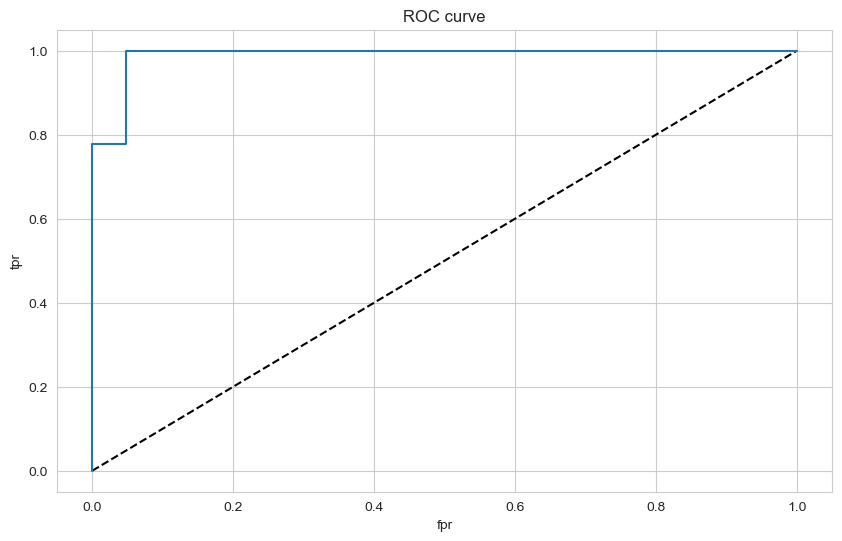

In [74]:
y_pred_proba = model.predict(X_test)
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
plt.plot([0,1],[0,1],'k--')
plt.plot(fpr,tpr, label='ANN')
plt.xlabel('fpr')
plt.ylabel('tpr')
plt.title('ROC curve')
plt.show()

In [75]:
roc_auc_score(y_test, y_pred_proba)

0.9894179894179893

### for gridsearchcv model

2/2 [==============================] - 0s 2ms/step


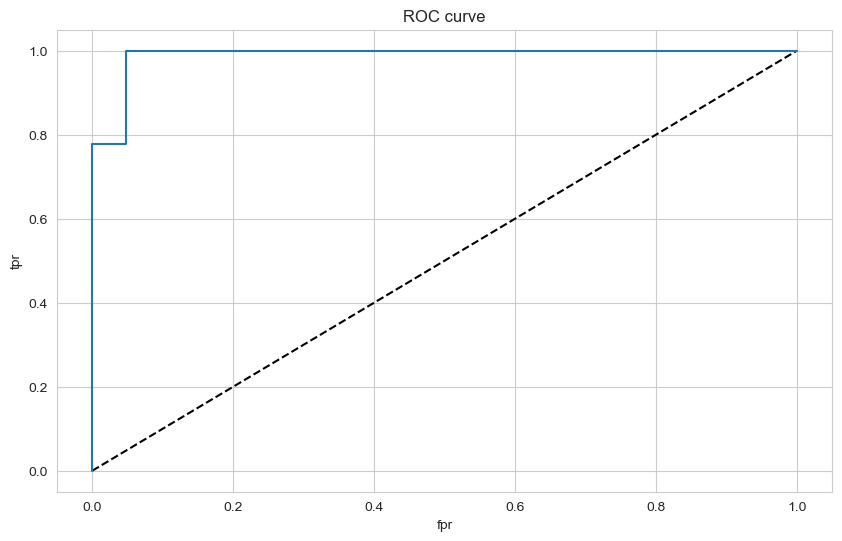

In [76]:
y_pred_proba = grid_model.predict_proba(X_test)[:,1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
plt.plot([0,1],[0,1],'k--')
plt.plot(fpr,tpr, label='ANN')
plt.xlabel('fpr')
plt.ylabel('tpr')
plt.title('ROC curve')
plt.show()

In [77]:
roc_auc_score(y_test, y_pred_proba)

0.9894179894179893

## Saving Final Model and Scaler

In [78]:
import pickle
pickle.dump(scaler, open("scaler_cancer", 'wb'))

In [79]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(36, activation = "relu", input_dim = X_train.shape[1]))
model.add(Dense(18, activation = "relu"))
model.add(Dense(9, activation = "relu"))
model.add(Dense(1, activation = "sigmoid"))

model.compile(optimizer = "adam", loss = "binary_crossentropy", metrics = ["accuracy"])

In [80]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "min", verbose = 1, patience = 15, restore_best_weights = True)

In [81]:
model.fit(x = X_train, y = y_train, validation_data = (X_test, y_test), batch_size = 32, epochs = 1000, verbose = 1,
          callbacks = [early_stop])

Epoch 1/1000
16/16 [==============================] - 0s 6ms/step - loss: 0.6777 - accuracy: 0.7480 - val_loss: 0.6615 - val_accuracy: 0.8772
Epoch 2/1000
16/16 [==============================] - 0s 2ms/step - loss: 0.6490 - accuracy: 0.8281 - val_loss: 0.6291 - val_accuracy: 0.9474
Epoch 3/1000
16/16 [==============================] - 0s 2ms/step - loss: 0.6122 - accuracy: 0.8809 - val_loss: 0.5865 - val_accuracy: 0.9649
Epoch 4/1000
16/16 [==============================] - 0s 2ms/step - loss: 0.5632 - accuracy: 0.8867 - val_loss: 0.5298 - val_accuracy: 0.9649
Epoch 5/1000
16/16 [==============================] - 0s 2ms/step - loss: 0.4993 - accuracy: 0.8867 - val_loss: 0.4559 - val_accuracy: 0.9825
Epoch 6/1000
16/16 [==============================] - 0s 2ms/step - loss: 0.4282 - accuracy: 0.8867 - val_loss: 0.3815 - val_accuracy: 0.9825
Epoch 7/1000
16/16 [==============================] - 0s 2ms/step - loss: 0.3606 - accuracy: 0.8965 - val_loss: 0.3147 - val_accuracy: 0.9649
Epoch 

<AxesSubplot:>

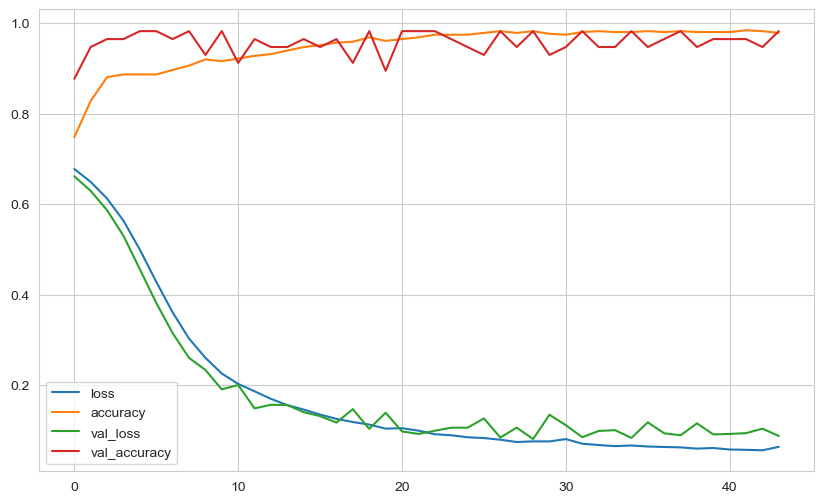

In [82]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [83]:
loss, accuracy = model.evaluate(X_test, y_test, verbose=0)
print("loss : ", loss)
print("accuracy : ", accuracy)

loss :  0.08040450513362885
accuracy :  0.9824561476707458


In [84]:
y_pred = model.predict(X_test) > 0.5
#y_pred = model.predict_classes(X_test) for tf 2.5.0
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

2/2 [==============================] - 0s 1ms/step
[[20  1]
 [ 0 36]]
              precision    recall  f1-score   support

           0       1.00      0.95      0.98        21
           1       0.97      1.00      0.99        36

    accuracy                           0.98        57
   macro avg       0.99      0.98      0.98        57
weighted avg       0.98      0.98      0.98        57



In [85]:
model.save('model_cancer.h5')

## Loading Model and Scaler

In [86]:
from tensorflow.keras.models import load_model

In [87]:
model_cancer = load_model('model_cancer.h5')
scaler_cancer = pickle.load(open("scaler_cancer", "rb"))

## Prediction

In [88]:
single_patient = df.drop('Cancer', axis = 1).iloc[0:1, :]
single_patient

,mean radius,mean texture,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,radius error,texture error,smoothness error,compactness error,concavity error,concave points error,symmetry error,fractal dimension error,worst radius,worst texture,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,17.990,10.380,0.118,0.278,0.300,0.147,0.242,0.079,1.095,0.905,0.006,0.049,0.054,0.016,0.030,0.006,25.380,17.330,0.162,0.666,0.712,0.265,0.460,0.119


In [89]:
single_patient = scaler_cancer.transform(single_patient)
single_patient

array([[0.52103744, 0.0226581 , 0.68000973, 0.7920373 , 0.70313964,
        0.73111332, 0.68636364, 0.60551811, 0.35614702, 0.12046941,
        0.15929565, 0.35139844, 0.13568182, 0.30062512, 0.31164518,
        0.18304244, 0.62077552, 0.14152452, 0.61828432, 0.61929156,
        0.56861022, 0.91202749, 0.59846245, 0.41886396]])

In [90]:
(model_cancer.predict(single_patient) > 0.5).astype("int32")
#model_cancer.predict_classes(single_patient)

1/1 [==============================] - 0s 33ms/step


array([[0]], dtype=int32)

In [91]:
df["Cancer"].iloc[0]

0

## Comparison with ML

### Logistic Regression

In [92]:
from sklearn.linear_model import LogisticRegression

In [93]:
log_model=LogisticRegression()
log_model.fit(X_train, y_train)
y_pred = log_model.predict(X_test)
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[20  1]
 [ 1 35]]
              precision    recall  f1-score   support

           0       0.95      0.95      0.95        21
           1       0.97      0.97      0.97        36

    accuracy                           0.96        57
   macro avg       0.96      0.96      0.96        57
weighted avg       0.96      0.96      0.96        57



### Random Forest

In [94]:
from sklearn.ensemble import RandomForestClassifier

In [95]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train, y_train)
y_pred = rf_model.predict(X_test)
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[20  1]
 [ 0 36]]
              precision    recall  f1-score   support

           0       1.00      0.95      0.98        21
           1       0.97      1.00      0.99        36

    accuracy                           0.98        57
   macro avg       0.99      0.98      0.98        57
weighted avg       0.98      0.98      0.98        57



___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___